각 클라이언트별 mlp 정확도 계산

📁 Colab 경로에서 A~D 엑셀 파일 로딩 중...
✅ A.xlsx found.
✅ B.xlsx found.
✅ C.xlsx found.
✅ D.xlsx found.

✅ 입력 특성 수: 16, 사용 디바이스: CPU

🔁 Training on Client A...
📊 Client [A] Accuracy: 0.7172

🔁 Training on Client B...
📊 Client [B] Accuracy: 0.7987

🔁 Training on Client C...
📊 Client [C] Accuracy: 0.7505

🔁 Training on Client D...
📊 Client [D] Accuracy: 0.7826

📈 Client별 정확도 비교:
 - Client A: 0.7172
 - Client B: 0.7987
 - Client C: 0.7505
 - Client D: 0.7826


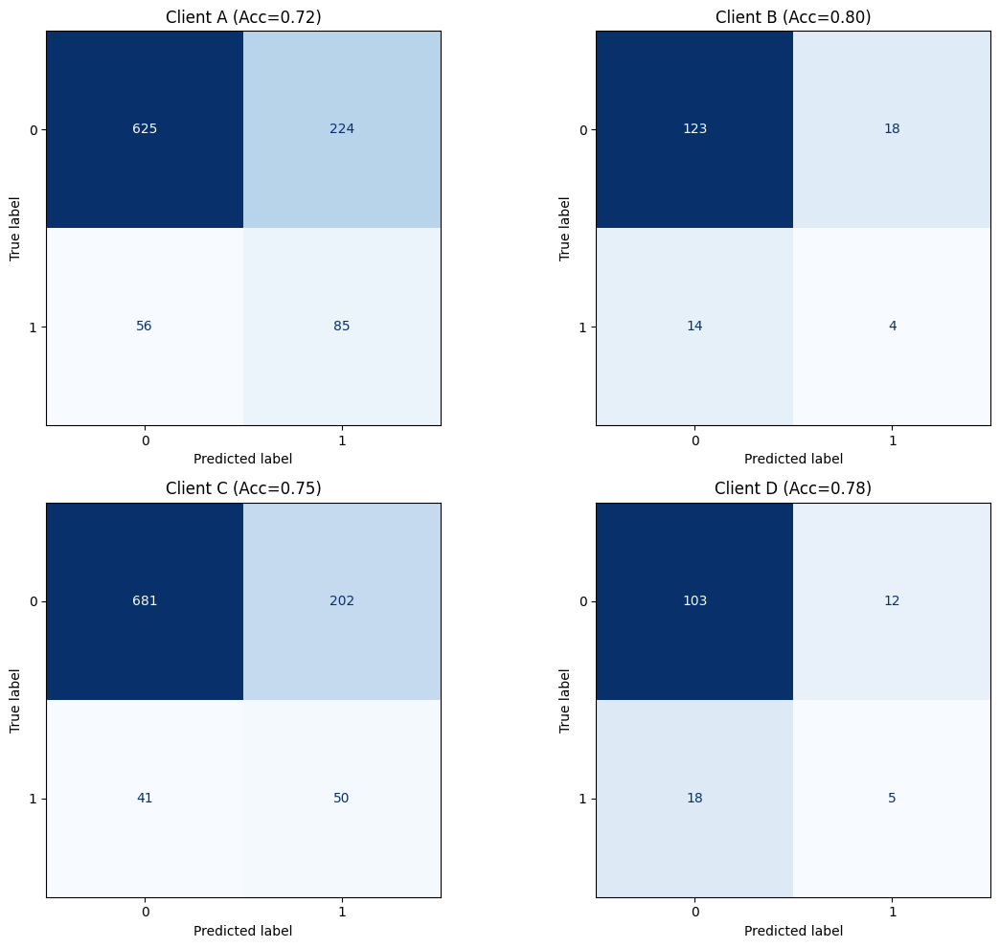


📄 Classification Report - Client A
              precision    recall  f1-score   support

           0     0.9178    0.7362    0.8170       849
           1     0.2751    0.6028    0.3778       141

    accuracy                         0.7172       990
   macro avg     0.5964    0.6695    0.5974       990
weighted avg     0.8262    0.7172    0.7544       990


📄 Classification Report - Client B
              precision    recall  f1-score   support

           0     0.8978    0.8723    0.8849       141
           1     0.1818    0.2222    0.2000        18

    accuracy                         0.7987       159
   macro avg     0.5398    0.5473    0.5424       159
weighted avg     0.8168    0.7987    0.8074       159


📄 Classification Report - Client C
              precision    recall  f1-score   support

           0     0.9432    0.7712    0.8486       883
           1     0.1984    0.5495    0.2915        91

    accuracy                         0.7505       974
   macro avg     0.5

In [ ]:
# ===============================================
# STEP 0) Colab 경로에서 파일 직접 로딩
# ===============================================
import os

print("📁 Colab 경로에서 A~D 엑셀 파일 로딩 중...")
paths = {
    "A": "/content/A.xlsx",
    "B": "/content/B.xlsx",
    "C": "/content/C.xlsx",
    "D": "/content/D.xlsx",
}

for cid, path in paths.items():
    if not os.path.exists(path):
        print(f"❌ {cid}.xlsx not found at {path}")
    else:
        print(f"✅ {cid}.xlsx found.")

# ===============================================
# STEP 1) 라이브러리 임포트
# ===============================================
import pandas as pd
import numpy as np
import torch
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset, random_split
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# ===============================================
# STEP 2) 데이터 전처리 함수
# ===============================================
DEFECT_LABELS = ['Short_Shot_1', 'Bubble_1', 'Exfoliation_1', 'Blow_Hole_1', 'Deformation_1']

def load_excel_binary(path: str):
    df = pd.read_excel(path).dropna(axis=1, how='all')
    for col in DEFECT_LABELS:
        if col not in df.columns:
            df[col] = 0
    y = df[DEFECT_LABELS].sum(axis=1).clip(upper=1).astype(int).values
    X = df.drop(columns=DEFECT_LABELS, errors='ignore')
    X = X.select_dtypes(include=[np.number]).replace([np.inf, -np.inf], np.nan).fillna(0.0)
    return X, y

def build_clients(paths):
    raw = {}
    for cid, path in paths.items():
        X, y = load_excel_binary(path)
        raw[cid] = {"X": X, "y": y}
    common_cols = set.intersection(*[set(v["X"].columns) for v in raw.values()])
    clients = {}
    for cid, v in raw.items():
        X = v["X"][list(common_cols)]
        mu, sigma = X.mean(), X.std().replace(0, 1)
        X = (X - mu) / sigma
        X_tensor = torch.tensor(X.values, dtype=torch.float32)
        y_tensor = torch.tensor(v["y"], dtype=torch.long)
        dataset = TensorDataset(X_tensor, y_tensor)
        n = len(dataset)
        train_size = int(0.7 * n)  # 🔧 7:3 비율
        test_size = n - train_size
        train_set, test_set = random_split(dataset, [train_size, test_size], generator=torch.Generator().manual_seed(42))
        clients[cid] = {"train": train_set, "test": test_set, "X": X_tensor, "y": y_tensor}
    return clients, list(common_cols)

# ===============================================
# STEP 3) MLP 모델 정의
# ===============================================
class MLP(nn.Module):
    def __init__(self, input_dim, hidden_dim=128, output_dim=2):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.BatchNorm1d(hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, output_dim)
        )
    def forward(self, x):
        return self.net(x)

# ===============================================
# STEP 4) FocalLoss 정의
# ===============================================
class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2.0, reduction='mean'):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        ce_loss = nn.functional.cross_entropy(inputs, targets, weight=self.alpha, reduction='none')
        pt = torch.exp(-ce_loss)
        focal_loss = ((1 - pt) ** self.gamma) * ce_loss
        return focal_loss.mean() if self.reduction == 'mean' else focal_loss.sum()

# ===============================================
# STEP 5) 학습 함수 (가중치 완화 + FocalLoss 유지)
# ===============================================
def train_model(model, train_set, device, epochs=15, lr=0.001):
    model = model.to(device)
    model.train()
    loader = DataLoader(train_set, batch_size=64, shuffle=True)

    class_weights = torch.tensor([1.0, 2.5], dtype=torch.float32).to(device)  # ✅ 완화된 가중치
    criterion = FocalLoss(alpha=class_weights)
    optimizer = optim.Adam(model.parameters(), lr=lr)

    for epoch in range(epochs):
        for X_batch, y_batch in loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            optimizer.zero_grad()
            out = model(X_batch)
            loss = criterion(out, y_batch)
            loss.backward()
            optimizer.step()
    return model

# ===============================================
# STEP 6) 학습 및 예측 (threshold = 0.5)
# ===============================================
clients, input_cols = build_clients(paths)
input_dim = len(input_cols)
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"\n✅ 입력 특성 수: {input_dim}, 사용 디바이스: {device.upper()}")

results = {}

for cid, data in clients.items():
    print(f"\n🔁 Training on Client {cid}...")
    model = MLP(input_dim=input_dim)
    model = train_model(model, data["train"], device, epochs=15)
    model.eval()

    loader = DataLoader(data["test"], batch_size=256)
    y_true, y_pred = [], []
    with torch.no_grad():
        for X_batch, y_batch in loader:
            X_batch = X_batch.to(device)
            probs = torch.softmax(model(X_batch), dim=1)[:, 1]
            preds = (probs > 0.5).int().cpu()  # ✅ 기본 threshold로 복원
            y_pred += preds.tolist()
            y_true += y_batch.tolist()

    acc = np.mean(np.array(y_true) == np.array(y_pred))
    results[cid] = {"acc": acc, "y_true": y_true, "y_pred": y_pred}
    print(f"📊 Client [{cid}] Accuracy: {acc:.4f}")

# ===============================================
# STEP 7) Confusion Matrix 시각화
# ===============================================
print("\n📈 Client별 정확도 비교:")
for cid, res in results.items():
    print(f" - Client {cid}: {res['acc']:.4f}")

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()
for i, cid in enumerate(results):
    cm = confusion_matrix(results[cid]["y_true"], results[cid]["y_pred"])
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(ax=axes[i], cmap="Blues", values_format="d", colorbar=False)
    axes[i].set_title(f"Client {cid} (Acc={results[cid]['acc']:.2f})")
plt.tight_layout()
plt.show()

# ===============================================
# STEP 8) Classification Report 출력
# ===============================================
for cid, res in results.items():
    print(f"\n📄 Classification Report - Client {cid}")
    print(classification_report(res["y_true"], res["y_pred"], digits=4))


각 라운드 별 글로벌 정확도 및 MLP모델 정확도 구현

In [ ]:
import os, math, copy, random, argparse
import pandas as pd
import numpy as np
import torch
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset, random_split
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

# -----------------------------
# 0) 결함 라벨 정의 및 데이터 로드
# -----------------------------
DEFECT_LABELS = ['Short_Shot_1','Bubble_1','Exfoliation_1','Blow_Hole_1','Deformation_1']

def load_excel_binary(path: str):
    df = pd.read_excel(path).dropna(axis=1, how='all')
    for col in DEFECT_LABELS:
        if col not in df.columns:
            df[col] = 0
    y = df[DEFECT_LABELS].sum(axis=1).clip(upper=1).astype(int).values
    X = df.drop(columns=DEFECT_LABELS, errors='ignore')
    X = X.select_dtypes(include=[np.number]).replace([np.inf, -np.inf], np.nan).fillna(0.0)
    return X, y

def build_clients(path_map):
    raw = {}
    for cid, path in path_map.items():
        X, y = load_excel_binary(path)
        raw[cid] = {"X": X, "y": y}
    cols = set.intersection(*[set(v["X"].columns) for v in raw.values()])
    clients, metas = {}, {}
    for cid, v in raw.items():
        feat = v["X"][list(cols)].copy()
        mu, sigma = feat.mean(), feat.std().replace(0, 1)
        feat = (feat - mu) / sigma
        X = torch.tensor(feat.values.astype(np.float32))
        y = torch.tensor(v["y"], dtype=torch.long)
        allset = TensorDataset(X, y)
        n = len(allset)
        n_train = int(0.7 * n)
        n_test = n - n_train
        tr, te = random_split(allset, [n_train, n_test], generator=torch.Generator().manual_seed(42))
        clients[cid] = {"train": tr, "test": te, "all": allset}
        metas[cid] = {"n_samples": len(y), "class_counts": pd.Series(v["y"]).value_counts().to_dict()}
    return clients, metas, list(cols)

class DeepMLP(nn.Module):
    def __init__(self, input_dim, num_classes=2):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, num_classes)
        )
    def forward(self, x):
        return self.net(x)

def compute_ci(class_counts, eps_frac=0.05, min_samples=1):
    K = len(class_counts)
    total = sum(class_counts.values())
    if K == 0 or total == 0:
        return 1e-8
    H = -sum((c / total) * math.log(c / total) for c in class_counts.values() if c > 0)
    logK = math.log(K + 1e-12)
    H_tilde = max(H, eps_frac * logK)
    k_i = sum(1 for c in class_counts.values() if c >= min_samples)
    return max(1e-8, (k_i / K) * (H_tilde / logK))

def aggregate_with_softmax_weights(state_dicts, alpha_components, rho=0.5, beta=1.0, theta=1.0):
    if not state_dicts: return None
    logits = {
        cid: math.log(comp["n_i"] ** rho + 1e-12)
           + math.log(comp["c_i"] ** beta + 1e-12)
           + math.log(comp["t_i"] ** theta + 1e-12)
        for cid, comp in alpha_components.items()
    }
    max_logit = max(logits.values())
    exp_logits = {cid: math.exp(v - max_logit) for cid, v in logits.items()}
    total_exp = sum(exp_logits.values())
    alphas = {cid: v / total_exp for cid, v in exp_logits.items()}
    global_sd = None
    for cid, sd in state_dicts.items():
        w = alphas[cid]
        if global_sd is None:
            global_sd = {k: v.clone() * w for k, v in sd.items()}
        else:
            for k in global_sd:
                global_sd[k] += sd[k] * w
    return global_sd

def local_train_fedprox(model, dataset, lr, epochs, device, class_counts, mu, global_weights):
    model = copy.deepcopy(model).to(device)
    model.train()
    total = sum(class_counts.values())
    w_0 = total / (2 * class_counts.get(0, 1))
    w_1 = total / (2 * class_counts.get(1, 1))
    class_weights = torch.tensor([w_0, w_1], dtype=torch.float32).to(device)
    crit = nn.CrossEntropyLoss(weight=class_weights)
    opt = optim.Adam(model.parameters(), lr=lr)
    loader = DataLoader(dataset, batch_size=64, shuffle=True)

    for _ in range(epochs):
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            opt.zero_grad()
            output = model(x)
            loss = crit(output, y)
            prox_term = 0.0
            for name, param in model.named_parameters():
                prox_term += ((param - global_weights[name].to(device))**2).sum()
            loss += (mu / 2) * prox_term
            loss.backward()
            opt.step()

    return model.state_dict()

def evaluate(model, dataset, device, return_preds=False):
    model.eval()
    loader = DataLoader(dataset, batch_size=256)
    correct, total = 0, 0
    y_true, y_pred = [], []
    with torch.no_grad():
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            pred = model(x).argmax(1)
            correct += pred.eq(y).sum().item()
            total += len(y)
            if return_preds:
                y_true += y.cpu().tolist()
                y_pred += pred.cpu().tolist()
    acc = correct / total if total > 0 else 0.0
    return (acc, y_true, y_pred) if return_preds else acc

# ---------------------- MAIN LOOP ----------------------
if __name__ == "__main__":
    parser = argparse.ArgumentParser()
    parser.add_argument("--rounds", type=int, default=50)
    args, _ = parser.parse_known_args()

    paths = {"A": "A.xlsx", "B": "B.xlsx", "C": "C.xlsx", "D": "D.xlsx"}
    clients, metas, cols = build_clients(paths)
    device = "cuda" if torch.cuda.is_available() else "cpu"
    input_dim = clients["A"]["all"].tensors[0].shape[1]
    global_model = DeepMLP(input_dim=input_dim).to(device)
    participation_probs = {"A": 0.9, "D": 0.7, "B": 0.4, "C": 0.4}
    last_round = {cid: None for cid in clients}
    participation_log = {cid: 0 for cid in clients}
    combined_test = torch.utils.data.ConcatDataset([v["test"] for v in clients.values()])
    prev_global = copy.deepcopy(global_model.state_dict())
    round_log = {"round": [], "acc": [], "dW": []}

    for rnd in range(1, args.rounds + 1):
        print(f"\n=== Round {rnd} ===")
        selected = [cid for cid in clients if random.random() < participation_probs[cid]]
        if len(selected) == 0:
            selected = [random.choice(list(clients.keys()))]
        for cid in selected:
            participation_log[cid] += 1

        state_dicts, alpha_components = {}, {}
        before_acc = evaluate(global_model, combined_test, device)
        for cid in selected:
            ds = clients[cid]["train"]
            labels = [int(y) for _, y in ds]
            class_counts = pd.Series(labels).value_counts().to_dict()
            state_dict = local_train_fedprox(global_model, ds, lr=0.001, epochs=5,
                                             device=device, class_counts=class_counts,
                                             mu=0.01, global_weights=global_model.state_dict())
            state_dicts[cid] = state_dict
            n_i = math.sqrt(metas[cid]["n_samples"])
            c_i = compute_ci(class_counts)
            t_i = participation_probs[cid]
            alpha_components[cid] = {"n_i": n_i, "c_i": c_i, "t_i": t_i}
            last_round[cid] = rnd

        new_global = aggregate_with_softmax_weights(state_dicts, alpha_components)
        if new_global is None:
            continue
        global_model.load_state_dict(new_global)
        after_acc, y_true, y_pred = evaluate(global_model, combined_test, device, return_preds=True)

        # ✅ 추가: 각 클라이언트에 대한 정확도 출력
        print(f"\n▶ Per-Client Accuracy (Round {rnd}):")
        for cid in clients:
            acc = evaluate(global_model, clients[cid]["test"], device)
            print(f" - Client {cid}: {acc:.4f}")

        dW = np.mean([
            torch.norm(global_model.state_dict()[k] - prev_global[k]).item()
            for k in global_model.state_dict()
            if global_model.state_dict()[k].dtype in (torch.float32, torch.float64)
        ])
        prev_global = copy.deepcopy(global_model.state_dict())

        print(f"[Round {rnd}] Global Accuracy: {before_acc:.4f} → {after_acc:.4f} | ΔW={dW:.4f}")
        round_log["round"].append(rnd)
        round_log["acc"].append(after_acc)
        round_log["dW"].append(dW)

        df = pd.DataFrame(alpha_components).T.round(4)
        print("\nαᵢ 구성요소:")
        print(df)
        plt.figure(figsize=(6, 4))
        np.log10(df + 1e-8).plot(kind="bar")
        plt.title(f"αᵢ components (Round {rnd})")
        plt.tight_layout()
        plt.show()

        for cid in selected:
            _, yt, yp = evaluate(global_model, clients[cid]["test"], device, return_preds=True)
            cm = confusion_matrix(yt, yp)
            ConfusionMatrixDisplay(confusion_matrix=cm).plot(cmap="Blues")
            plt.title(f"Client {cid} - Confusion Matrix (Round {rnd})")
            plt.show()
            print(f"\n[Client {cid}] Classification Report:")
            print(classification_report(yt, yp, digits=4))

    # ---------------------- Plotting ----------------------
    plt.plot(round_log["round"], round_log["acc"], marker="o", label="Accuracy")
    plt.xlabel("Round")
    plt.ylabel("Accuracy")
    plt.title("Global Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()

    plt.plot(round_log["round"], round_log["dW"], marker="o", color="orange", label="ΔW")
    plt.xlabel("Round")
    plt.ylabel("ΔW (Parameter Shift)")
    plt.title("Model Shift")
    plt.grid(True)
    plt.legend()
    plt.show()

    plt.bar(participation_log.keys(), participation_log.values())
    plt.title("Client Participation Frequency")
    plt.show()

#실험(1)
SMOTE를 적용한 클라이언트는 tᵢ를 1로 고정하거나,
🔁 오버샘플링 전 nᵢ, tᵢ, cᵢ만 측정하여 적용하는 방식이 균형을 유지


=== Round 1 ===
[Round 1] Global Accuracy: 0.1168 → 0.5209 | ΔW=1.6331

αᵢ 구성요소:
       n_i     c_i  t_i
A  57.4456  0.5876  1.0
D  21.4476  0.5202  1.0


<Figure size 600x400 with 0 Axes>

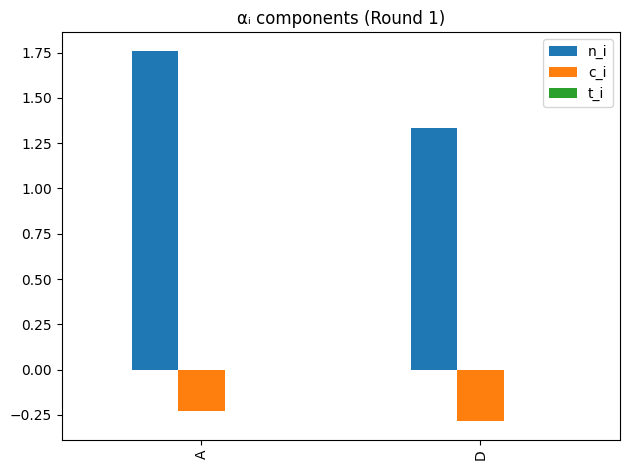

[Client A] Train Acc: 0.5500 | Test Acc: 0.5515


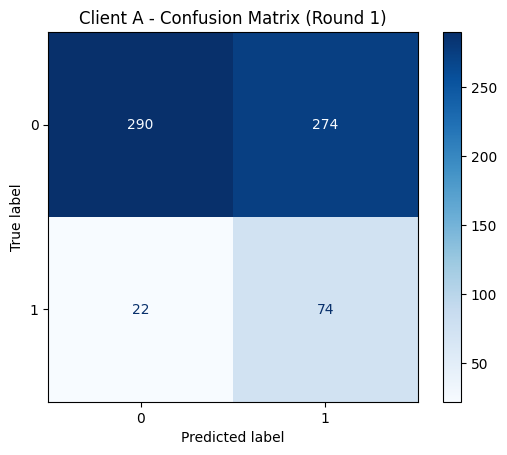

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9295    0.5142    0.6621       564
           1     0.2126    0.7708    0.3333        96

    accuracy                         0.5515       660
   macro avg     0.5711    0.6425    0.4977       660
weighted avg     0.8252    0.5515    0.6143       660

[Client D] Train Acc: 0.5571 | Test Acc: 0.5652


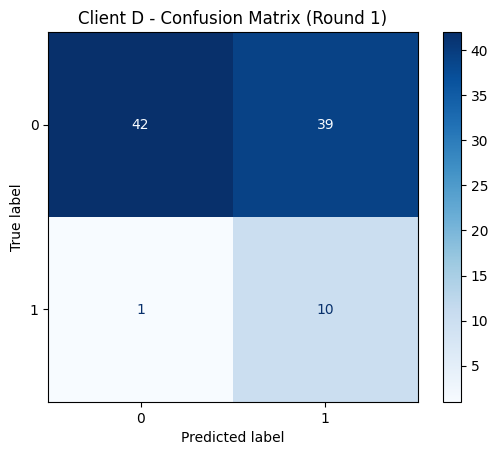

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9767    0.5185    0.6774        81
           1     0.2041    0.9091    0.3333        11

    accuracy                         0.5652        92
   macro avg     0.5904    0.7138    0.5054        92
weighted avg     0.8844    0.5652    0.6363        92


=== Round 2 ===
[Round 2] Global Accuracy: 0.5209 → 0.5242 | ΔW=0.3152

αᵢ 구성요소:
       n_i     c_i  t_i
A  57.4456  0.5876  2.0
B  23.0217  0.4881  1.0
C  56.9649  0.4840  1.0
D  21.4476  0.5202  1.0


<Figure size 600x400 with 0 Axes>

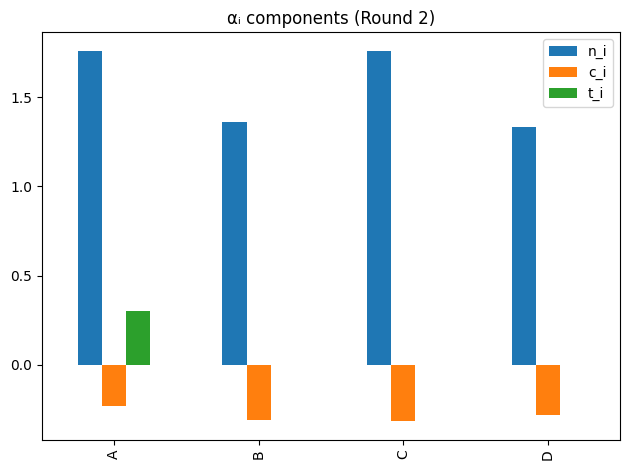

[Client A] Train Acc: 0.5515 | Test Acc: 0.5500


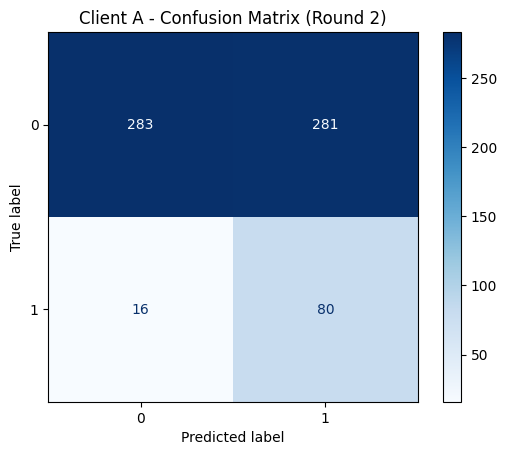

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9465    0.5018    0.6559       564
           1     0.2216    0.8333    0.3501        96

    accuracy                         0.5500       660
   macro avg     0.5840    0.6676    0.5030       660
weighted avg     0.8411    0.5500    0.6114       660

[Client B] Train Acc: 0.5448 | Test Acc: 0.5189


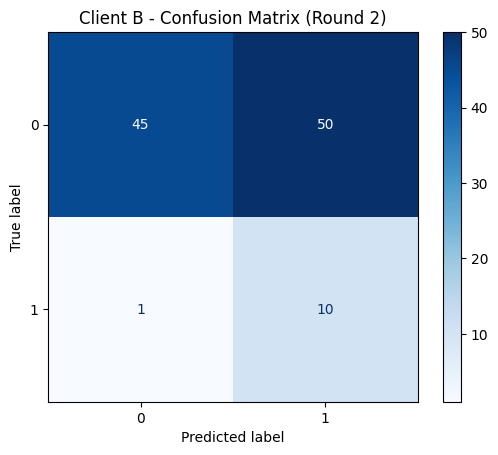

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9783    0.4737    0.6383        95
           1     0.1667    0.9091    0.2817        11

    accuracy                         0.5189       106
   macro avg     0.5725    0.6914    0.4600       106
weighted avg     0.8940    0.5189    0.6013       106

[Client C] Train Acc: 0.5123 | Test Acc: 0.4900


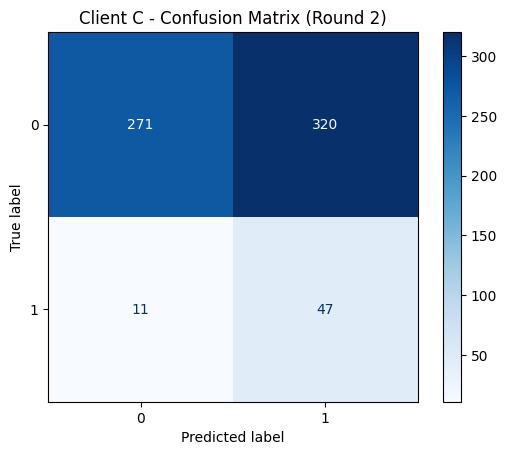

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9610    0.4585    0.6208       591
           1     0.1281    0.8103    0.2212        58

    accuracy                         0.4900       649
   macro avg     0.5445    0.6344    0.4210       649
weighted avg     0.8866    0.4900    0.5851       649

[Client D] Train Acc: 0.5625 | Test Acc: 0.5870


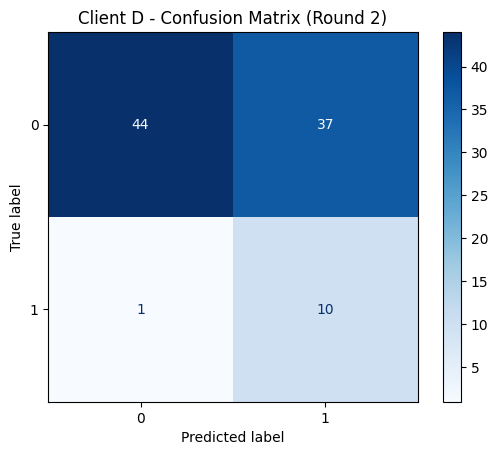

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9778    0.5432    0.6984        81
           1     0.2128    0.9091    0.3448        11

    accuracy                         0.5870        92
   macro avg     0.5953    0.7262    0.5216        92
weighted avg     0.8863    0.5870    0.6561        92


=== Round 3 ===
[Round 3] Global Accuracy: 0.5242 → 0.5269 | ΔW=0.2396

αᵢ 구성요소:
       n_i     c_i  t_i
B  23.0217  0.4881  1.0
C  56.9649  0.4840  1.0
D  21.4476  0.5202  1.0


<Figure size 600x400 with 0 Axes>

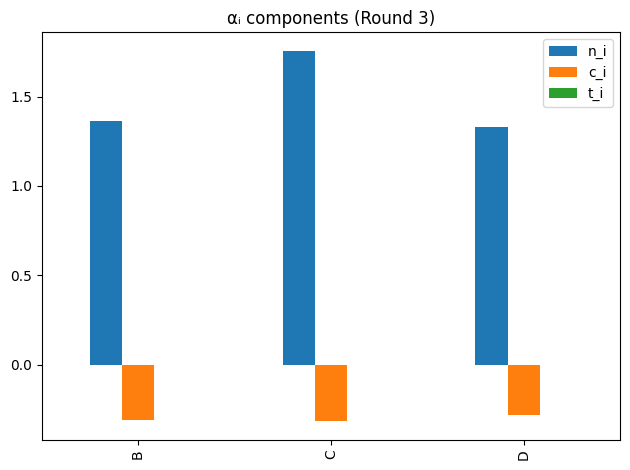

[Client B] Train Acc: 0.5542 | Test Acc: 0.5094


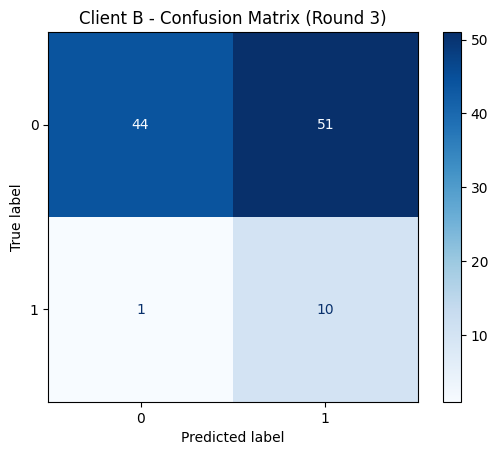

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9778    0.4632    0.6286        95
           1     0.1639    0.9091    0.2778        11

    accuracy                         0.5094       106
   macro avg     0.5709    0.6861    0.4532       106
weighted avg     0.8933    0.5094    0.5922       106

[Client C] Train Acc: 0.5135 | Test Acc: 0.5023


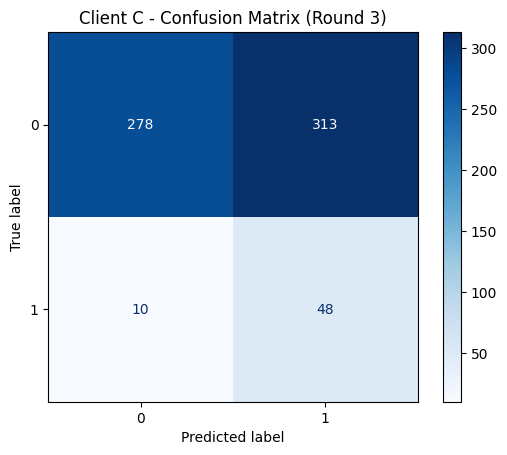

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9653    0.4704    0.6325       591
           1     0.1330    0.8276    0.2291        58

    accuracy                         0.5023       649
   macro avg     0.5491    0.6490    0.4308       649
weighted avg     0.8909    0.5023    0.5965       649

[Client D] Train Acc: 0.5598 | Test Acc: 0.5978


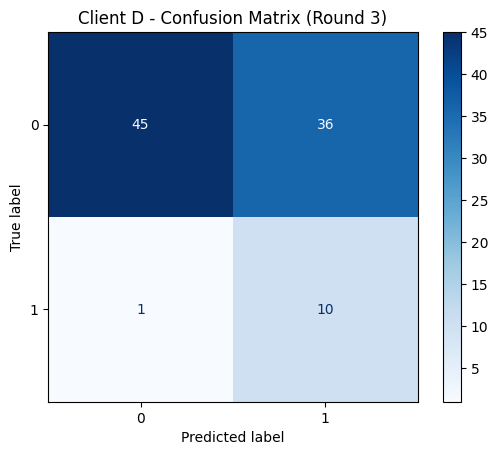

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9783    0.5556    0.7087        81
           1     0.2174    0.9091    0.3509        11

    accuracy                         0.5978        92
   macro avg     0.5978    0.7323    0.5298        92
weighted avg     0.8873    0.5978    0.6659        92


=== Round 4 ===
[Round 4] Global Accuracy: 0.5269 → 0.5700 | ΔW=0.3628

αᵢ 구성요소:
       n_i     c_i  t_i
A  57.4456  0.5876  3.0
B  23.0217  0.4881  1.0
C  56.9649  0.4840  1.0


<Figure size 600x400 with 0 Axes>

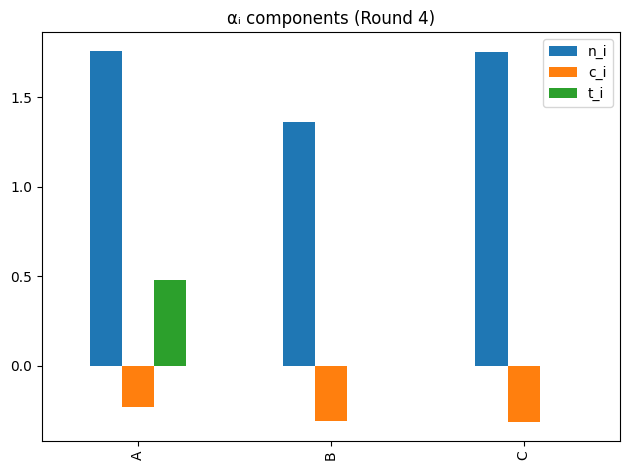

[Client A] Train Acc: 0.5973 | Test Acc: 0.5879


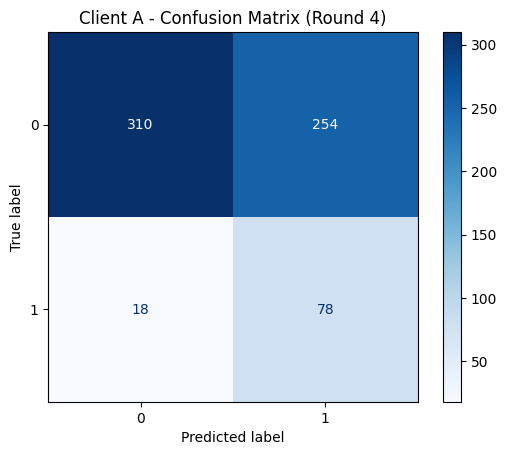

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9451    0.5496    0.6951       564
           1     0.2349    0.8125    0.3645        96

    accuracy                         0.5879       660
   macro avg     0.5900    0.6811    0.5298       660
weighted avg     0.8418    0.5879    0.6470       660

[Client B] Train Acc: 0.6156 | Test Acc: 0.5660


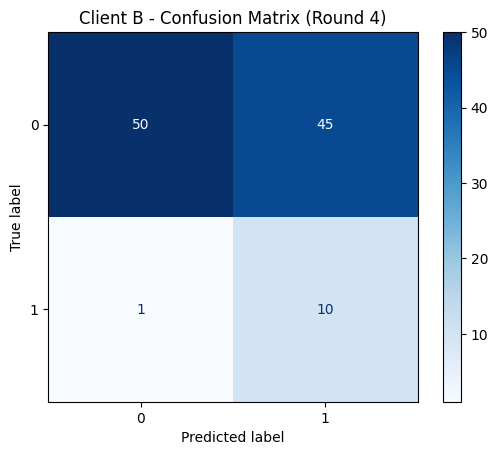

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9804    0.5263    0.6849        95
           1     0.1818    0.9091    0.3030        11

    accuracy                         0.5660       106
   macro avg     0.5811    0.7177    0.4940       106
weighted avg     0.8975    0.5660    0.6453       106

[Client C] Train Acc: 0.5570 | Test Acc: 0.5455


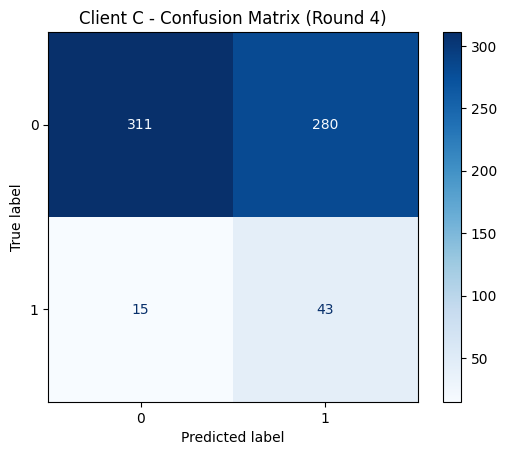

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9540    0.5262    0.6783       591
           1     0.1331    0.7414    0.2257        58

    accuracy                         0.5455       649
   macro avg     0.5436    0.6338    0.4520       649
weighted avg     0.8806    0.5455    0.6379       649


=== Round 5 ===
[Round 5] Global Accuracy: 0.5700 → 0.5866 | ΔW=0.2810

αᵢ 구성요소:
       n_i     c_i  t_i
D  21.4476  0.5202  1.0


<Figure size 600x400 with 0 Axes>

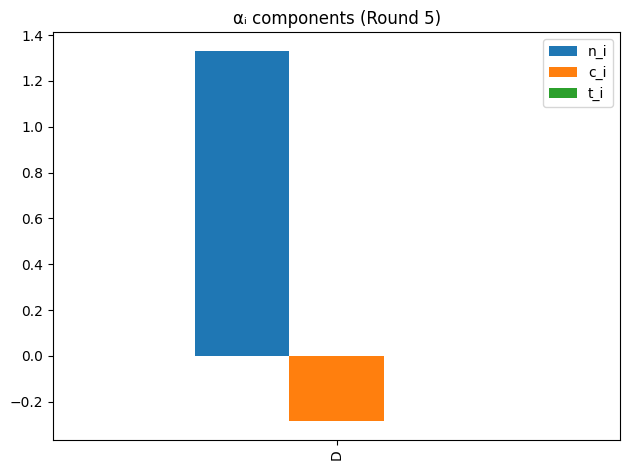

[Client D] Train Acc: 0.6196 | Test Acc: 0.6630


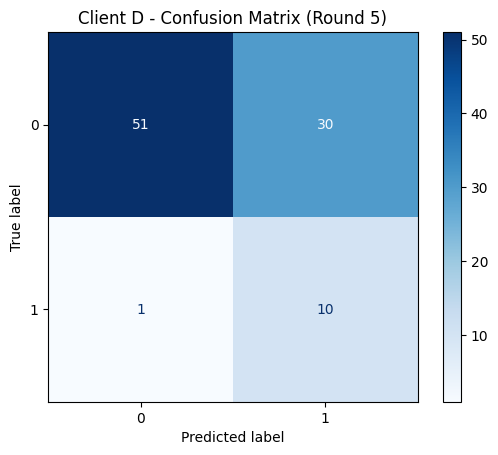

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9808    0.6296    0.7669        81
           1     0.2500    0.9091    0.3922        11

    accuracy                         0.6630        92
   macro avg     0.6154    0.7694    0.5795        92
weighted avg     0.8934    0.6630    0.7221        92


=== Round 6 ===
[Round 6] Global Accuracy: 0.5866 → 0.5468 | ΔW=0.3746

αᵢ 구성요소:
       n_i     c_i  t_i
A  57.4456  0.5876  4.0
B  23.0217  0.4881  1.0
D  21.4476  0.5202  1.0


<Figure size 600x400 with 0 Axes>

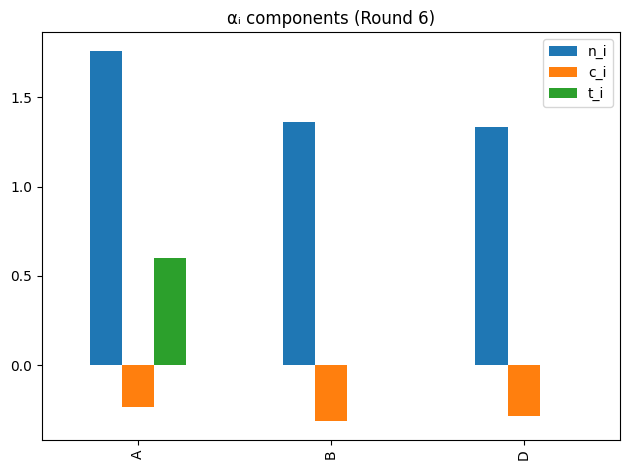

[Client A] Train Acc: 0.5792 | Test Acc: 0.5636


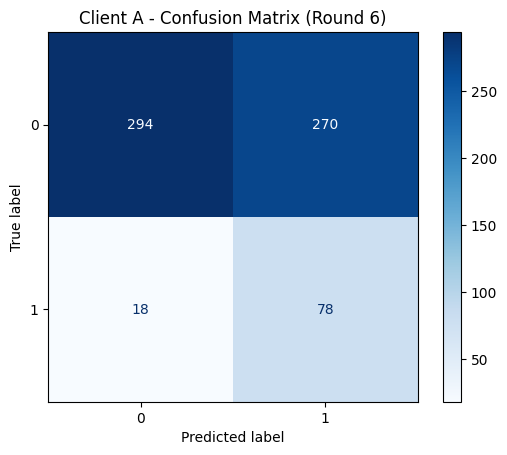

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9423    0.5213    0.6712       564
           1     0.2241    0.8125    0.3514        96

    accuracy                         0.5636       660
   macro avg     0.5832    0.6669    0.5113       660
weighted avg     0.8378    0.5636    0.6247       660

[Client B] Train Acc: 0.5566 | Test Acc: 0.5755


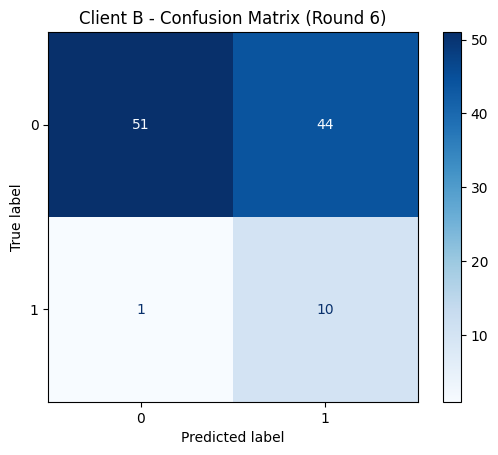

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9808    0.5368    0.6939        95
           1     0.1852    0.9091    0.3077        11

    accuracy                         0.5755       106
   macro avg     0.5830    0.7230    0.5008       106
weighted avg     0.8982    0.5755    0.6538       106

[Client D] Train Acc: 0.5679 | Test Acc: 0.6087


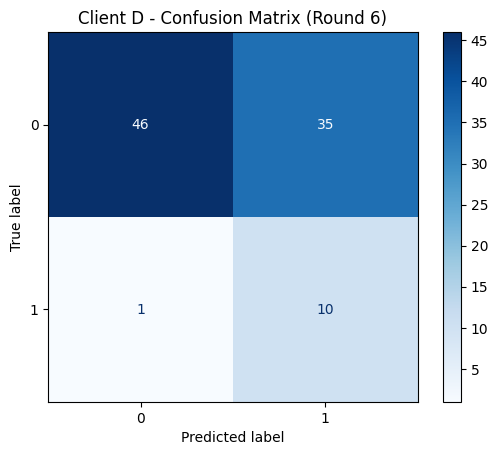

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9787    0.5679    0.7188        81
           1     0.2222    0.9091    0.3571        11

    accuracy                         0.6087        92
   macro avg     0.6005    0.7385    0.5379        92
weighted avg     0.8883    0.6087    0.6755        92


=== Round 7 ===
[Round 7] Global Accuracy: 0.5468 → 0.5912 | ΔW=0.2114

αᵢ 구성요소:
       n_i     c_i  t_i
B  23.0217  0.4881  1.0
D  21.4476  0.5202  1.0


<Figure size 600x400 with 0 Axes>

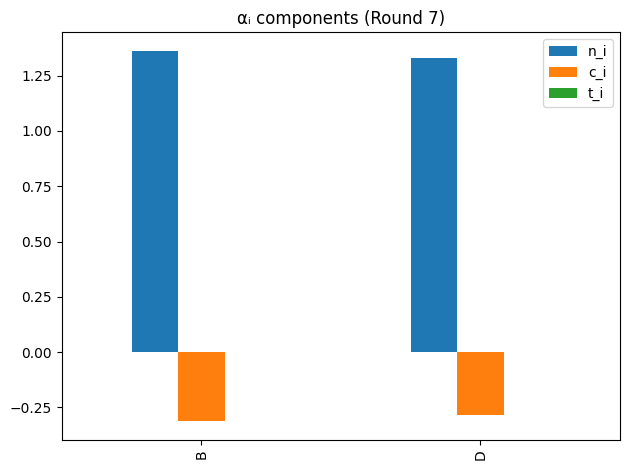

[Client B] Train Acc: 0.6392 | Test Acc: 0.6321


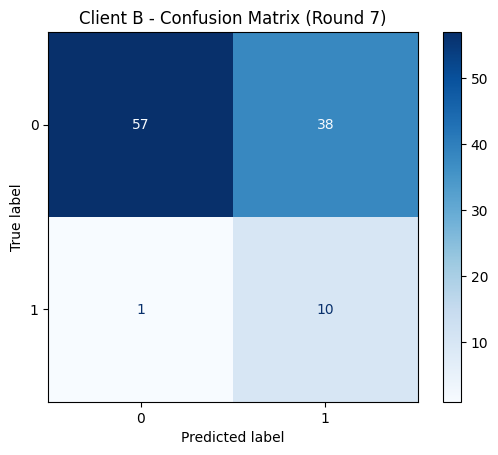

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9828    0.6000    0.7451        95
           1     0.2083    0.9091    0.3390        11

    accuracy                         0.6321       106
   macro avg     0.5955    0.7545    0.5420       106
weighted avg     0.9024    0.6321    0.7030       106

[Client D] Train Acc: 0.6141 | Test Acc: 0.6739


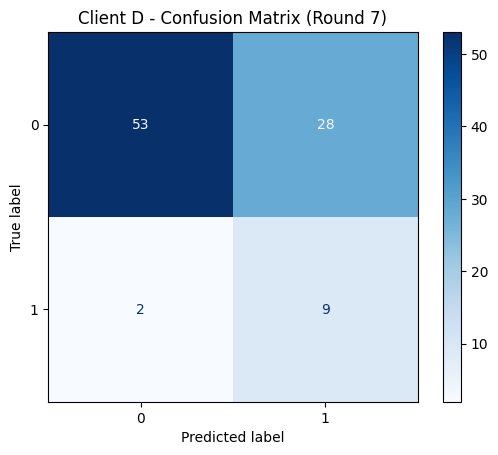

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9636    0.6543    0.7794        81
           1     0.2432    0.8182    0.3750        11

    accuracy                         0.6739        92
   macro avg     0.6034    0.7363    0.5772        92
weighted avg     0.8775    0.6739    0.7311        92


=== Round 8 ===
[Round 8] Global Accuracy: 0.5912 → 0.5932 | ΔW=0.3792

αᵢ 구성요소:
       n_i     c_i  t_i
A  57.4456  0.5876  5.0
B  23.0217  0.4881  1.0
D  21.4476  0.5202  1.0


<Figure size 600x400 with 0 Axes>

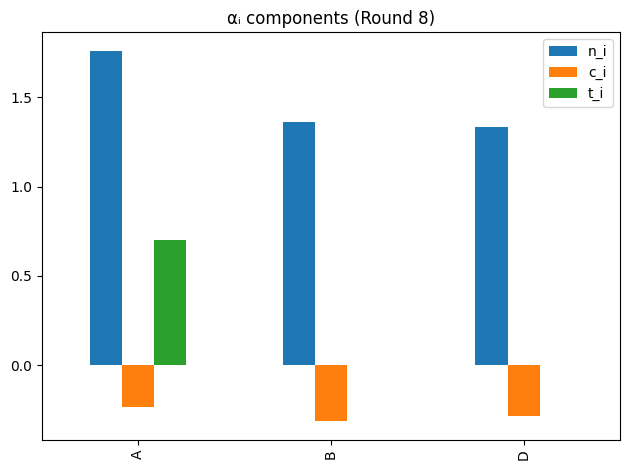

[Client A] Train Acc: 0.6136 | Test Acc: 0.6167


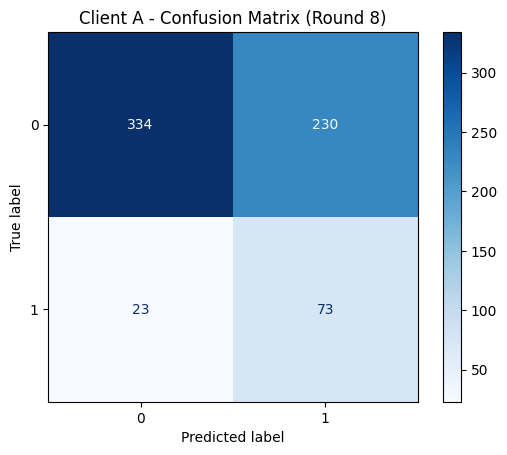

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9356    0.5922    0.7253       564
           1     0.2409    0.7604    0.3659        96

    accuracy                         0.6167       660
   macro avg     0.5882    0.6763    0.5456       660
weighted avg     0.8345    0.6167    0.6730       660

[Client B] Train Acc: 0.6132 | Test Acc: 0.6132


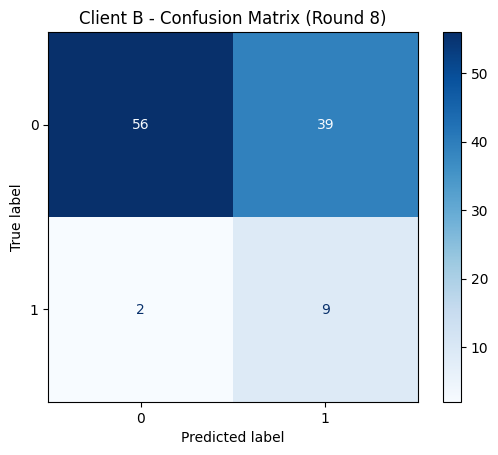

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9655    0.5895    0.7320        95
           1     0.1875    0.8182    0.3051        11

    accuracy                         0.6132       106
   macro avg     0.5765    0.7038    0.5186       106
weighted avg     0.8848    0.6132    0.6877       106

[Client D] Train Acc: 0.5951 | Test Acc: 0.6196


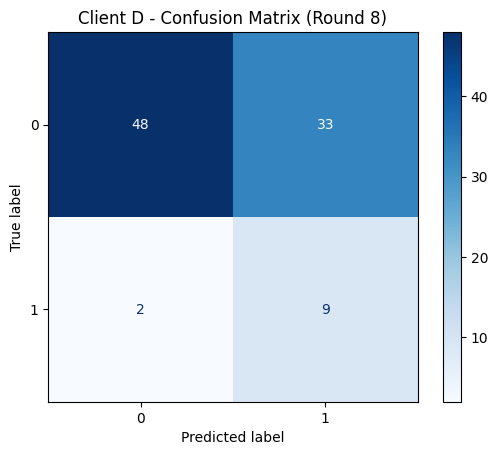

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9600    0.5926    0.7328        81
           1     0.2143    0.8182    0.3396        11

    accuracy                         0.6196        92
   macro avg     0.5871    0.7054    0.5362        92
weighted avg     0.8708    0.6196    0.6858        92


=== Round 9 ===
[Round 9] Global Accuracy: 0.5932 → 0.6191 | ΔW=0.3637

αᵢ 구성요소:
       n_i     c_i  t_i
A  57.4456  0.5876  6.0
D  21.4476  0.5202  1.0


<Figure size 600x400 with 0 Axes>

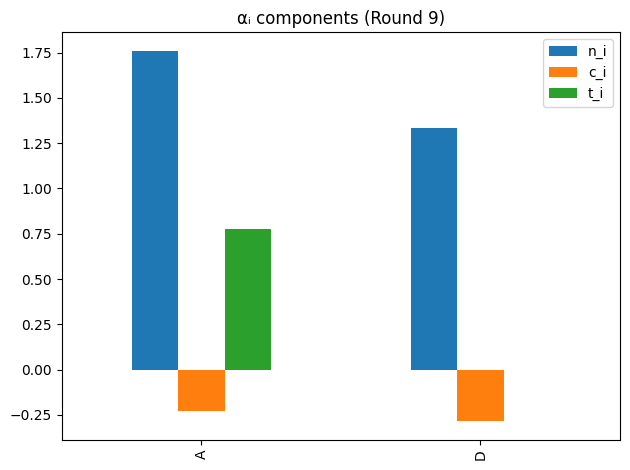

[Client A] Train Acc: 0.6557 | Test Acc: 0.6303


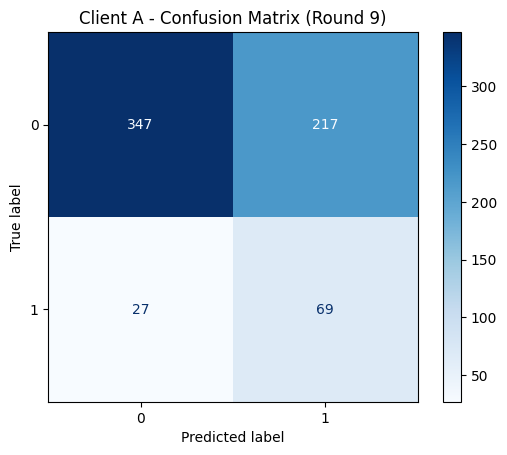

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9278    0.6152    0.7399       564
           1     0.2413    0.7188    0.3613        96

    accuracy                         0.6303       660
   macro avg     0.5845    0.6670    0.5506       660
weighted avg     0.8279    0.6303    0.6848       660

[Client D] Train Acc: 0.6196 | Test Acc: 0.6196


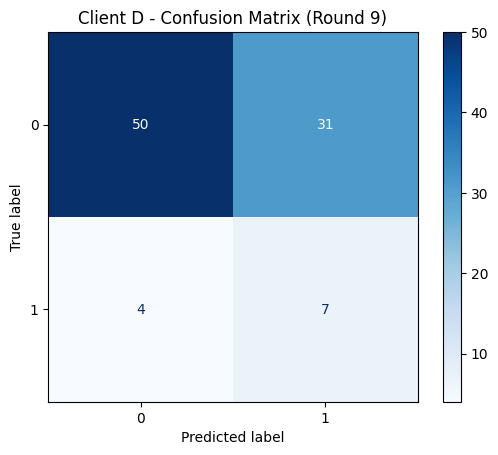

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9259    0.6173    0.7407        81
           1     0.1842    0.6364    0.2857        11

    accuracy                         0.6196        92
   macro avg     0.5551    0.6268    0.5132        92
weighted avg     0.8372    0.6196    0.6863        92


=== Round 10 ===
[Round 10] Global Accuracy: 0.6191 → 0.6596 | ΔW=0.3691

αᵢ 구성요소:
       n_i     c_i  t_i
A  57.4456  0.5876  7.0


<Figure size 600x400 with 0 Axes>

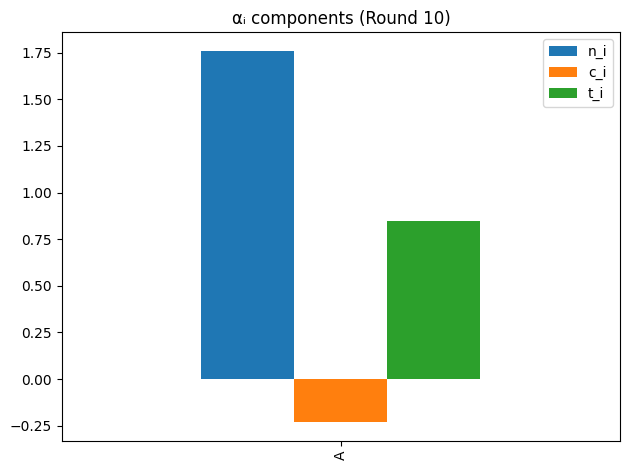

[Client A] Train Acc: 0.6799 | Test Acc: 0.6803


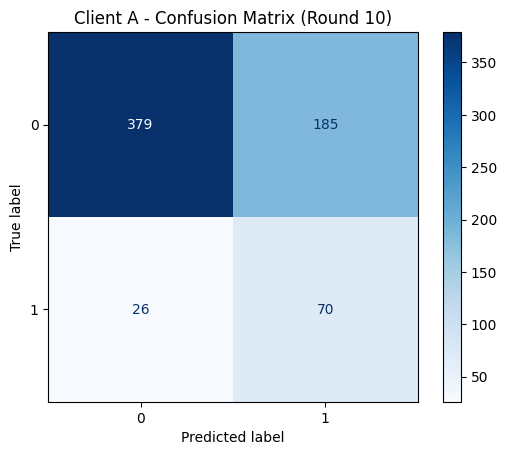

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9358    0.6720    0.7822       564
           1     0.2745    0.7292    0.3989        96

    accuracy                         0.6803       660
   macro avg     0.6052    0.7006    0.5906       660
weighted avg     0.8396    0.6803    0.7265       660


=== Round 11 ===
[Round 11] Global Accuracy: 0.6596 → 0.6271 | ΔW=0.4099

αᵢ 구성요소:
       n_i     c_i  t_i
A  57.4456  0.5876  8.0
D  21.4476  0.5202  1.0


<Figure size 600x400 with 0 Axes>

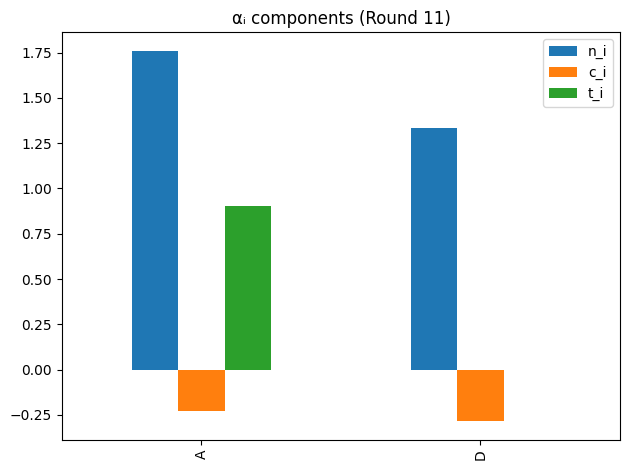

[Client A] Train Acc: 0.6523 | Test Acc: 0.6409


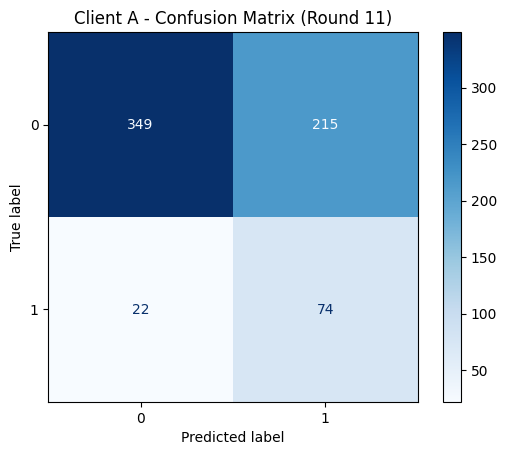

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9407    0.6188    0.7465       564
           1     0.2561    0.7708    0.3844        96

    accuracy                         0.6409       660
   macro avg     0.5984    0.6948    0.5655       660
weighted avg     0.8411    0.6409    0.6939       660

[Client D] Train Acc: 0.6223 | Test Acc: 0.6413


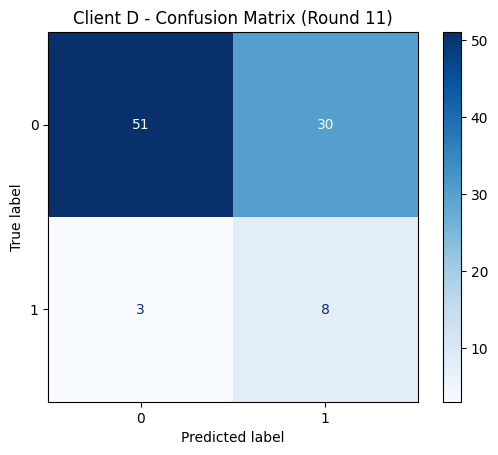

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9444    0.6296    0.7556        81
           1     0.2105    0.7273    0.3265        11

    accuracy                         0.6413        92
   macro avg     0.5775    0.6785    0.5410        92
weighted avg     0.8567    0.6413    0.7043        92


=== Round 12 ===
[Round 12] Global Accuracy: 0.6271 → 0.6357 | ΔW=0.4361

αᵢ 구성요소:
       n_i     c_i  t_i
A  57.4456  0.5876  9.0
C  56.9649  0.4840  1.0


<Figure size 600x400 with 0 Axes>

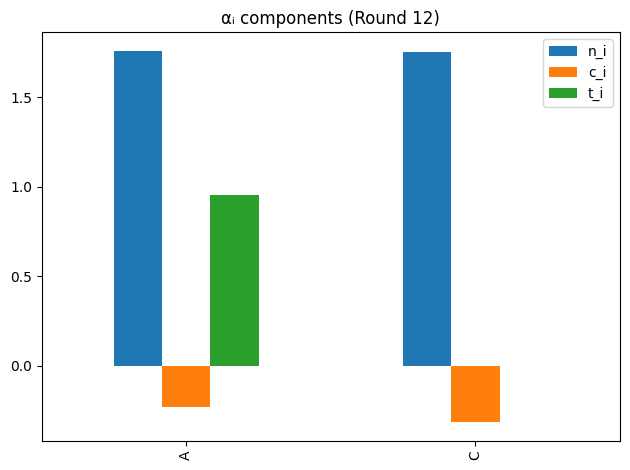

[Client A] Train Acc: 0.6644 | Test Acc: 0.6439


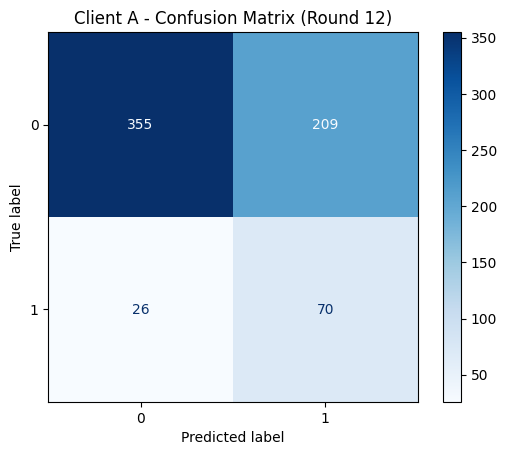

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9318    0.6294    0.7513       564
           1     0.2509    0.7292    0.3733        96

    accuracy                         0.6439       660
   macro avg     0.5913    0.6793    0.5623       660
weighted avg     0.8327    0.6439    0.6963       660

[Client C] Train Acc: 0.6148 | Test Acc: 0.6225


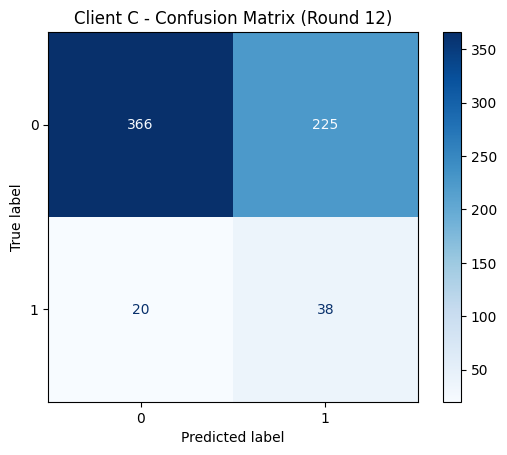

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9482    0.6193    0.7492       591
           1     0.1445    0.6552    0.2368        58

    accuracy                         0.6225       649
   macro avg     0.5463    0.6372    0.4930       649
weighted avg     0.8764    0.6225    0.7034       649


=== Round 13 ===
[Round 13] Global Accuracy: 0.6357 → 0.6125 | ΔW=0.3438

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  10.0
B  23.0217  0.4881   1.0
C  56.9649  0.4840   1.0


<Figure size 600x400 with 0 Axes>

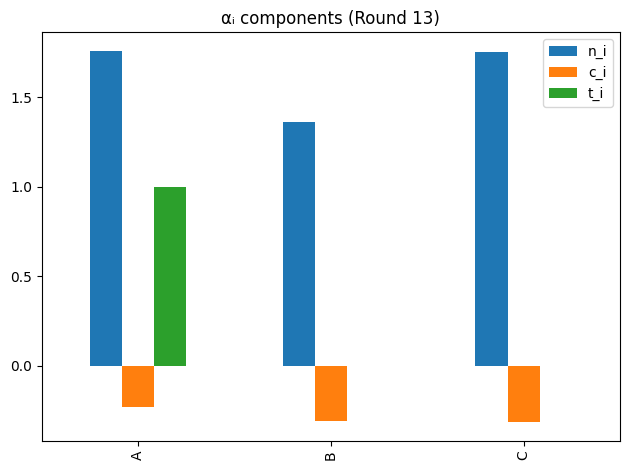

[Client A] Train Acc: 0.6492 | Test Acc: 0.6197


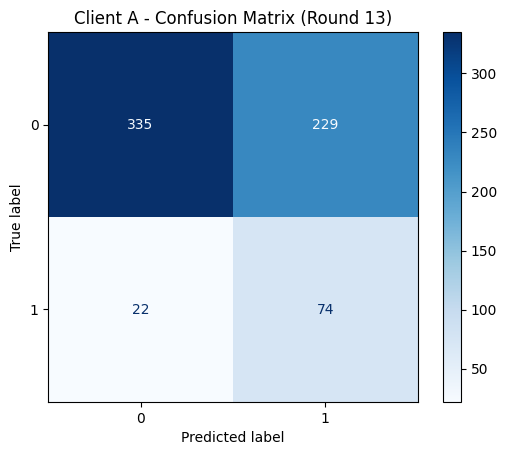

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9384    0.5940    0.7275       564
           1     0.2442    0.7708    0.3709        96

    accuracy                         0.6197       660
   macro avg     0.5913    0.6824    0.5492       660
weighted avg     0.8374    0.6197    0.6756       660

[Client B] Train Acc: 0.6627 | Test Acc: 0.6415


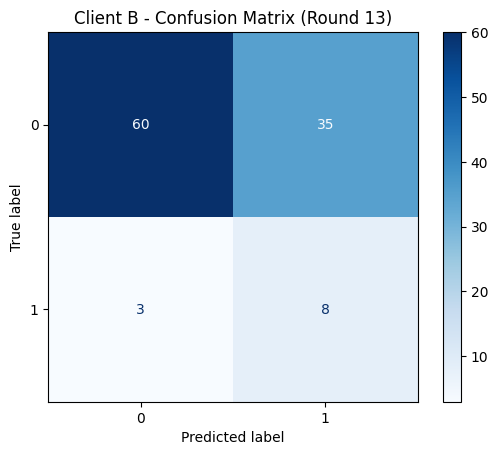

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9524    0.6316    0.7595        95
           1     0.1860    0.7273    0.2963        11

    accuracy                         0.6415       106
   macro avg     0.5692    0.6794    0.5279       106
weighted avg     0.8729    0.6415    0.7114       106

[Client C] Train Acc: 0.5944 | Test Acc: 0.5948


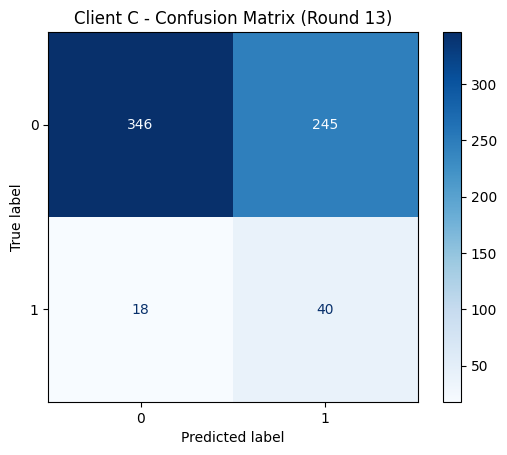

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9505    0.5854    0.7246       591
           1     0.1404    0.6897    0.2332        58

    accuracy                         0.5948       649
   macro avg     0.5455    0.6376    0.4789       649
weighted avg     0.8781    0.5948    0.6807       649


=== Round 14 ===
[Round 14] Global Accuracy: 0.6125 → 0.6138 | ΔW=0.4055

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  11.0
B  23.0217  0.4881   1.0
C  56.9649  0.4840   1.0


<Figure size 600x400 with 0 Axes>

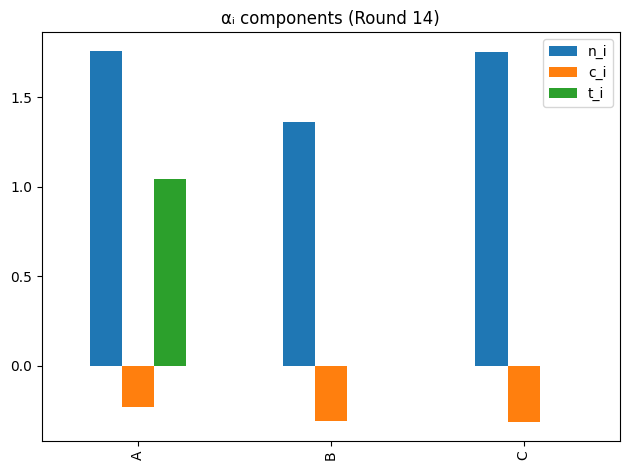

[Client A] Train Acc: 0.6515 | Test Acc: 0.6364


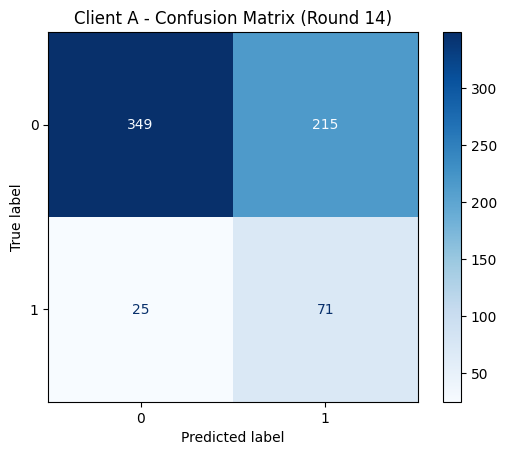

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9332    0.6188    0.7441       564
           1     0.2483    0.7396    0.3717        96

    accuracy                         0.6364       660
   macro avg     0.5907    0.6792    0.5579       660
weighted avg     0.8335    0.6364    0.6900       660

[Client B] Train Acc: 0.6439 | Test Acc: 0.6038


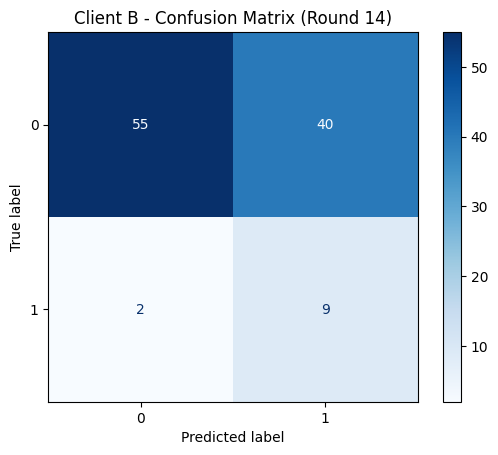

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9649    0.5789    0.7237        95
           1     0.1837    0.8182    0.3000        11

    accuracy                         0.6038       106
   macro avg     0.5743    0.6986    0.5118       106
weighted avg     0.8838    0.6038    0.6797       106

[Client C] Train Acc: 0.6017 | Test Acc: 0.5901


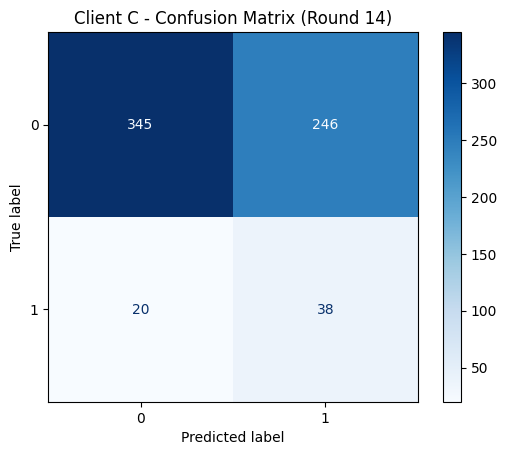

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9452    0.5838    0.7218       591
           1     0.1338    0.6552    0.2222        58

    accuracy                         0.5901       649
   macro avg     0.5395    0.6195    0.4720       649
weighted avg     0.8727    0.5901    0.6771       649


=== Round 15 ===
[Round 15] Global Accuracy: 0.6138 → 0.6443 | ΔW=0.3912

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  12.0
B  23.0217  0.4881   1.0
C  56.9649  0.4840   1.0


<Figure size 600x400 with 0 Axes>

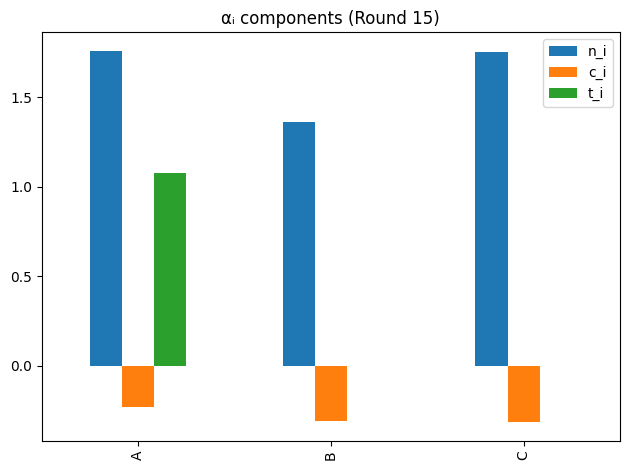

[Client A] Train Acc: 0.6674 | Test Acc: 0.6515


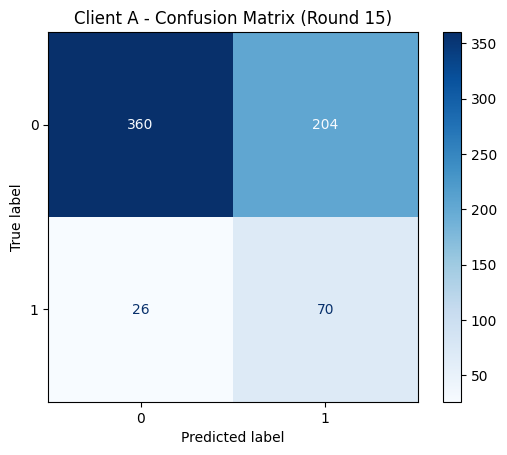

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9326    0.6383    0.7579       564
           1     0.2555    0.7292    0.3784        96

    accuracy                         0.6515       660
   macro avg     0.5941    0.6837    0.5681       660
weighted avg     0.8341    0.6515    0.7027       660

[Client B] Train Acc: 0.6722 | Test Acc: 0.6509


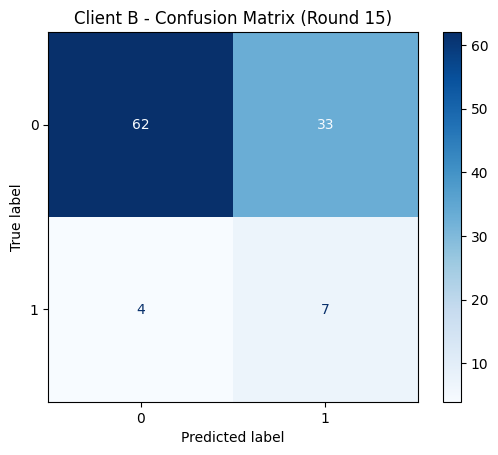

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9394    0.6526    0.7702        95
           1     0.1750    0.6364    0.2745        11

    accuracy                         0.6509       106
   macro avg     0.5572    0.6445    0.5223       106
weighted avg     0.8601    0.6509    0.7187       106

[Client C] Train Acc: 0.6198 | Test Acc: 0.6333


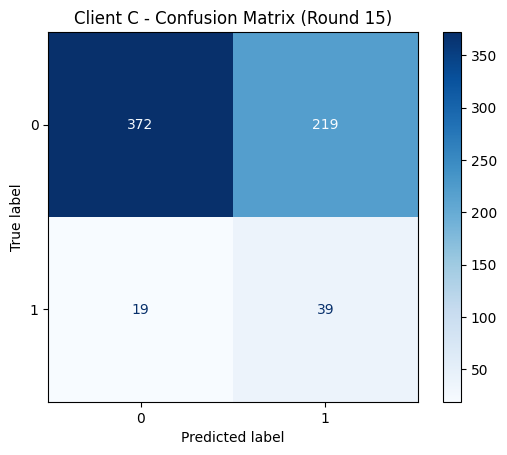

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9514    0.6294    0.7576       591
           1     0.1512    0.6724    0.2468        58

    accuracy                         0.6333       649
   macro avg     0.5513    0.6509    0.5022       649
weighted avg     0.8799    0.6333    0.7120       649


=== Round 16 ===
[Round 16] Global Accuracy: 0.6443 → 0.6145 | ΔW=0.3493

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  13.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

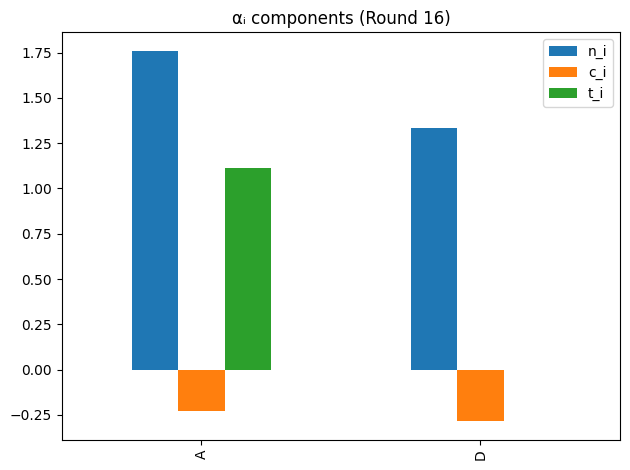

[Client A] Train Acc: 0.6492 | Test Acc: 0.6273


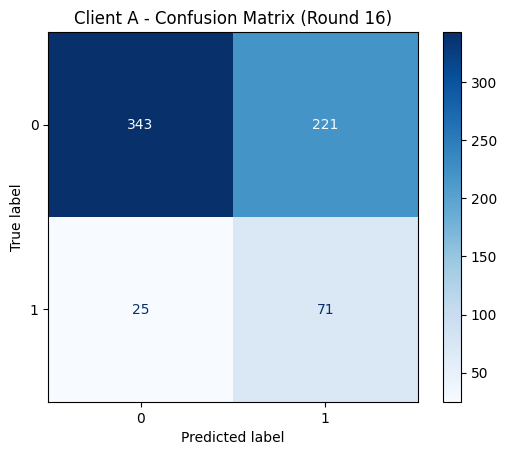

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9321    0.6082    0.7361       564
           1     0.2432    0.7396    0.3660        96

    accuracy                         0.6273       660
   macro avg     0.5876    0.6739    0.5510       660
weighted avg     0.8319    0.6273    0.6822       660

[Client D] Train Acc: 0.6114 | Test Acc: 0.6522


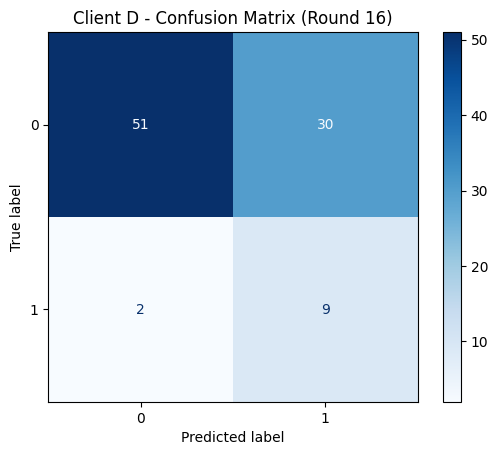

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9623    0.6296    0.7612        81
           1     0.2308    0.8182    0.3600        11

    accuracy                         0.6522        92
   macro avg     0.5965    0.7239    0.5606        92
weighted avg     0.8748    0.6522    0.7132        92


=== Round 17 ===
[Round 17] Global Accuracy: 0.6145 → 0.6350 | ΔW=0.4210

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  14.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

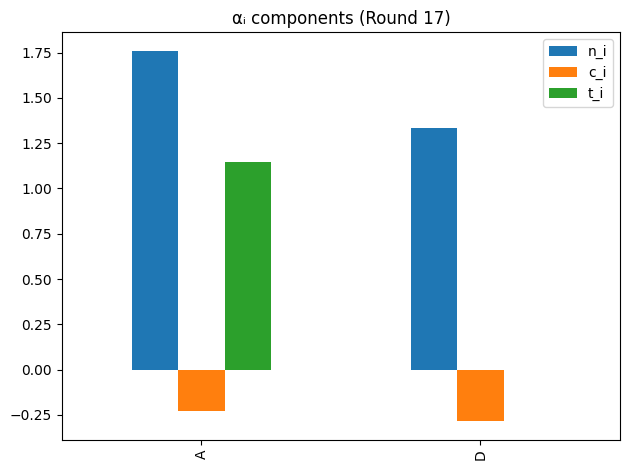

[Client A] Train Acc: 0.6731 | Test Acc: 0.6515


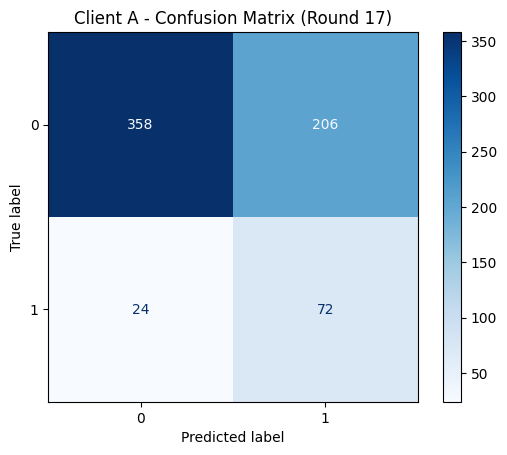

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9372    0.6348    0.7569       564
           1     0.2590    0.7500    0.3850        96

    accuracy                         0.6515       660
   macro avg     0.5981    0.6924    0.5709       660
weighted avg     0.8385    0.6515    0.7028       660

[Client D] Train Acc: 0.6223 | Test Acc: 0.6630


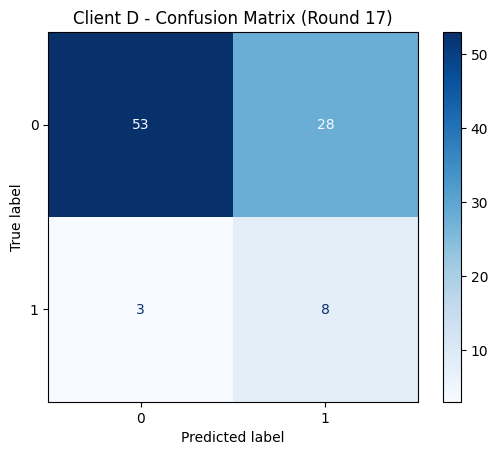

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9464    0.6543    0.7737        81
           1     0.2222    0.7273    0.3404        11

    accuracy                         0.6630        92
   macro avg     0.5843    0.6908    0.5571        92
weighted avg     0.8598    0.6630    0.7219        92


=== Round 18 ===
[Round 18] Global Accuracy: 0.6350 → 0.6443 | ΔW=0.3955

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  15.0
B  23.0217  0.4881   1.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

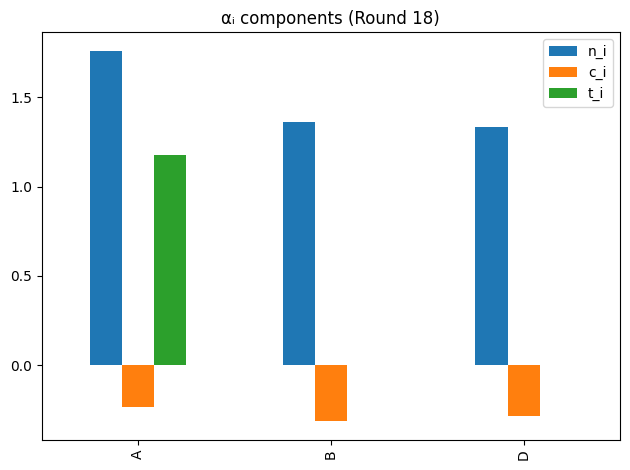

[Client A] Train Acc: 0.6848 | Test Acc: 0.6545


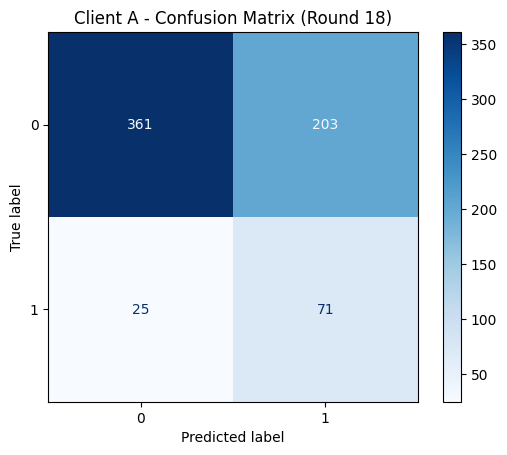

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9352    0.6401    0.7600       564
           1     0.2591    0.7396    0.3838        96

    accuracy                         0.6545       660
   macro avg     0.5972    0.6898    0.5719       660
weighted avg     0.8369    0.6545    0.7053       660

[Client B] Train Acc: 0.6840 | Test Acc: 0.6038


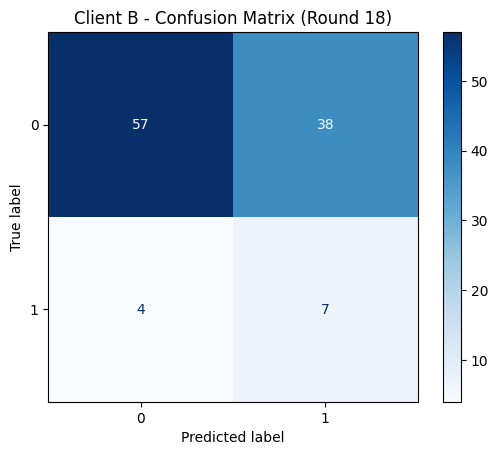

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9344    0.6000    0.7308        95
           1     0.1556    0.6364    0.2500        11

    accuracy                         0.6038       106
   macro avg     0.5450    0.6182    0.4904       106
weighted avg     0.8536    0.6038    0.6809       106

[Client D] Train Acc: 0.6522 | Test Acc: 0.6848


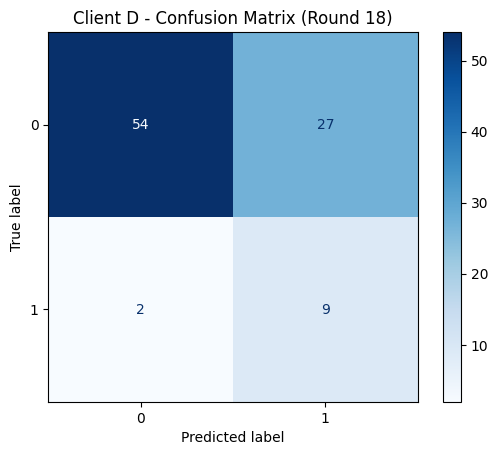

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9643    0.6667    0.7883        81
           1     0.2500    0.8182    0.3830        11

    accuracy                         0.6848        92
   macro avg     0.6071    0.7424    0.5856        92
weighted avg     0.8789    0.6848    0.7399        92


=== Round 19 ===
[Round 19] Global Accuracy: 0.6443 → 0.6390 | ΔW=0.5141

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  16.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

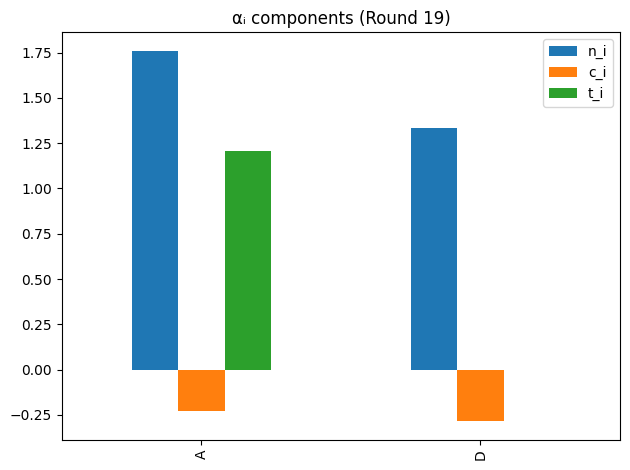

[Client A] Train Acc: 0.6705 | Test Acc: 0.6500


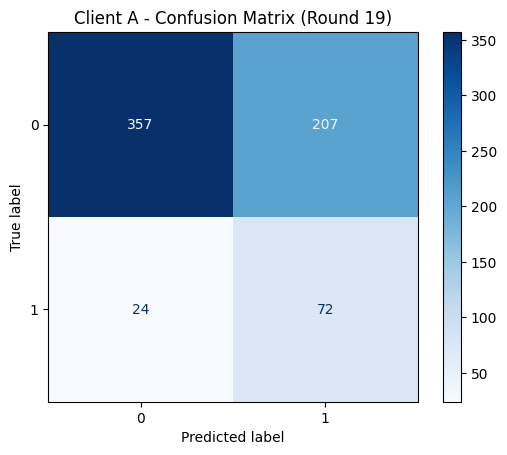

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9370    0.6330    0.7556       564
           1     0.2581    0.7500    0.3840        96

    accuracy                         0.6500       660
   macro avg     0.5975    0.6915    0.5698       660
weighted avg     0.8383    0.6500    0.7015       660

[Client D] Train Acc: 0.6223 | Test Acc: 0.6630


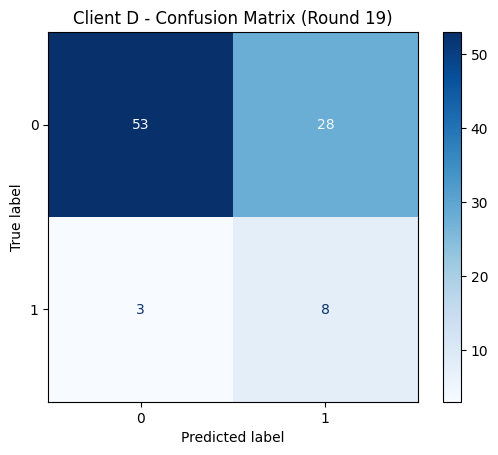

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9464    0.6543    0.7737        81
           1     0.2222    0.7273    0.3404        11

    accuracy                         0.6630        92
   macro avg     0.5843    0.6908    0.5571        92
weighted avg     0.8598    0.6630    0.7219        92


=== Round 20 ===
[Round 20] Global Accuracy: 0.6390 → 0.6344 | ΔW=0.3713

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  17.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

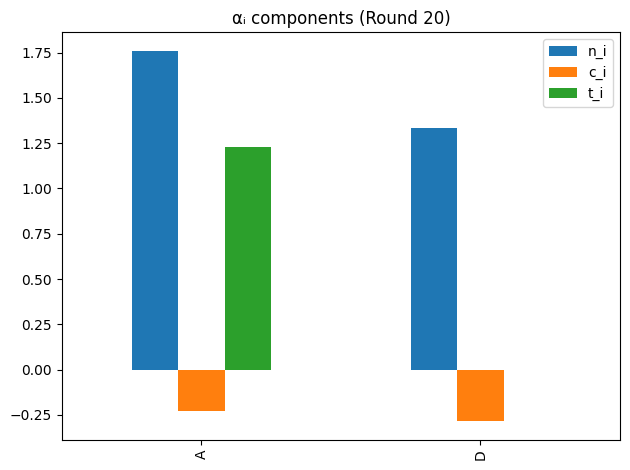

[Client A] Train Acc: 0.6723 | Test Acc: 0.6591


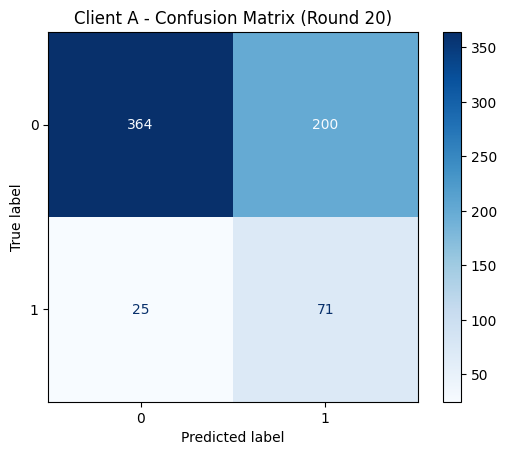

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9357    0.6454    0.7639       564
           1     0.2620    0.7396    0.3869        96

    accuracy                         0.6591       660
   macro avg     0.5989    0.6925    0.5754       660
weighted avg     0.8377    0.6591    0.7091       660

[Client D] Train Acc: 0.6141 | Test Acc: 0.6304


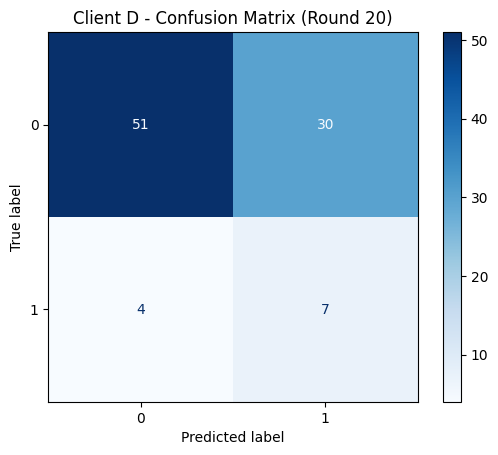

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9273    0.6296    0.7500        81
           1     0.1892    0.6364    0.2917        11

    accuracy                         0.6304        92
   macro avg     0.5582    0.6330    0.5208        92
weighted avg     0.8390    0.6304    0.6952        92


=== Round 21 ===
[Round 21] Global Accuracy: 0.6344 → 0.6357 | ΔW=0.4833

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  18.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

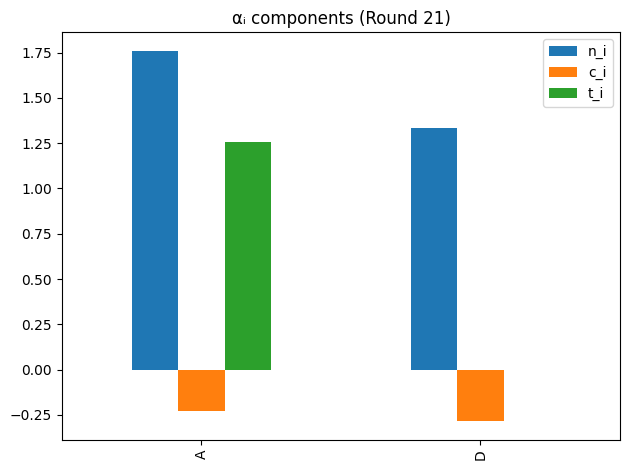

[Client A] Train Acc: 0.6693 | Test Acc: 0.6561


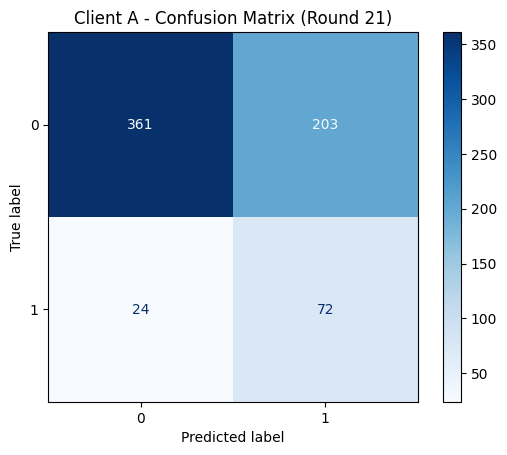

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9377    0.6401    0.7608       564
           1     0.2618    0.7500    0.3881        96

    accuracy                         0.6561       660
   macro avg     0.5997    0.6950    0.5745       660
weighted avg     0.8394    0.6561    0.7066       660

[Client D] Train Acc: 0.6332 | Test Acc: 0.6630


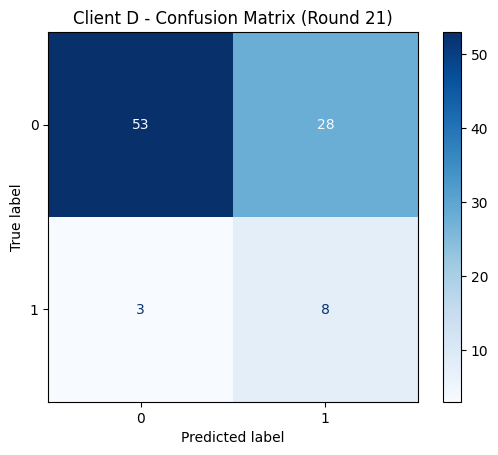

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9464    0.6543    0.7737        81
           1     0.2222    0.7273    0.3404        11

    accuracy                         0.6630        92
   macro avg     0.5843    0.6908    0.5571        92
weighted avg     0.8598    0.6630    0.7219        92


=== Round 22 ===
[Round 22] Global Accuracy: 0.6357 → 0.6549 | ΔW=0.4341

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  19.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

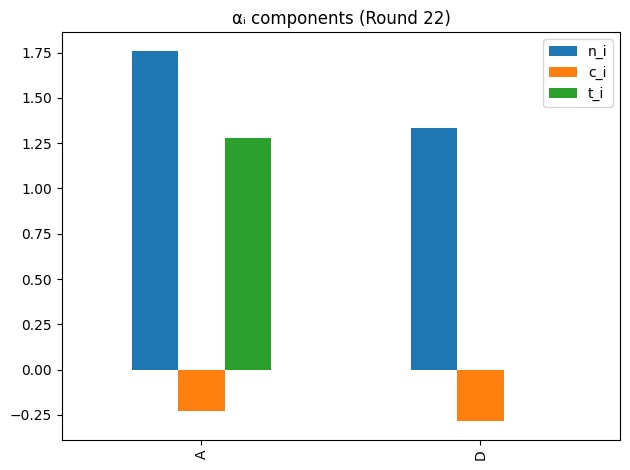

[Client A] Train Acc: 0.7019 | Test Acc: 0.6727


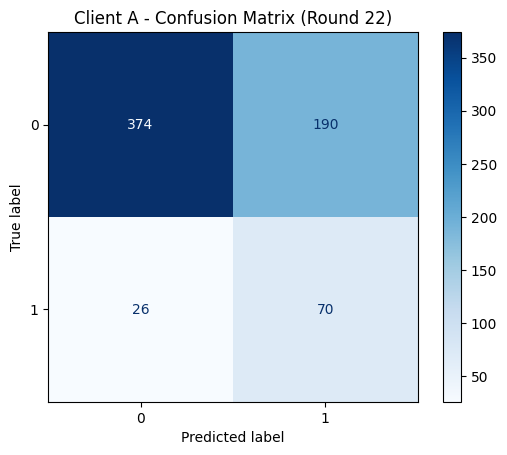

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9350    0.6631    0.7759       564
           1     0.2692    0.7292    0.3933        96

    accuracy                         0.6727       660
   macro avg     0.6021    0.6961    0.5846       660
weighted avg     0.8382    0.6727    0.7203       660

[Client D] Train Acc: 0.6685 | Test Acc: 0.6848


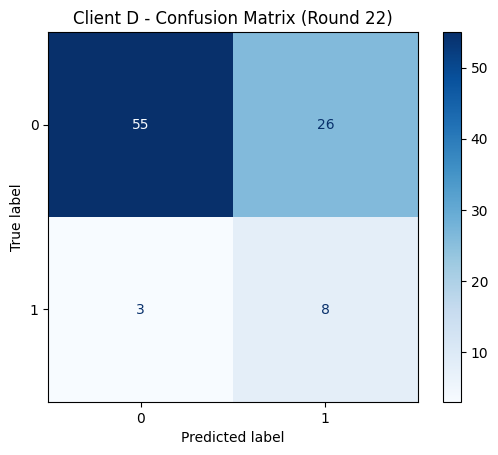

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9483    0.6790    0.7914        81
           1     0.2353    0.7273    0.3556        11

    accuracy                         0.6848        92
   macro avg     0.5918    0.7031    0.5735        92
weighted avg     0.8630    0.6848    0.7393        92


=== Round 23 ===
[Round 23] Global Accuracy: 0.6549 → 0.6410 | ΔW=0.4003

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  20.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

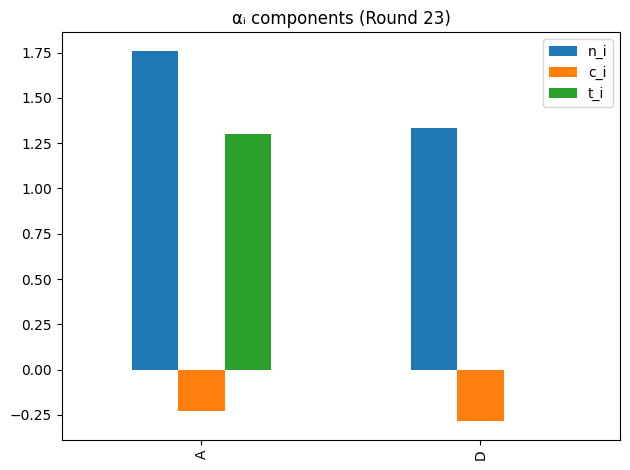

[Client A] Train Acc: 0.6852 | Test Acc: 0.6621


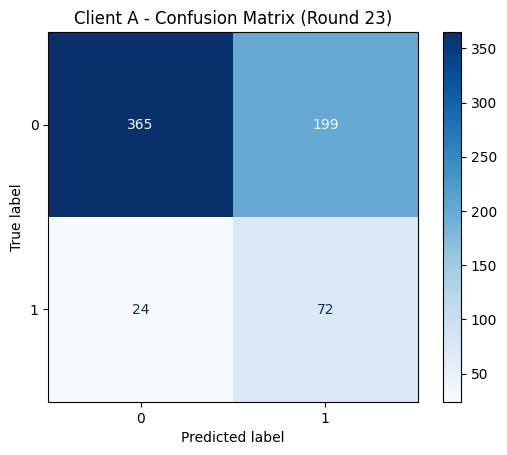

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9383    0.6472    0.7660       564
           1     0.2657    0.7500    0.3924        96

    accuracy                         0.6621       660
   macro avg     0.6020    0.6986    0.5792       660
weighted avg     0.8405    0.6621    0.7117       660

[Client D] Train Acc: 0.6712 | Test Acc: 0.7065


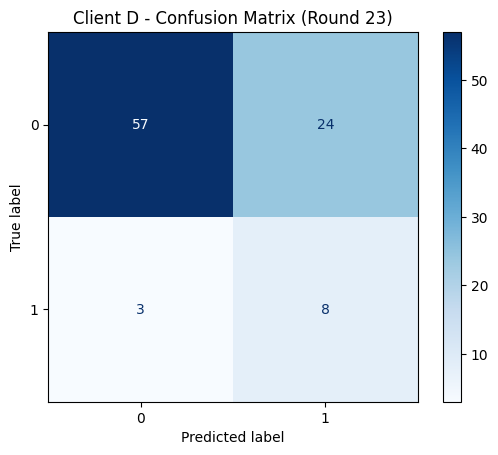

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9500    0.7037    0.8085        81
           1     0.2500    0.7273    0.3721        11

    accuracy                         0.7065        92
   macro avg     0.6000    0.7155    0.5903        92
weighted avg     0.8663    0.7065    0.7563        92


=== Round 24 ===
[Round 24] Global Accuracy: 0.6410 → 0.6463 | ΔW=0.5552

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  21.0
B  23.0217  0.4881   1.0
C  56.9649  0.4840   1.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

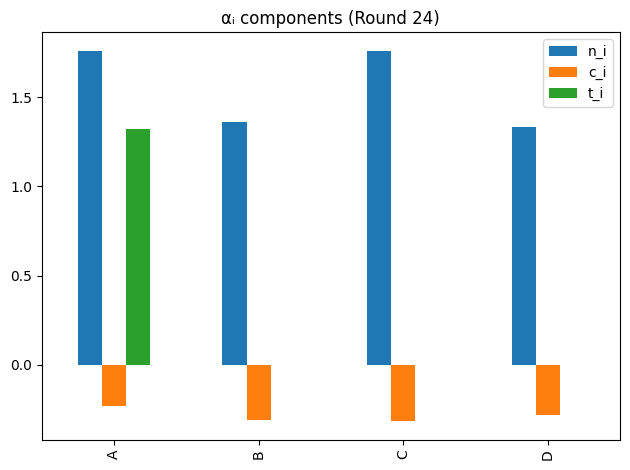

[Client A] Train Acc: 0.6852 | Test Acc: 0.6727


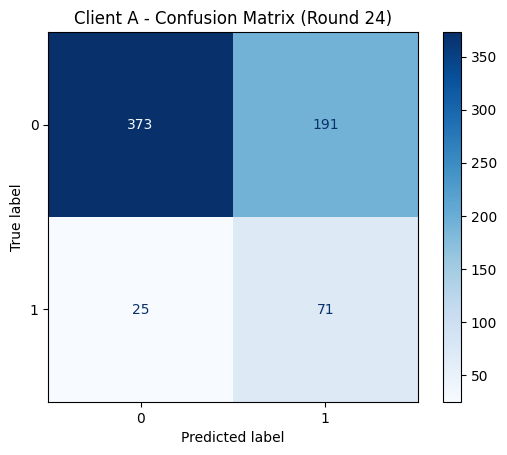

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9372    0.6613    0.7755       564
           1     0.2710    0.7396    0.3966        96

    accuracy                         0.6727       660
   macro avg     0.6041    0.7005    0.5861       660
weighted avg     0.8403    0.6727    0.7204       660

[Client B] Train Acc: 0.6769 | Test Acc: 0.6038


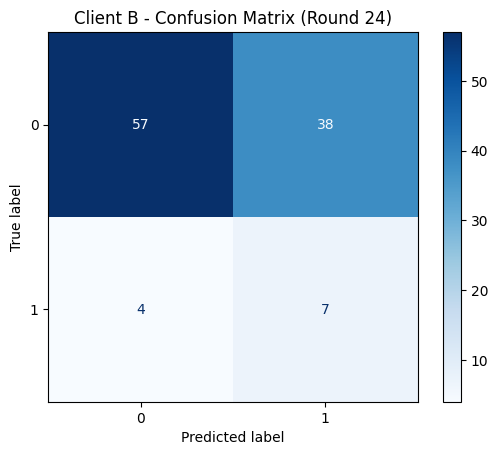

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9344    0.6000    0.7308        95
           1     0.1556    0.6364    0.2500        11

    accuracy                         0.6038       106
   macro avg     0.5450    0.6182    0.4904       106
weighted avg     0.8536    0.6038    0.6809       106

[Client C] Train Acc: 0.6221 | Test Acc: 0.6210


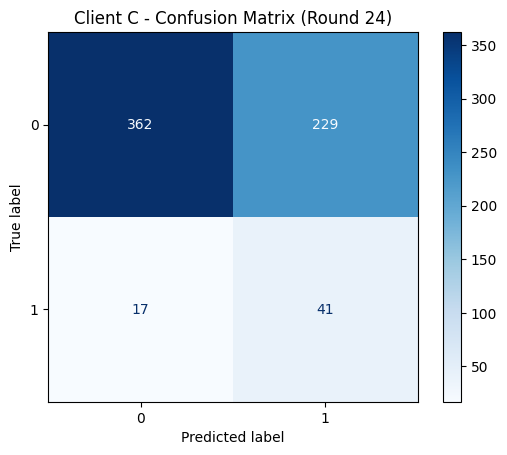

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9551    0.6125    0.7464       591
           1     0.1519    0.7069    0.2500        58

    accuracy                         0.6210       649
   macro avg     0.5535    0.6597    0.4982       649
weighted avg     0.8834    0.6210    0.7020       649

[Client D] Train Acc: 0.6658 | Test Acc: 0.6848


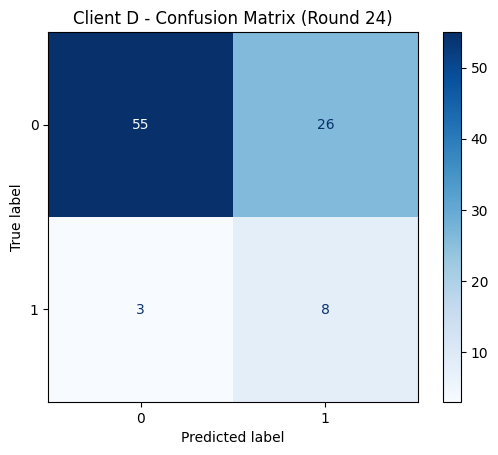

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9483    0.6790    0.7914        81
           1     0.2353    0.7273    0.3556        11

    accuracy                         0.6848        92
   macro avg     0.5918    0.7031    0.5735        92
weighted avg     0.8630    0.6848    0.7393        92


=== Round 25 ===
[Round 25] Global Accuracy: 0.6463 → 0.6636 | ΔW=0.4353

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  22.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

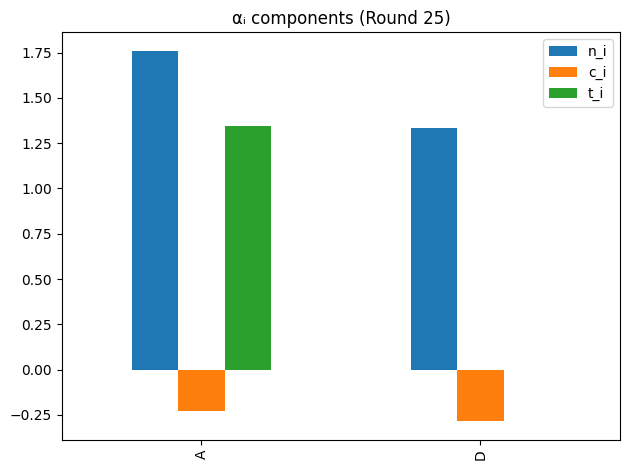

[Client A] Train Acc: 0.7098 | Test Acc: 0.6727


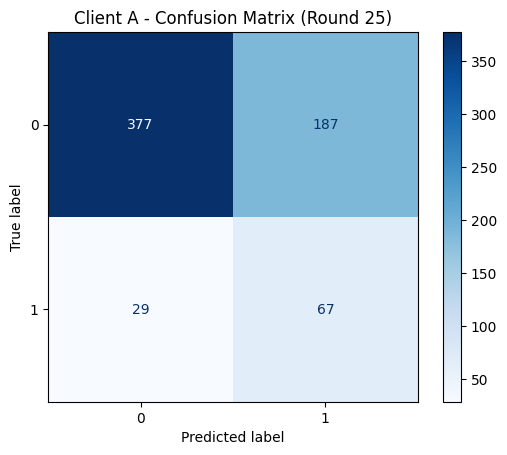

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9286    0.6684    0.7773       564
           1     0.2638    0.6979    0.3829        96

    accuracy                         0.6727       660
   macro avg     0.5962    0.6832    0.5801       660
weighted avg     0.8319    0.6727    0.7199       660

[Client D] Train Acc: 0.6766 | Test Acc: 0.6848


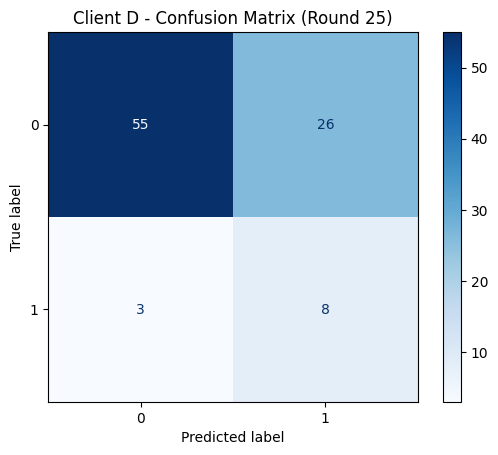

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9483    0.6790    0.7914        81
           1     0.2353    0.7273    0.3556        11

    accuracy                         0.6848        92
   macro avg     0.5918    0.7031    0.5735        92
weighted avg     0.8630    0.6848    0.7393        92


=== Round 26 ===
[Round 26] Global Accuracy: 0.6636 → 0.6603 | ΔW=0.4177

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  23.0
B  23.0217  0.4881   1.0


<Figure size 600x400 with 0 Axes>

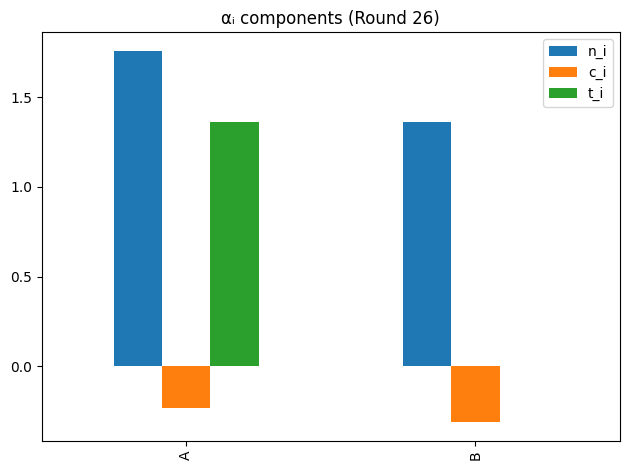

[Client A] Train Acc: 0.7133 | Test Acc: 0.6848


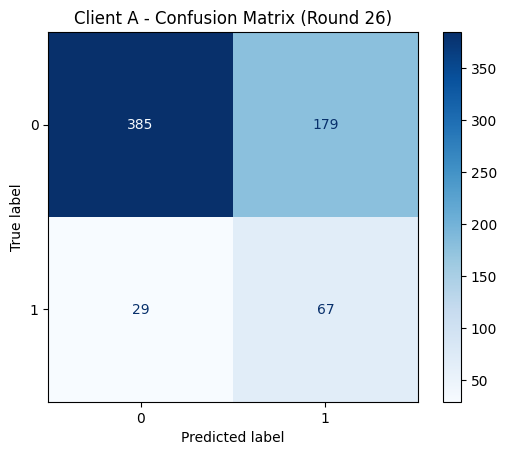

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9300    0.6826    0.7873       564
           1     0.2724    0.6979    0.3918        96

    accuracy                         0.6848       660
   macro avg     0.6012    0.6903    0.5896       660
weighted avg     0.8343    0.6848    0.7298       660

[Client B] Train Acc: 0.6958 | Test Acc: 0.6415


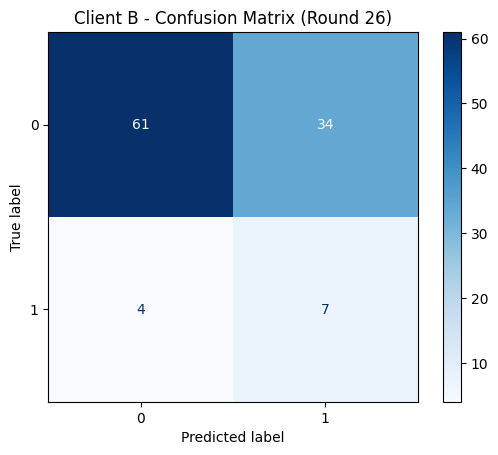

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9385    0.6421    0.7625        95
           1     0.1707    0.6364    0.2692        11

    accuracy                         0.6415       106
   macro avg     0.5546    0.6392    0.5159       106
weighted avg     0.8588    0.6415    0.7113       106


=== Round 27 ===
[Round 27] Global Accuracy: 0.6603 → 0.6543 | ΔW=0.4022

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  24.0
B  23.0217  0.4881   1.0
C  56.9649  0.4840   1.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

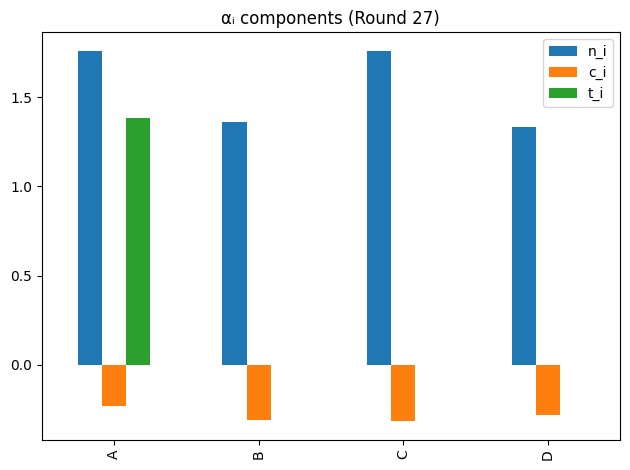

[Client A] Train Acc: 0.6947 | Test Acc: 0.6788


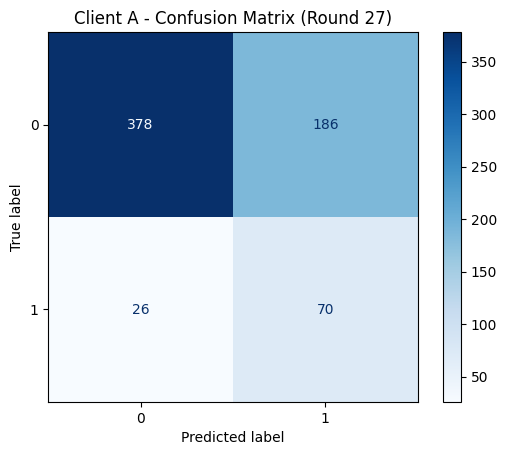

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9356    0.6702    0.7810       564
           1     0.2734    0.7292    0.3977        96

    accuracy                         0.6788       660
   macro avg     0.6045    0.6997    0.5894       660
weighted avg     0.8393    0.6788    0.7252       660

[Client B] Train Acc: 0.6745 | Test Acc: 0.6132


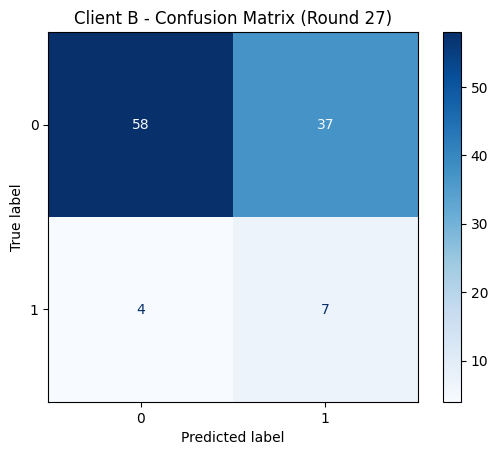

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9355    0.6105    0.7389        95
           1     0.1591    0.6364    0.2545        11

    accuracy                         0.6132       106
   macro avg     0.5473    0.6234    0.4967       106
weighted avg     0.8549    0.6132    0.6886       106

[Client C] Train Acc: 0.6248 | Test Acc: 0.6364


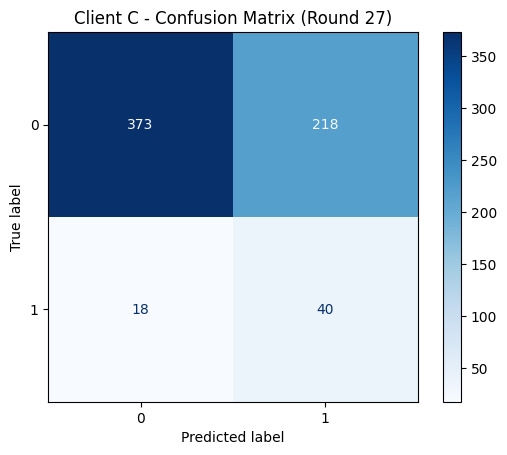

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9540    0.6311    0.7597       591
           1     0.1550    0.6897    0.2532        58

    accuracy                         0.6364       649
   macro avg     0.5545    0.6604    0.5064       649
weighted avg     0.8826    0.6364    0.7144       649

[Client D] Train Acc: 0.6549 | Test Acc: 0.6522


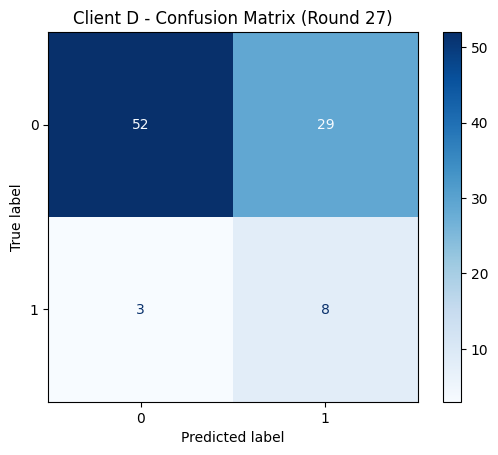

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9455    0.6420    0.7647        81
           1     0.2162    0.7273    0.3333        11

    accuracy                         0.6522        92
   macro avg     0.5808    0.6846    0.5490        92
weighted avg     0.8583    0.6522    0.7131        92


=== Round 28 ===
[Round 28] Global Accuracy: 0.6543 → 0.6629 | ΔW=0.3999

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  25.0
B  23.0217  0.4881   1.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

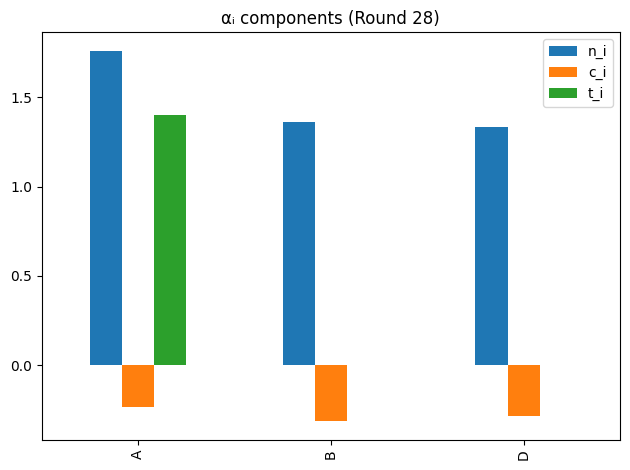

[Client A] Train Acc: 0.7182 | Test Acc: 0.6909


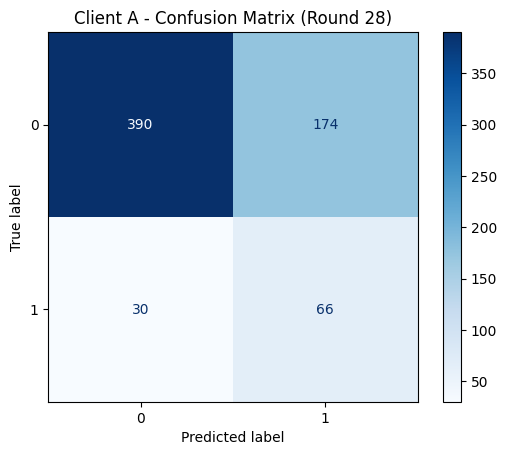

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9286    0.6915    0.7927       564
           1     0.2750    0.6875    0.3929        96

    accuracy                         0.6909       660
   macro avg     0.6018    0.6895    0.5928       660
weighted avg     0.8335    0.6909    0.7345       660

[Client B] Train Acc: 0.7028 | Test Acc: 0.5849


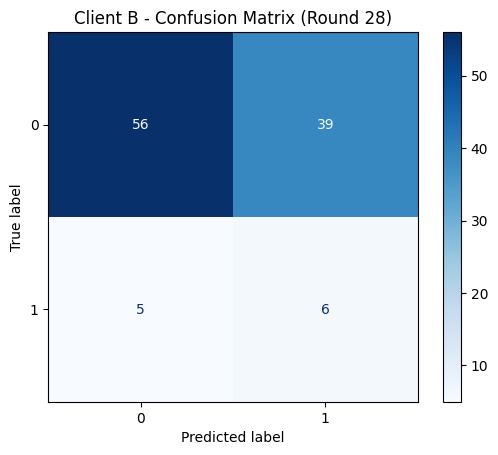

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9180    0.5895    0.7179        95
           1     0.1333    0.5455    0.2143        11

    accuracy                         0.5849       106
   macro avg     0.5257    0.5675    0.4661       106
weighted avg     0.8366    0.5849    0.6657       106

[Client D] Train Acc: 0.6630 | Test Acc: 0.6739


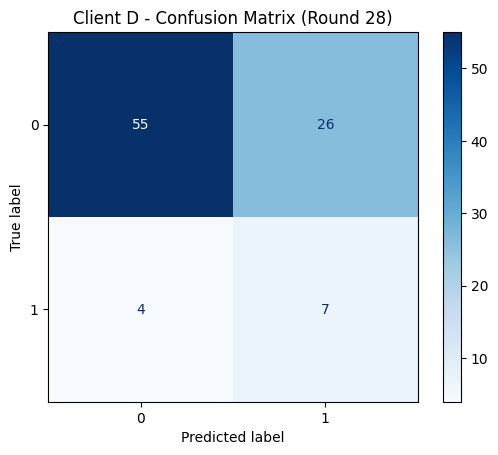

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9322    0.6790    0.7857        81
           1     0.2121    0.6364    0.3182        11

    accuracy                         0.6739        92
   macro avg     0.5722    0.6577    0.5519        92
weighted avg     0.8461    0.6739    0.7298        92


=== Round 29 ===
[Round 29] Global Accuracy: 0.6629 → 0.6709 | ΔW=0.4159

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  26.0
B  23.0217  0.4881   1.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

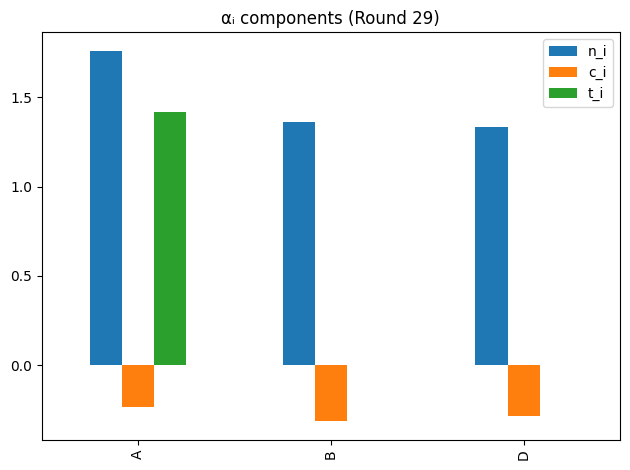

[Client A] Train Acc: 0.7170 | Test Acc: 0.6924


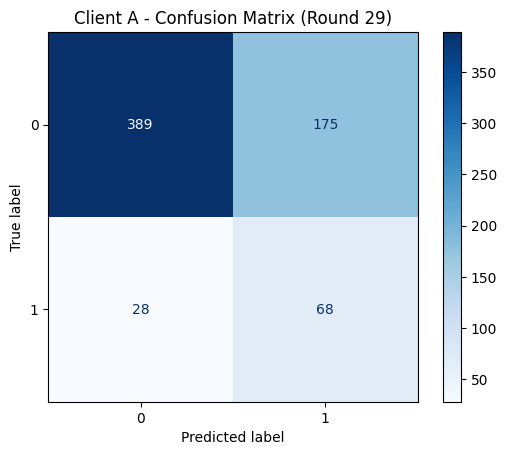

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9329    0.6897    0.7931       564
           1     0.2798    0.7083    0.4012        96

    accuracy                         0.6924       660
   macro avg     0.6063    0.6990    0.5971       660
weighted avg     0.8379    0.6924    0.7361       660

[Client B] Train Acc: 0.6910 | Test Acc: 0.6604


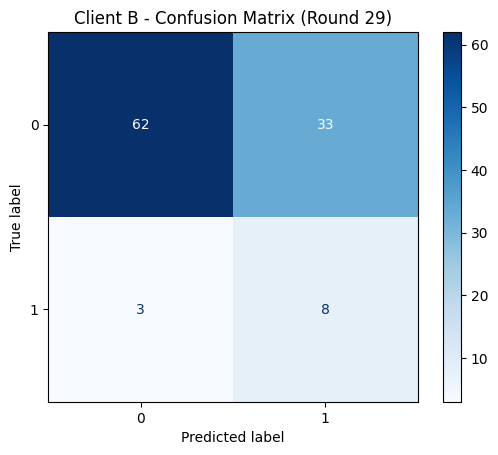

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9538    0.6526    0.7750        95
           1     0.1951    0.7273    0.3077        11

    accuracy                         0.6604       106
   macro avg     0.5745    0.6900    0.5413       106
weighted avg     0.8751    0.6604    0.7265       106

[Client D] Train Acc: 0.6929 | Test Acc: 0.6522


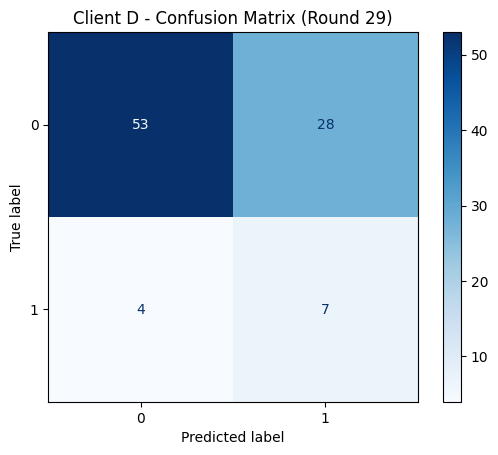

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9298    0.6543    0.7681        81
           1     0.2000    0.6364    0.3043        11

    accuracy                         0.6522        92
   macro avg     0.5649    0.6453    0.5362        92
weighted avg     0.8426    0.6522    0.7127        92


=== Round 30 ===
[Round 30] Global Accuracy: 0.6709 → 0.6656 | ΔW=0.4119

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  27.0
B  23.0217  0.4881   1.0
C  56.9649  0.4840   1.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

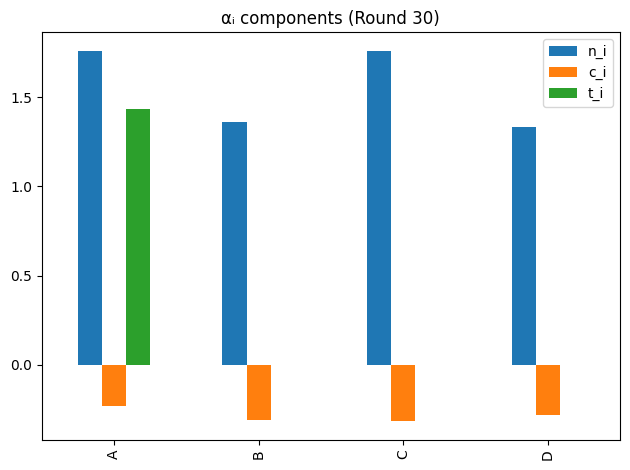

[Client A] Train Acc: 0.7212 | Test Acc: 0.6894


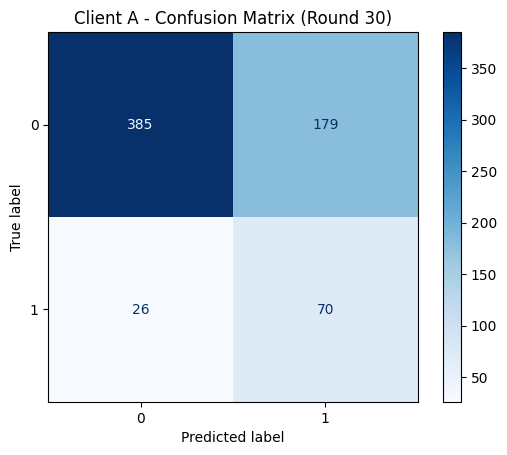

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9367    0.6826    0.7897       564
           1     0.2811    0.7292    0.4058        96

    accuracy                         0.6894       660
   macro avg     0.6089    0.7059    0.5978       660
weighted avg     0.8414    0.6894    0.7339       660

[Client B] Train Acc: 0.6934 | Test Acc: 0.5849


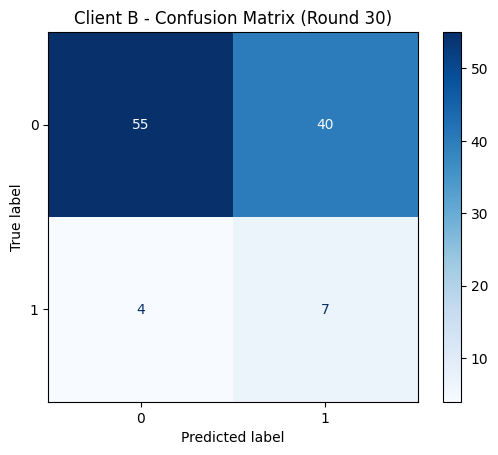

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9322    0.5789    0.7143        95
           1     0.1489    0.6364    0.2414        11

    accuracy                         0.5849       106
   macro avg     0.5406    0.6077    0.4778       106
weighted avg     0.8509    0.5849    0.6652       106

[Client C] Train Acc: 0.6429 | Test Acc: 0.6564


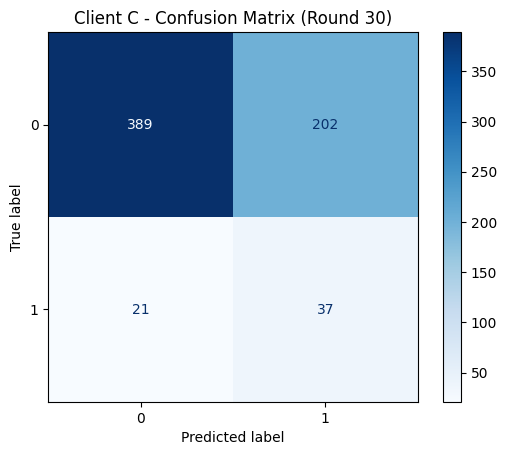

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9488    0.6582    0.7772       591
           1     0.1548    0.6379    0.2492        58

    accuracy                         0.6564       649
   macro avg     0.5518    0.6481    0.5132       649
weighted avg     0.8778    0.6564    0.7300       649

[Client D] Train Acc: 0.6821 | Test Acc: 0.6522


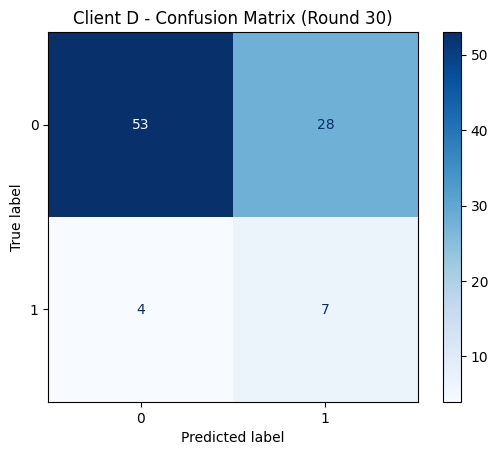

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9298    0.6543    0.7681        81
           1     0.2000    0.6364    0.3043        11

    accuracy                         0.6522        92
   macro avg     0.5649    0.6453    0.5362        92
weighted avg     0.8426    0.6522    0.7127        92


=== Round 31 ===
[Round 31] Global Accuracy: 0.6656 → 0.6669 | ΔW=0.5039

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  28.0
C  56.9649  0.4840   1.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

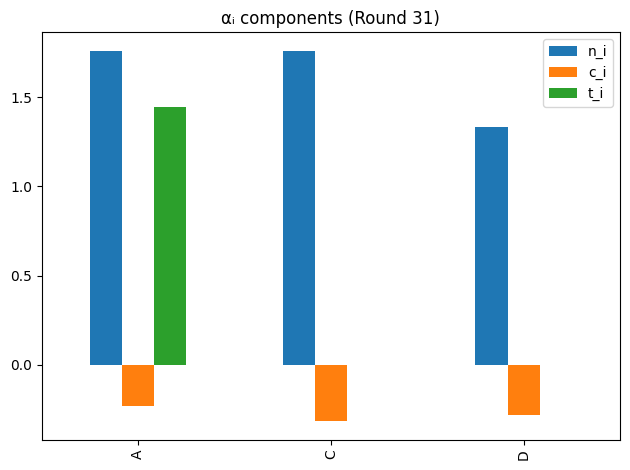

[Client A] Train Acc: 0.7246 | Test Acc: 0.6924


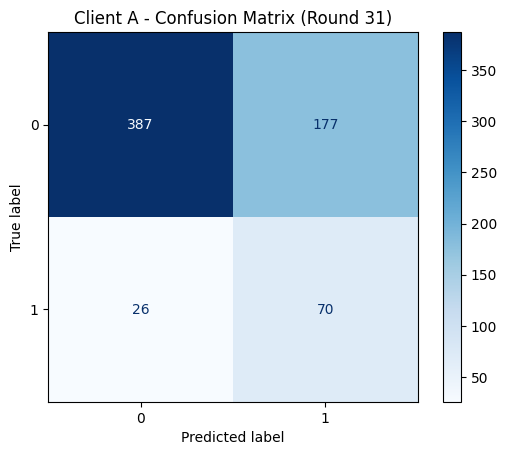

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9370    0.6862    0.7922       564
           1     0.2834    0.7292    0.4082        96

    accuracy                         0.6924       660
   macro avg     0.6102    0.7077    0.6002       660
weighted avg     0.8420    0.6924    0.7364       660

[Client C] Train Acc: 0.6425 | Test Acc: 0.6549


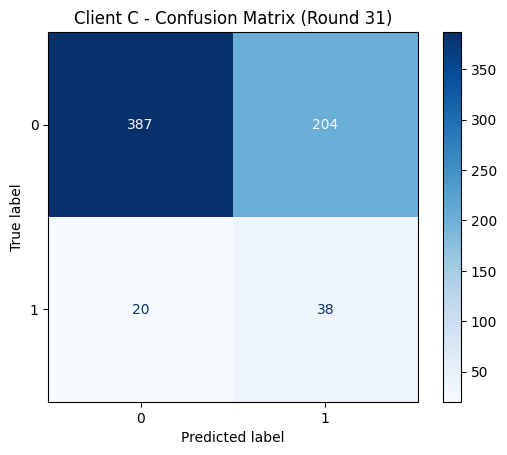

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9509    0.6548    0.7756       591
           1     0.1570    0.6552    0.2533        58

    accuracy                         0.6549       649
   macro avg     0.5539    0.6550    0.5144       649
weighted avg     0.8799    0.6549    0.7289       649

[Client D] Train Acc: 0.6848 | Test Acc: 0.6413


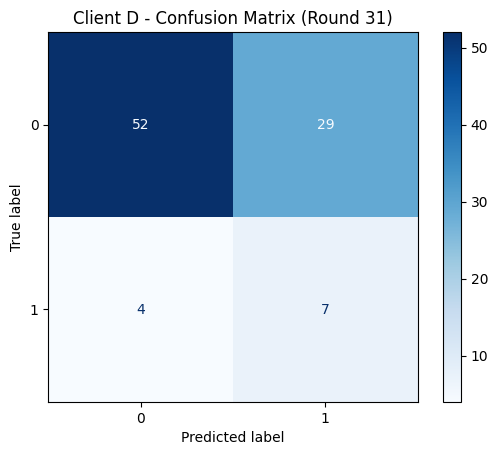

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9286    0.6420    0.7591        81
           1     0.1944    0.6364    0.2979        11

    accuracy                         0.6413        92
   macro avg     0.5615    0.6392    0.5285        92
weighted avg     0.8408    0.6413    0.7040        92


=== Round 32 ===
[Round 32] Global Accuracy: 0.6669 → 0.6583 | ΔW=0.4250

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  29.0
C  56.9649  0.4840   1.0


<Figure size 600x400 with 0 Axes>

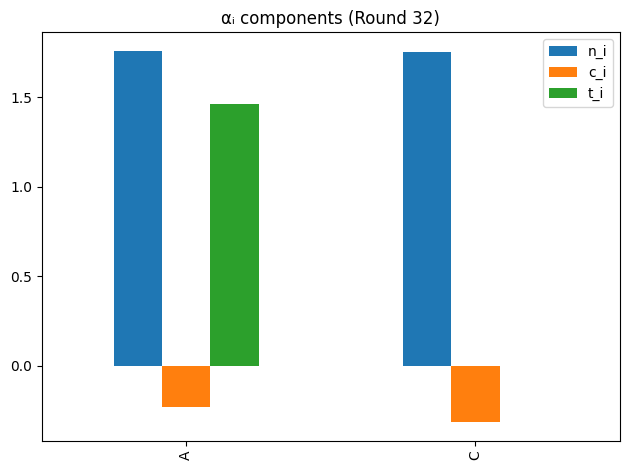

[Client A] Train Acc: 0.7159 | Test Acc: 0.6727


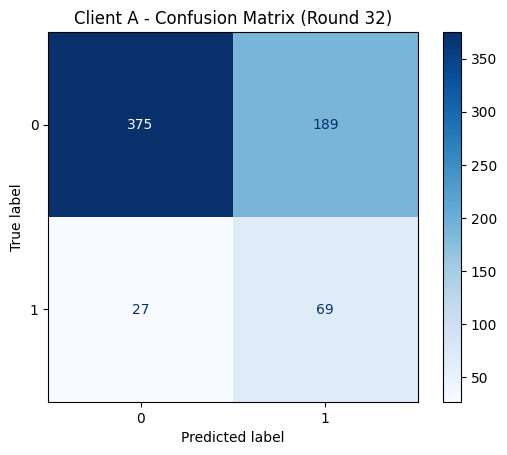

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9328    0.6649    0.7764       564
           1     0.2674    0.7188    0.3898        96

    accuracy                         0.6727       660
   macro avg     0.6001    0.6918    0.5831       660
weighted avg     0.8361    0.6727    0.7202       660

[Client C] Train Acc: 0.6421 | Test Acc: 0.6518


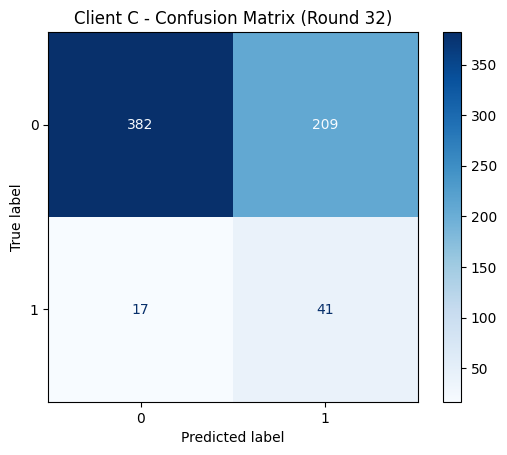

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9574    0.6464    0.7717       591
           1     0.1640    0.7069    0.2662        58

    accuracy                         0.6518       649
   macro avg     0.5607    0.6766    0.5190       649
weighted avg     0.8865    0.6518    0.7265       649


=== Round 33 ===
[Round 33] Global Accuracy: 0.6583 → 0.6523 | ΔW=0.4834

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  30.0
C  56.9649  0.4840   1.0


<Figure size 600x400 with 0 Axes>

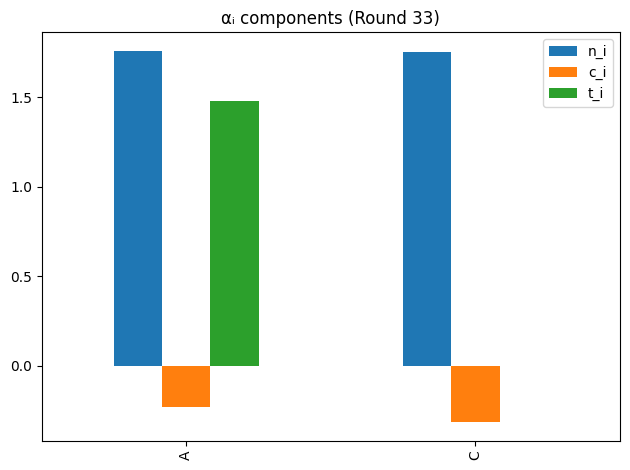

[Client A] Train Acc: 0.7114 | Test Acc: 0.6788


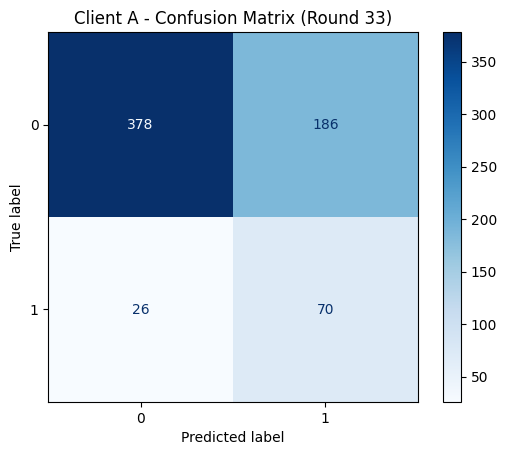

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9356    0.6702    0.7810       564
           1     0.2734    0.7292    0.3977        96

    accuracy                         0.6788       660
   macro avg     0.6045    0.6997    0.5894       660
weighted avg     0.8393    0.6788    0.7252       660

[Client C] Train Acc: 0.6352 | Test Acc: 0.6379


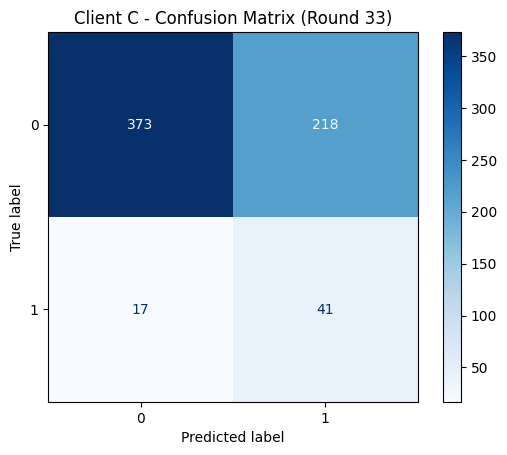

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9564    0.6311    0.7604       591
           1     0.1583    0.7069    0.2587        58

    accuracy                         0.6379       649
   macro avg     0.5574    0.6690    0.5096       649
weighted avg     0.8851    0.6379    0.7156       649


=== Round 34 ===
[Round 34] Global Accuracy: 0.6523 → 0.6702 | ΔW=0.4732

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  31.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

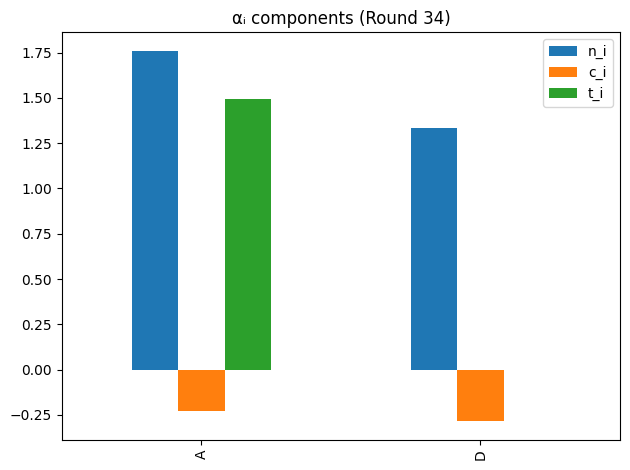

[Client A] Train Acc: 0.7337 | Test Acc: 0.6985


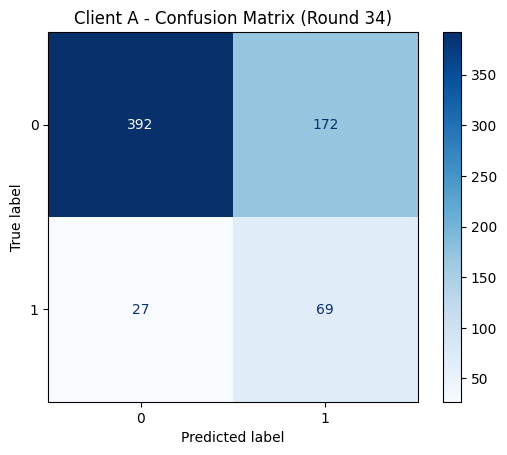

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9356    0.6950    0.7976       564
           1     0.2863    0.7188    0.4095        96

    accuracy                         0.6985       660
   macro avg     0.6109    0.7069    0.6035       660
weighted avg     0.8411    0.6985    0.7411       660

[Client D] Train Acc: 0.6821 | Test Acc: 0.6848


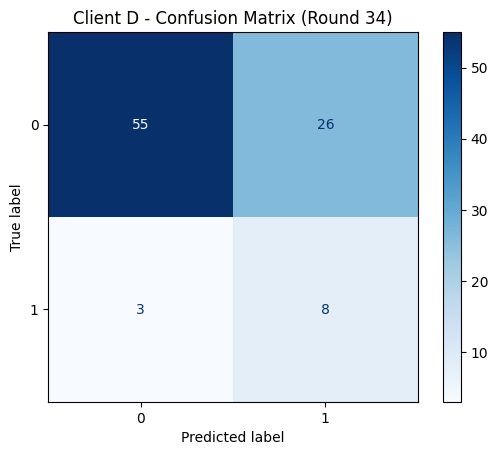

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9483    0.6790    0.7914        81
           1     0.2353    0.7273    0.3556        11

    accuracy                         0.6848        92
   macro avg     0.5918    0.7031    0.5735        92
weighted avg     0.8630    0.6848    0.7393        92


=== Round 35 ===
[Round 35] Global Accuracy: 0.6702 → 0.6569 | ΔW=0.5536

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  32.0
B  23.0217  0.4881   1.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

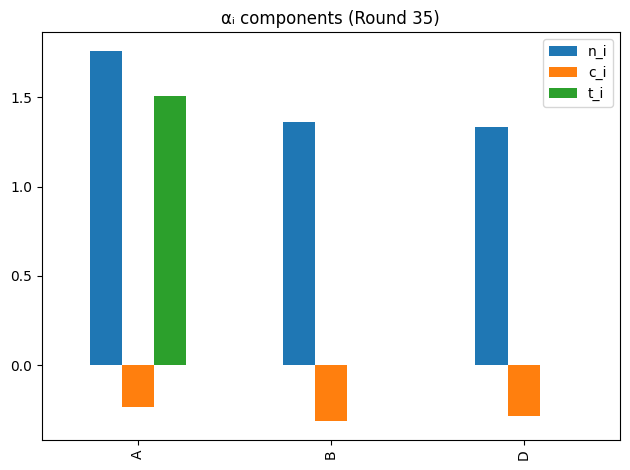

[Client A] Train Acc: 0.7197 | Test Acc: 0.6758


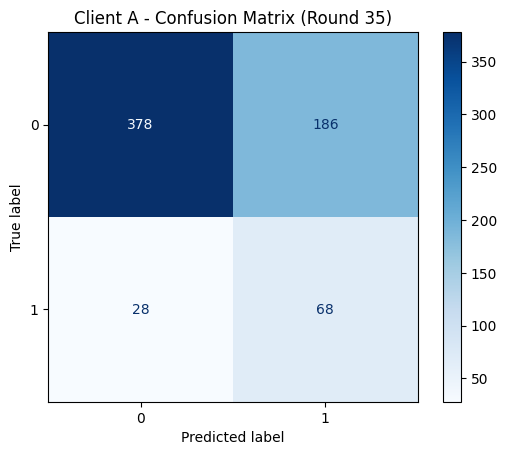

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9310    0.6702    0.7794       564
           1     0.2677    0.7083    0.3886        96

    accuracy                         0.6758       660
   macro avg     0.5994    0.6893    0.5840       660
weighted avg     0.8346    0.6758    0.7225       660

[Client B] Train Acc: 0.6863 | Test Acc: 0.6415


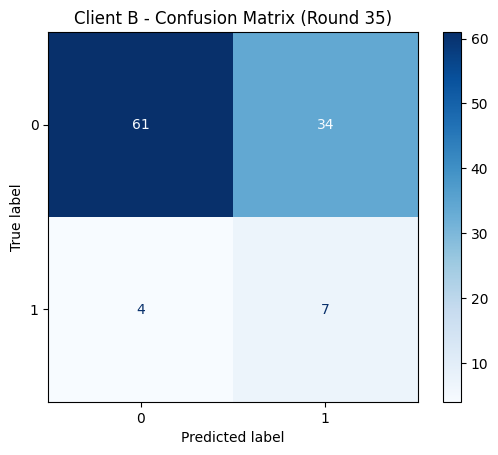

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9385    0.6421    0.7625        95
           1     0.1707    0.6364    0.2692        11

    accuracy                         0.6415       106
   macro avg     0.5546    0.6392    0.5159       106
weighted avg     0.8588    0.6415    0.7113       106

[Client D] Train Acc: 0.6712 | Test Acc: 0.6630


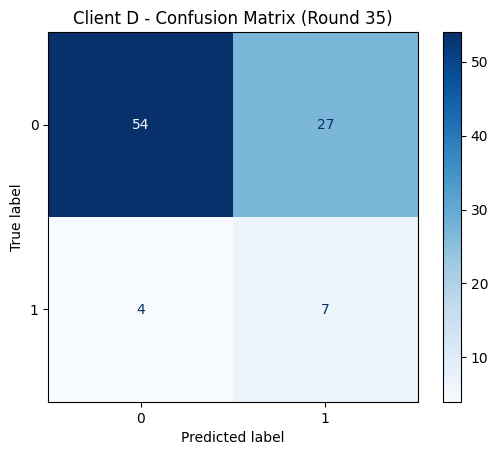

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9310    0.6667    0.7770        81
           1     0.2059    0.6364    0.3111        11

    accuracy                         0.6630        92
   macro avg     0.5685    0.6515    0.5440        92
weighted avg     0.8443    0.6630    0.7213        92


=== Round 36 ===
[Round 36] Global Accuracy: 0.6569 → 0.6450 | ΔW=0.3947

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  33.0
B  23.0217  0.4881   1.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

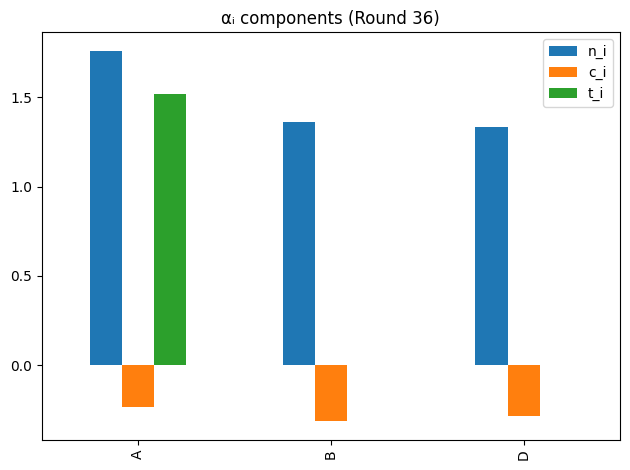

[Client A] Train Acc: 0.7072 | Test Acc: 0.6682


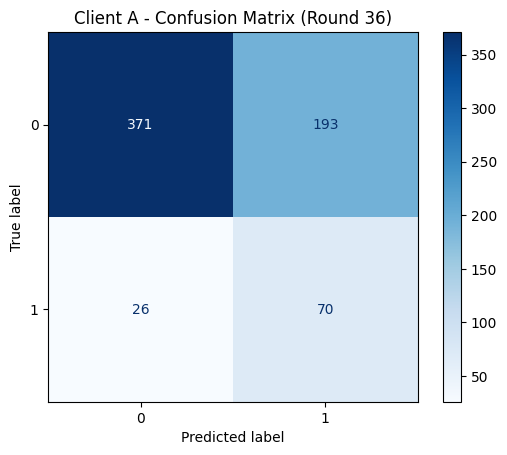

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9345    0.6578    0.7721       564
           1     0.2662    0.7292    0.3900        96

    accuracy                         0.6682       660
   macro avg     0.6003    0.6935    0.5810       660
weighted avg     0.8373    0.6682    0.7165       660

[Client B] Train Acc: 0.6840 | Test Acc: 0.5943


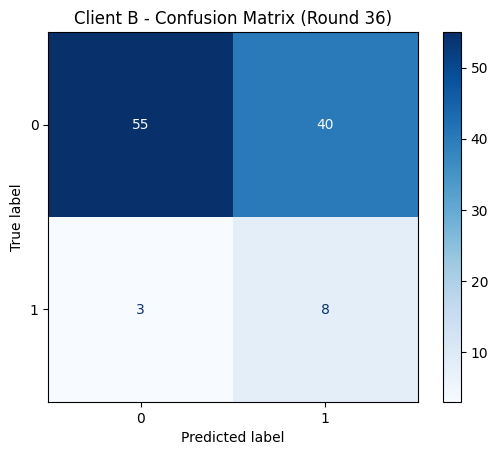

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9483    0.5789    0.7190        95
           1     0.1667    0.7273    0.2712        11

    accuracy                         0.5943       106
   macro avg     0.5575    0.6531    0.4951       106
weighted avg     0.8672    0.5943    0.6725       106

[Client D] Train Acc: 0.6766 | Test Acc: 0.6522


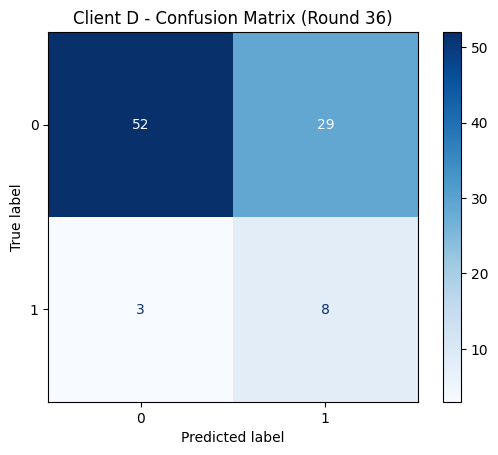

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9455    0.6420    0.7647        81
           1     0.2162    0.7273    0.3333        11

    accuracy                         0.6522        92
   macro avg     0.5808    0.6846    0.5490        92
weighted avg     0.8583    0.6522    0.7131        92


=== Round 37 ===
[Round 37] Global Accuracy: 0.6450 → 0.6516 | ΔW=0.4354

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  34.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

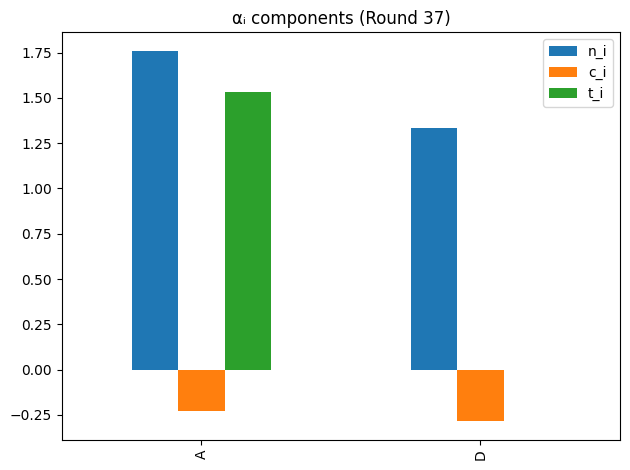

[Client A] Train Acc: 0.7064 | Test Acc: 0.6773


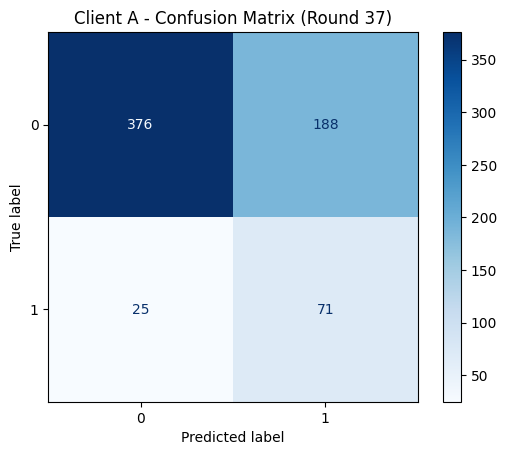

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9377    0.6667    0.7793       564
           1     0.2741    0.7396    0.4000        96

    accuracy                         0.6773       660
   macro avg     0.6059    0.7031    0.5896       660
weighted avg     0.8411    0.6773    0.7241       660

[Client D] Train Acc: 0.6739 | Test Acc: 0.6630


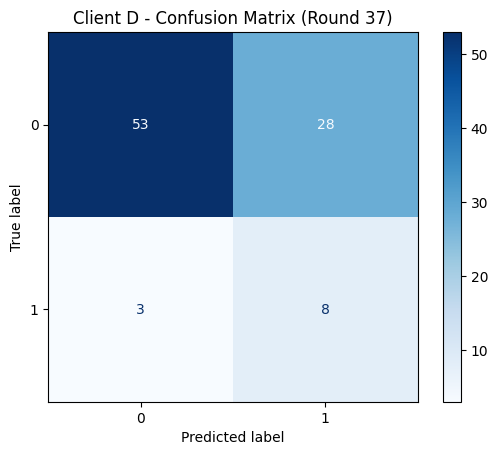

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9464    0.6543    0.7737        81
           1     0.2222    0.7273    0.3404        11

    accuracy                         0.6630        92
   macro avg     0.5843    0.6908    0.5571        92
weighted avg     0.8598    0.6630    0.7219        92


=== Round 38 ===
[Round 38] Global Accuracy: 0.6516 → 0.6583 | ΔW=0.6997

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  35.0


<Figure size 600x400 with 0 Axes>

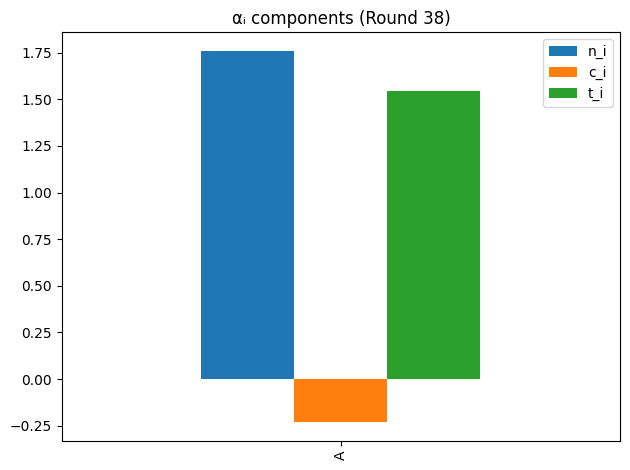

[Client A] Train Acc: 0.7250 | Test Acc: 0.6788


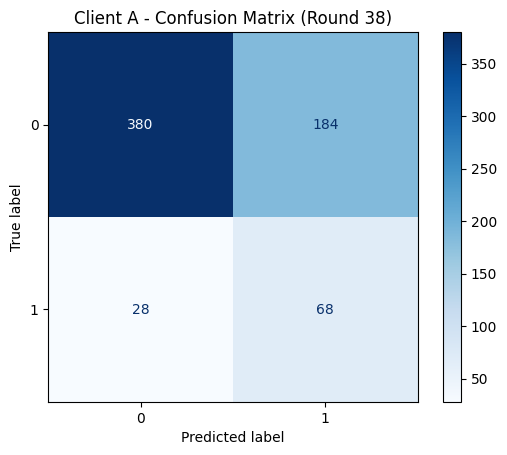

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9314    0.6738    0.7819       564
           1     0.2698    0.7083    0.3908        96

    accuracy                         0.6788       660
   macro avg     0.6006    0.6910    0.5863       660
weighted avg     0.8351    0.6788    0.7250       660


=== Round 39 ===
[Round 39] Global Accuracy: 0.6583 → 0.6556 | ΔW=0.6002

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  36.0
C  56.9649  0.4840   1.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

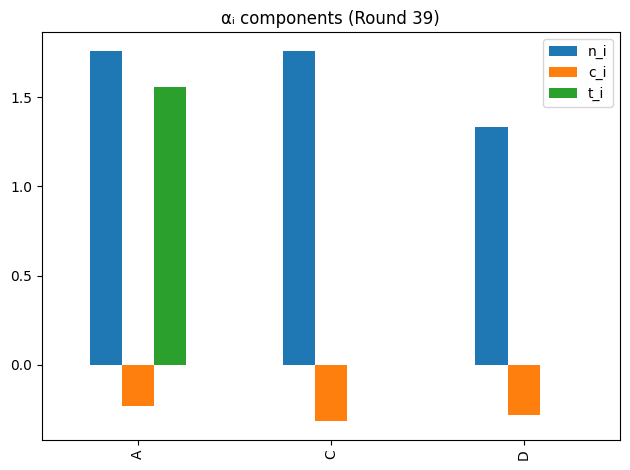

[Client A] Train Acc: 0.7170 | Test Acc: 0.6742


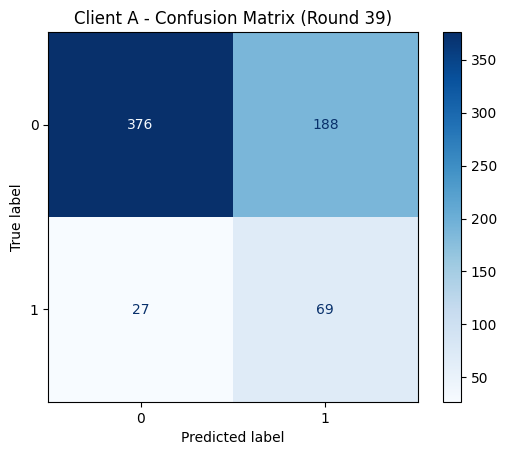

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9330    0.6667    0.7777       564
           1     0.2685    0.7188    0.3909        96

    accuracy                         0.6742       660
   macro avg     0.6007    0.6927    0.5843       660
weighted avg     0.8363    0.6742    0.7214       660

[Client C] Train Acc: 0.6383 | Test Acc: 0.6333


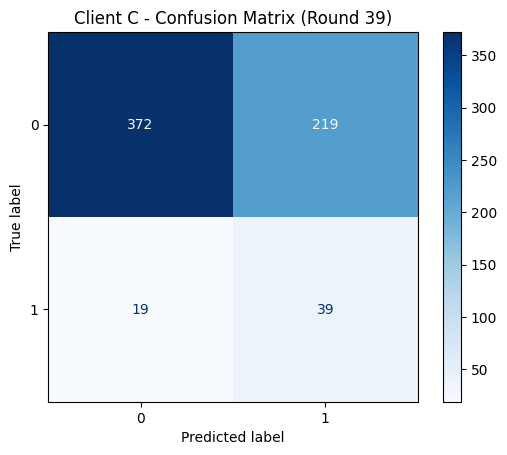

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9514    0.6294    0.7576       591
           1     0.1512    0.6724    0.2468        58

    accuracy                         0.6333       649
   macro avg     0.5513    0.6509    0.5022       649
weighted avg     0.8799    0.6333    0.7120       649

[Client D] Train Acc: 0.6957 | Test Acc: 0.6957


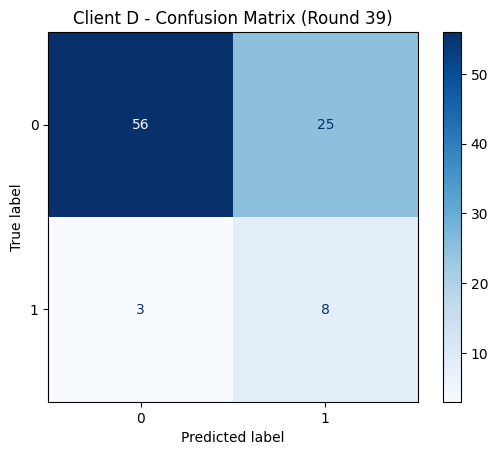

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9492    0.6914    0.8000        81
           1     0.2424    0.7273    0.3636        11

    accuracy                         0.6957        92
   macro avg     0.5958    0.7093    0.5818        92
weighted avg     0.8647    0.6957    0.7478        92


=== Round 40 ===
[Round 40] Global Accuracy: 0.6556 → 0.6616 | ΔW=0.5964

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  37.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

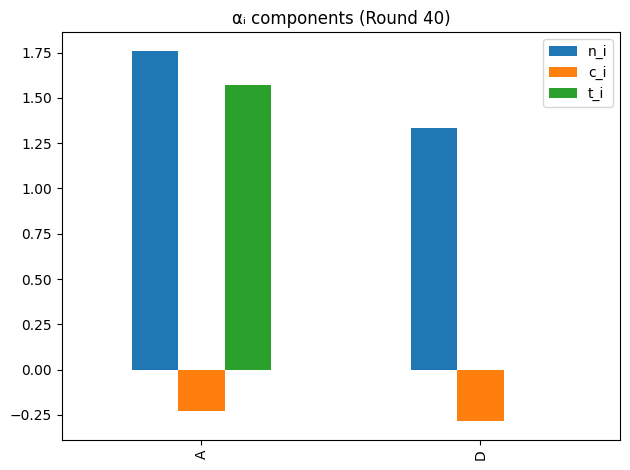

[Client A] Train Acc: 0.7326 | Test Acc: 0.6864


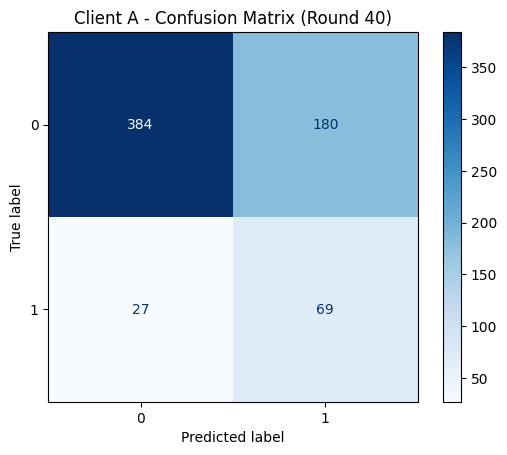

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9343    0.6809    0.7877       564
           1     0.2771    0.7188    0.4000        96

    accuracy                         0.6864       660
   macro avg     0.6057    0.6998    0.5938       660
weighted avg     0.8387    0.6864    0.7313       660

[Client D] Train Acc: 0.6658 | Test Acc: 0.6848


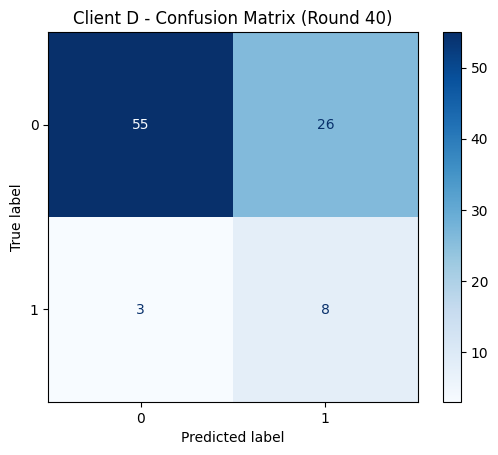

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9483    0.6790    0.7914        81
           1     0.2353    0.7273    0.3556        11

    accuracy                         0.6848        92
   macro avg     0.5918    0.7031    0.5735        92
weighted avg     0.8630    0.6848    0.7393        92


=== Round 41 ===
[Round 41] Global Accuracy: 0.6616 → 0.6894 | ΔW=0.4907

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  38.0
B  23.0217  0.4881   1.0
C  56.9649  0.4840   1.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

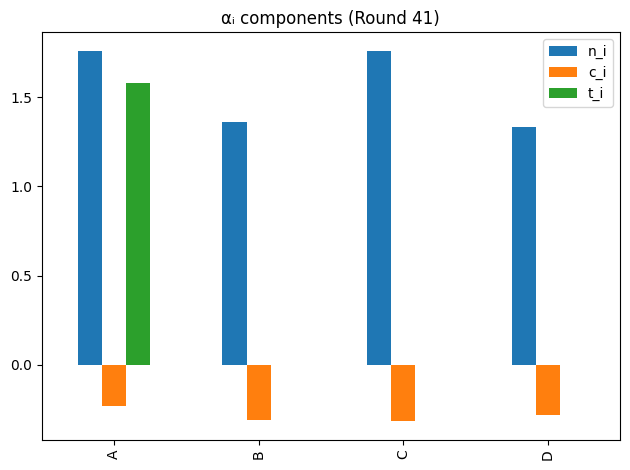

[Client A] Train Acc: 0.7504 | Test Acc: 0.7045


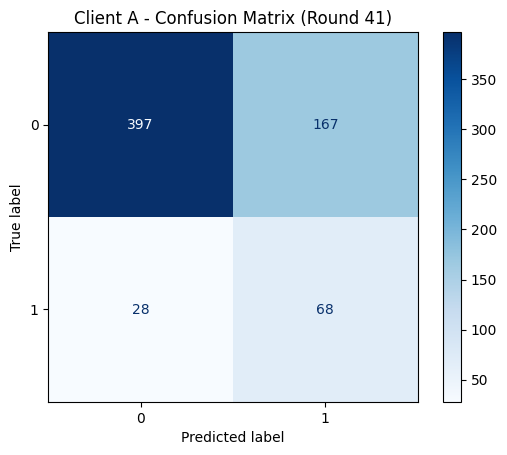

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9341    0.7039    0.8028       564
           1     0.2894    0.7083    0.4109        96

    accuracy                         0.7045       660
   macro avg     0.6117    0.7061    0.6069       660
weighted avg     0.8403    0.7045    0.7458       660

[Client B] Train Acc: 0.7264 | Test Acc: 0.6604


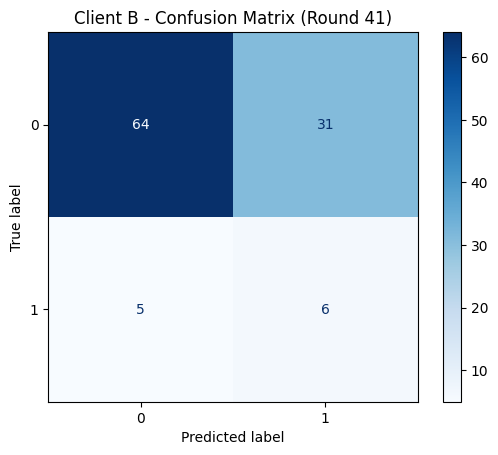

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9275    0.6737    0.7805        95
           1     0.1622    0.5455    0.2500        11

    accuracy                         0.6604       106
   macro avg     0.5448    0.6096    0.5152       106
weighted avg     0.8481    0.6604    0.7254       106

[Client C] Train Acc: 0.6629 | Test Acc: 0.6764


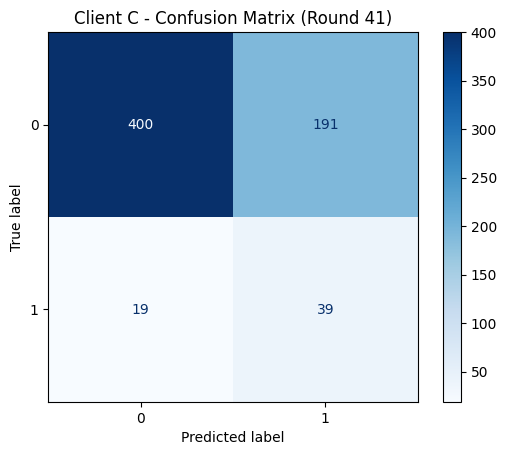

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9547    0.6768    0.7921       591
           1     0.1696    0.6724    0.2708        58

    accuracy                         0.6764       649
   macro avg     0.5621    0.6746    0.5315       649
weighted avg     0.8845    0.6764    0.7455       649

[Client D] Train Acc: 0.7201 | Test Acc: 0.7065


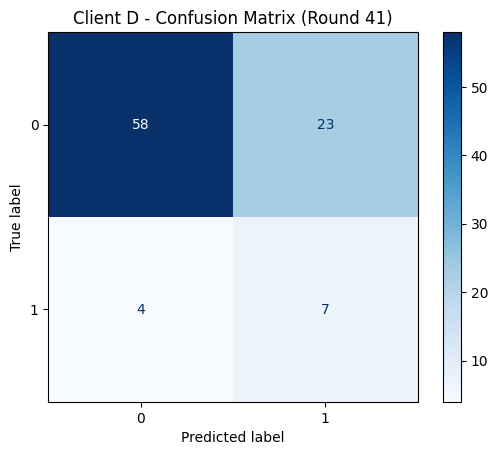

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9355    0.7160    0.8112        81
           1     0.2333    0.6364    0.3415        11

    accuracy                         0.7065        92
   macro avg     0.5844    0.6762    0.5763        92
weighted avg     0.8515    0.7065    0.7550        92


=== Round 42 ===
[Round 42] Global Accuracy: 0.6894 → 0.6682 | ΔW=0.5007

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  39.0


<Figure size 600x400 with 0 Axes>

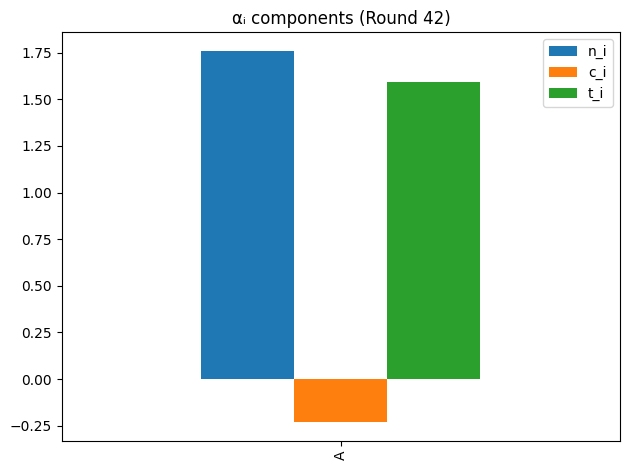

[Client A] Train Acc: 0.7417 | Test Acc: 0.6879


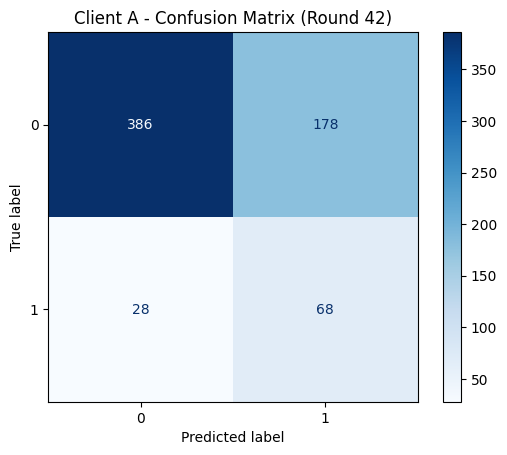

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9324    0.6844    0.7894       564
           1     0.2764    0.7083    0.3977        96

    accuracy                         0.6879       660
   macro avg     0.6044    0.6964    0.5935       660
weighted avg     0.8370    0.6879    0.7324       660


=== Round 43 ===
[Round 43] Global Accuracy: 0.6682 → 0.6669 | ΔW=0.4976

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  40.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

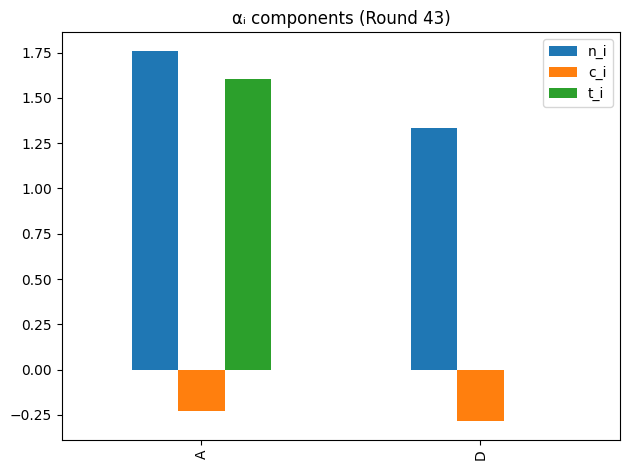

[Client A] Train Acc: 0.7405 | Test Acc: 0.6818


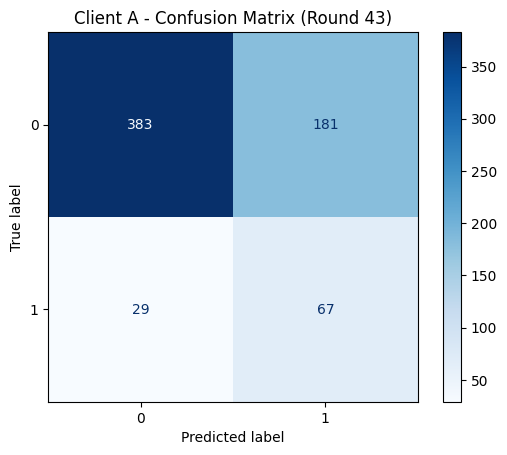

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9296    0.6791    0.7848       564
           1     0.2702    0.6979    0.3895        96

    accuracy                         0.6818       660
   macro avg     0.5999    0.6885    0.5872       660
weighted avg     0.8337    0.6818    0.7273       660

[Client D] Train Acc: 0.6848 | Test Acc: 0.6739


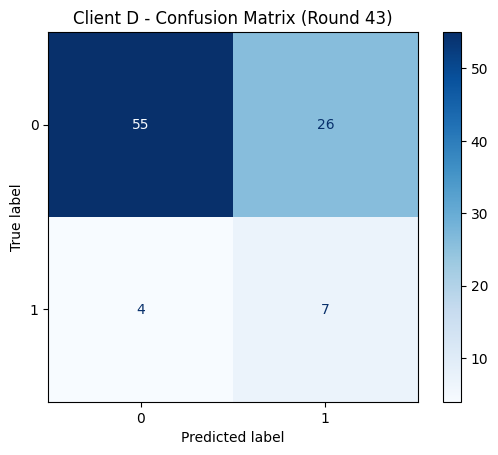

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9322    0.6790    0.7857        81
           1     0.2121    0.6364    0.3182        11

    accuracy                         0.6739        92
   macro avg     0.5722    0.6577    0.5519        92
weighted avg     0.8461    0.6739    0.7298        92


=== Round 44 ===
[Round 44] Global Accuracy: 0.6669 → 0.6894 | ΔW=0.4758

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  41.0
B  23.0217  0.4881   1.0
C  56.9649  0.4840   1.0


<Figure size 600x400 with 0 Axes>

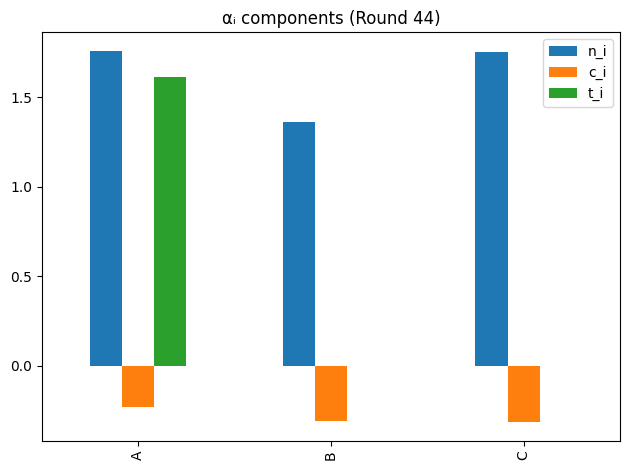

[Client A] Train Acc: 0.7508 | Test Acc: 0.7136


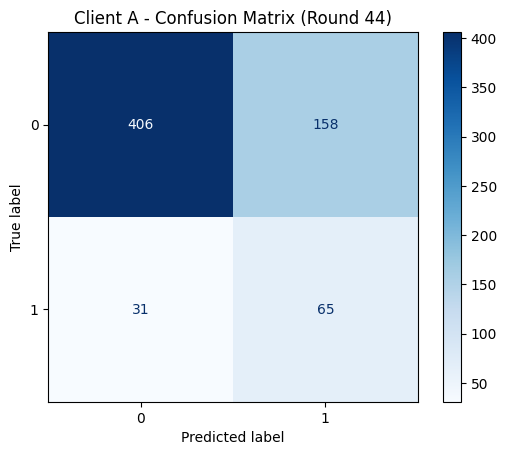

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9291    0.7199    0.8112       564
           1     0.2915    0.6771    0.4075        96

    accuracy                         0.7136       660
   macro avg     0.6103    0.6985    0.6094       660
weighted avg     0.8363    0.7136    0.7525       660

[Client B] Train Acc: 0.7358 | Test Acc: 0.6415


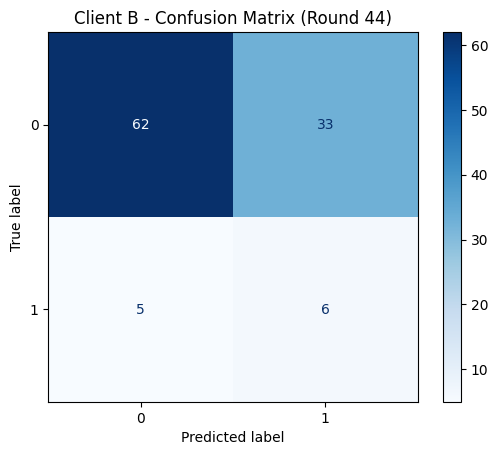

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9254    0.6526    0.7654        95
           1     0.1538    0.5455    0.2400        11

    accuracy                         0.6415       106
   macro avg     0.5396    0.5990    0.5027       106
weighted avg     0.8453    0.6415    0.7109       106

[Client C] Train Acc: 0.6703 | Test Acc: 0.6687


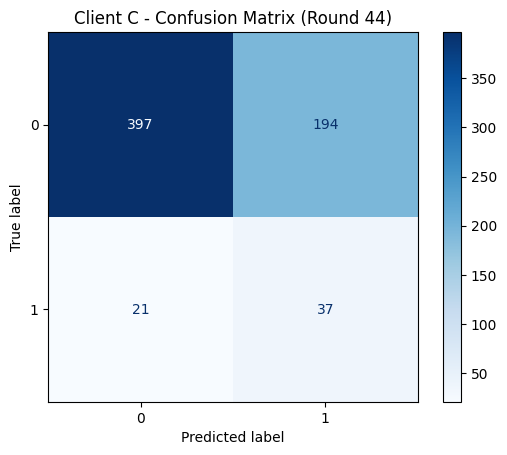

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9498    0.6717    0.7869       591
           1     0.1602    0.6379    0.2561        58

    accuracy                         0.6687       649
   macro avg     0.5550    0.6548    0.5215       649
weighted avg     0.8792    0.6687    0.7395       649


=== Round 45 ===
[Round 45] Global Accuracy: 0.6894 → 0.6888 | ΔW=0.5150

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  42.0
C  56.9649  0.4840   1.0


<Figure size 600x400 with 0 Axes>

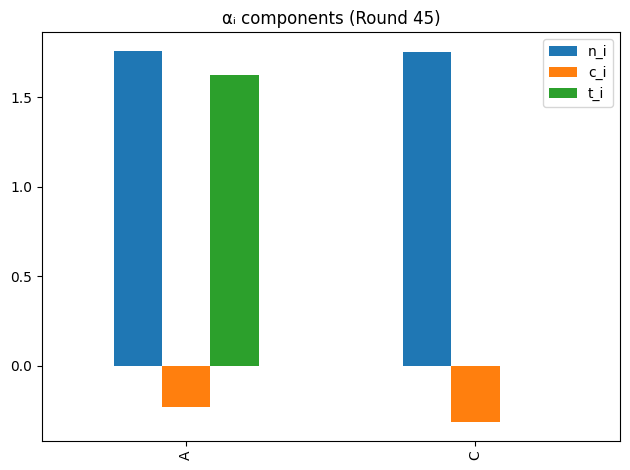

[Client A] Train Acc: 0.7538 | Test Acc: 0.7061


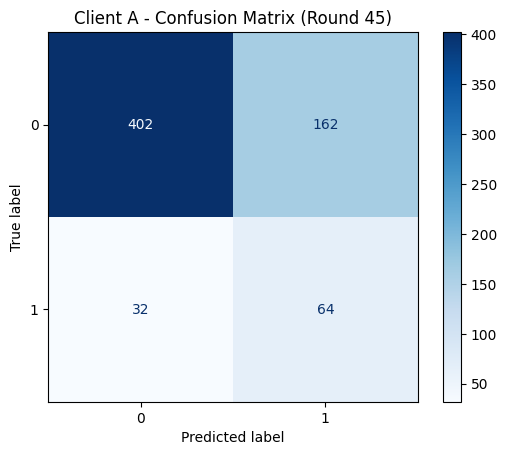

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9263    0.7128    0.8056       564
           1     0.2832    0.6667    0.3975        96

    accuracy                         0.7061       660
   macro avg     0.6047    0.6897    0.6016       660
weighted avg     0.8327    0.7061    0.7463       660

[Client C] Train Acc: 0.6703 | Test Acc: 0.6718


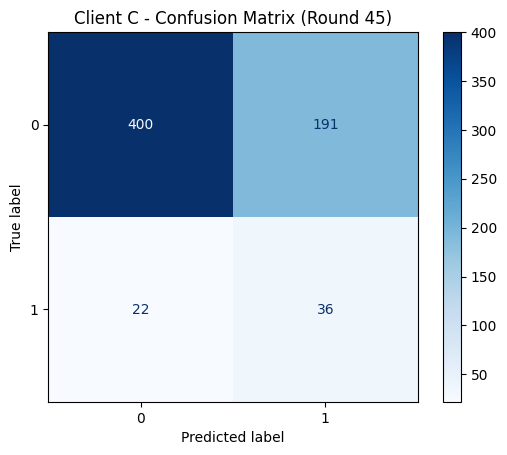

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9479    0.6768    0.7897       591
           1     0.1586    0.6207    0.2526        58

    accuracy                         0.6718       649
   macro avg     0.5532    0.6488    0.5212       649
weighted avg     0.8773    0.6718    0.7417       649


=== Round 46 ===
[Round 46] Global Accuracy: 0.6888 → 0.6145 | ΔW=0.4722

αᵢ 구성요소:
       n_i     c_i  t_i
D  21.4476  0.5202  1.0


<Figure size 600x400 with 0 Axes>

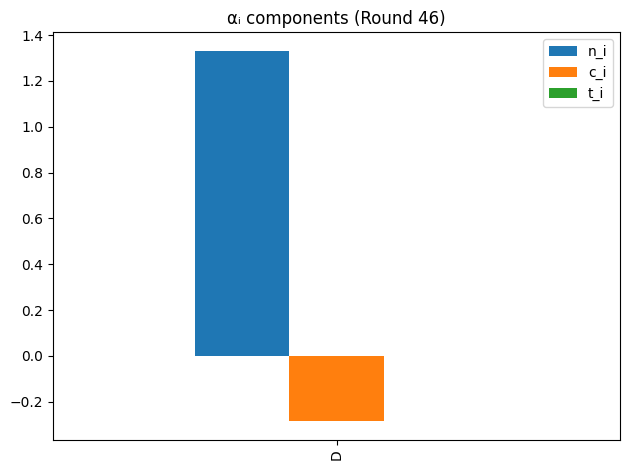

[Client D] Train Acc: 0.6630 | Test Acc: 0.6522


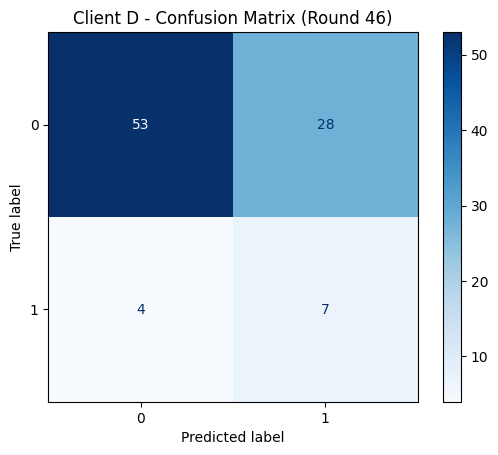

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9298    0.6543    0.7681        81
           1     0.2000    0.6364    0.3043        11

    accuracy                         0.6522        92
   macro avg     0.5649    0.6453    0.5362        92
weighted avg     0.8426    0.6522    0.7127        92


=== Round 47 ===
[Round 47] Global Accuracy: 0.6145 → 0.6423 | ΔW=0.5243

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  43.0
B  23.0217  0.4881   1.0
C  56.9649  0.4840   1.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

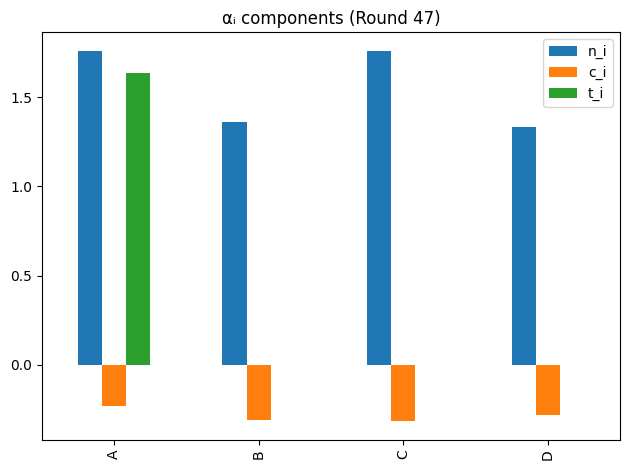

[Client A] Train Acc: 0.7178 | Test Acc: 0.6652


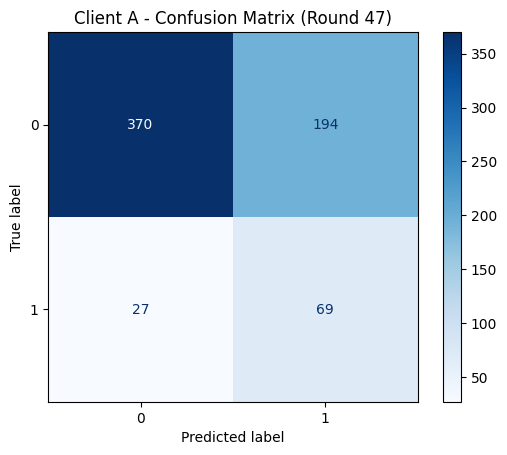

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9320    0.6560    0.7700       564
           1     0.2624    0.7188    0.3844        96

    accuracy                         0.6652       660
   macro avg     0.5972    0.6874    0.5772       660
weighted avg     0.8346    0.6652    0.7139       660

[Client B] Train Acc: 0.7005 | Test Acc: 0.6038


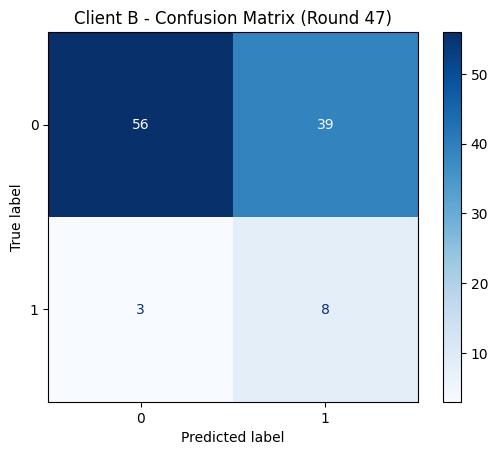

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9492    0.5895    0.7273        95
           1     0.1702    0.7273    0.2759        11

    accuracy                         0.6038       106
   macro avg     0.5597    0.6584    0.5016       106
weighted avg     0.8683    0.6038    0.6804       106

[Client C] Train Acc: 0.6314 | Test Acc: 0.6271


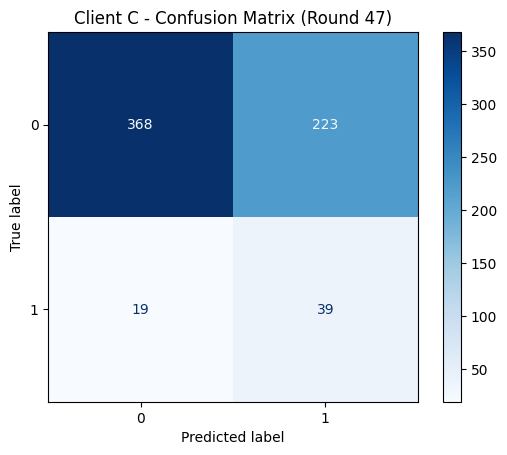

[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9509    0.6227    0.7526       591
           1     0.1489    0.6724    0.2437        58

    accuracy                         0.6271       649
   macro avg     0.5499    0.6475    0.4982       649
weighted avg     0.8792    0.6271    0.7071       649

[Client D] Train Acc: 0.6712 | Test Acc: 0.6304


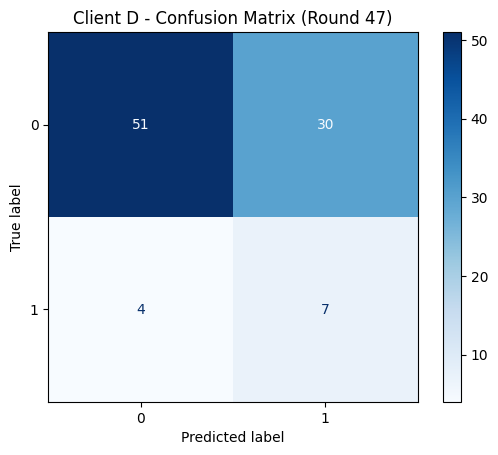

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9273    0.6296    0.7500        81
           1     0.1892    0.6364    0.2917        11

    accuracy                         0.6304        92
   macro avg     0.5582    0.6330    0.5208        92
weighted avg     0.8390    0.6304    0.6952        92


=== Round 48 ===
[Round 48] Global Accuracy: 0.6423 → 0.6749 | ΔW=0.5610

αᵢ 구성요소:
       n_i     c_i  t_i
B  23.0217  0.4881  1.0


<Figure size 600x400 with 0 Axes>

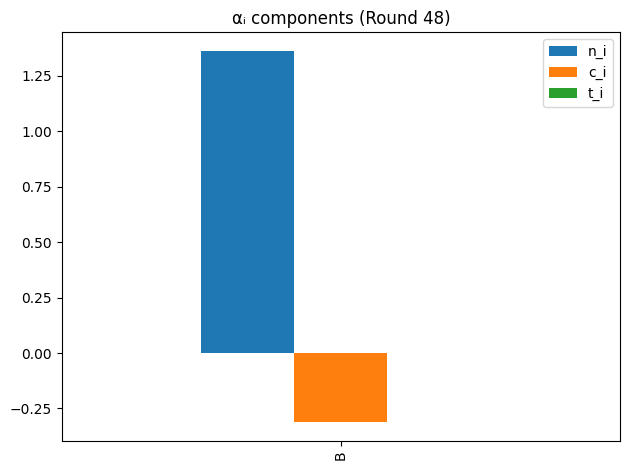

[Client B] Train Acc: 0.7264 | Test Acc: 0.6415


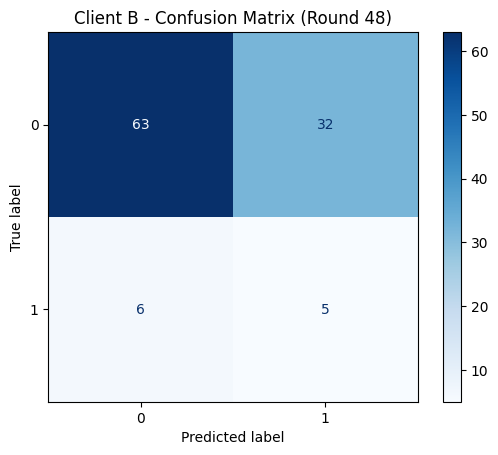

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9130    0.6632    0.7683        95
           1     0.1351    0.4545    0.2083        11

    accuracy                         0.6415       106
   macro avg     0.5241    0.5589    0.4883       106
weighted avg     0.8323    0.6415    0.7102       106


=== Round 49 ===
[Round 49] Global Accuracy: 0.6749 → 0.6576 | ΔW=0.7222

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  44.0
B  23.0217  0.4881   1.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

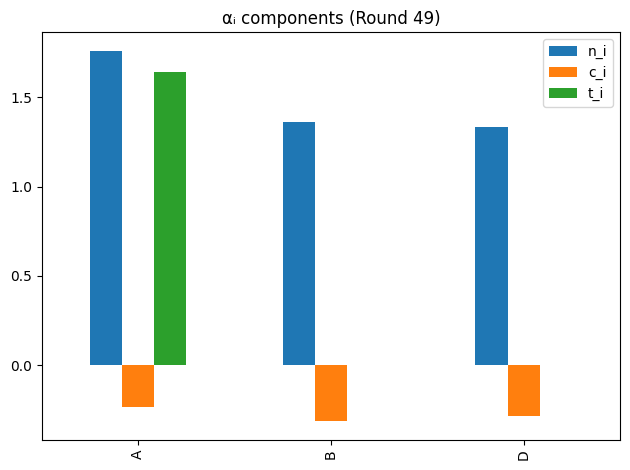

[Client A] Train Acc: 0.7261 | Test Acc: 0.6818


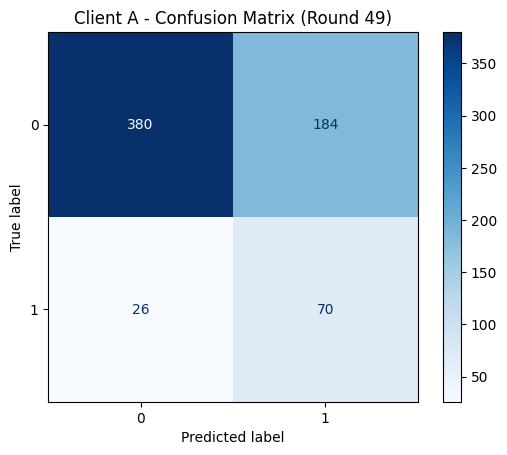

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9360    0.6738    0.7835       564
           1     0.2756    0.7292    0.4000        96

    accuracy                         0.6818       660
   macro avg     0.6058    0.7015    0.5918       660
weighted avg     0.8399    0.6818    0.7277       660

[Client B] Train Acc: 0.7123 | Test Acc: 0.6132


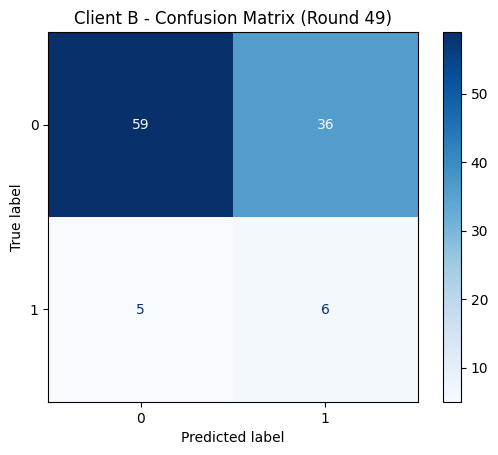

[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9219    0.6211    0.7421        95
           1     0.1429    0.5455    0.2264        11

    accuracy                         0.6132       106
   macro avg     0.5324    0.5833    0.4843       106
weighted avg     0.8410    0.6132    0.6886       106

[Client D] Train Acc: 0.6739 | Test Acc: 0.6739


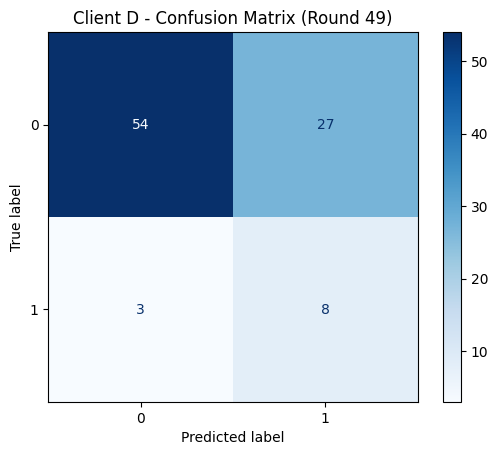

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9474    0.6667    0.7826        81
           1     0.2286    0.7273    0.3478        11

    accuracy                         0.6739        92
   macro avg     0.5880    0.6970    0.5652        92
weighted avg     0.8614    0.6739    0.7306        92


=== Round 50 ===
[Round 50] Global Accuracy: 0.6576 → 0.6510 | ΔW=0.7171

αᵢ 구성요소:
       n_i     c_i   t_i
A  57.4456  0.5876  45.0
D  21.4476  0.5202   1.0


<Figure size 600x400 with 0 Axes>

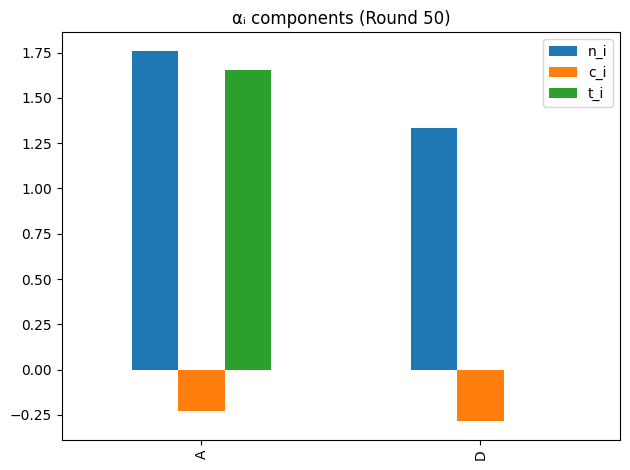

[Client A] Train Acc: 0.7265 | Test Acc: 0.6652


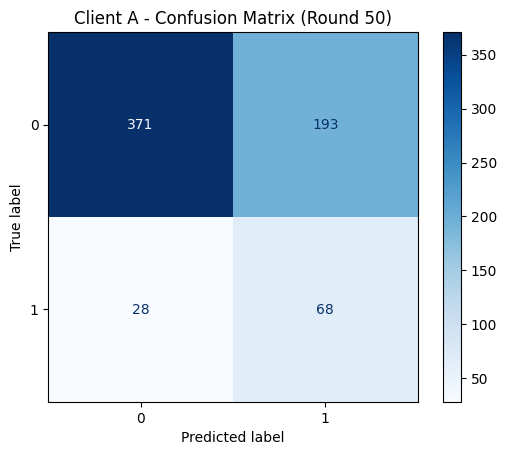

[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9298    0.6578    0.7705       564
           1     0.2605    0.7083    0.3810        96

    accuracy                         0.6652       660
   macro avg     0.5952    0.6831    0.5757       660
weighted avg     0.8325    0.6652    0.7138       660

[Client D] Train Acc: 0.6685 | Test Acc: 0.6630


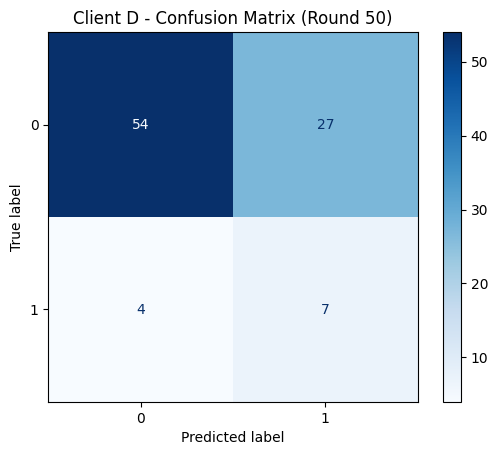

[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9310    0.6667    0.7770        81
           1     0.2059    0.6364    0.3111        11

    accuracy                         0.6630        92
   macro avg     0.5685    0.6515    0.5440        92
weighted avg     0.8443    0.6630    0.7213        92



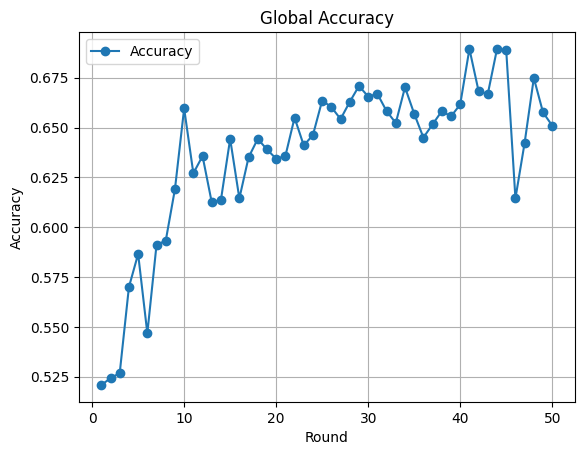

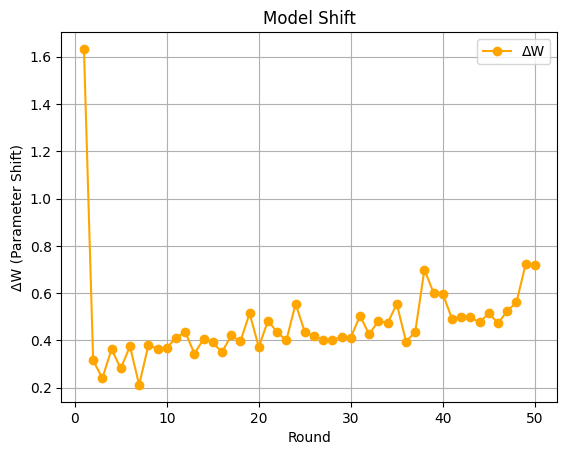

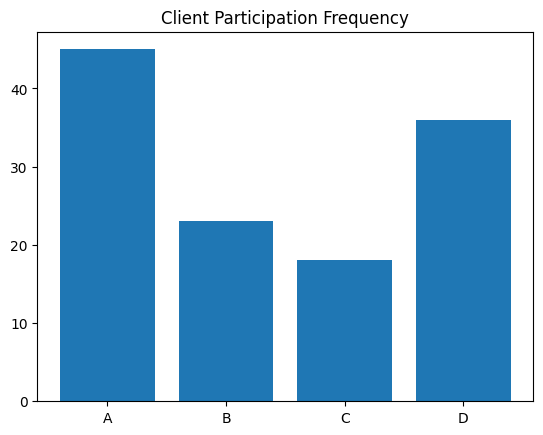

In [ ]:
import os, math, copy, random, argparse
import pandas as pd
import numpy as np
import torch
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset, random_split
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

DEFECT_LABELS = ['Short_Shot_1','Bubble_1','Exfoliation_1','Blow_Hole_1','Deformation_1']
SMOTE_CLIENTS = {"B", "C", "D"}  # SMOTE 적용된 클라이언트 집합

def load_excel_binary(path: str):
    df = pd.read_excel(path).dropna(axis=1, how='all')
    for col in DEFECT_LABELS:
        if col not in df.columns:
            df[col] = 0
    y = df[DEFECT_LABELS].sum(axis=1).clip(upper=1).astype(int).values
    X = df.drop(columns=DEFECT_LABELS, errors='ignore')
    X = X.select_dtypes(include=[np.number]).replace([np.inf, -np.inf], np.nan).fillna(0.0)
    return X, y

def build_clients(path_map):
    raw = {}
    for cid, path in path_map.items():
        X, y = load_excel_binary(path)
        raw[cid] = {"X": X, "y": y}
    cols = set.intersection(*[set(v["X"].columns) for v in raw.values()])
    clients, metas = {}, {}
    for cid, v in raw.items():
        feat = v["X"][list(cols)].copy()
        mu, sigma = feat.mean(), feat.std().replace(0, 1)
        feat = (feat - mu) / sigma
        X = torch.tensor(feat.values.astype(np.float32))
        y = torch.tensor(v["y"], dtype=torch.long)
        allset = TensorDataset(X, y)
        n = len(allset)
        n_train = int(0.8 * n)
        n_test = n - n_train
        tr, te = random_split(allset, [n_train, n_test], generator=torch.Generator().manual_seed(42))
        clients[cid] = {"train": tr, "test": te, "all": allset}
        metas[cid] = {"n_samples": len(y), "class_counts": pd.Series(v["y"]).value_counts().to_dict()}
    return clients, metas, list(cols)

class DeepMLP(nn.Module):
    def __init__(self, input_dim, num_classes=2):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, num_classes)
        )
    def forward(self, x):
        return self.net(x)

def compute_ci(class_counts, eps_frac=0.05, min_samples=1):
    K = len(class_counts)
    total = sum(class_counts.values())
    if K == 0 or total == 0:
        return 1e-8
    H = -sum((c / total) * math.log(c / total) for c in class_counts.values() if c > 0)
    logK = math.log(K + 1e-12)
    H_tilde = max(H, eps_frac * logK)
    k_i = sum(1 for c in class_counts.values() if c >= min_samples)
    return max(1e-8, (k_i / K) * (H_tilde / logK))

def compute_alpha_components(metas, class_counts, cid, participation_log):
    n_i = math.sqrt(metas[cid]["n_samples"])
    c_i = compute_ci(class_counts)
    t_i = 1.0 if cid in SMOTE_CLIENTS else participation_log[cid] + 1e-8
    return {"n_i": n_i, "c_i": c_i, "t_i": t_i}

def aggregate_with_softmax_weights(state_dicts, alpha_components, rho=0.5, beta=1.0, theta=1.0):
    if not state_dicts: return None
    logits = {
        cid: math.log(comp["n_i"] ** rho + 1e-12)
           + math.log(comp["c_i"] ** beta + 1e-12)
           + math.log(comp["t_i"] ** theta + 1e-12)
        for cid, comp in alpha_components.items()
    }
    max_logit = max(logits.values())
    exp_logits = {cid: math.exp(v - max_logit) for cid, v in logits.items()}
    total_exp = sum(exp_logits.values())
    alphas = {cid: v / total_exp for cid, v in exp_logits.items()}
    global_sd = None
    for cid, sd in state_dicts.items():
        w = alphas[cid]
        if global_sd is None:
            global_sd = {k: v.clone() * w for k, v in sd.items()}
        else:
            for k in global_sd:
                global_sd[k] += sd[k] * w
    return global_sd

def local_train_fedprox(model, dataset, lr, epochs, device, class_counts, mu, global_weights):
    model = copy.deepcopy(model).to(device)
    model.train()
    total = sum(class_counts.values())
    w_0 = total / (2 * class_counts.get(0, 1))
    w_1 = total / (2 * class_counts.get(1, 1))
    class_weights = torch.tensor([w_0, w_1], dtype=torch.float32).to(device)
    crit = nn.CrossEntropyLoss(weight=class_weights)
    opt = optim.Adam(model.parameters(), lr=lr)
    loader = DataLoader(dataset, batch_size=64, shuffle=True)

    for _ in range(epochs):
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            opt.zero_grad()
            output = model(x)
            loss = crit(output, y)
            prox_term = 0.0
            for name, param in model.named_parameters():
                prox_term += ((param - global_weights[name].to(device))**2).sum()
            loss += (mu / 2) * prox_term
            loss.backward()
            opt.step()

    return model.state_dict()

def evaluate(model, dataset, device, return_preds=False):
    model.eval()
    loader = DataLoader(dataset, batch_size=256)
    correct, total = 0, 0
    y_true, y_pred = [], []
    with torch.no_grad():
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            pred = model(x).argmax(1)
            correct += pred.eq(y).sum().item()
            total += len(y)
            if return_preds:
                y_true += y.cpu().tolist()
                y_pred += pred.cpu().tolist()
    acc = correct / total if total > 0 else 0.0
    return (acc, y_true, y_pred) if return_preds else acc

# ---------------------- MAIN ----------------------
if __name__ == "__main__":
    parser = argparse.ArgumentParser()
    parser.add_argument("--rounds", type=int, default=50)
    args, _ = parser.parse_known_args()

    paths = {"A": "A.xlsx", "B": "B.xlsx", "C": "C.xlsx", "D": "D.xlsx"}
    clients, metas, cols = build_clients(paths)
    device = "cuda" if torch.cuda.is_available() else "cpu"
    input_dim = clients["A"]["all"].tensors[0].shape[1]
    global_model = DeepMLP(input_dim=input_dim).to(device)

    participation_probs = {"A": 0.9, "D": 0.7, "B": 0.4, "C": 0.4}
    participation_log = {cid: 0 for cid in clients}
    combined_test = torch.utils.data.ConcatDataset([v["test"] for v in clients.values()])
    prev_global = copy.deepcopy(global_model.state_dict())
    round_log = {"round": [], "acc": [], "dW": []}

    for rnd in range(1, args.rounds + 1):
        print(f"\n=== Round {rnd} ===")
        selected = [cid for cid in clients if random.random() < participation_probs[cid]]
        if not selected:
            selected = [random.choice(list(clients.keys()))]

        for cid in selected:
            participation_log[cid] += 1

        state_dicts, alpha_components = {}, {}
        before_acc = evaluate(global_model, combined_test, device)

        for cid in selected:
            ds = clients[cid]["train"]
            labels = [int(y) for _, y in ds]
            class_counts = pd.Series(labels).value_counts().to_dict()
            alpha_components[cid] = compute_alpha_components(metas, class_counts, cid, participation_log)

            state_dict = local_train_fedprox(
                global_model, ds, lr=0.001, epochs=5,
                device=device, class_counts=class_counts,
                mu=0.01, global_weights=global_model.state_dict()
            )
            state_dicts[cid] = state_dict

        new_global = aggregate_with_softmax_weights(state_dicts, alpha_components)
        if new_global is None:
            continue
        global_model.load_state_dict(new_global)

        after_acc, y_true, y_pred = evaluate(global_model, combined_test, device, return_preds=True)
        dW = np.mean([
            torch.norm(global_model.state_dict()[k] - prev_global[k]).item()
            for k in global_model.state_dict()
            if global_model.state_dict()[k].dtype in (torch.float32, torch.float64)
        ])
        prev_global = copy.deepcopy(global_model.state_dict())

        print(f"[Round {rnd}] Global Accuracy: {before_acc:.4f} → {after_acc:.4f} | ΔW={dW:.4f}")
        round_log["round"].append(rnd)
        round_log["acc"].append(after_acc)
        round_log["dW"].append(dW)

        df = pd.DataFrame(alpha_components).T.round(4)
        print("\nαᵢ 구성요소:")
        print(df)
        plt.figure(figsize=(6, 4))
        np.log10(df + 1e-8).plot(kind="bar")
        plt.title(f"αᵢ components (Round {rnd})")
        plt.tight_layout()
        plt.show()

        for cid in selected:
            train_acc = evaluate(global_model, clients[cid]["train"], device)
            test_acc, yt, yp = evaluate(global_model, clients[cid]["test"], device, return_preds=True)
            print(f"[Client {cid}] Train Acc: {train_acc:.4f} | Test Acc: {test_acc:.4f}")
            cm = confusion_matrix(yt, yp)
            ConfusionMatrixDisplay(confusion_matrix=cm).plot(cmap="Blues")
            plt.title(f"Client {cid} - Confusion Matrix (Round {rnd})")
            plt.show()
            print(f"[Client {cid}] Classification Report:")
            print(classification_report(yt, yp, digits=4))

    plt.plot(round_log["round"], round_log["acc"], marker="o", label="Accuracy")
    plt.xlabel("Round")
    plt.ylabel("Accuracy")
    plt.title("Global Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()

    plt.plot(round_log["round"], round_log["dW"], marker="o", color="orange", label="ΔW")
    plt.xlabel("Round")
    plt.ylabel("ΔW (Parameter Shift)")
    plt.title("Model Shift")
    plt.grid(True)
    plt.legend()
    plt.show()

    plt.bar(participation_log.keys(), participation_log.values())
    plt.title("Client Participation Frequency")
    plt.show()


#실험(2)
개선 요약
| 개선 항목                 | 내용                               | 반영 방식             |
| --------------------- | -------------------------------- | ----------------- |
| **1. αᵢ 안정화**         | `tᵢ`의 영향 과도 → `θ`값 축소 (e.g. 0.3) | `theta = 0.3` 적용  |
| **2. tᵢ log-scaling** | participation skew 보정            | `log(tᵢ + 1)` 사용  |
| **3. αᵢ 클리핑**         | 과도한 αᵢ 지배 방지                     | `max logit 차이 제한` |
| **4. 전체 정확도 유지**      | precision-recall tradeoff 조절     | 정확도 추적 로깅 유지      |
| ❗ **고정 조건 준수**        | 참여 확률, 지수 범위 제한, 정확도 저하 방지       | ✅ 모두 반영           |



=== Round 1 ===
[Round 1] Global Accuracy: 0.8757 → 0.5940 | ΔW=1.6750

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

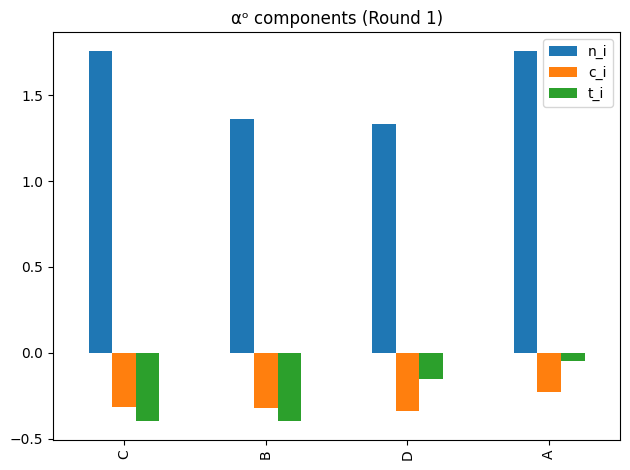

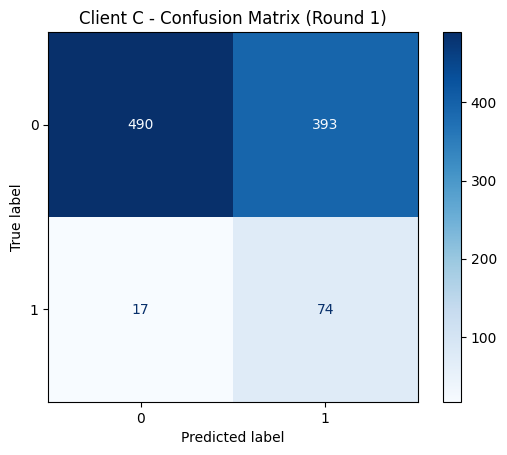


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9665    0.5549    0.7050       883
           1     0.1585    0.8132    0.2652        91

    accuracy                         0.5791       974
   macro avg     0.5625    0.6841    0.4851       974
weighted avg     0.8910    0.5791    0.6639       974



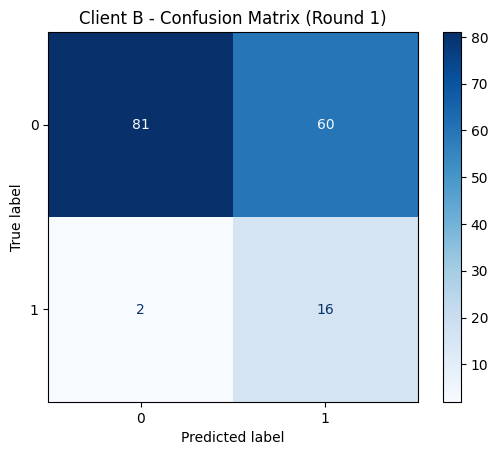


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9759    0.5745    0.7232       141
           1     0.2105    0.8889    0.3404        18

    accuracy                         0.6101       159
   macro avg     0.5932    0.7317    0.5318       159
weighted avg     0.8893    0.6101    0.6799       159



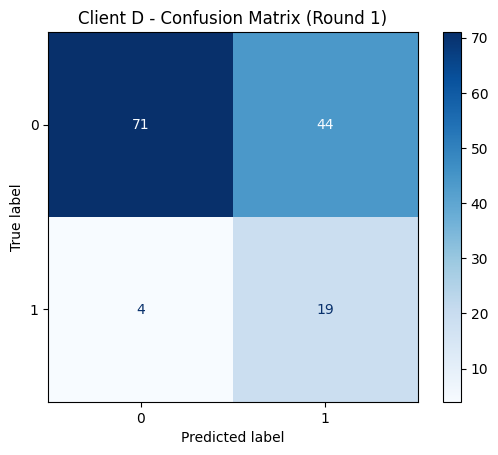


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9467    0.6174    0.7474       115
           1     0.3016    0.8261    0.4419        23

    accuracy                         0.6522       138
   macro avg     0.6241    0.7217    0.5946       138
weighted avg     0.8392    0.6522    0.6965       138



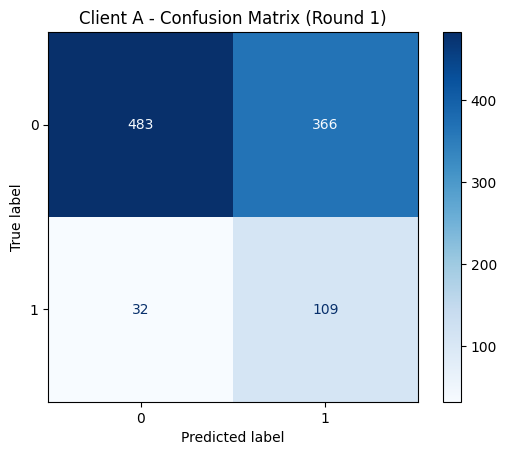


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9379    0.5689    0.7082       849
           1     0.2295    0.7730    0.3539       141

    accuracy                         0.5980       990
   macro avg     0.5837    0.6710    0.5311       990
weighted avg     0.8370    0.5980    0.6577       990


=== Round 2 ===
[Round 2] Global Accuracy: 0.5940 → 0.5759 | ΔW=0.2985

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

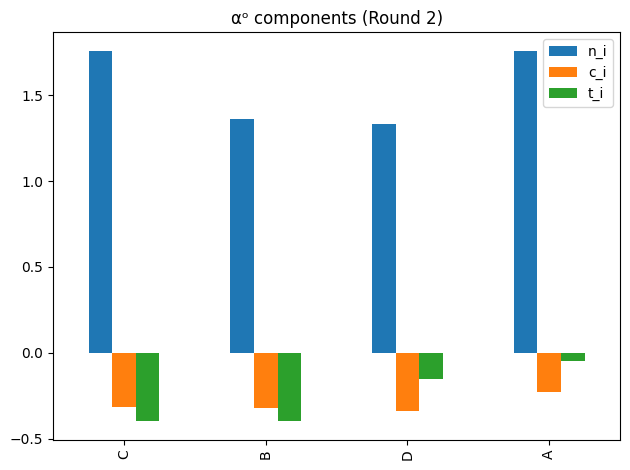

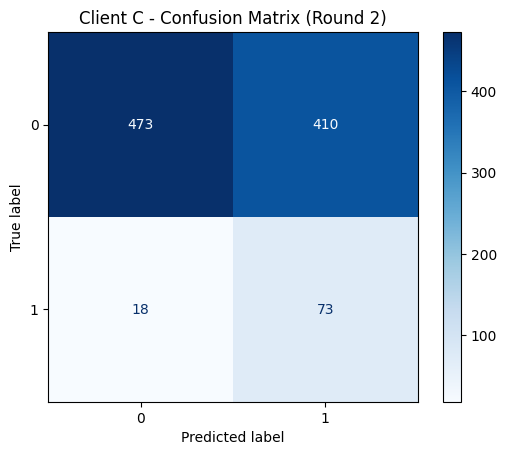


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9633    0.5357    0.6885       883
           1     0.1511    0.8022    0.2544        91

    accuracy                         0.5606       974
   macro avg     0.5572    0.6689    0.4714       974
weighted avg     0.8875    0.5606    0.6479       974



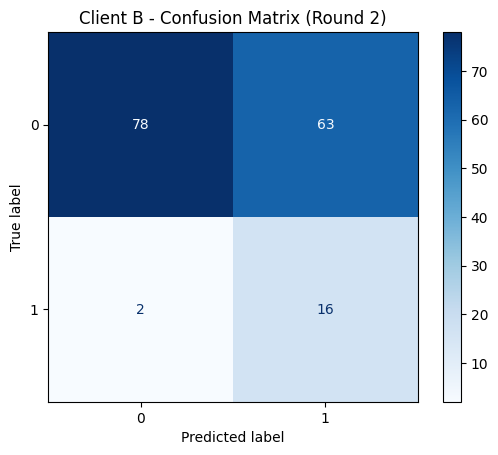


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9750    0.5532    0.7059       141
           1     0.2025    0.8889    0.3299        18

    accuracy                         0.5912       159
   macro avg     0.5888    0.7210    0.5179       159
weighted avg     0.8876    0.5912    0.6633       159



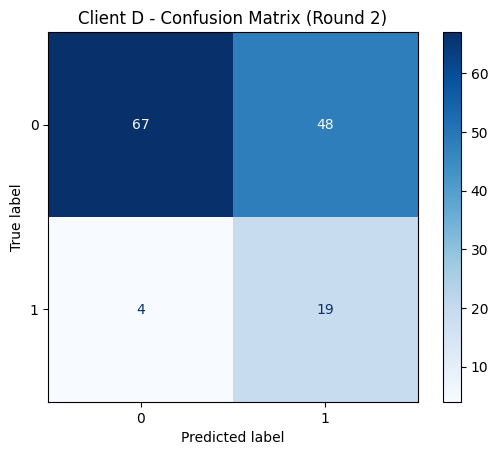


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9437    0.5826    0.7204       115
           1     0.2836    0.8261    0.4222        23

    accuracy                         0.6232       138
   macro avg     0.6136    0.7043    0.5713       138
weighted avg     0.8336    0.6232    0.6707       138



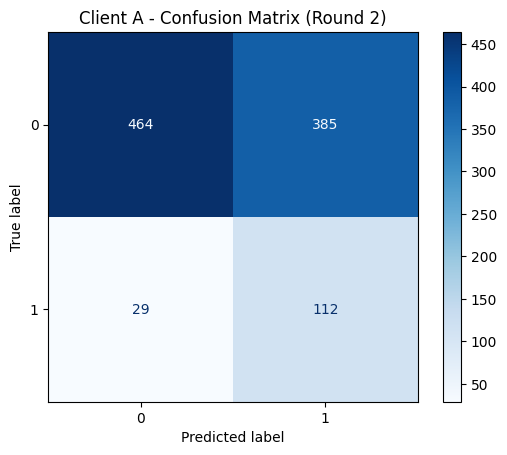


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9412    0.5465    0.6915       849
           1     0.2254    0.7943    0.3511       141

    accuracy                         0.5818       990
   macro avg     0.5833    0.6704    0.5213       990
weighted avg     0.8392    0.5818    0.6430       990


=== Round 3 ===
[Round 3] Global Accuracy: 0.5759 → 0.6280 | ΔW=0.2641

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

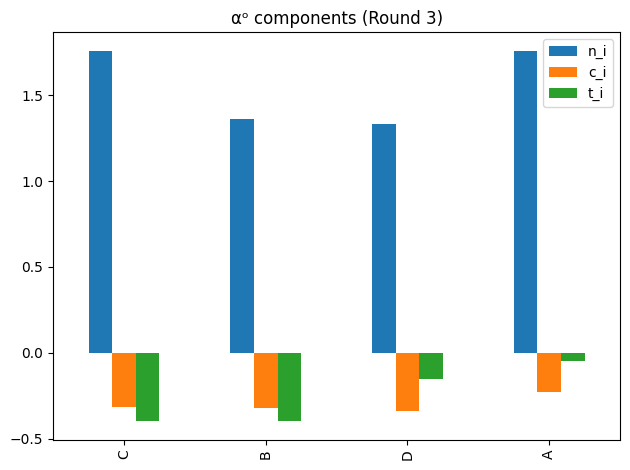

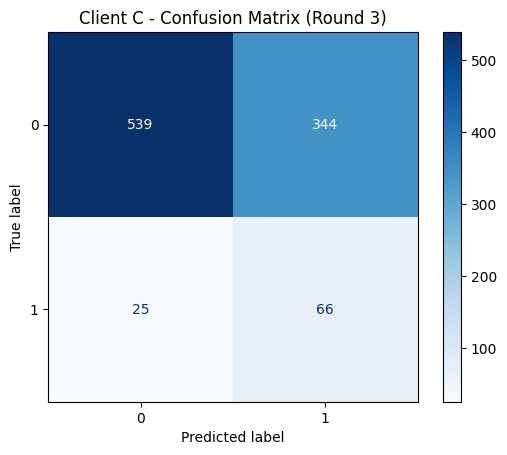


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9557    0.6104    0.7450       883
           1     0.1610    0.7253    0.2635        91

    accuracy                         0.6211       974
   macro avg     0.5583    0.6678    0.5042       974
weighted avg     0.8814    0.6211    0.7000       974



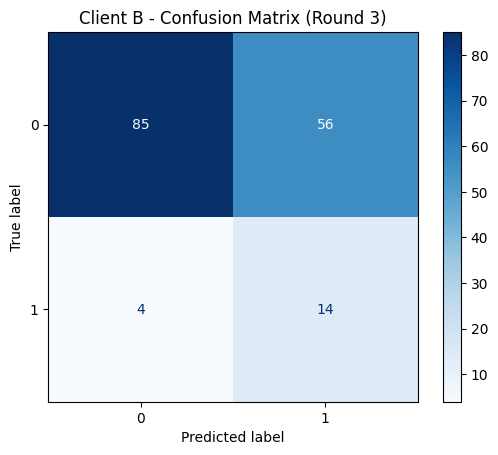


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9551    0.6028    0.7391       141
           1     0.2000    0.7778    0.3182        18

    accuracy                         0.6226       159
   macro avg     0.5775    0.6903    0.5287       159
weighted avg     0.8696    0.6226    0.6915       159



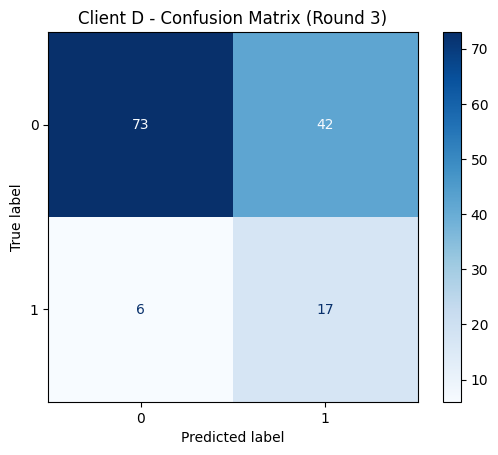


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9241    0.6348    0.7526       115
           1     0.2881    0.7391    0.4146        23

    accuracy                         0.6522       138
   macro avg     0.6061    0.6870    0.5836       138
weighted avg     0.8181    0.6522    0.6963       138



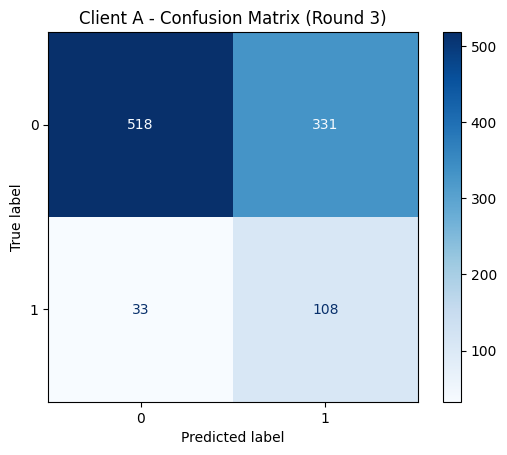


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9401    0.6101    0.7400       849
           1     0.2460    0.7660    0.3724       141

    accuracy                         0.6323       990
   macro avg     0.5931    0.6880    0.5562       990
weighted avg     0.8413    0.6323    0.6876       990


=== Round 4 ===
[Round 4] Global Accuracy: 0.6280 → 0.5882 | ΔW=0.3136

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

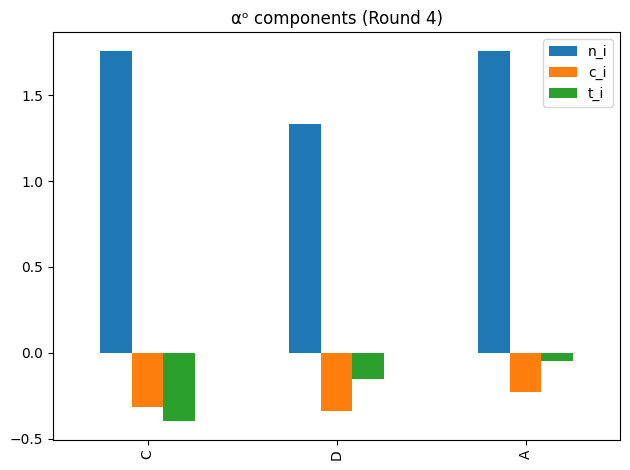

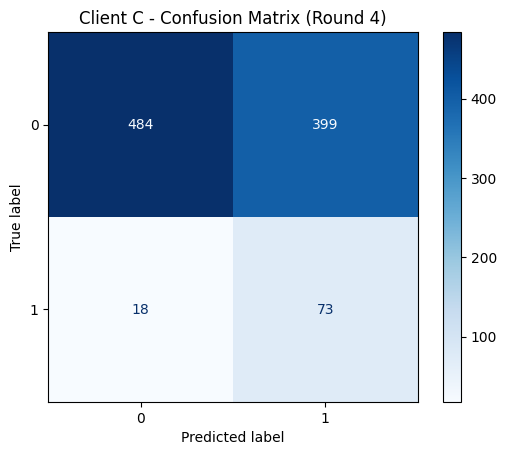


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9641    0.5481    0.6989       883
           1     0.1547    0.8022    0.2593        91

    accuracy                         0.5719       974
   macro avg     0.5594    0.6752    0.4791       974
weighted avg     0.8885    0.5719    0.6578       974



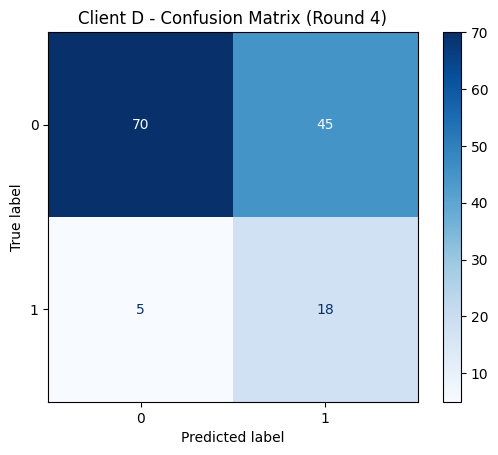


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9333    0.6087    0.7368       115
           1     0.2857    0.7826    0.4186        23

    accuracy                         0.6377       138
   macro avg     0.6095    0.6957    0.5777       138
weighted avg     0.8254    0.6377    0.6838       138



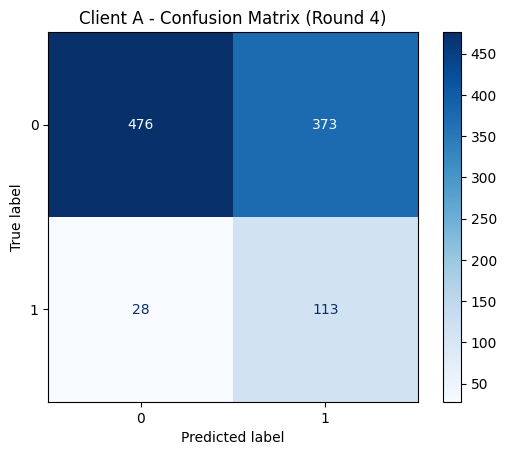


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9444    0.5607    0.7036       849
           1     0.2325    0.8014    0.3604       141

    accuracy                         0.5949       990
   macro avg     0.5885    0.6810    0.5320       990
weighted avg     0.8430    0.5949    0.6547       990


=== Round 5 ===
[Round 5] Global Accuracy: 0.5882 → 0.6316 | ΔW=0.2689

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

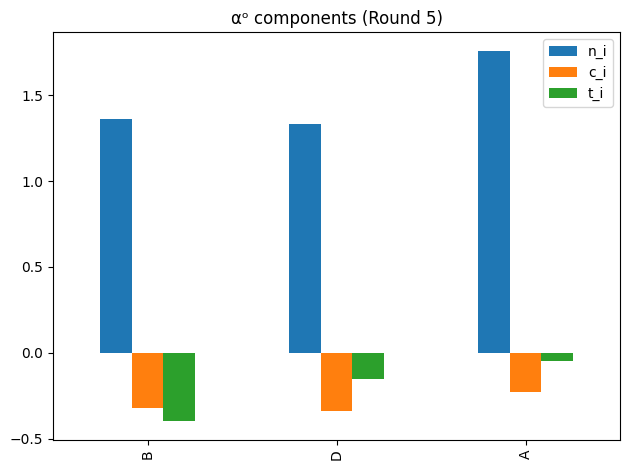

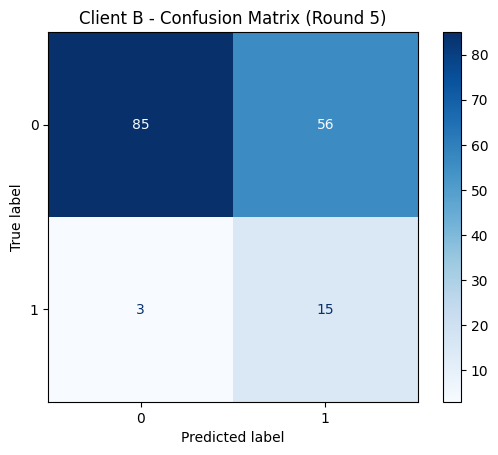


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9659    0.6028    0.7424       141
           1     0.2113    0.8333    0.3371        18

    accuracy                         0.6289       159
   macro avg     0.5886    0.7181    0.5397       159
weighted avg     0.8805    0.6289    0.6965       159



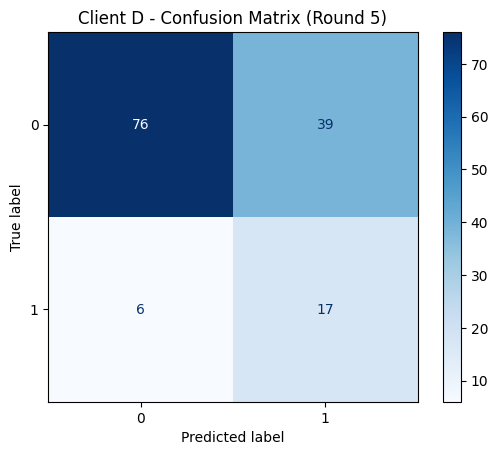


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9268    0.6609    0.7716       115
           1     0.3036    0.7391    0.4304        23

    accuracy                         0.6739       138
   macro avg     0.6152    0.7000    0.6010       138
weighted avg     0.8230    0.6739    0.7147       138



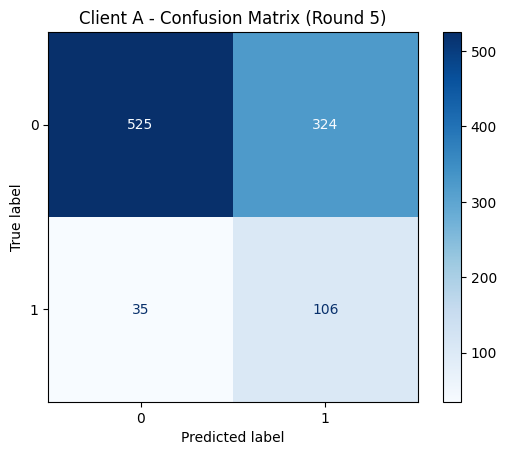


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9375    0.6184    0.7452       849
           1     0.2465    0.7518    0.3713       141

    accuracy                         0.6374       990
   macro avg     0.5920    0.6851    0.5582       990
weighted avg     0.8391    0.6374    0.6920       990


=== Round 6 ===
[Round 6] Global Accuracy: 0.6316 → 0.5953 | ΔW=0.3482

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

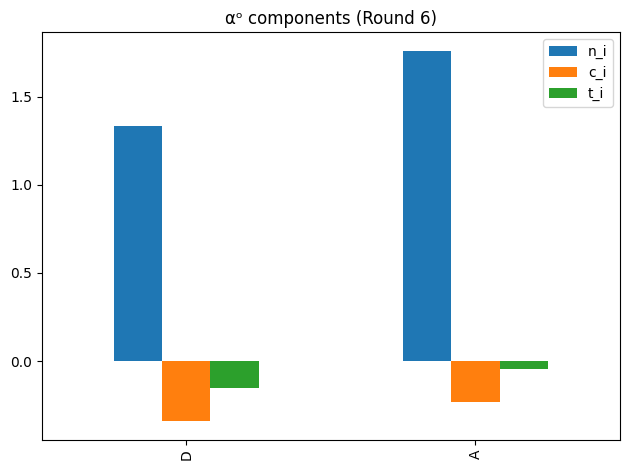

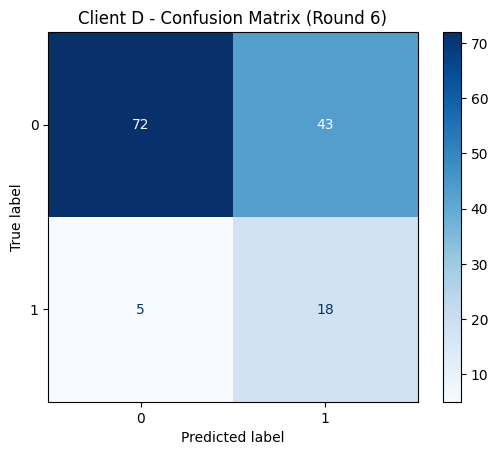


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9351    0.6261    0.7500       115
           1     0.2951    0.7826    0.4286        23

    accuracy                         0.6522       138
   macro avg     0.6151    0.7043    0.5893       138
weighted avg     0.8284    0.6522    0.6964       138



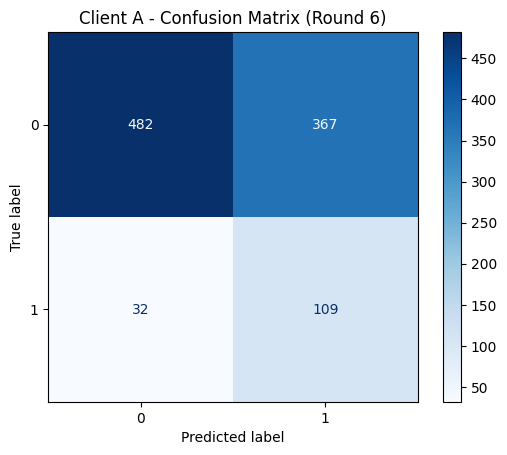


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9377    0.5677    0.7073       849
           1     0.2290    0.7730    0.3533       141

    accuracy                         0.5970       990
   macro avg     0.5834    0.6704    0.5303       990
weighted avg     0.8368    0.5970    0.6569       990


=== Round 7 ===
[Round 7] Global Accuracy: 0.5953 → 0.6157 | ΔW=0.2645

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

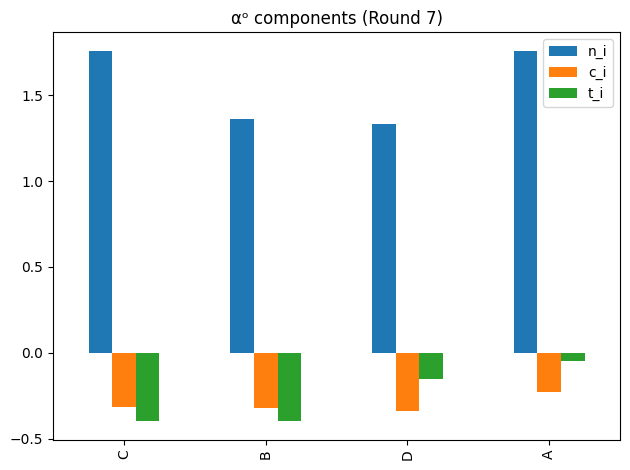

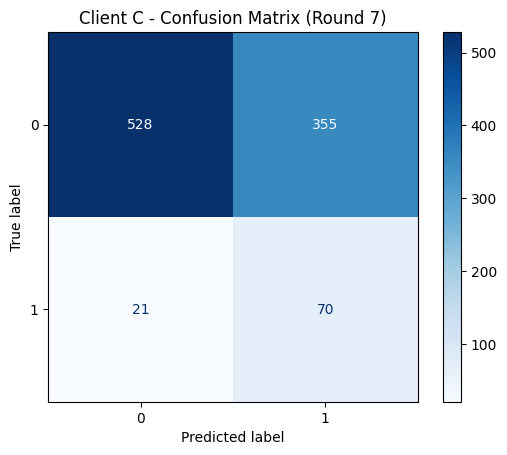


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9617    0.5980    0.7374       883
           1     0.1647    0.7692    0.2713        91

    accuracy                         0.6140       974
   macro avg     0.5632    0.6836    0.5044       974
weighted avg     0.8873    0.6140    0.6939       974



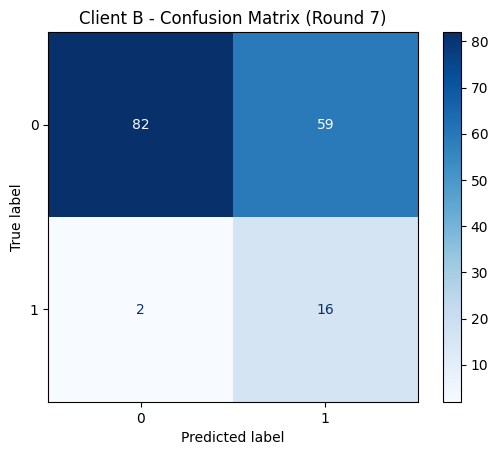


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9762    0.5816    0.7289       141
           1     0.2133    0.8889    0.3441        18

    accuracy                         0.6164       159
   macro avg     0.5948    0.7352    0.5365       159
weighted avg     0.8898    0.6164    0.6853       159



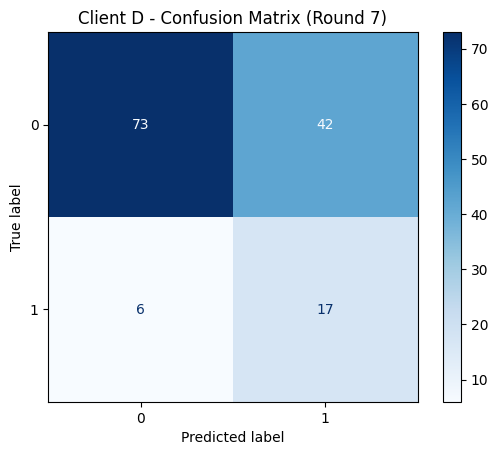


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9241    0.6348    0.7526       115
           1     0.2881    0.7391    0.4146        23

    accuracy                         0.6522       138
   macro avg     0.6061    0.6870    0.5836       138
weighted avg     0.8181    0.6522    0.6963       138



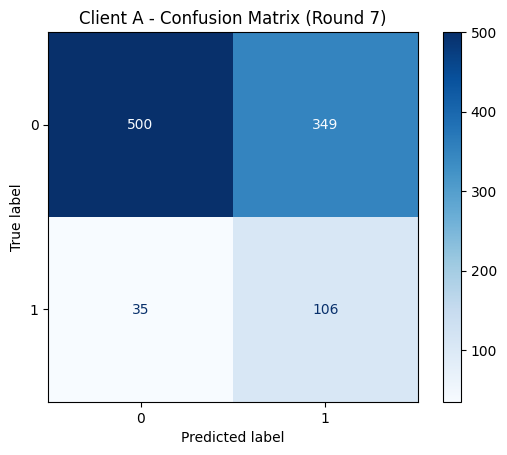


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9346    0.5889    0.7225       849
           1     0.2330    0.7518    0.3557       141

    accuracy                         0.6121       990
   macro avg     0.5838    0.6704    0.5391       990
weighted avg     0.8347    0.6121    0.6703       990


=== Round 8 ===
[Round 8] Global Accuracy: 0.6157 → 0.6103 | ΔW=0.2685

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

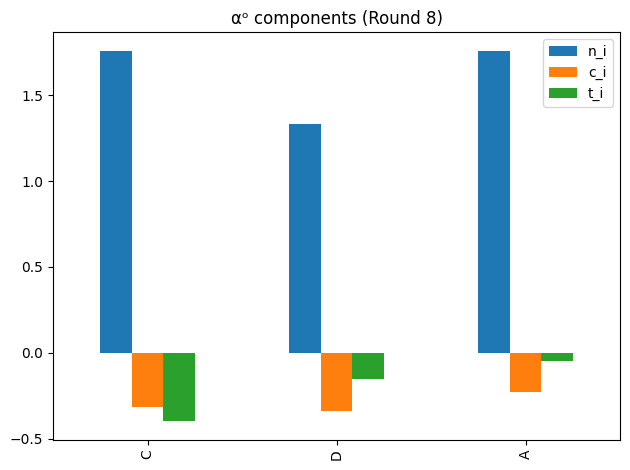

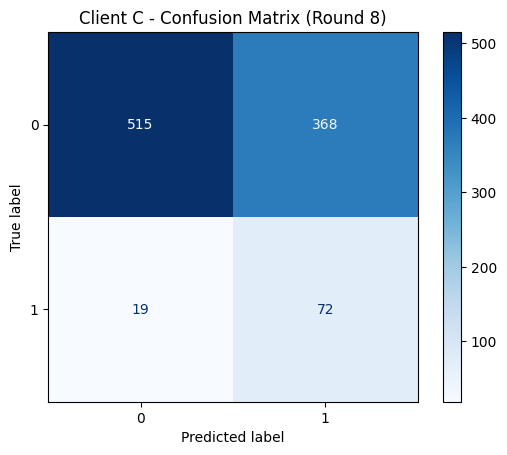


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9644    0.5832    0.7269       883
           1     0.1636    0.7912    0.2712        91

    accuracy                         0.6027       974
   macro avg     0.5640    0.6872    0.4990       974
weighted avg     0.8896    0.6027    0.6843       974



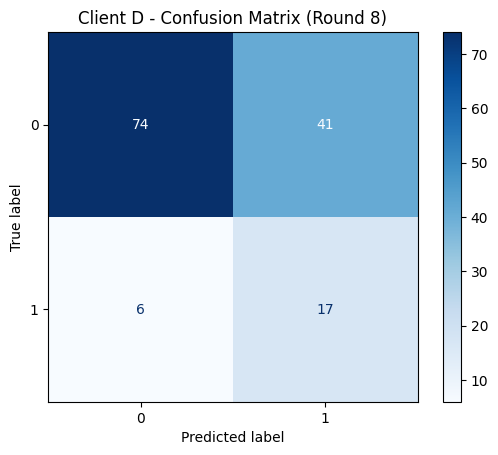


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9250    0.6435    0.7590       115
           1     0.2931    0.7391    0.4198        23

    accuracy                         0.6594       138
   macro avg     0.6091    0.6913    0.5894       138
weighted avg     0.8197    0.6594    0.7024       138



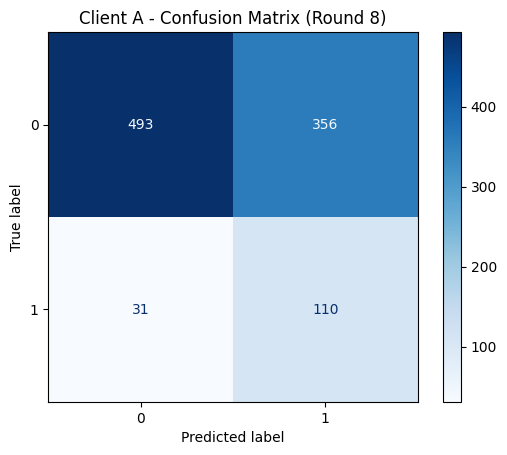


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9408    0.5807    0.7181       849
           1     0.2361    0.7801    0.3624       141

    accuracy                         0.6091       990
   macro avg     0.5884    0.6804    0.5403       990
weighted avg     0.8405    0.6091    0.6675       990


=== Round 9 ===
[Round 9] Global Accuracy: 0.6103 → 0.6192 | ΔW=0.2700

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

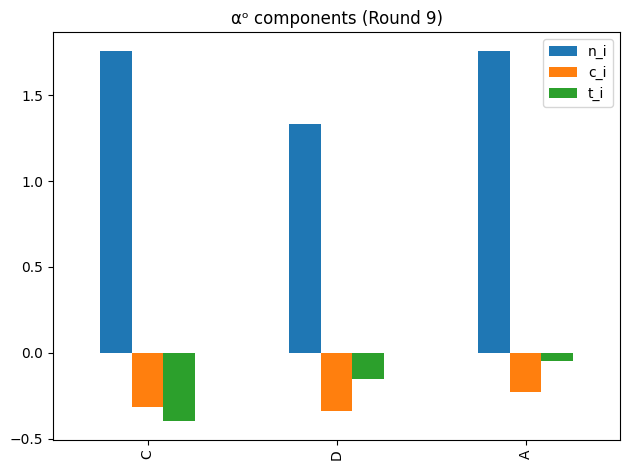

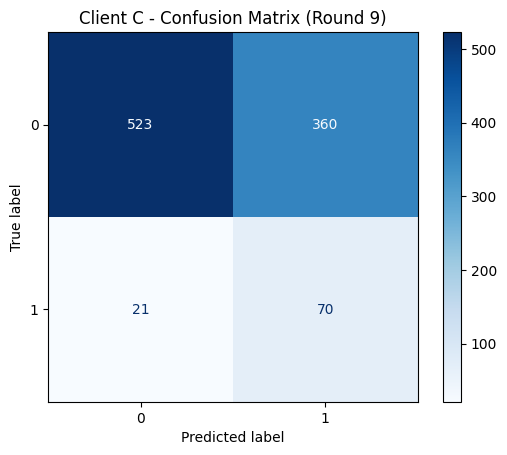


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9614    0.5923    0.7330       883
           1     0.1628    0.7692    0.2687        91

    accuracy                         0.6088       974
   macro avg     0.5621    0.6808    0.5009       974
weighted avg     0.8868    0.6088    0.6896       974



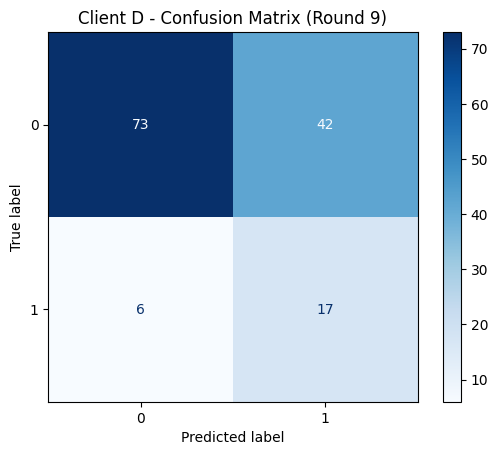


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9241    0.6348    0.7526       115
           1     0.2881    0.7391    0.4146        23

    accuracy                         0.6522       138
   macro avg     0.6061    0.6870    0.5836       138
weighted avg     0.8181    0.6522    0.6963       138



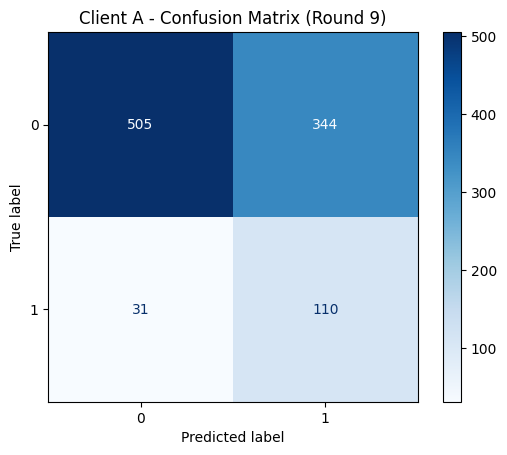


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9422    0.5948    0.7292       849
           1     0.2423    0.7801    0.3697       141

    accuracy                         0.6212       990
   macro avg     0.5922    0.6875    0.5495       990
weighted avg     0.8425    0.6212    0.6780       990


=== Round 10 ===
[Round 10] Global Accuracy: 0.6192 → 0.6170 | ΔW=0.2602

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

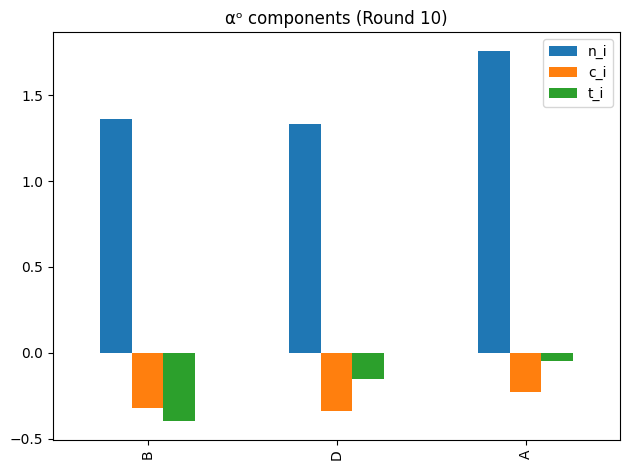

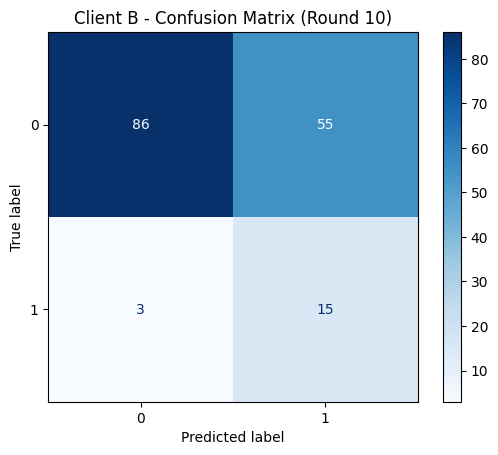


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9663    0.6099    0.7478       141
           1     0.2143    0.8333    0.3409        18

    accuracy                         0.6352       159
   macro avg     0.5903    0.7216    0.5444       159
weighted avg     0.8812    0.6352    0.7018       159



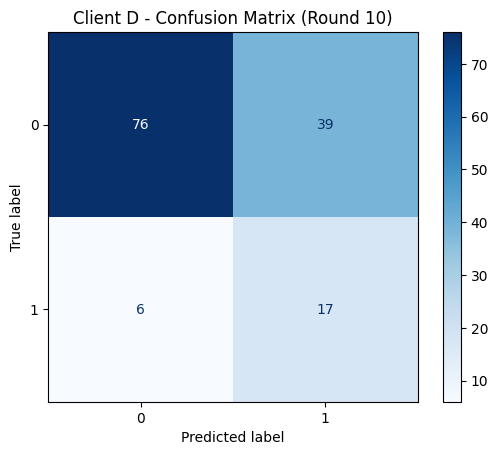


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9268    0.6609    0.7716       115
           1     0.3036    0.7391    0.4304        23

    accuracy                         0.6739       138
   macro avg     0.6152    0.7000    0.6010       138
weighted avg     0.8230    0.6739    0.7147       138



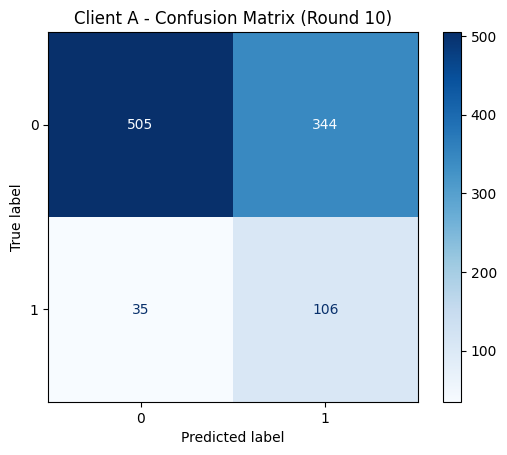


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9352    0.5948    0.7271       849
           1     0.2356    0.7518    0.3587       141

    accuracy                         0.6172       990
   macro avg     0.5854    0.6733    0.5429       990
weighted avg     0.8355    0.6172    0.6747       990


=== Round 11 ===
[Round 11] Global Accuracy: 0.6170 → 0.6245 | ΔW=0.2917

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

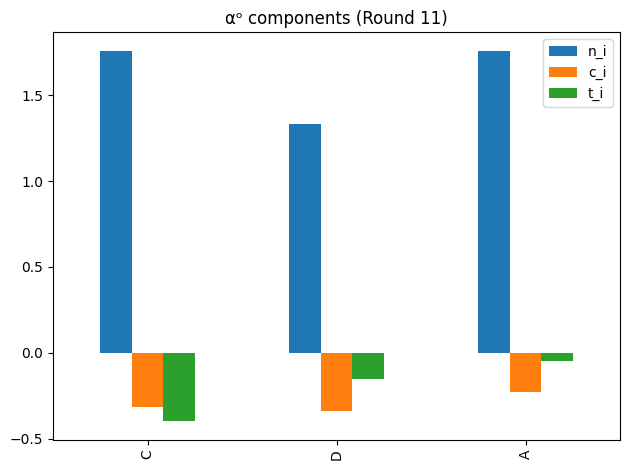

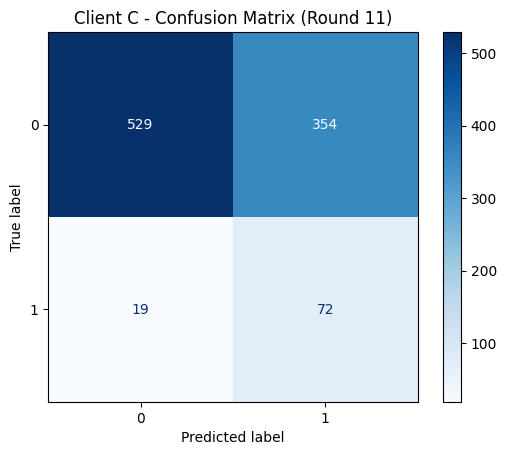


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9653    0.5991    0.7393       883
           1     0.1690    0.7912    0.2785        91

    accuracy                         0.6170       974
   macro avg     0.5672    0.6952    0.5089       974
weighted avg     0.8909    0.6170    0.6963       974



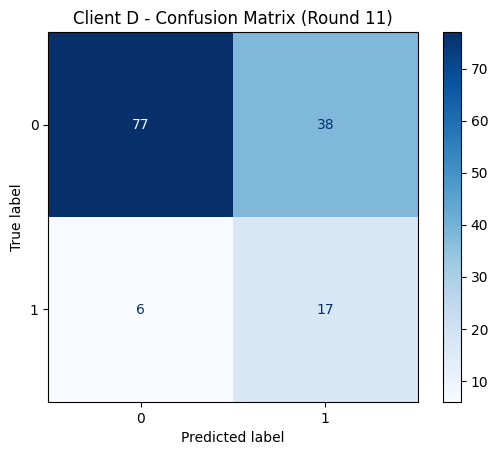


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9277    0.6696    0.7778       115
           1     0.3091    0.7391    0.4359        23

    accuracy                         0.6812       138
   macro avg     0.6184    0.7043    0.6068       138
weighted avg     0.8246    0.6812    0.7208       138



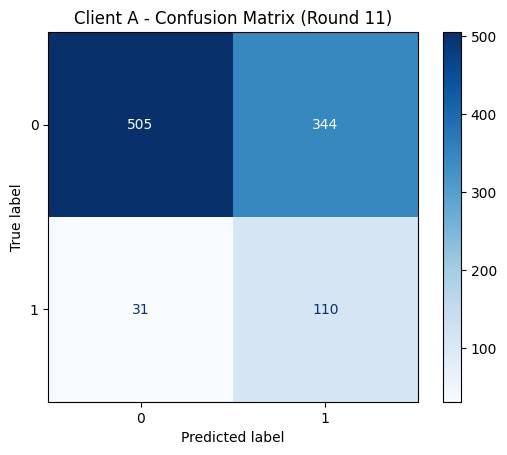


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9422    0.5948    0.7292       849
           1     0.2423    0.7801    0.3697       141

    accuracy                         0.6212       990
   macro avg     0.5922    0.6875    0.5495       990
weighted avg     0.8425    0.6212    0.6780       990


=== Round 12 ===
[Round 12] Global Accuracy: 0.6245 → 0.6223 | ΔW=0.2864

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

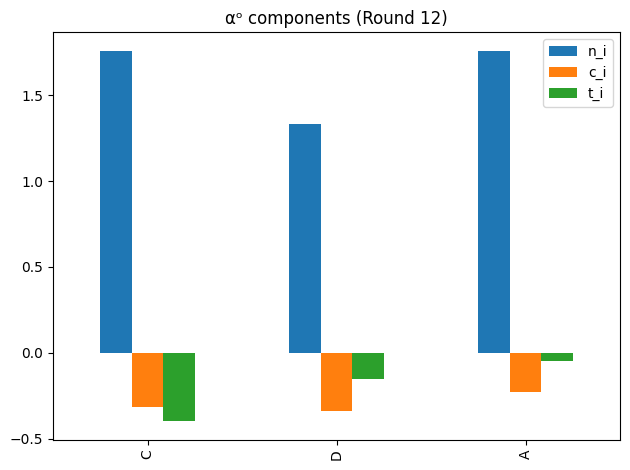

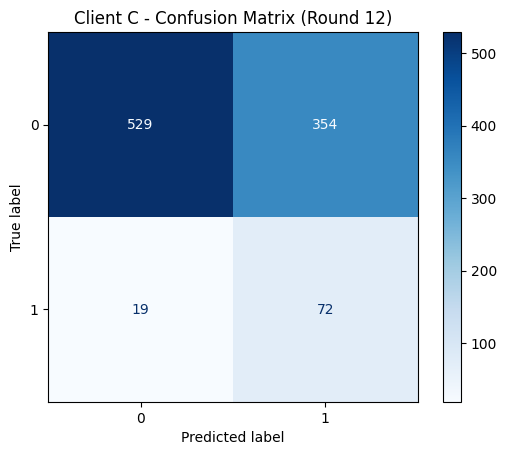


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9653    0.5991    0.7393       883
           1     0.1690    0.7912    0.2785        91

    accuracy                         0.6170       974
   macro avg     0.5672    0.6952    0.5089       974
weighted avg     0.8909    0.6170    0.6963       974



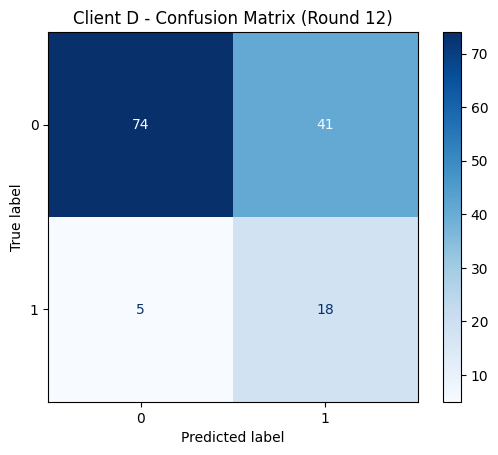


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9367    0.6435    0.7629       115
           1     0.3051    0.7826    0.4390        23

    accuracy                         0.6667       138
   macro avg     0.6209    0.7130    0.6010       138
weighted avg     0.8314    0.6667    0.7089       138



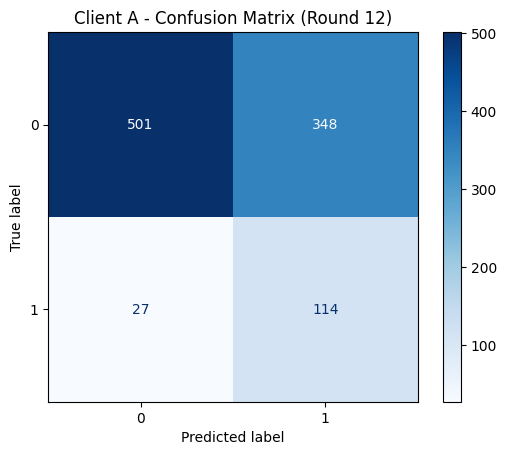


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9489    0.5901    0.7277       849
           1     0.2468    0.8085    0.3781       141

    accuracy                         0.6212       990
   macro avg     0.5978    0.6993    0.5529       990
weighted avg     0.8489    0.6212    0.6779       990


=== Round 13 ===
[Round 13] Global Accuracy: 0.6223 → 0.6298 | ΔW=0.2773

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

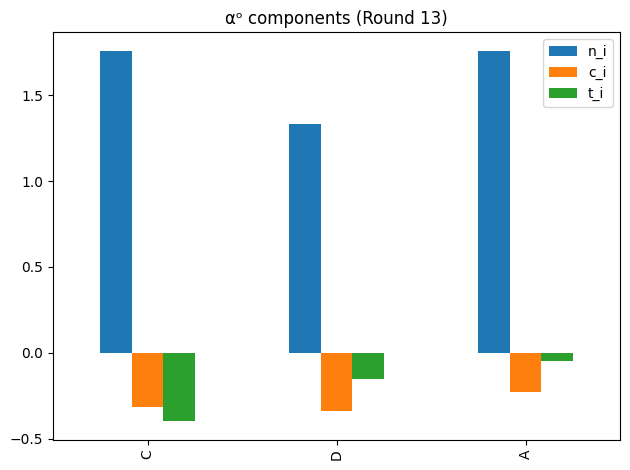

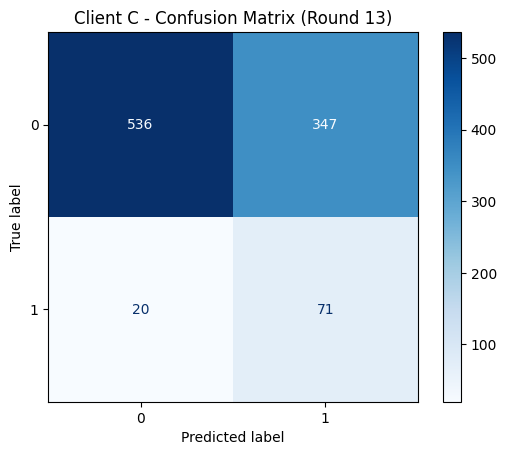


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9640    0.6070    0.7450       883
           1     0.1699    0.7802    0.2790        91

    accuracy                         0.6232       974
   macro avg     0.5669    0.6936    0.5120       974
weighted avg     0.8898    0.6232    0.7014       974



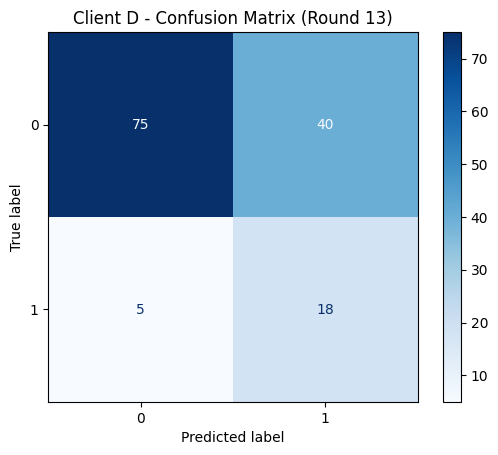


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9375    0.6522    0.7692       115
           1     0.3103    0.7826    0.4444        23

    accuracy                         0.6739       138
   macro avg     0.6239    0.7174    0.6068       138
weighted avg     0.8330    0.6739    0.7151       138



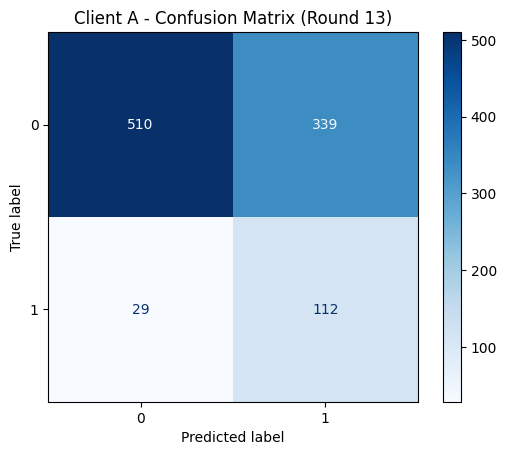


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9462    0.6007    0.7349       849
           1     0.2483    0.7943    0.3784       141

    accuracy                         0.6283       990
   macro avg     0.5973    0.6975    0.5566       990
weighted avg     0.8468    0.6283    0.6841       990


=== Round 14 ===
[Round 14] Global Accuracy: 0.6298 → 0.6188 | ΔW=0.2672

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

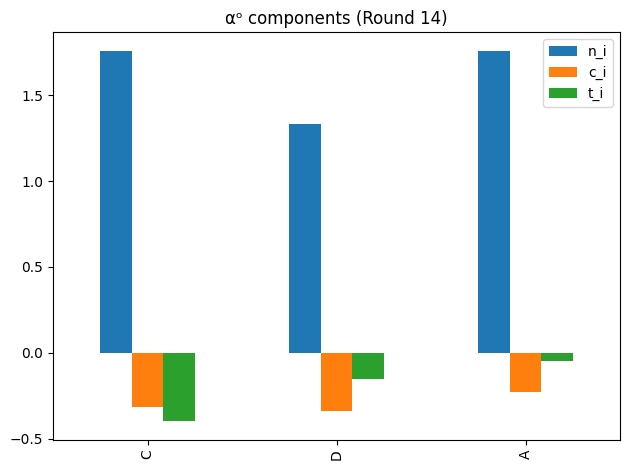

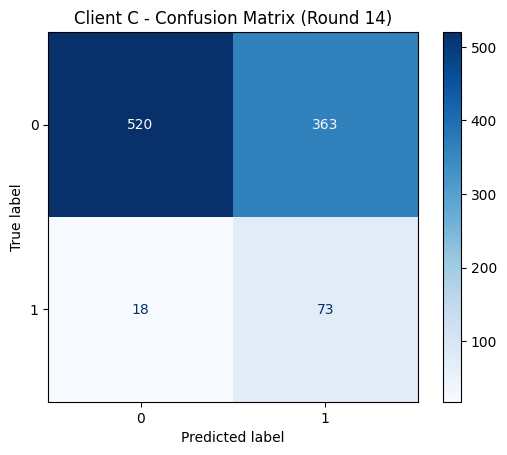


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9665    0.5889    0.7319       883
           1     0.1674    0.8022    0.2770        91

    accuracy                         0.6088       974
   macro avg     0.5670    0.6955    0.5045       974
weighted avg     0.8919    0.6088    0.6894       974



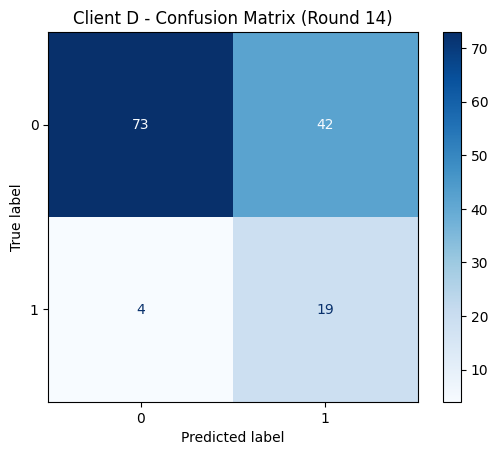


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9481    0.6348    0.7604       115
           1     0.3115    0.8261    0.4524        23

    accuracy                         0.6667       138
   macro avg     0.6298    0.7304    0.6064       138
weighted avg     0.8420    0.6667    0.7091       138



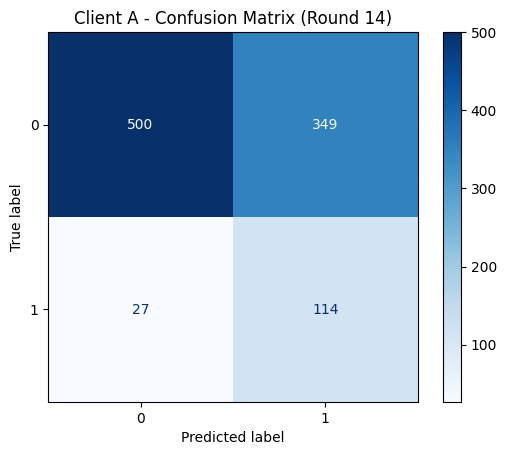


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9488    0.5889    0.7267       849
           1     0.2462    0.8085    0.3775       141

    accuracy                         0.6202       990
   macro avg     0.5975    0.6987    0.5521       990
weighted avg     0.8487    0.6202    0.6770       990


=== Round 15 ===
[Round 15] Global Accuracy: 0.6188 → 0.6298 | ΔW=0.2496

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

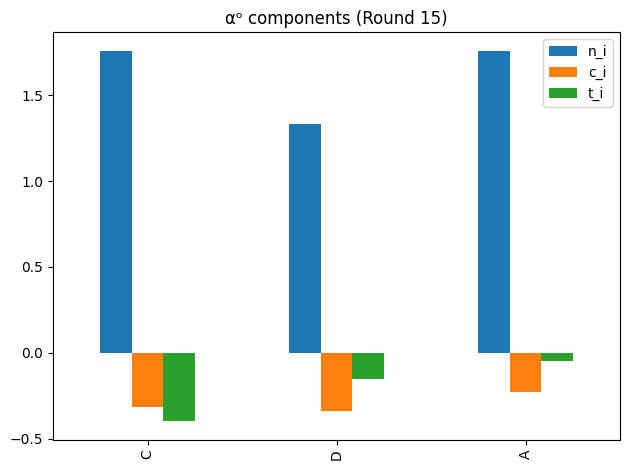

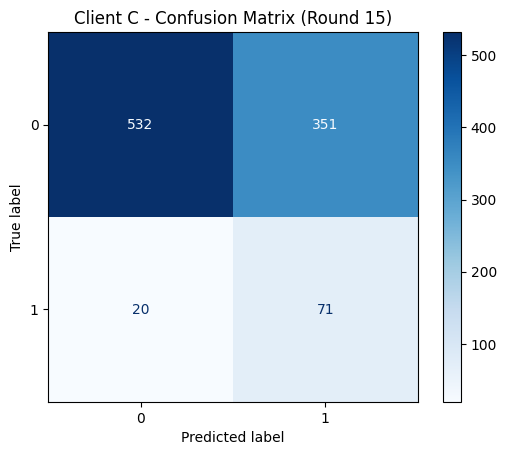


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9638    0.6025    0.7415       883
           1     0.1682    0.7802    0.2768        91

    accuracy                         0.6191       974
   macro avg     0.5660    0.6914    0.5091       974
weighted avg     0.8894    0.6191    0.6981       974



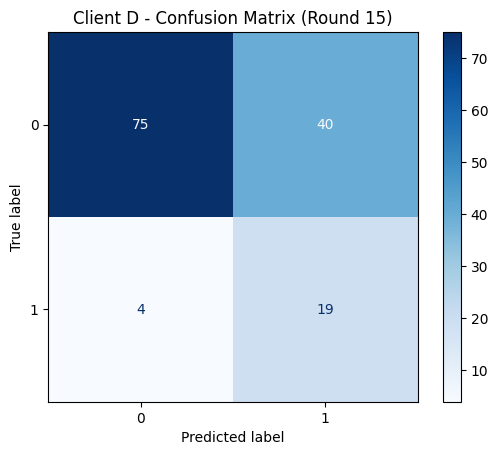


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9494    0.6522    0.7732       115
           1     0.3220    0.8261    0.4634        23

    accuracy                         0.6812       138
   macro avg     0.6357    0.7391    0.6183       138
weighted avg     0.8448    0.6812    0.7216       138



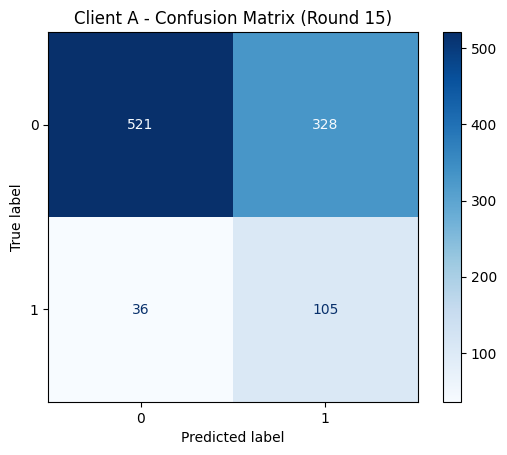


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9354    0.6137    0.7411       849
           1     0.2425    0.7447    0.3659       141

    accuracy                         0.6323       990
   macro avg     0.5889    0.6792    0.5535       990
weighted avg     0.8367    0.6323    0.6877       990


=== Round 16 ===
[Round 16] Global Accuracy: 0.6298 → 0.5851 | ΔW=0.3279

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

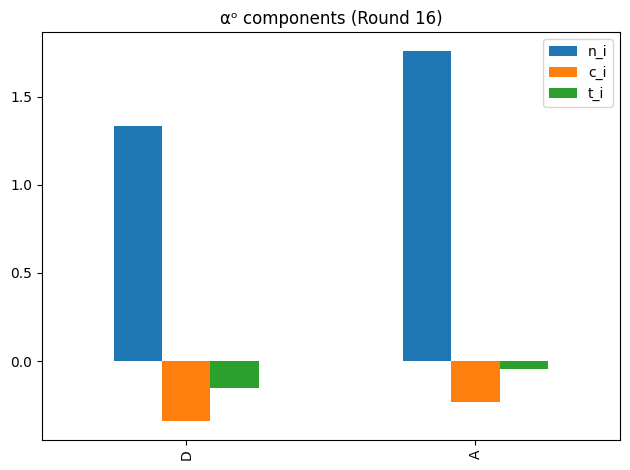

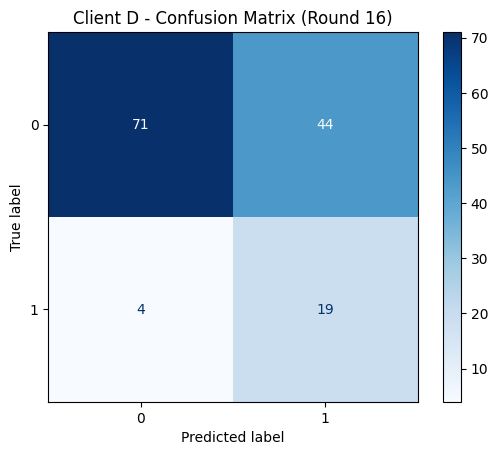


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9467    0.6174    0.7474       115
           1     0.3016    0.8261    0.4419        23

    accuracy                         0.6522       138
   macro avg     0.6241    0.7217    0.5946       138
weighted avg     0.8392    0.6522    0.6965       138



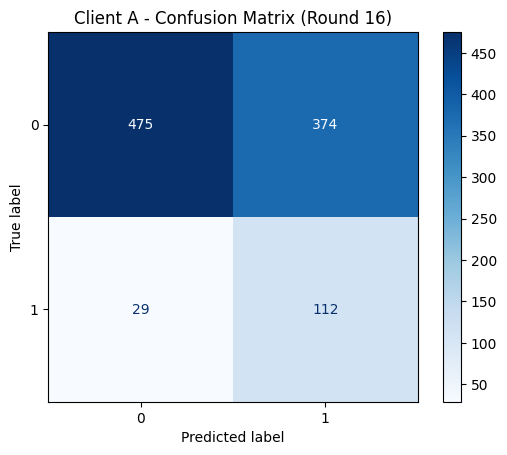


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9425    0.5595    0.7021       849
           1     0.2305    0.7943    0.3573       141

    accuracy                         0.5929       990
   macro avg     0.5865    0.6769    0.5297       990
weighted avg     0.8411    0.5929    0.6530       990


=== Round 17 ===
[Round 17] Global Accuracy: 0.5851 → 0.6347 | ΔW=0.2980

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

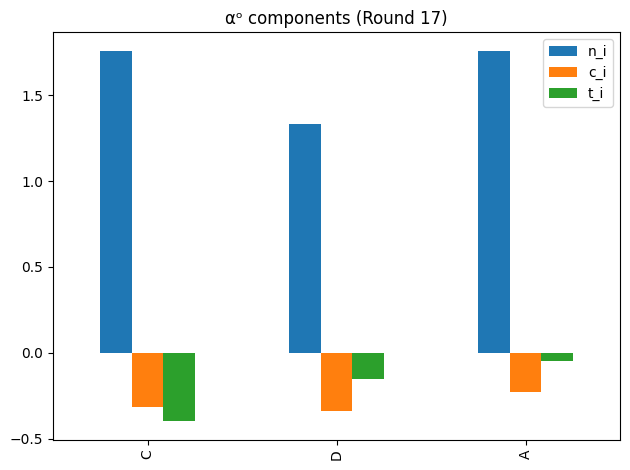

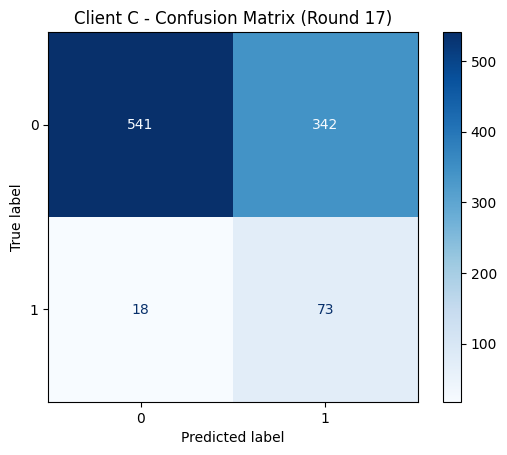


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9678    0.6127    0.7503       883
           1     0.1759    0.8022    0.2885        91

    accuracy                         0.6304       974
   macro avg     0.5719    0.7074    0.5194       974
weighted avg     0.8938    0.6304    0.7072       974



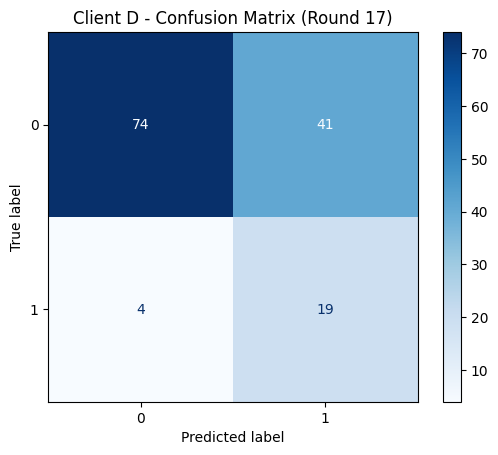


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9487    0.6435    0.7668       115
           1     0.3167    0.8261    0.4578        23

    accuracy                         0.6739       138
   macro avg     0.6327    0.7348    0.6123       138
weighted avg     0.8434    0.6739    0.7153       138



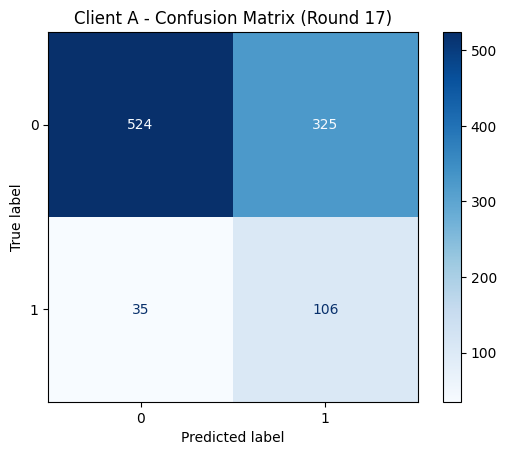


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9374    0.6172    0.7443       849
           1     0.2459    0.7518    0.3706       141

    accuracy                         0.6364       990
   macro avg     0.5917    0.6845    0.5575       990
weighted avg     0.8389    0.6364    0.6911       990


=== Round 18 ===
[Round 18] Global Accuracy: 0.6347 → 0.6515 | ΔW=0.2644

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

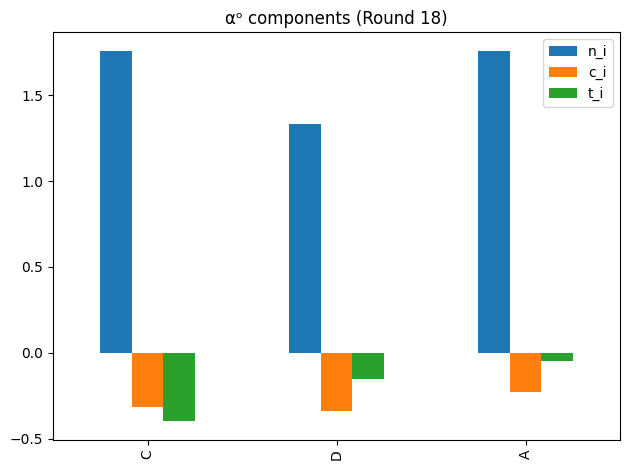

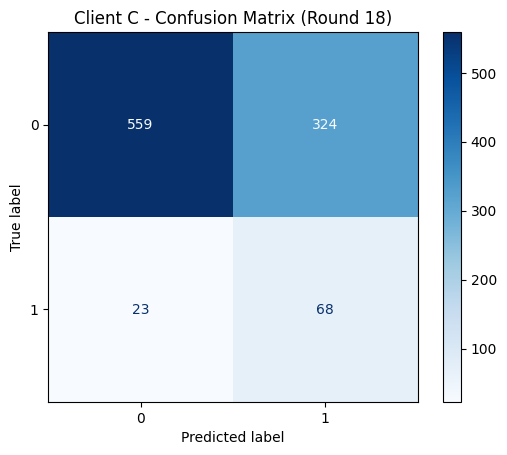


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9605    0.6331    0.7631       883
           1     0.1735    0.7473    0.2816        91

    accuracy                         0.6437       974
   macro avg     0.5670    0.6902    0.5224       974
weighted avg     0.8870    0.6437    0.7181       974



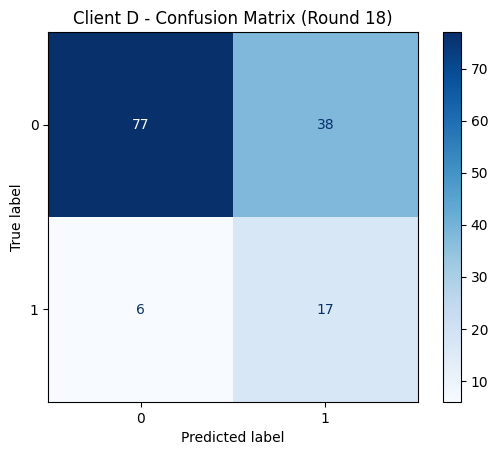


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9277    0.6696    0.7778       115
           1     0.3091    0.7391    0.4359        23

    accuracy                         0.6812       138
   macro avg     0.6184    0.7043    0.6068       138
weighted avg     0.8246    0.6812    0.7208       138



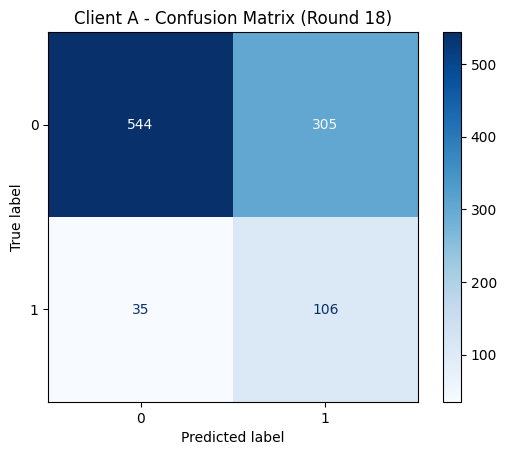


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9396    0.6408    0.7619       849
           1     0.2579    0.7518    0.3841       141

    accuracy                         0.6566       990
   macro avg     0.5987    0.6963    0.5730       990
weighted avg     0.8425    0.6566    0.7081       990


=== Round 19 ===
[Round 19] Global Accuracy: 0.6515 → 0.6444 | ΔW=0.2828

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

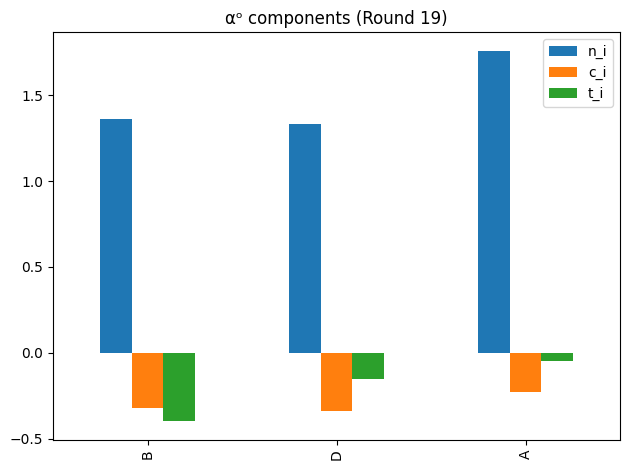

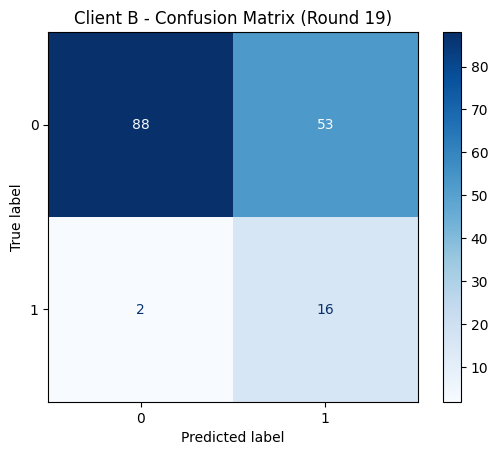


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9778    0.6241    0.7619       141
           1     0.2319    0.8889    0.3678        18

    accuracy                         0.6541       159
   macro avg     0.6048    0.7565    0.5649       159
weighted avg     0.8933    0.6541    0.7173       159



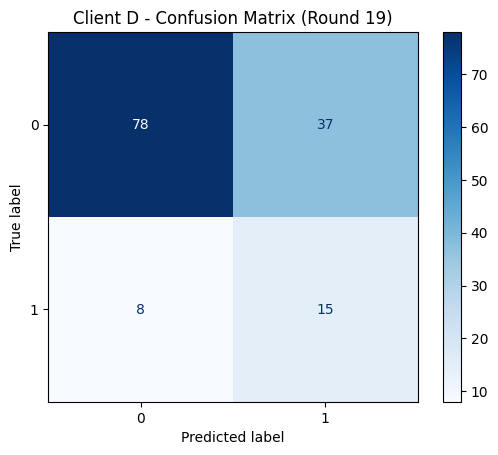


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9070    0.6783    0.7761       115
           1     0.2885    0.6522    0.4000        23

    accuracy                         0.6739       138
   macro avg     0.5977    0.6652    0.5881       138
weighted avg     0.8039    0.6739    0.7134       138



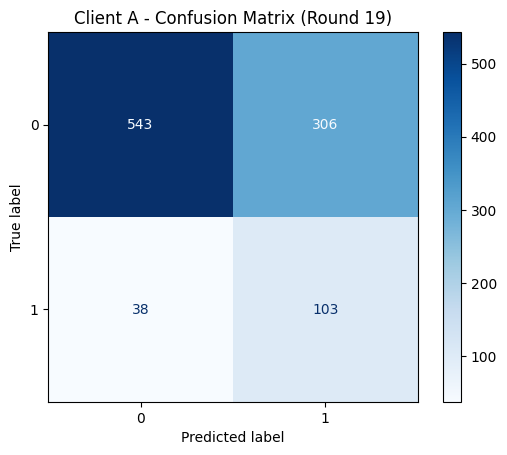


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9346    0.6396    0.7594       849
           1     0.2518    0.7305    0.3745       141

    accuracy                         0.6525       990
   macro avg     0.5932    0.6850    0.5670       990
weighted avg     0.8374    0.6525    0.7046       990


=== Round 20 ===
[Round 20] Global Accuracy: 0.6444 → 0.6462 | ΔW=0.2861

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

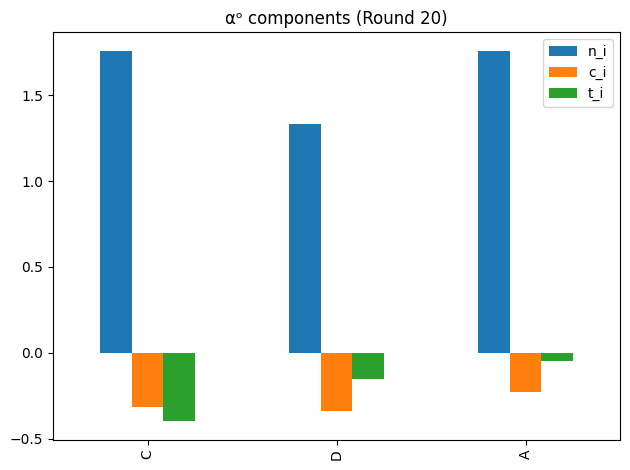

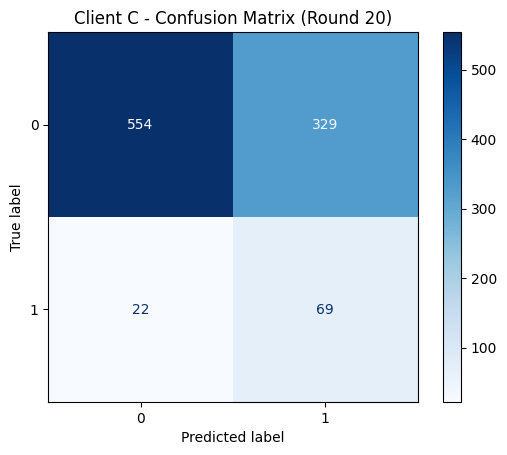


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9618    0.6274    0.7594       883
           1     0.1734    0.7582    0.2822        91

    accuracy                         0.6396       974
   macro avg     0.5676    0.6928    0.5208       974
weighted avg     0.8881    0.6396    0.7148       974



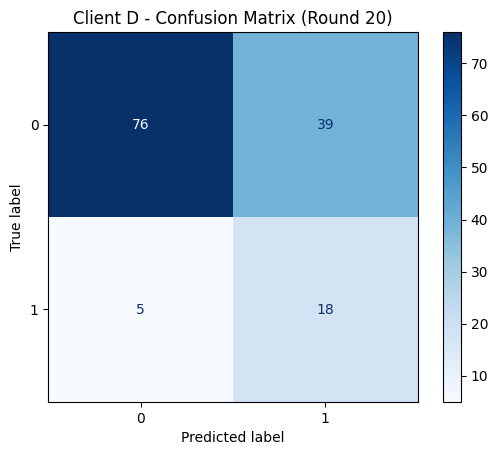


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9383    0.6609    0.7755       115
           1     0.3158    0.7826    0.4500        23

    accuracy                         0.6812       138
   macro avg     0.6270    0.7217    0.6128       138
weighted avg     0.8345    0.6812    0.7213       138



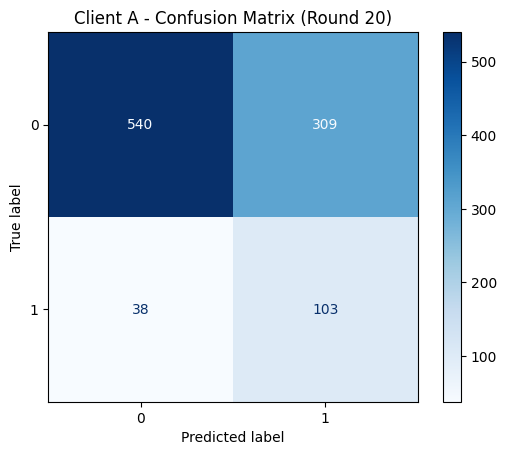


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9343    0.6360    0.7568       849
           1     0.2500    0.7305    0.3725       141

    accuracy                         0.6495       990
   macro avg     0.5921    0.6833    0.5647       990
weighted avg     0.8368    0.6495    0.7021       990


=== Round 21 ===
[Round 21] Global Accuracy: 0.6462 → 0.6692 | ΔW=0.2236

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

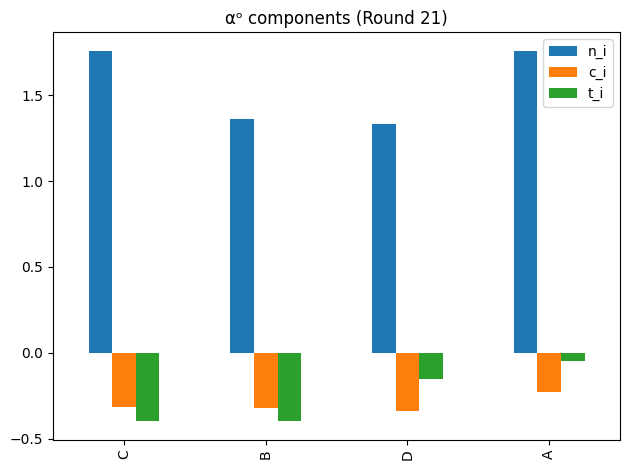

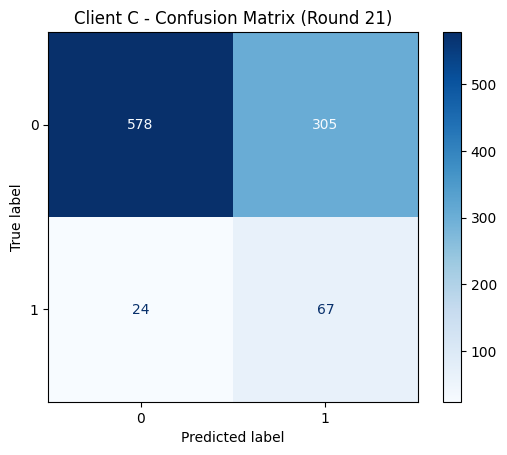


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9601    0.6546    0.7785       883
           1     0.1801    0.7363    0.2894        91

    accuracy                         0.6622       974
   macro avg     0.5701    0.6954    0.5339       974
weighted avg     0.8873    0.6622    0.7328       974



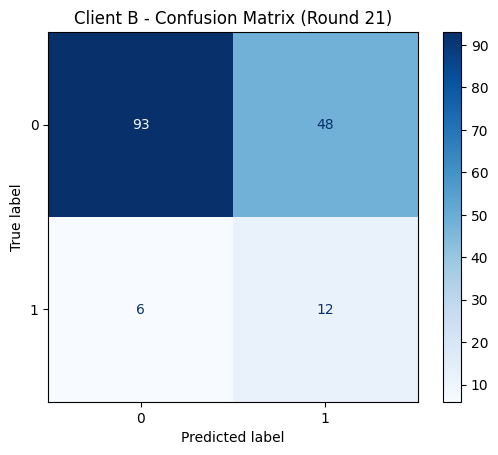


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9394    0.6596    0.7750       141
           1     0.2000    0.6667    0.3077        18

    accuracy                         0.6604       159
   macro avg     0.5697    0.6631    0.5413       159
weighted avg     0.8557    0.6604    0.7221       159



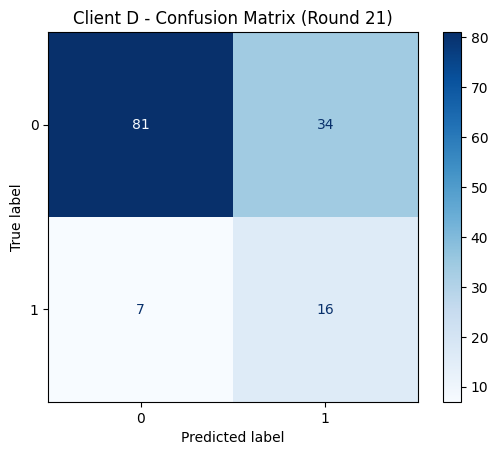


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9205    0.7043    0.7980       115
           1     0.3200    0.6957    0.4384        23

    accuracy                         0.7029       138
   macro avg     0.6202    0.7000    0.6182       138
weighted avg     0.8204    0.7029    0.7381       138



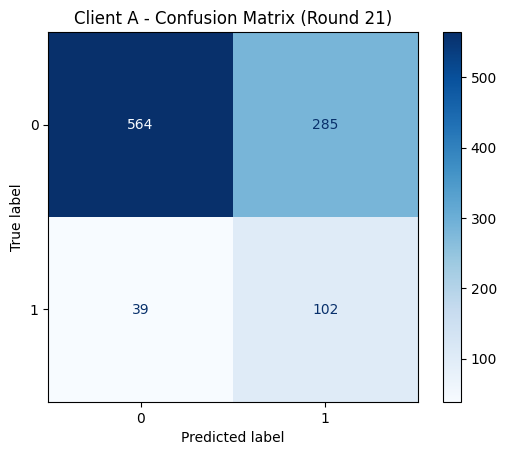


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9353    0.6643    0.7769       849
           1     0.2636    0.7234    0.3864       141

    accuracy                         0.6727       990
   macro avg     0.5994    0.6939    0.5816       990
weighted avg     0.8396    0.6727    0.7212       990


=== Round 22 ===
[Round 22] Global Accuracy: 0.6692 → 0.6471 | ΔW=0.2772

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

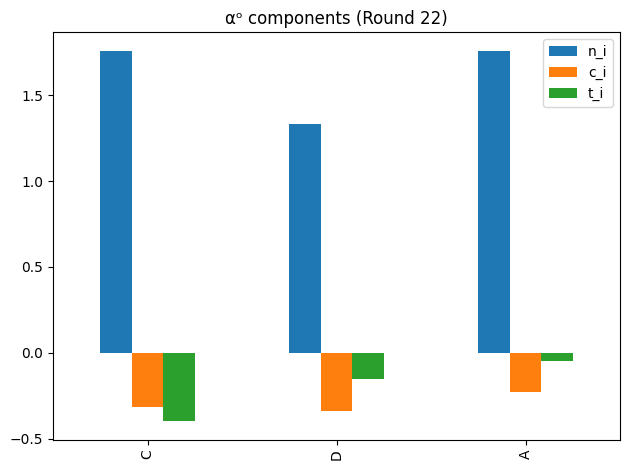

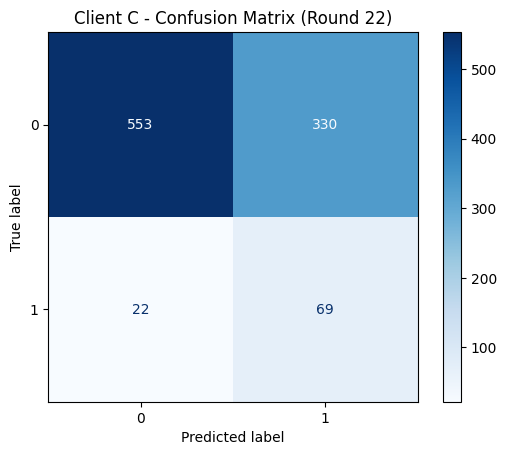


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9617    0.6263    0.7586       883
           1     0.1729    0.7582    0.2816        91

    accuracy                         0.6386       974
   macro avg     0.5673    0.6923    0.5201       974
weighted avg     0.8880    0.6386    0.7140       974



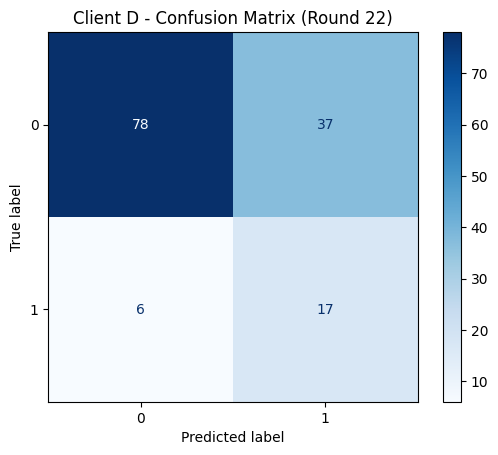


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9286    0.6783    0.7839       115
           1     0.3148    0.7391    0.4416        23

    accuracy                         0.6884       138
   macro avg     0.6217    0.7087    0.6127       138
weighted avg     0.8263    0.6884    0.7269       138



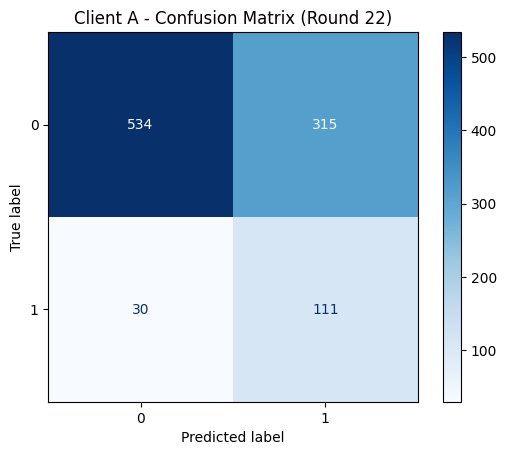


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9468    0.6290    0.7558       849
           1     0.2606    0.7872    0.3915       141

    accuracy                         0.6515       990
   macro avg     0.6037    0.7081    0.5737       990
weighted avg     0.8491    0.6515    0.7040       990


=== Round 23 ===
[Round 23] Global Accuracy: 0.6471 → 0.6612 | ΔW=0.2437

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

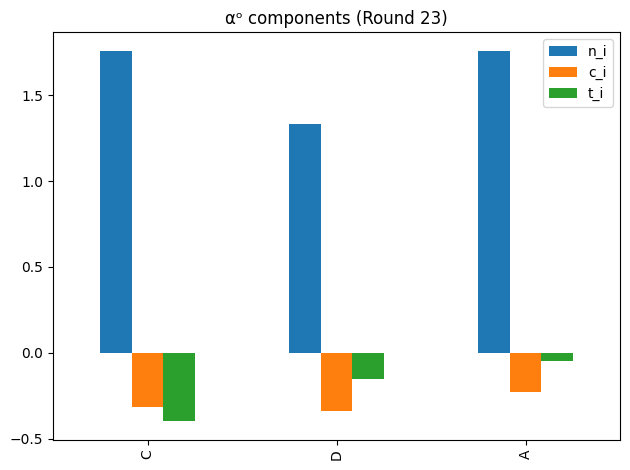

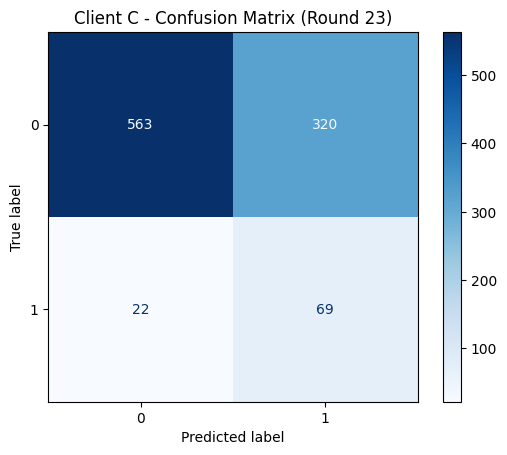


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9624    0.6376    0.7670       883
           1     0.1774    0.7582    0.2875        91

    accuracy                         0.6489       974
   macro avg     0.5699    0.6979    0.5273       974
weighted avg     0.8890    0.6489    0.7222       974



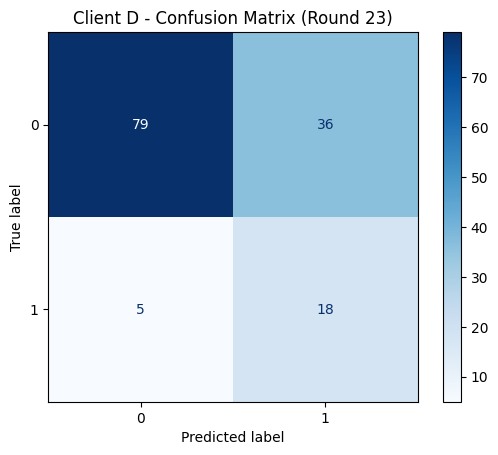


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9405    0.6870    0.7940       115
           1     0.3333    0.7826    0.4675        23

    accuracy                         0.7029       138
   macro avg     0.6369    0.7348    0.6308       138
weighted avg     0.8393    0.7029    0.7396       138



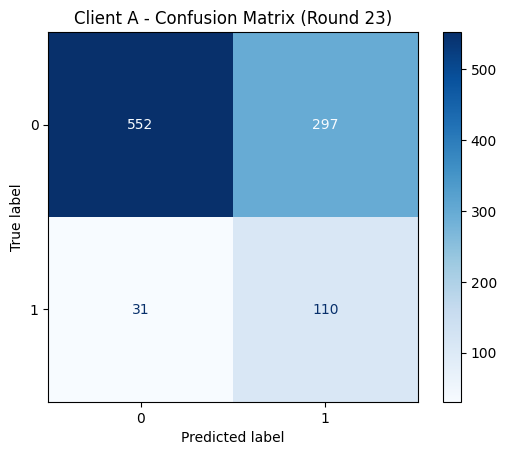


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9468    0.6502    0.7709       849
           1     0.2703    0.7801    0.4015       141

    accuracy                         0.6687       990
   macro avg     0.6085    0.7152    0.5862       990
weighted avg     0.8505    0.6687    0.7183       990


=== Round 24 ===
[Round 24] Global Accuracy: 0.6612 → 0.6599 | ΔW=0.2866

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

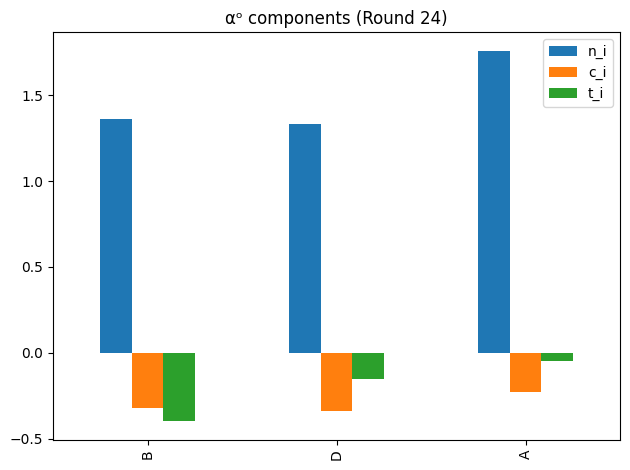

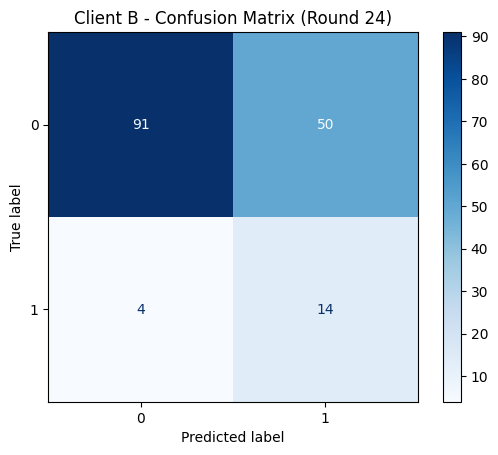


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9579    0.6454    0.7712       141
           1     0.2188    0.7778    0.3415        18

    accuracy                         0.6604       159
   macro avg     0.5883    0.7116    0.5563       159
weighted avg     0.8742    0.6604    0.7225       159



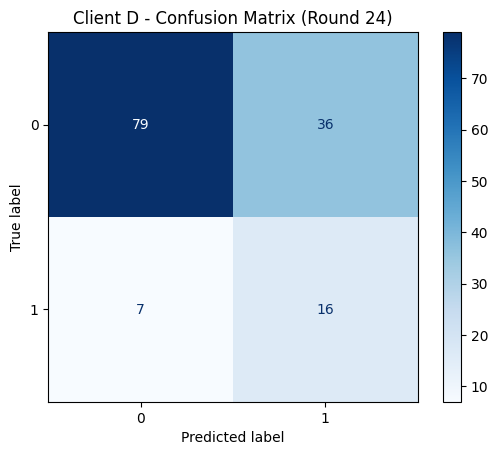


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9186    0.6870    0.7861       115
           1     0.3077    0.6957    0.4267        23

    accuracy                         0.6884       138
   macro avg     0.6131    0.6913    0.6064       138
weighted avg     0.8168    0.6884    0.7262       138



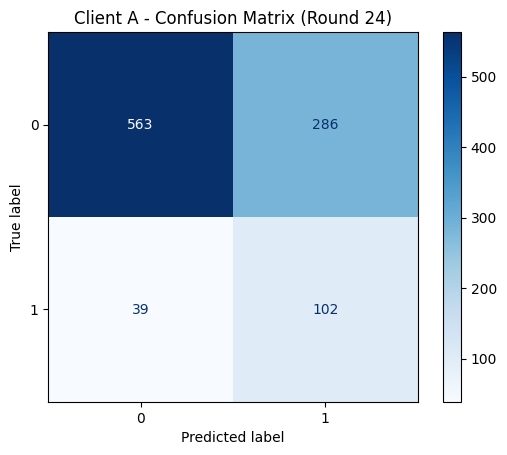


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9352    0.6631    0.7760       849
           1     0.2629    0.7234    0.3856       141

    accuracy                         0.6717       990
   macro avg     0.5991    0.6933    0.5808       990
weighted avg     0.8395    0.6717    0.7204       990


=== Round 25 ===
[Round 25] Global Accuracy: 0.6599 → 0.6484 | ΔW=0.3227

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

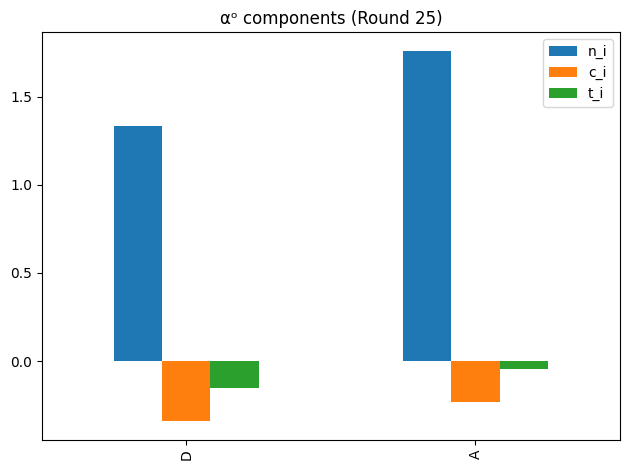

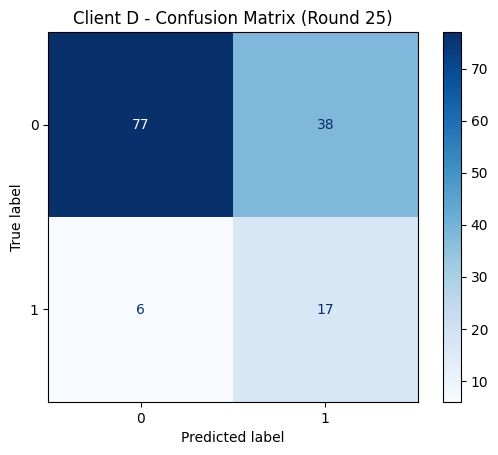


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9277    0.6696    0.7778       115
           1     0.3091    0.7391    0.4359        23

    accuracy                         0.6812       138
   macro avg     0.6184    0.7043    0.6068       138
weighted avg     0.8246    0.6812    0.7208       138



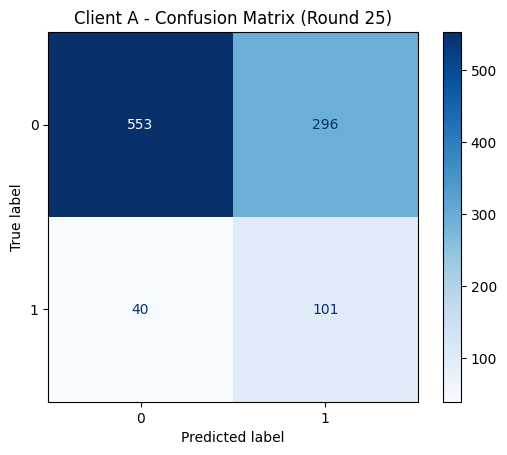


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9325    0.6514    0.7670       849
           1     0.2544    0.7163    0.3755       141

    accuracy                         0.6606       990
   macro avg     0.5935    0.6838    0.5712       990
weighted avg     0.8360    0.6606    0.7112       990


=== Round 26 ===
[Round 26] Global Accuracy: 0.6484 → 0.6807 | ΔW=0.3041

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

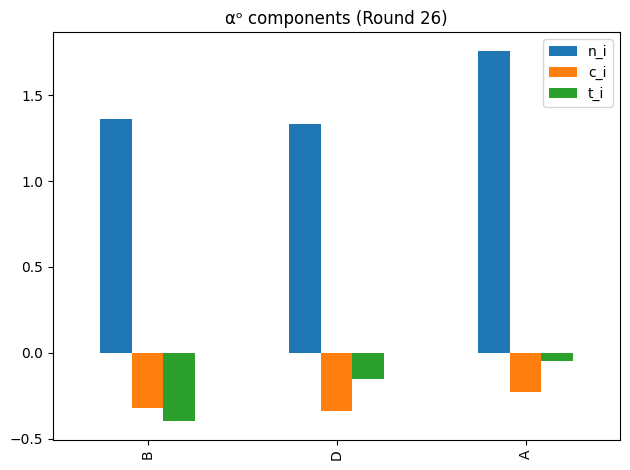

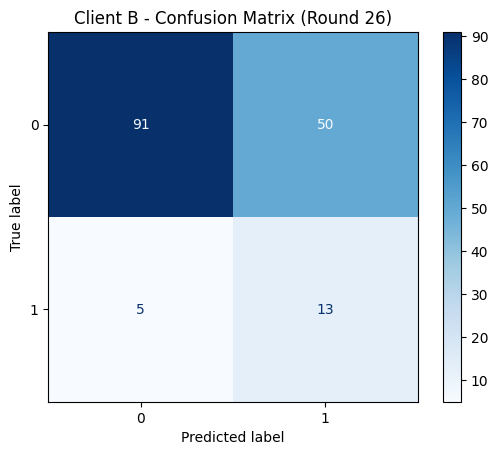


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9479    0.6454    0.7679       141
           1     0.2063    0.7222    0.3210        18

    accuracy                         0.6541       159
   macro avg     0.5771    0.6838    0.5445       159
weighted avg     0.8640    0.6541    0.7173       159



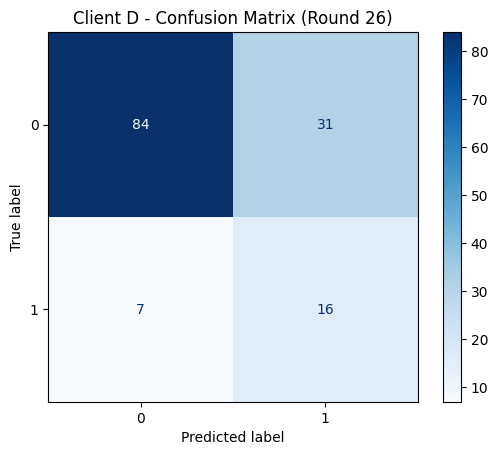


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9231    0.7304    0.8155       115
           1     0.3404    0.6957    0.4571        23

    accuracy                         0.7246       138
   macro avg     0.6318    0.7130    0.6363       138
weighted avg     0.8260    0.7246    0.7558       138



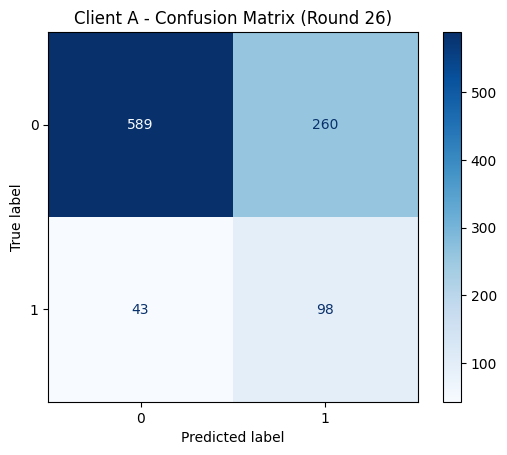


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9320    0.6938    0.7954       849
           1     0.2737    0.6950    0.3928       141

    accuracy                         0.6939       990
   macro avg     0.6029    0.6944    0.5941       990
weighted avg     0.8382    0.6939    0.7381       990


=== Round 27 ===
[Round 27] Global Accuracy: 0.6807 → 0.6479 | ΔW=0.3594

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

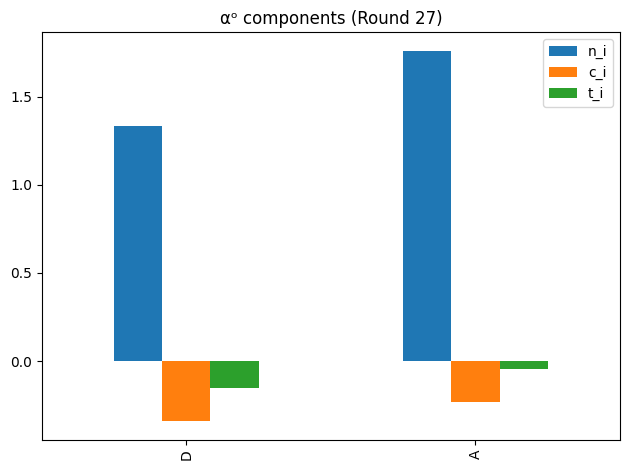

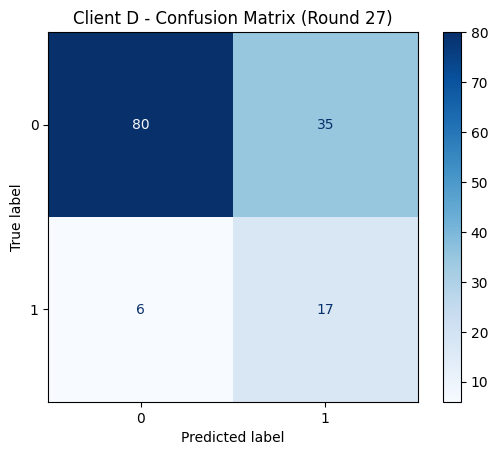


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9302    0.6957    0.7960       115
           1     0.3269    0.7391    0.4533        23

    accuracy                         0.7029       138
   macro avg     0.6286    0.7174    0.6247       138
weighted avg     0.8297    0.7029    0.7389       138



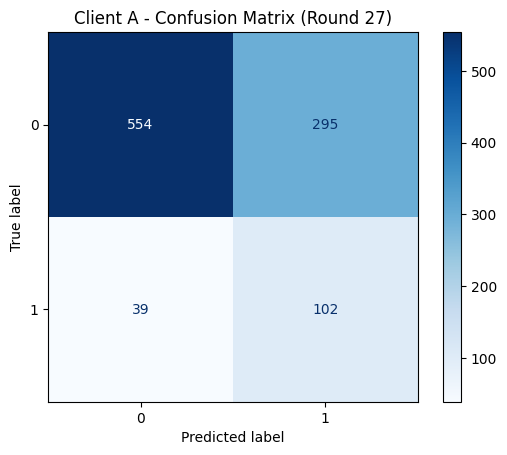


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9342    0.6525    0.7684       849
           1     0.2569    0.7234    0.3792       141

    accuracy                         0.6626       990
   macro avg     0.5956    0.6880    0.5738       990
weighted avg     0.8378    0.6626    0.7129       990


=== Round 28 ===
[Round 28] Global Accuracy: 0.6479 → 0.6687 | ΔW=0.3463

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

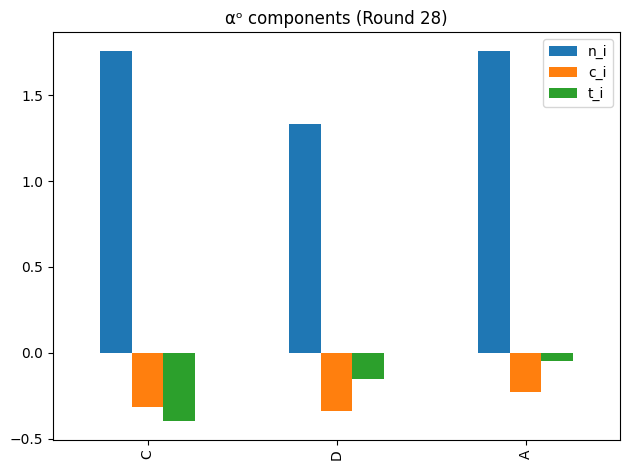

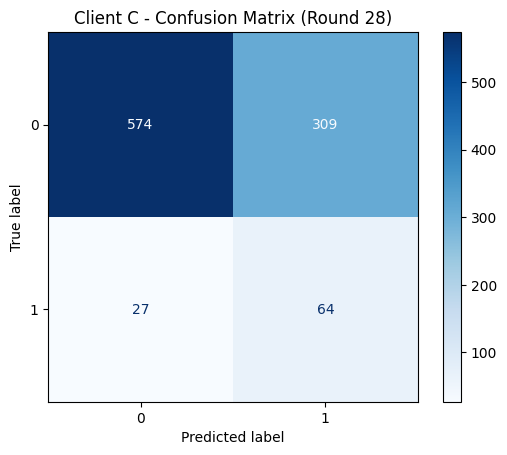


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9551    0.6501    0.7736       883
           1     0.1716    0.7033    0.2759        91

    accuracy                         0.6550       974
   macro avg     0.5633    0.6767    0.5247       974
weighted avg     0.8819    0.6550    0.7271       974



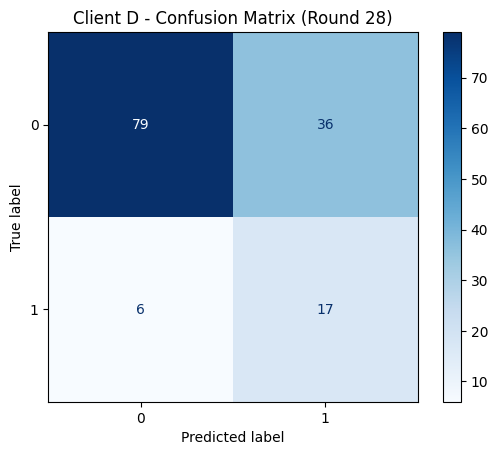


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9294    0.6870    0.7900       115
           1     0.3208    0.7391    0.4474        23

    accuracy                         0.6957       138
   macro avg     0.6251    0.7130    0.6187       138
weighted avg     0.8280    0.6957    0.7329       138



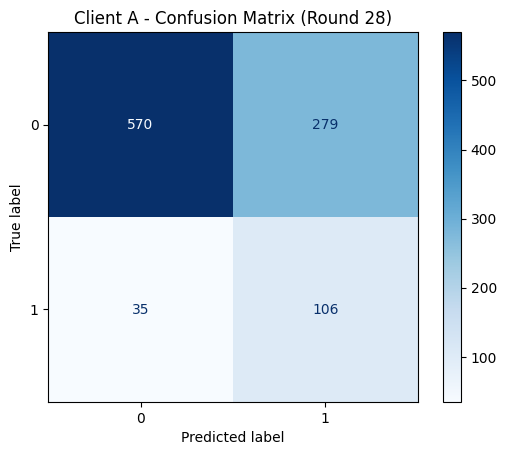


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9421    0.6714    0.7840       849
           1     0.2753    0.7518    0.4030       141

    accuracy                         0.6828       990
   macro avg     0.6087    0.7116    0.5935       990
weighted avg     0.8472    0.6828    0.7298       990


=== Round 29 ===
[Round 29] Global Accuracy: 0.6687 → 0.6740 | ΔW=0.2798

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

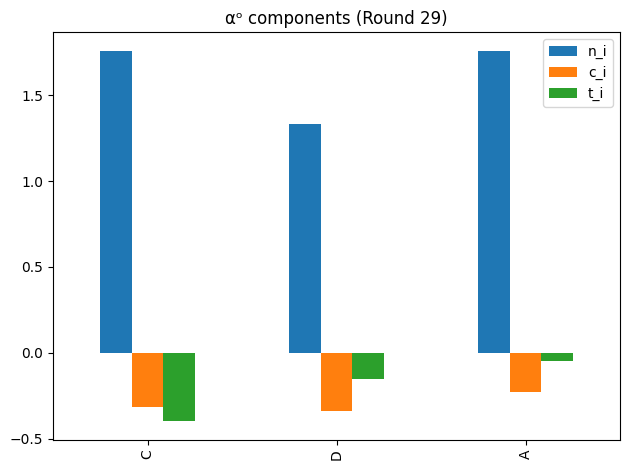

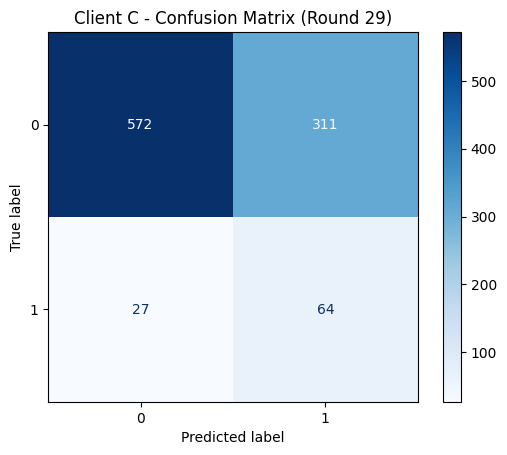


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9549    0.6478    0.7719       883
           1     0.1707    0.7033    0.2747        91

    accuracy                         0.6530       974
   macro avg     0.5628    0.6755    0.5233       974
weighted avg     0.8817    0.6530    0.7255       974



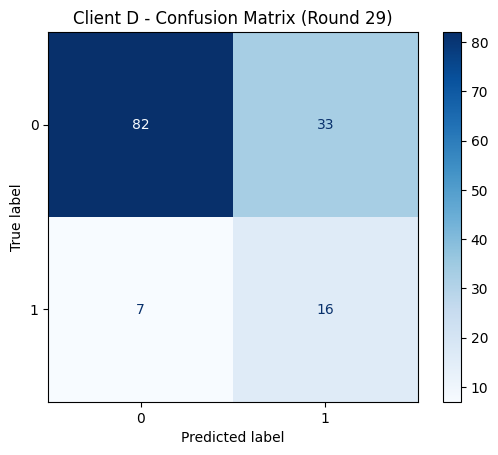


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9213    0.7130    0.8039       115
           1     0.3265    0.6957    0.4444        23

    accuracy                         0.7101       138
   macro avg     0.6239    0.7043    0.6242       138
weighted avg     0.8222    0.7101    0.7440       138



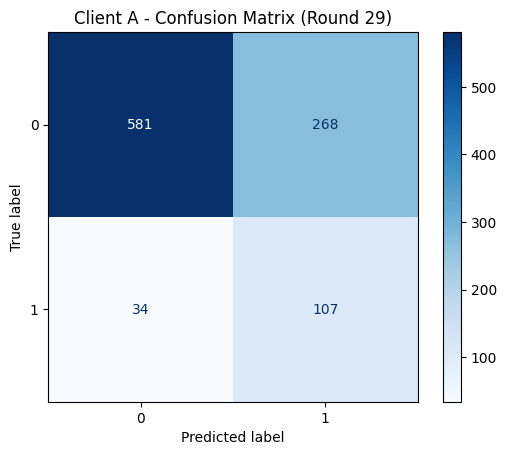


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9447    0.6843    0.7937       849
           1     0.2853    0.7589    0.4147       141

    accuracy                         0.6949       990
   macro avg     0.6150    0.7216    0.6042       990
weighted avg     0.8508    0.6949    0.7397       990


=== Round 30 ===
[Round 30] Global Accuracy: 0.6740 → 0.6842 | ΔW=0.2714

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

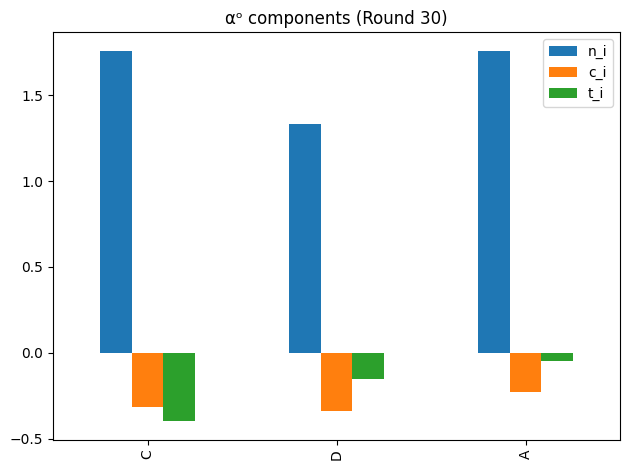

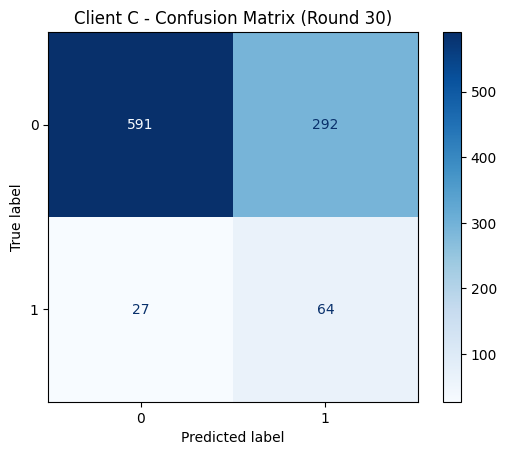


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9563    0.6693    0.7875       883
           1     0.1798    0.7033    0.2864        91

    accuracy                         0.6725       974
   macro avg     0.5680    0.6863    0.5369       974
weighted avg     0.8838    0.6725    0.7407       974



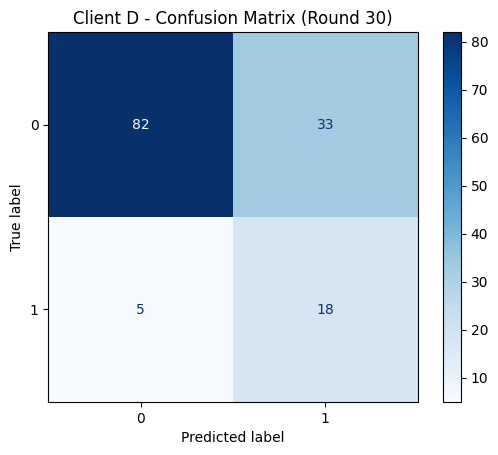


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9425    0.7130    0.8119       115
           1     0.3529    0.7826    0.4865        23

    accuracy                         0.7246       138
   macro avg     0.6477    0.7478    0.6492       138
weighted avg     0.8443    0.7246    0.7576       138



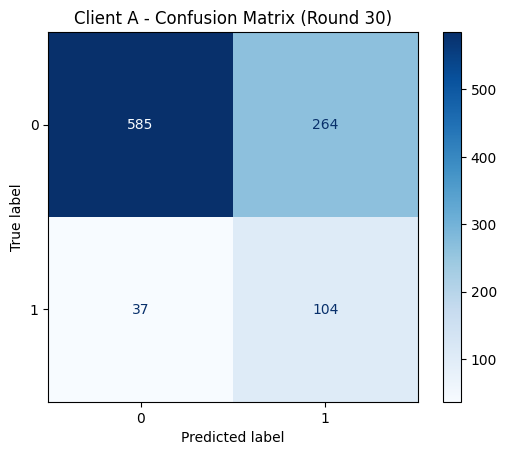


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9405    0.6890    0.7954       849
           1     0.2826    0.7376    0.4086       141

    accuracy                         0.6960       990
   macro avg     0.6116    0.7133    0.6020       990
weighted avg     0.8468    0.6960    0.7403       990


=== Round 31 ===
[Round 31] Global Accuracy: 0.6842 → 0.6798 | ΔW=0.2787

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

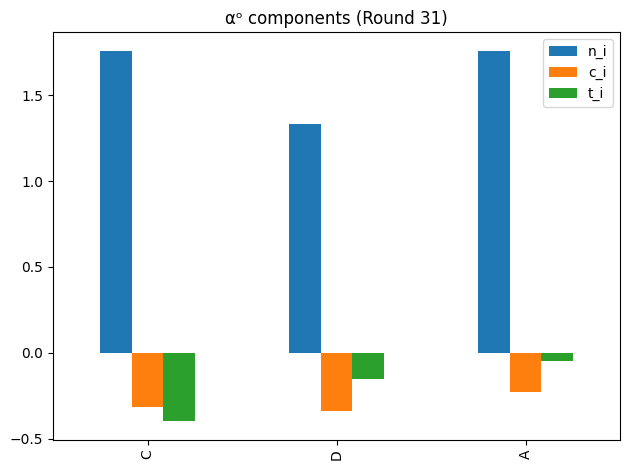

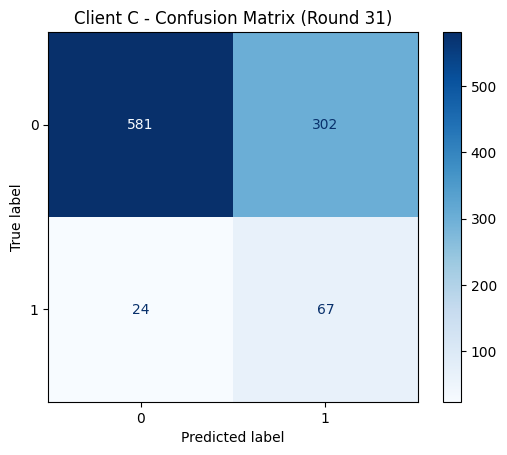


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9603    0.6580    0.7809       883
           1     0.1816    0.7363    0.2913        91

    accuracy                         0.6653       974
   macro avg     0.5710    0.6971    0.5361       974
weighted avg     0.8876    0.6653    0.7352       974



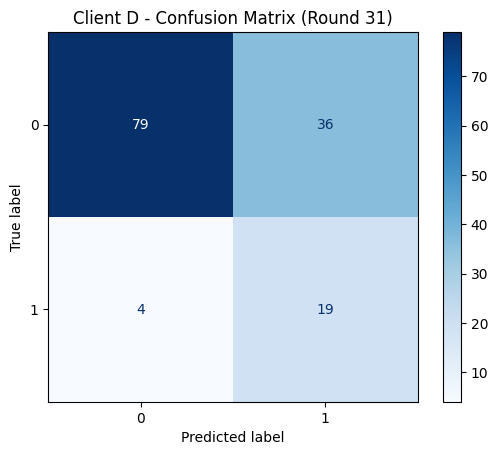


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9518    0.6870    0.7980       115
           1     0.3455    0.8261    0.4872        23

    accuracy                         0.7101       138
   macro avg     0.6486    0.7565    0.6426       138
weighted avg     0.8507    0.7101    0.7462       138



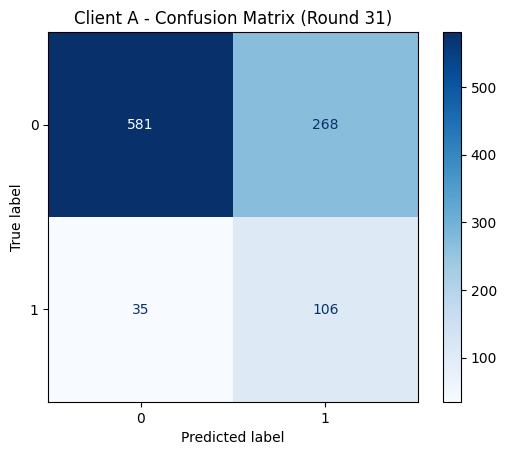


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9432    0.6843    0.7932       849
           1     0.2834    0.7518    0.4117       141

    accuracy                         0.6939       990
   macro avg     0.6133    0.7181    0.6024       990
weighted avg     0.8492    0.6939    0.7388       990


=== Round 32 ===
[Round 32] Global Accuracy: 0.6798 → 0.6727 | ΔW=0.3515

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

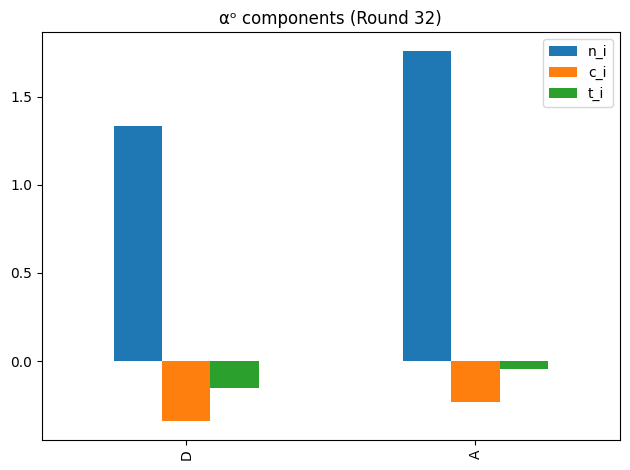

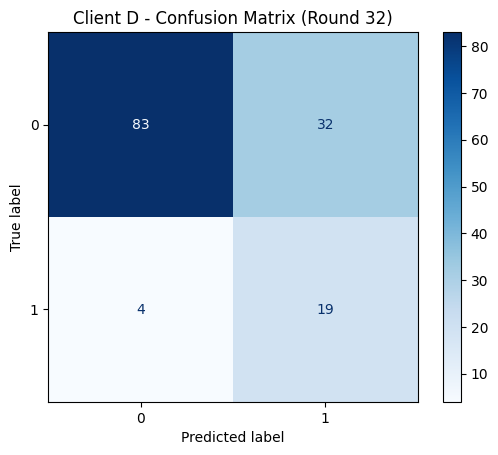


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9540    0.7217    0.8218       115
           1     0.3725    0.8261    0.5135        23

    accuracy                         0.7391       138
   macro avg     0.6633    0.7739    0.6676       138
weighted avg     0.8571    0.7391    0.7704       138



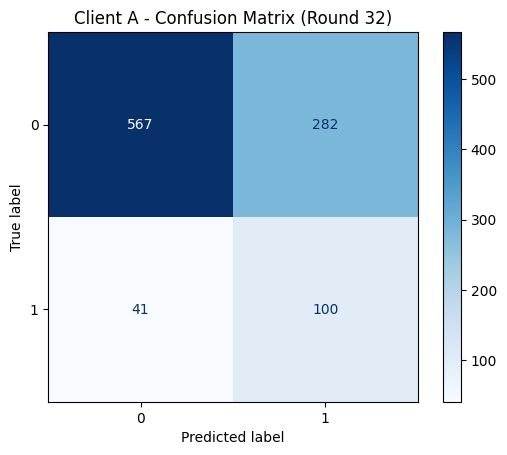


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9326    0.6678    0.7783       849
           1     0.2618    0.7092    0.3824       141

    accuracy                         0.6737       990
   macro avg     0.5972    0.6885    0.5804       990
weighted avg     0.8370    0.6737    0.7219       990


=== Round 33 ===
[Round 33] Global Accuracy: 0.6727 → 0.6776 | ΔW=0.3632

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

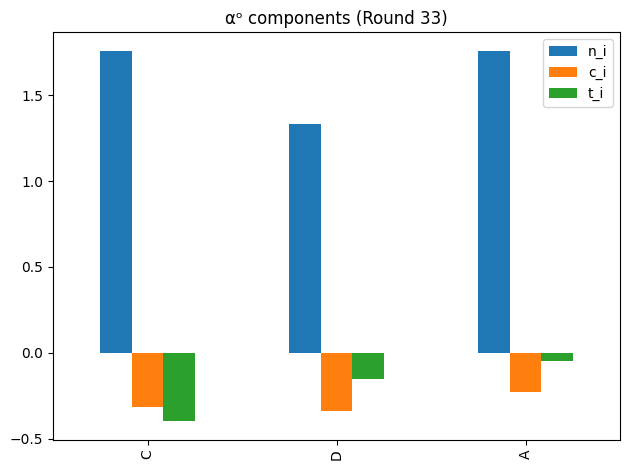

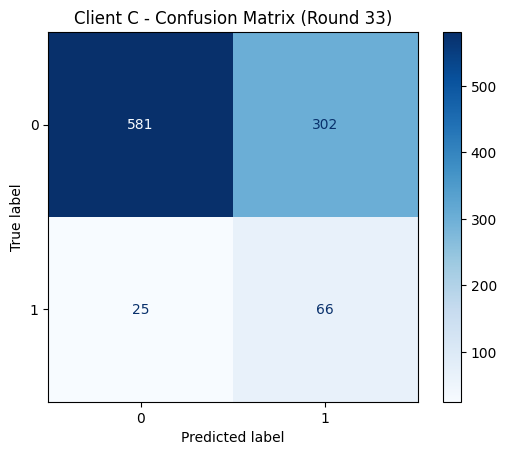


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9587    0.6580    0.7804       883
           1     0.1793    0.7253    0.2876        91

    accuracy                         0.6643       974
   macro avg     0.5690    0.6916    0.5340       974
weighted avg     0.8859    0.6643    0.7343       974



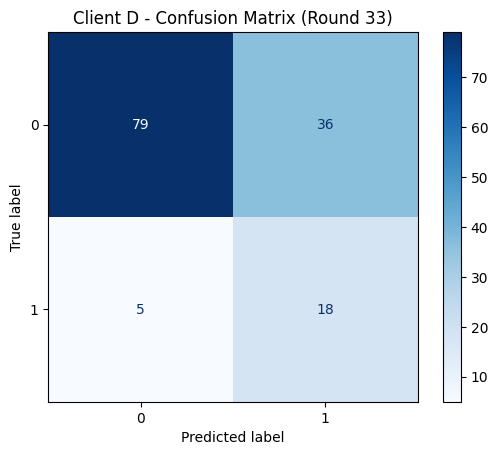


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9405    0.6870    0.7940       115
           1     0.3333    0.7826    0.4675        23

    accuracy                         0.7029       138
   macro avg     0.6369    0.7348    0.6308       138
weighted avg     0.8393    0.7029    0.7396       138



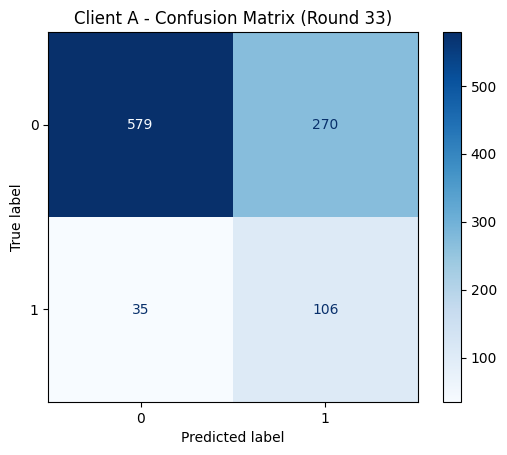


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9430    0.6820    0.7915       849
           1     0.2819    0.7518    0.4101       141

    accuracy                         0.6919       990
   macro avg     0.6125    0.7169    0.6008       990
weighted avg     0.8488    0.6919    0.7372       990


=== Round 34 ===
[Round 34] Global Accuracy: 0.6776 → 0.7059 | ΔW=0.2498

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

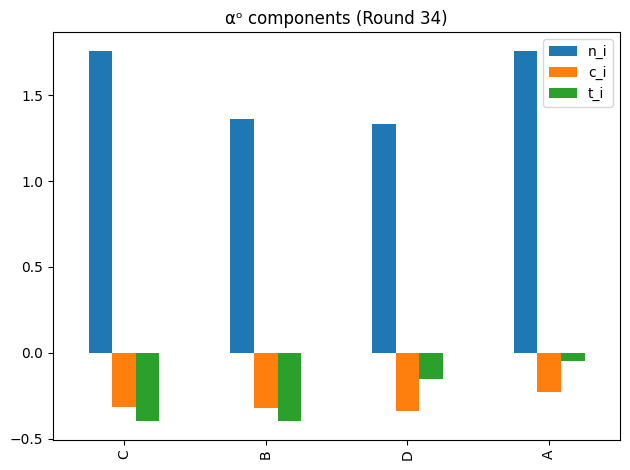

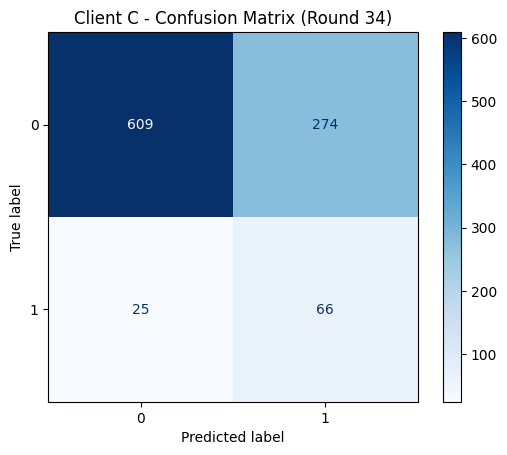


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9606    0.6897    0.8029       883
           1     0.1941    0.7253    0.3063        91

    accuracy                         0.6930       974
   macro avg     0.5773    0.7075    0.5546       974
weighted avg     0.8890    0.6930    0.7565       974



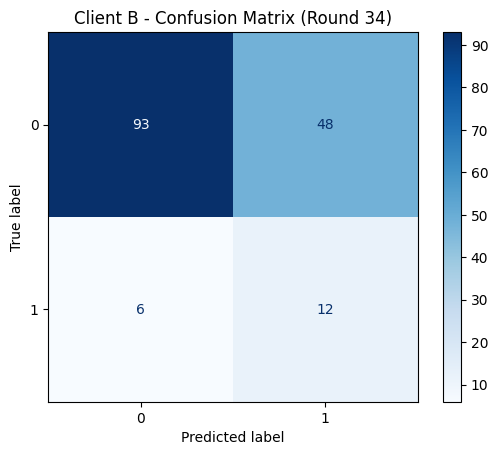


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9394    0.6596    0.7750       141
           1     0.2000    0.6667    0.3077        18

    accuracy                         0.6604       159
   macro avg     0.5697    0.6631    0.5413       159
weighted avg     0.8557    0.6604    0.7221       159



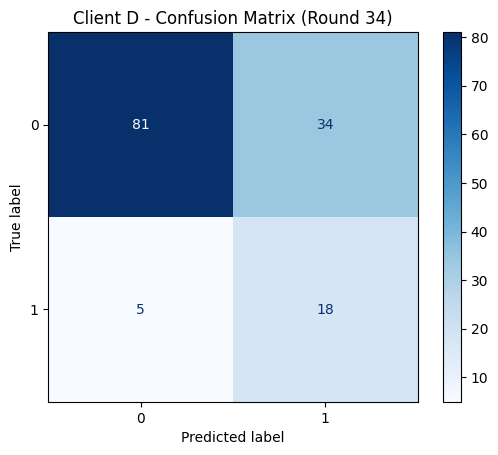


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9419    0.7043    0.8060       115
           1     0.3462    0.7826    0.4800        23

    accuracy                         0.7174       138
   macro avg     0.6440    0.7435    0.6430       138
weighted avg     0.8426    0.7174    0.7516       138



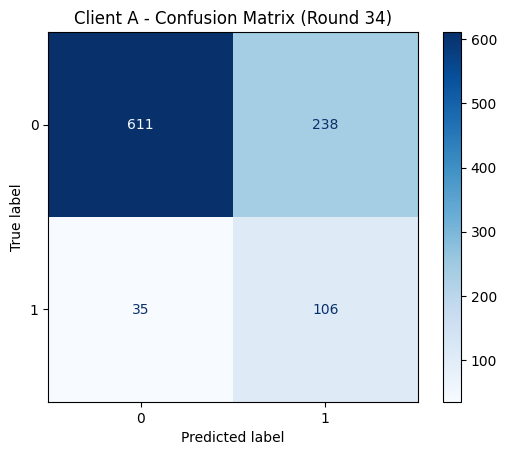


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9458    0.7197    0.8174       849
           1     0.3081    0.7518    0.4371       141

    accuracy                         0.7242       990
   macro avg     0.6270    0.7357    0.6273       990
weighted avg     0.8550    0.7242    0.7632       990


=== Round 35 ===
[Round 35] Global Accuracy: 0.7059 → 0.6939 | ΔW=0.3154

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

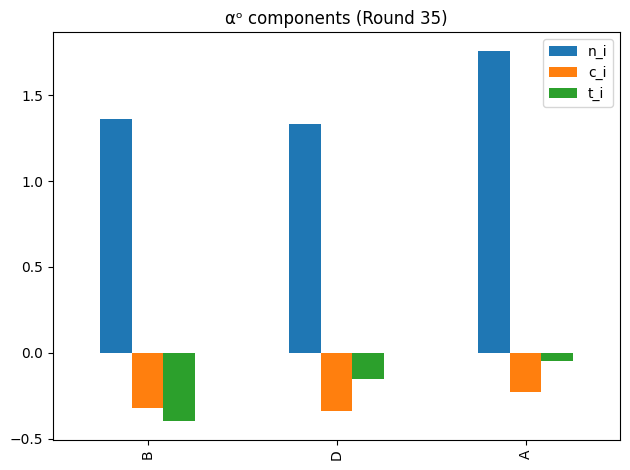

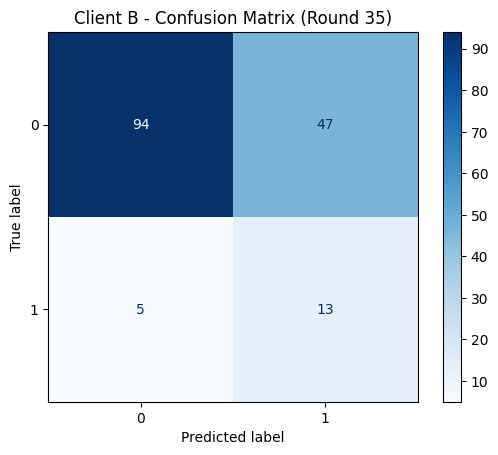


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9495    0.6667    0.7833       141
           1     0.2167    0.7222    0.3333        18

    accuracy                         0.6730       159
   macro avg     0.5831    0.6944    0.5583       159
weighted avg     0.8665    0.6730    0.7324       159



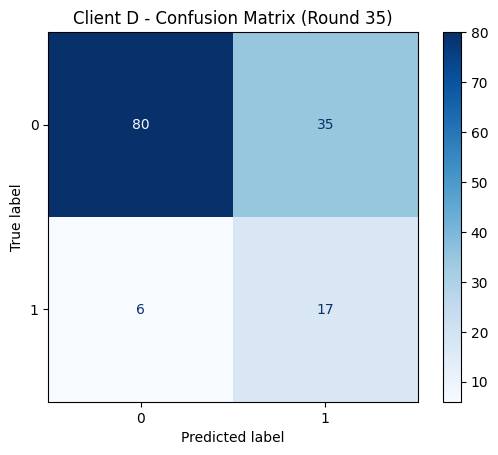


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9302    0.6957    0.7960       115
           1     0.3269    0.7391    0.4533        23

    accuracy                         0.7029       138
   macro avg     0.6286    0.7174    0.6247       138
weighted avg     0.8297    0.7029    0.7389       138



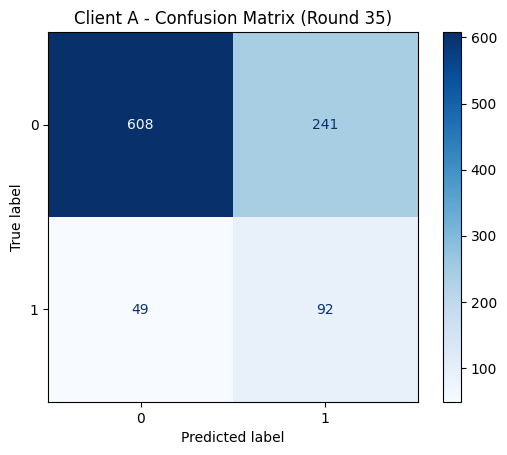


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9254    0.7161    0.8074       849
           1     0.2763    0.6525    0.3882       141

    accuracy                         0.7071       990
   macro avg     0.6008    0.6843    0.5978       990
weighted avg     0.8330    0.7071    0.7477       990


=== Round 36 ===
[Round 36] Global Accuracy: 0.6939 → 0.7099 | ΔW=0.2640

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

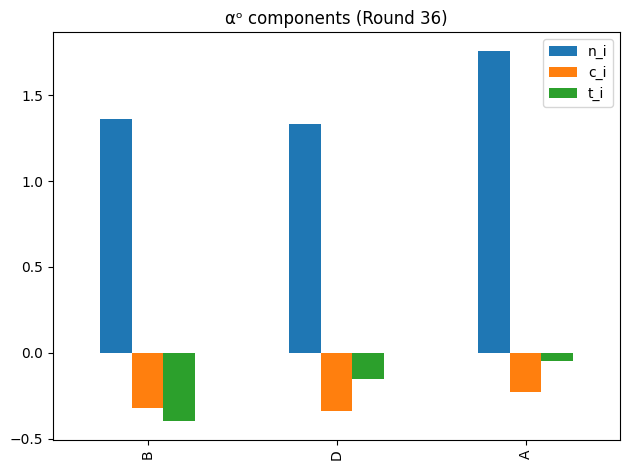

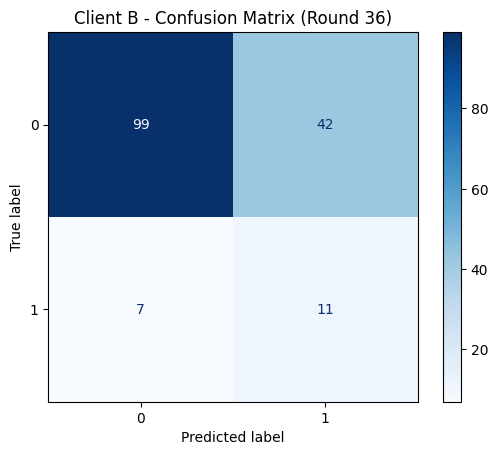


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9340    0.7021    0.8016       141
           1     0.2075    0.6111    0.3099        18

    accuracy                         0.6918       159
   macro avg     0.5708    0.6566    0.5557       159
weighted avg     0.8517    0.6918    0.7459       159



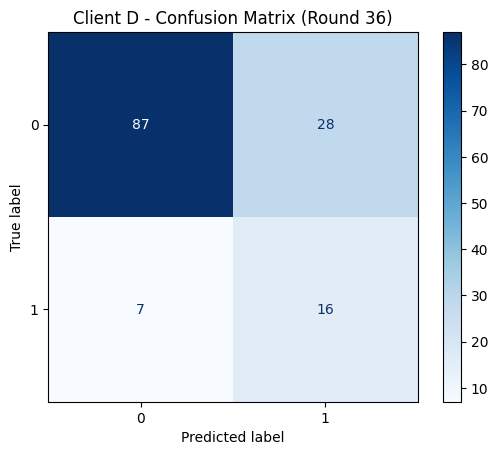


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9255    0.7565    0.8325       115
           1     0.3636    0.6957    0.4776        23

    accuracy                         0.7464       138
   macro avg     0.6446    0.7261    0.6551       138
weighted avg     0.8319    0.7464    0.7734       138



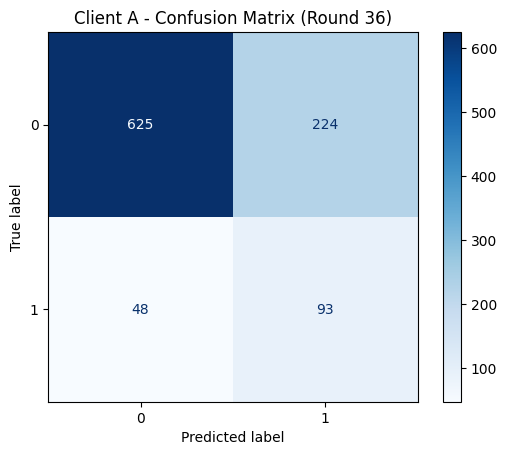


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9287    0.7362    0.8213       849
           1     0.2934    0.6596    0.4061       141

    accuracy                         0.7253       990
   macro avg     0.6110    0.6979    0.6137       990
weighted avg     0.8382    0.7253    0.7622       990


=== Round 37 ===
[Round 37] Global Accuracy: 0.7099 → 0.6944 | ΔW=0.2565

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

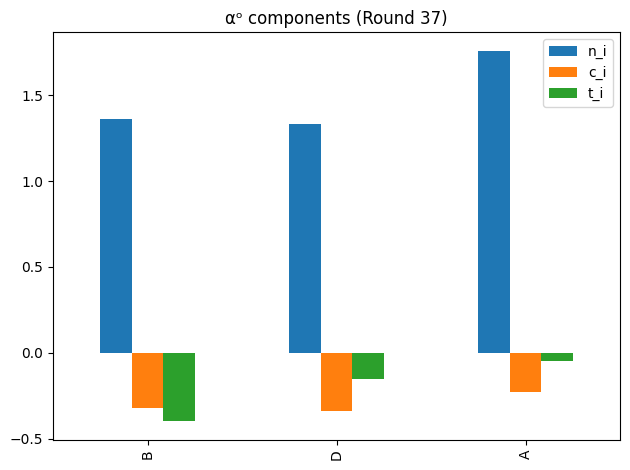

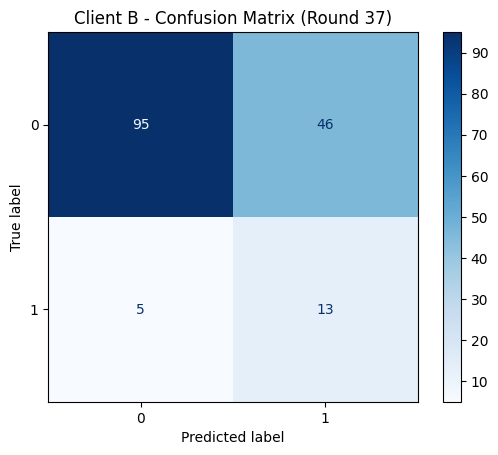


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9500    0.6738    0.7884       141
           1     0.2203    0.7222    0.3377        18

    accuracy                         0.6792       159
   macro avg     0.5852    0.6980    0.5630       159
weighted avg     0.8674    0.6792    0.7374       159



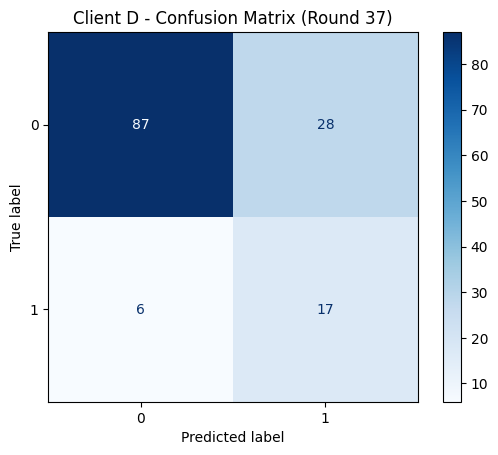


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9355    0.7565    0.8365       115
           1     0.3778    0.7391    0.5000        23

    accuracy                         0.7536       138
   macro avg     0.6566    0.7478    0.6683       138
weighted avg     0.8425    0.7536    0.7804       138



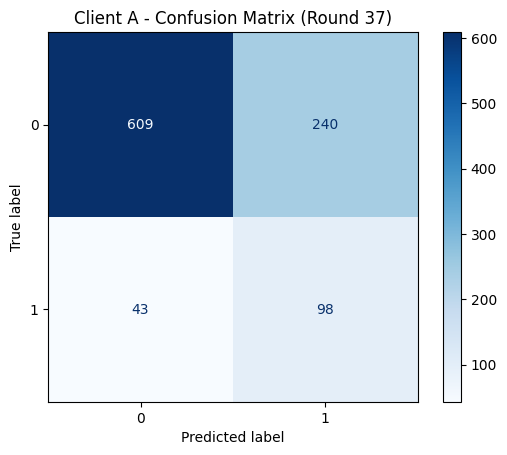


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9340    0.7173    0.8115       849
           1     0.2899    0.6950    0.4092       141

    accuracy                         0.7141       990
   macro avg     0.6120    0.7062    0.6103       990
weighted avg     0.8423    0.7141    0.7542       990


=== Round 38 ===
[Round 38] Global Accuracy: 0.6944 → 0.6944 | ΔW=0.3208

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

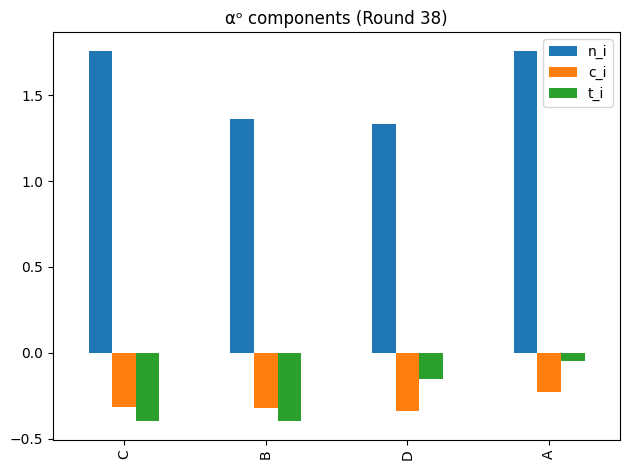

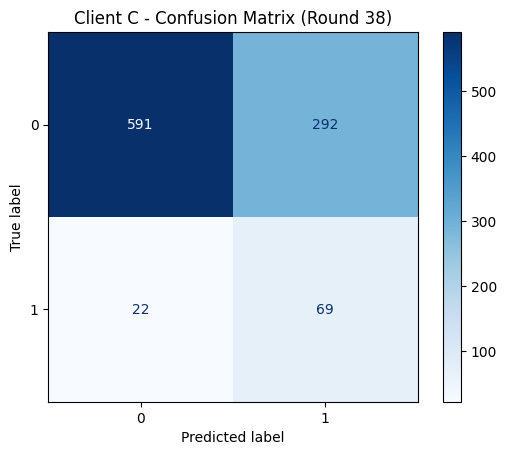


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9641    0.6693    0.7901       883
           1     0.1911    0.7582    0.3053        91

    accuracy                         0.6776       974
   macro avg     0.5776    0.7138    0.5477       974
weighted avg     0.8919    0.6776    0.7448       974



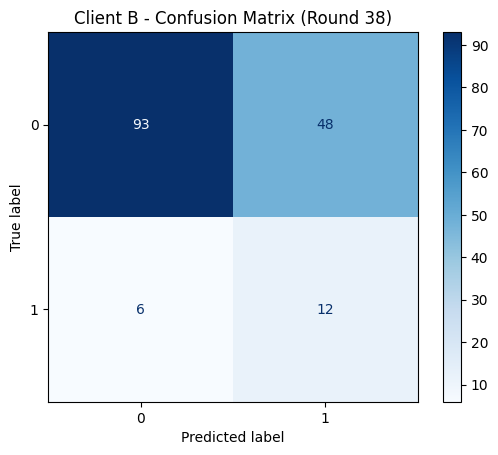


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9394    0.6596    0.7750       141
           1     0.2000    0.6667    0.3077        18

    accuracy                         0.6604       159
   macro avg     0.5697    0.6631    0.5413       159
weighted avg     0.8557    0.6604    0.7221       159



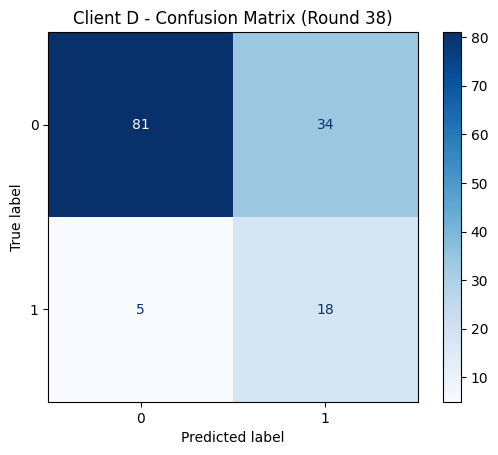


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9419    0.7043    0.8060       115
           1     0.3462    0.7826    0.4800        23

    accuracy                         0.7174       138
   macro avg     0.6440    0.7435    0.6430       138
weighted avg     0.8426    0.7174    0.7516       138



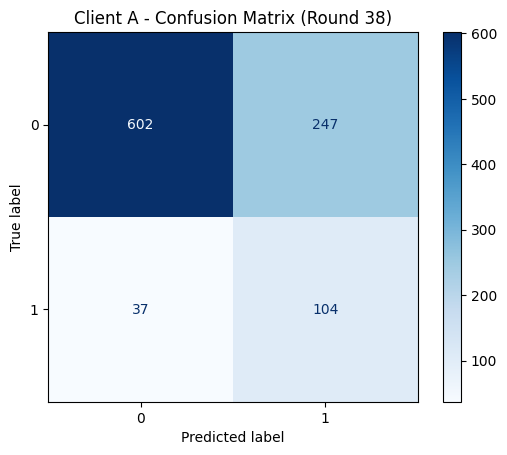


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9421    0.7091    0.8091       849
           1     0.2963    0.7376    0.4228       141

    accuracy                         0.7131       990
   macro avg     0.6192    0.7233    0.6160       990
weighted avg     0.8501    0.7131    0.7541       990


=== Round 39 ===
[Round 39] Global Accuracy: 0.6944 → 0.6979 | ΔW=0.2573

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

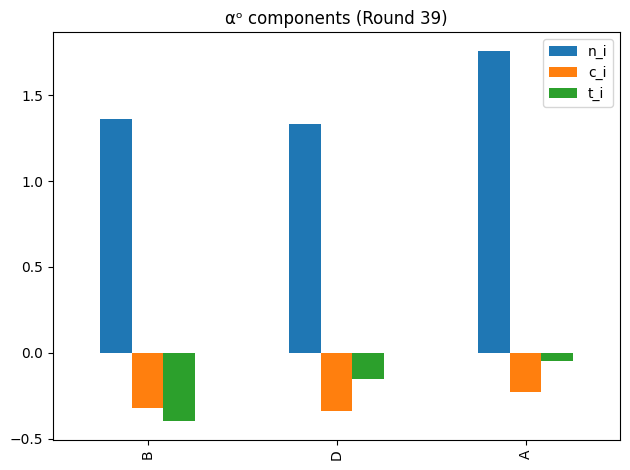

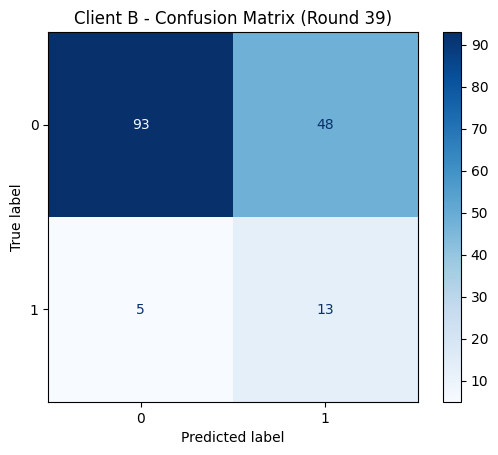


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9490    0.6596    0.7782       141
           1     0.2131    0.7222    0.3291        18

    accuracy                         0.6667       159
   macro avg     0.5810    0.6909    0.5537       159
weighted avg     0.8657    0.6667    0.7274       159



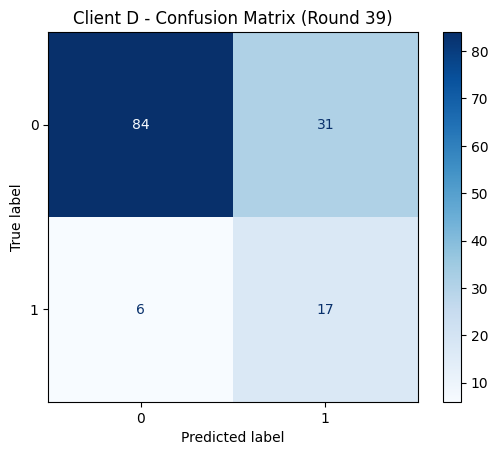


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9333    0.7304    0.8195       115
           1     0.3542    0.7391    0.4789        23

    accuracy                         0.7319       138
   macro avg     0.6438    0.7348    0.6492       138
weighted avg     0.8368    0.7319    0.7627       138



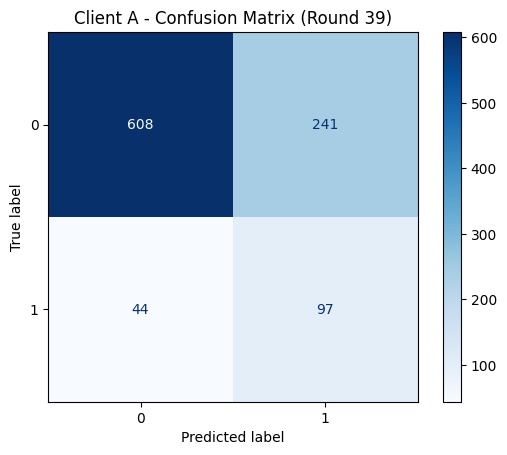


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9325    0.7161    0.8101       849
           1     0.2870    0.6879    0.4050       141

    accuracy                         0.7121       990
   macro avg     0.6097    0.7020    0.6076       990
weighted avg     0.8406    0.7121    0.7524       990


=== Round 40 ===
[Round 40] Global Accuracy: 0.6979 → 0.7001 | ΔW=0.3454

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

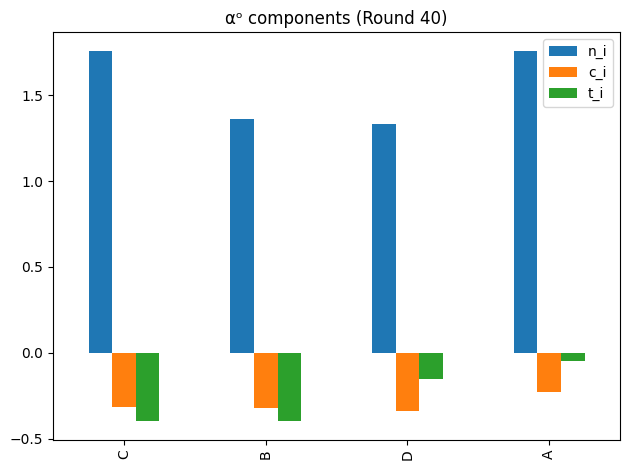

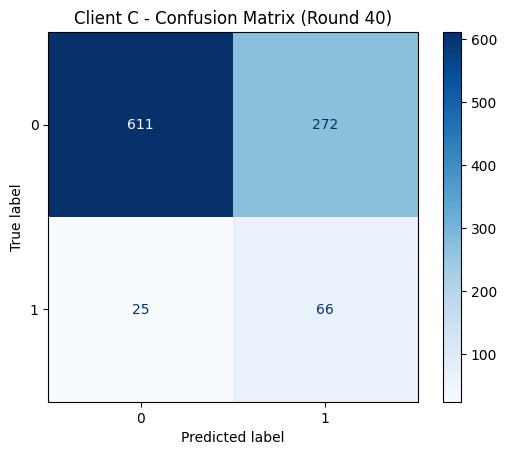


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9607    0.6920    0.8045       883
           1     0.1953    0.7253    0.3077        91

    accuracy                         0.6951       974
   macro avg     0.5780    0.7086    0.5561       974
weighted avg     0.8892    0.6951    0.7581       974



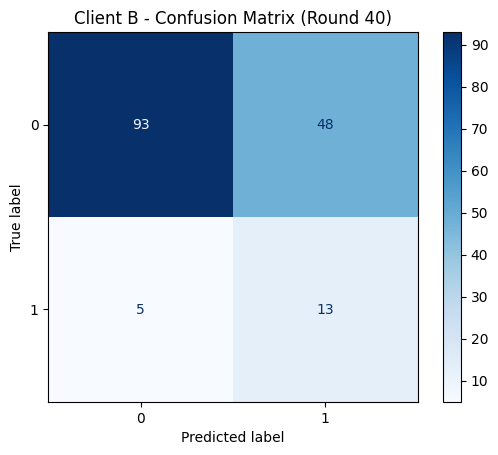


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9490    0.6596    0.7782       141
           1     0.2131    0.7222    0.3291        18

    accuracy                         0.6667       159
   macro avg     0.5810    0.6909    0.5537       159
weighted avg     0.8657    0.6667    0.7274       159



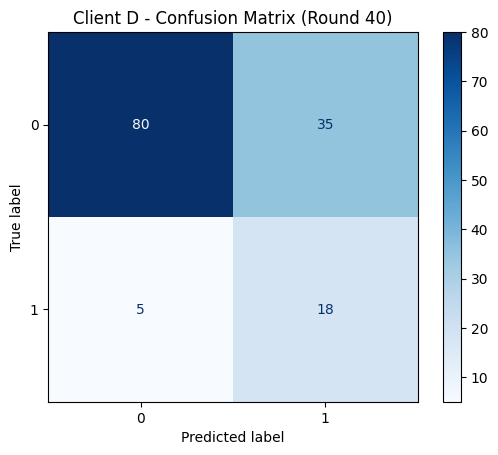


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9412    0.6957    0.8000       115
           1     0.3396    0.7826    0.4737        23

    accuracy                         0.7101       138
   macro avg     0.6404    0.7391    0.6368       138
weighted avg     0.8409    0.7101    0.7456       138



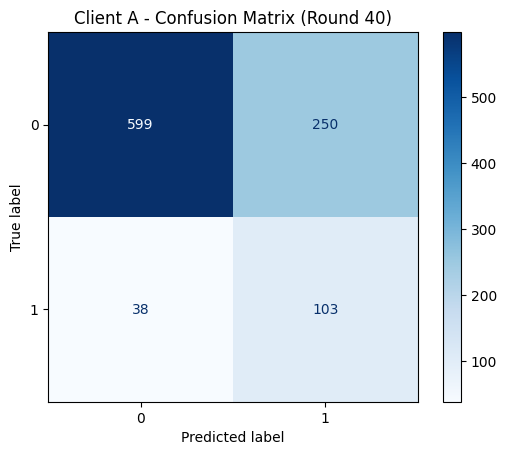


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9403    0.7055    0.8062       849
           1     0.2918    0.7305    0.4170       141

    accuracy                         0.7091       990
   macro avg     0.6161    0.7180    0.6116       990
weighted avg     0.8480    0.7091    0.7508       990


=== Round 41 ===
[Round 41] Global Accuracy: 0.7001 → 0.7121 | ΔW=0.2482

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

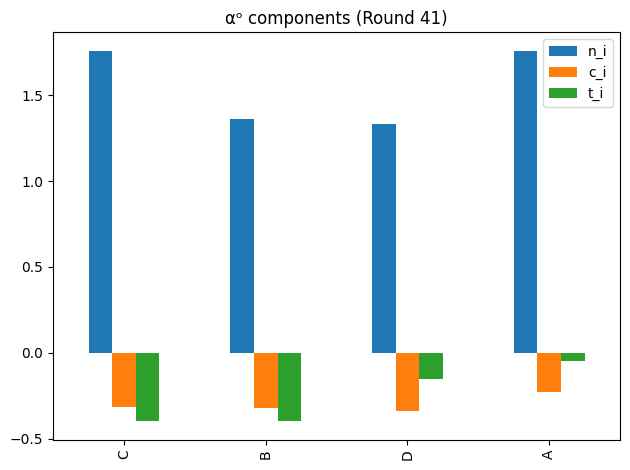

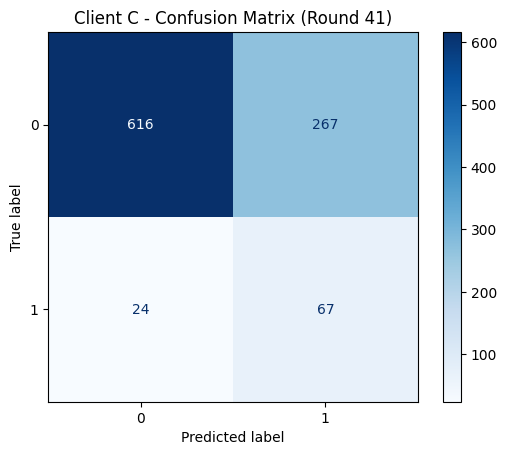


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9625    0.6976    0.8089       883
           1     0.2006    0.7363    0.3153        91

    accuracy                         0.7012       974
   macro avg     0.5815    0.7169    0.5621       974
weighted avg     0.8913    0.7012    0.7628       974



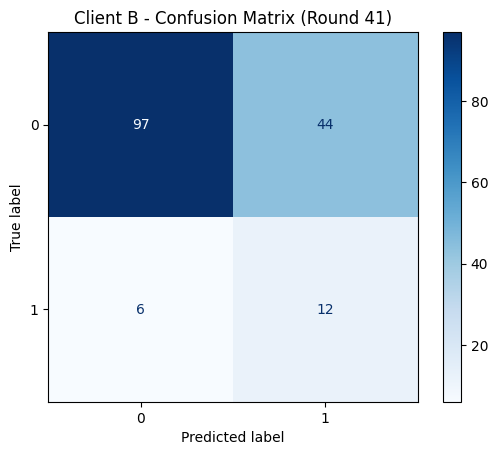


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9417    0.6879    0.7951       141
           1     0.2143    0.6667    0.3243        18

    accuracy                         0.6855       159
   macro avg     0.5780    0.6773    0.5597       159
weighted avg     0.8594    0.6855    0.7418       159



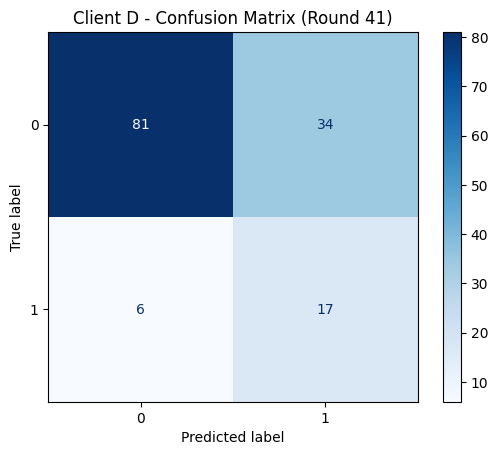


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9310    0.7043    0.8020       115
           1     0.3333    0.7391    0.4595        23

    accuracy                         0.7101       138
   macro avg     0.6322    0.7217    0.6307       138
weighted avg     0.8314    0.7101    0.7449       138



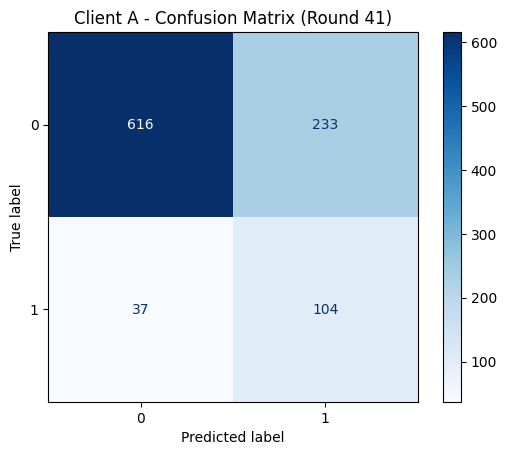


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9433    0.7256    0.8202       849
           1     0.3086    0.7376    0.4351       141

    accuracy                         0.7273       990
   macro avg     0.6260    0.7316    0.6277       990
weighted avg     0.8529    0.7273    0.7654       990


=== Round 42 ===
[Round 42] Global Accuracy: 0.7121 → 0.6984 | ΔW=0.3067

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

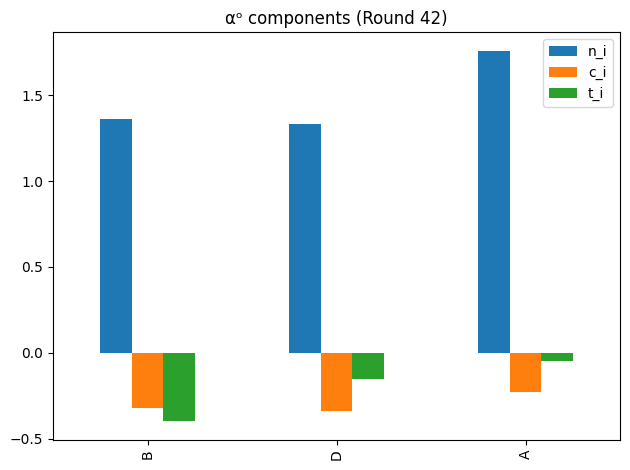

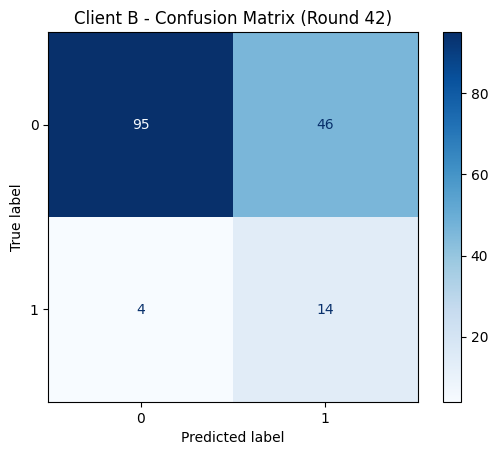


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9596    0.6738    0.7917       141
           1     0.2333    0.7778    0.3590        18

    accuracy                         0.6855       159
   macro avg     0.5965    0.7258    0.5753       159
weighted avg     0.8774    0.6855    0.7427       159



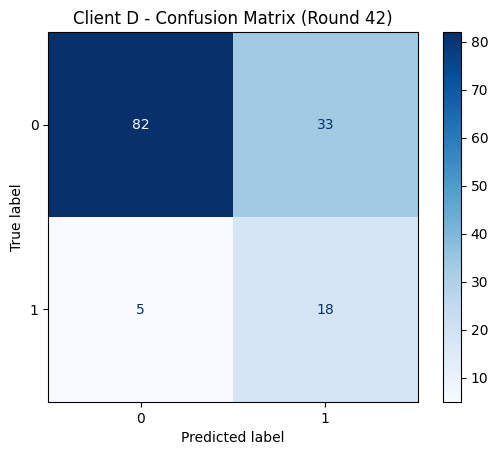


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9425    0.7130    0.8119       115
           1     0.3529    0.7826    0.4865        23

    accuracy                         0.7246       138
   macro avg     0.6477    0.7478    0.6492       138
weighted avg     0.8443    0.7246    0.7576       138



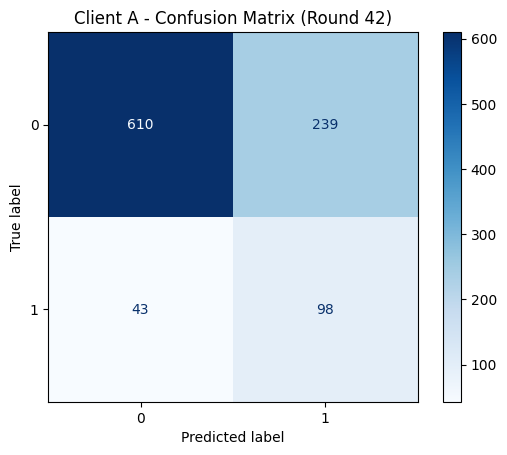


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9342    0.7185    0.8123       849
           1     0.2908    0.6950    0.4100       141

    accuracy                         0.7152       990
   macro avg     0.6125    0.7068    0.6111       990
weighted avg     0.8425    0.7152    0.7550       990


=== Round 43 ===
[Round 43] Global Accuracy: 0.6984 → 0.6754 | ΔW=0.3513

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

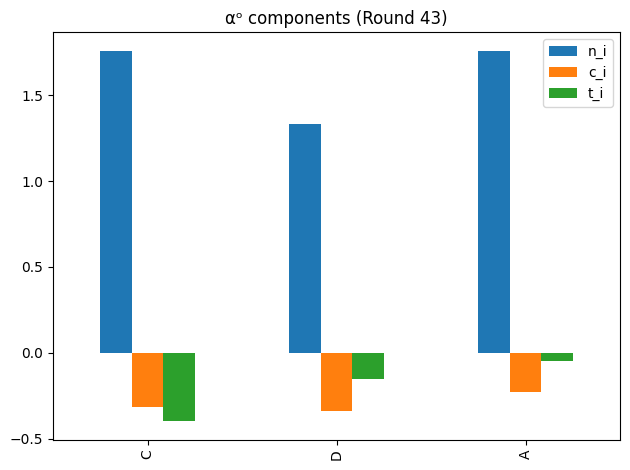

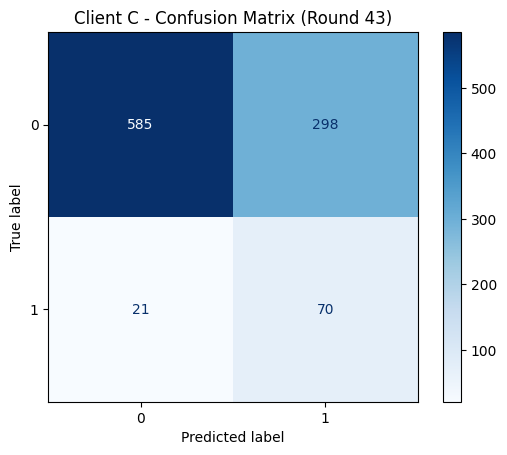


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9653    0.6625    0.7858       883
           1     0.1902    0.7692    0.3050        91

    accuracy                         0.6725       974
   macro avg     0.5778    0.7159    0.5454       974
weighted avg     0.8929    0.6725    0.7408       974



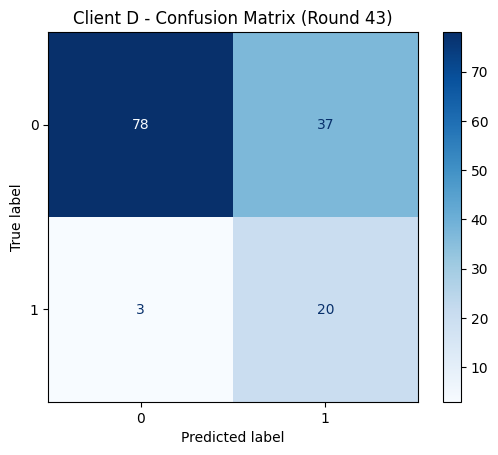


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9630    0.6783    0.7959       115
           1     0.3509    0.8696    0.5000        23

    accuracy                         0.7101       138
   macro avg     0.6569    0.7739    0.6480       138
weighted avg     0.8609    0.7101    0.7466       138



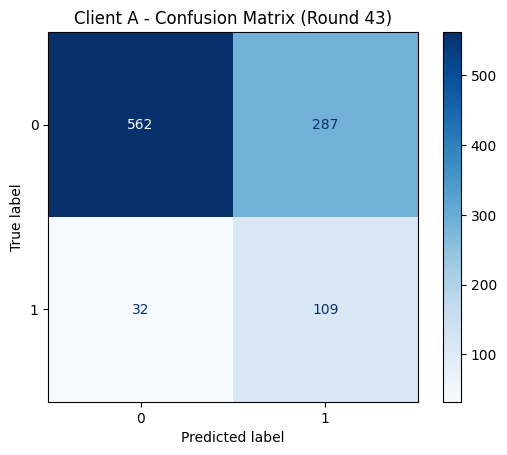


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9461    0.6620    0.7789       849
           1     0.2753    0.7730    0.4060       141

    accuracy                         0.6778       990
   macro avg     0.6107    0.7175    0.5924       990
weighted avg     0.8506    0.6778    0.7258       990


=== Round 44 ===
[Round 44] Global Accuracy: 0.6754 → 0.7081 | ΔW=0.3934

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

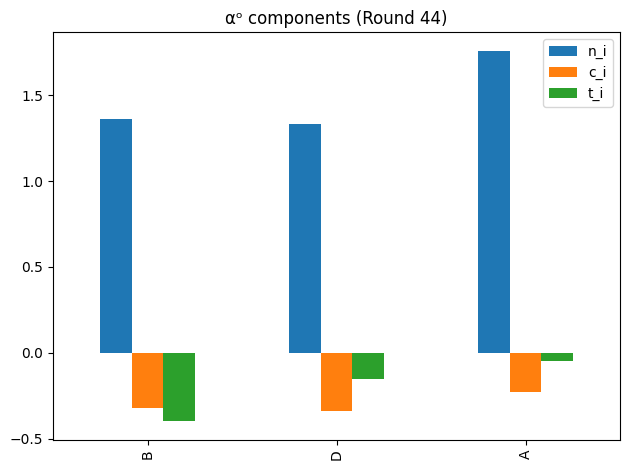

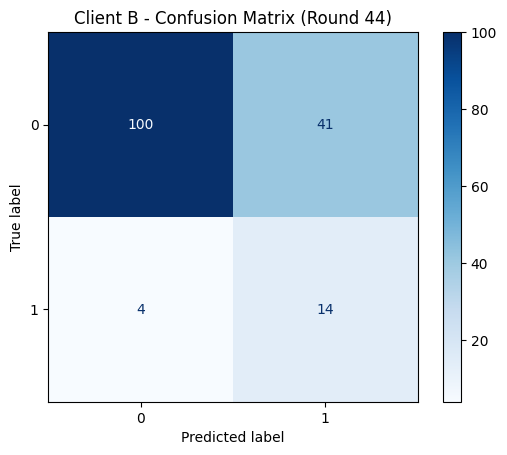


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9615    0.7092    0.8163       141
           1     0.2545    0.7778    0.3836        18

    accuracy                         0.7170       159
   macro avg     0.6080    0.7435    0.5999       159
weighted avg     0.8815    0.7170    0.7673       159



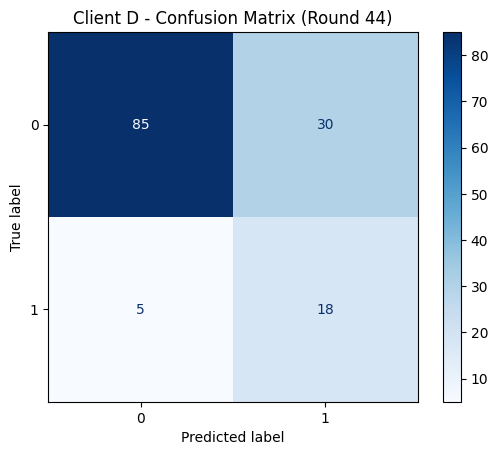


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9444    0.7391    0.8293       115
           1     0.3750    0.7826    0.5070        23

    accuracy                         0.7464       138
   macro avg     0.6597    0.7609    0.6682       138
weighted avg     0.8495    0.7464    0.7756       138



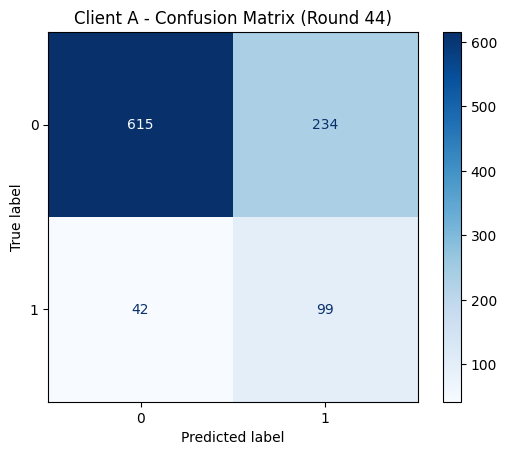


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9361    0.7244    0.8167       849
           1     0.2973    0.7021    0.4177       141

    accuracy                         0.7212       990
   macro avg     0.6167    0.7133    0.6172       990
weighted avg     0.8451    0.7212    0.7599       990


=== Round 45 ===
[Round 45] Global Accuracy: 0.7081 → 0.7112 | ΔW=0.3339

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

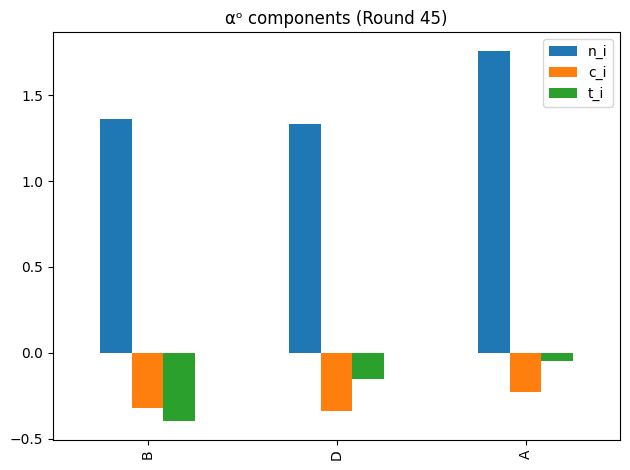

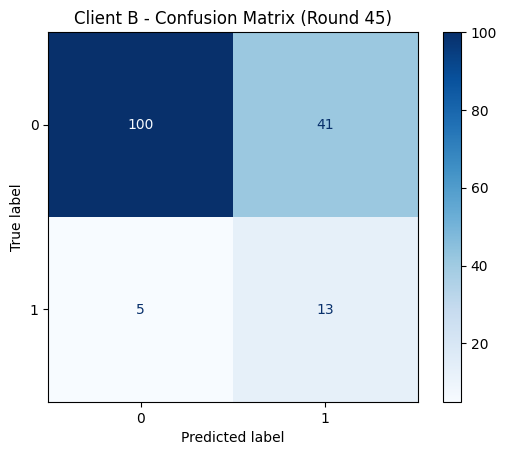


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9524    0.7092    0.8130       141
           1     0.2407    0.7222    0.3611        18

    accuracy                         0.7107       159
   macro avg     0.5966    0.7157    0.5871       159
weighted avg     0.8718    0.7107    0.7618       159



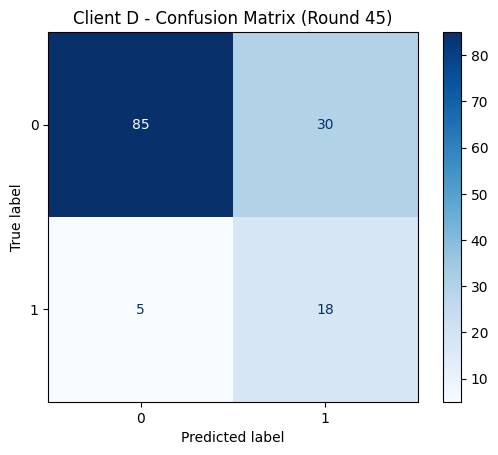


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9444    0.7391    0.8293       115
           1     0.3750    0.7826    0.5070        23

    accuracy                         0.7464       138
   macro avg     0.6597    0.7609    0.6682       138
weighted avg     0.8495    0.7464    0.7756       138



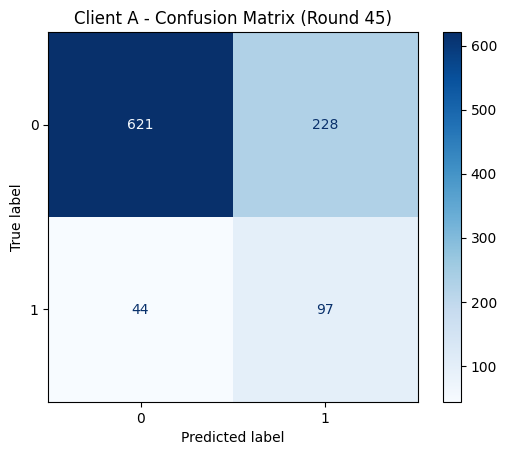


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9338    0.7314    0.8203       849
           1     0.2985    0.6879    0.4163       141

    accuracy                         0.7253       990
   macro avg     0.6161    0.7097    0.6183       990
weighted avg     0.8433    0.7253    0.7628       990


=== Round 46 ===
[Round 46] Global Accuracy: 0.7112 → 0.6652 | ΔW=0.4008

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

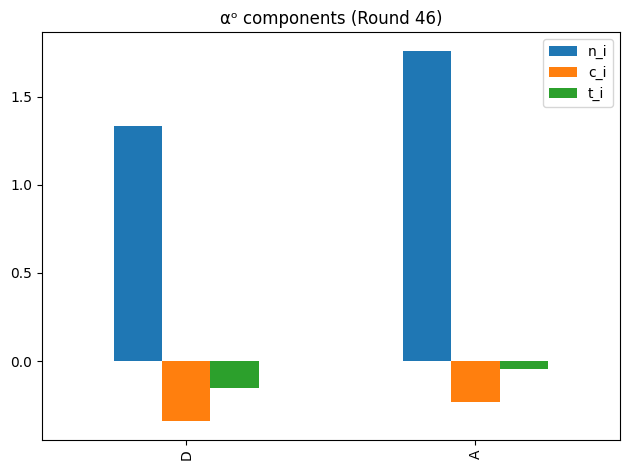

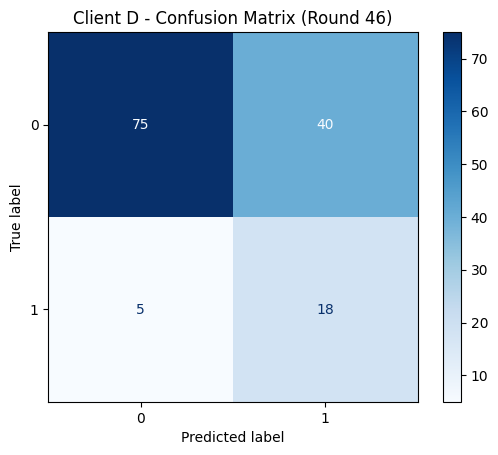


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9375    0.6522    0.7692       115
           1     0.3103    0.7826    0.4444        23

    accuracy                         0.6739       138
   macro avg     0.6239    0.7174    0.6068       138
weighted avg     0.8330    0.6739    0.7151       138



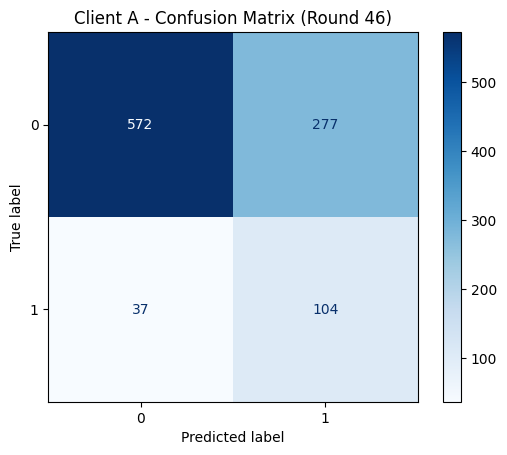


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9392    0.6737    0.7846       849
           1     0.2730    0.7376    0.3985       141

    accuracy                         0.6828       990
   macro avg     0.6061    0.7057    0.5916       990
weighted avg     0.8444    0.6828    0.7296       990


=== Round 47 ===
[Round 47] Global Accuracy: 0.6652 → 0.6962 | ΔW=0.3314

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

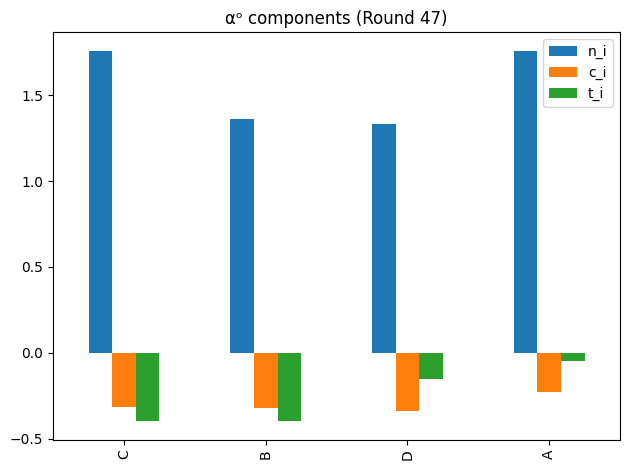

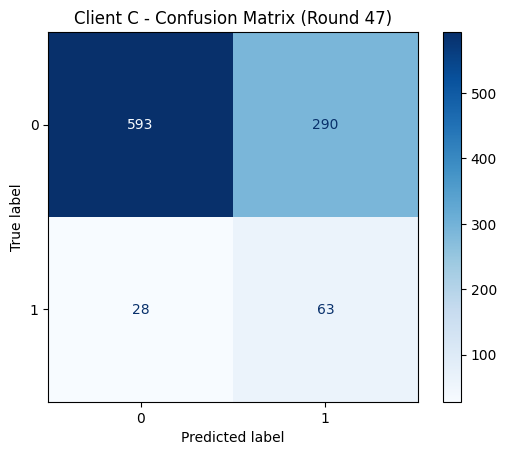


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9549    0.6716    0.7886       883
           1     0.1785    0.6923    0.2838        91

    accuracy                         0.6735       974
   macro avg     0.5667    0.6819    0.5362       974
weighted avg     0.8824    0.6735    0.7414       974



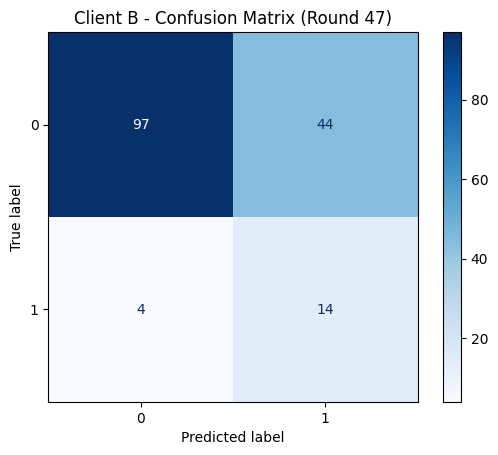


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9604    0.6879    0.8017       141
           1     0.2414    0.7778    0.3684        18

    accuracy                         0.6981       159
   macro avg     0.6009    0.7329    0.5850       159
weighted avg     0.8790    0.6981    0.7526       159



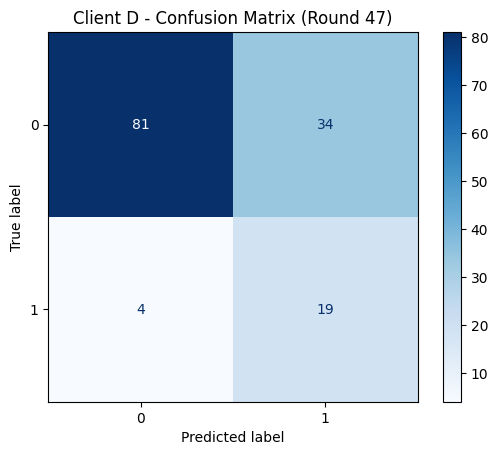


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9529    0.7043    0.8100       115
           1     0.3585    0.8261    0.5000        23

    accuracy                         0.7246       138
   macro avg     0.6557    0.7652    0.6550       138
weighted avg     0.8539    0.7246    0.7583       138



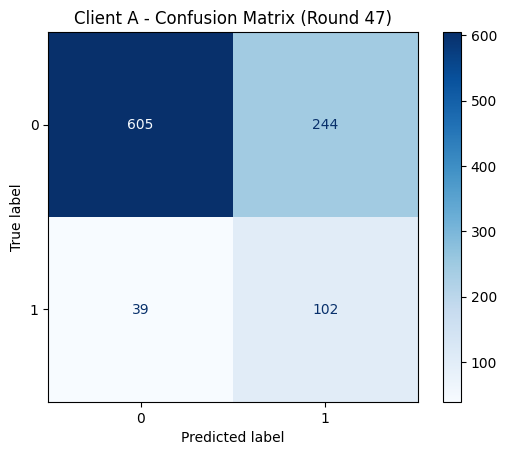


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9394    0.7126    0.8104       849
           1     0.2948    0.7234    0.4189       141

    accuracy                         0.7141       990
   macro avg     0.6171    0.7180    0.6147       990
weighted avg     0.8476    0.7141    0.7547       990


=== Round 48 ===
[Round 48] Global Accuracy: 0.6962 → 0.6917 | ΔW=0.2337

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

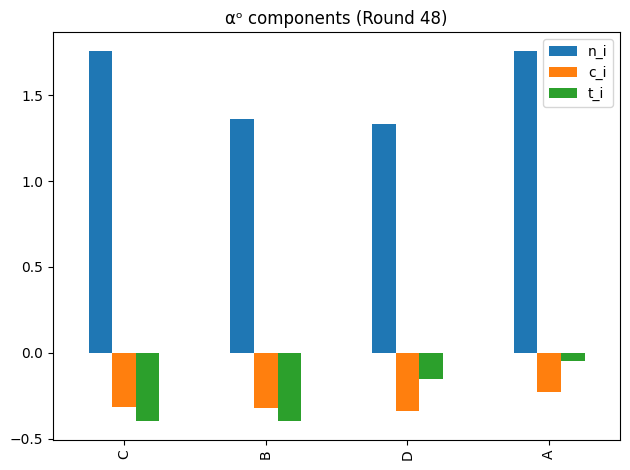

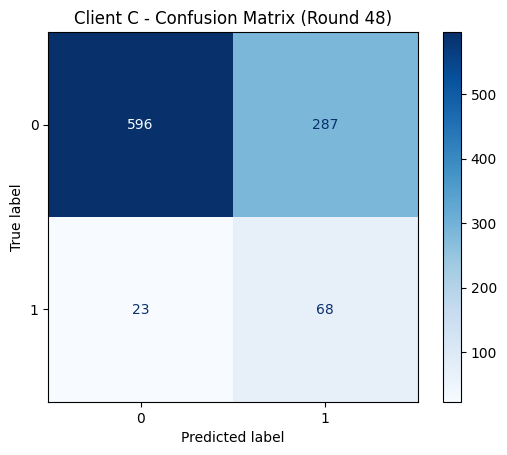


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9628    0.6750    0.7936       883
           1     0.1915    0.7473    0.3049        91

    accuracy                         0.6817       974
   macro avg     0.5772    0.7111    0.5493       974
weighted avg     0.8908    0.6817    0.7480       974



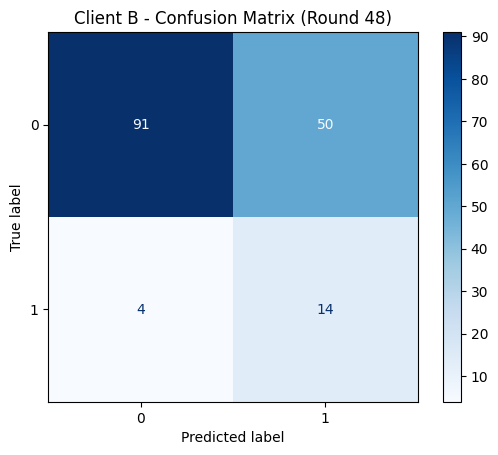


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9579    0.6454    0.7712       141
           1     0.2188    0.7778    0.3415        18

    accuracy                         0.6604       159
   macro avg     0.5883    0.7116    0.5563       159
weighted avg     0.8742    0.6604    0.7225       159



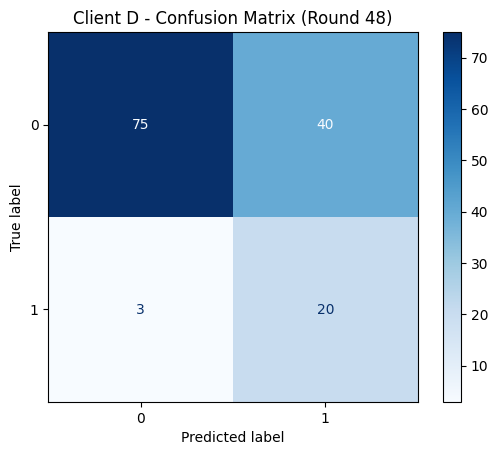


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9615    0.6522    0.7772       115
           1     0.3333    0.8696    0.4819        23

    accuracy                         0.6884       138
   macro avg     0.6474    0.7609    0.6296       138
weighted avg     0.8568    0.6884    0.7280       138



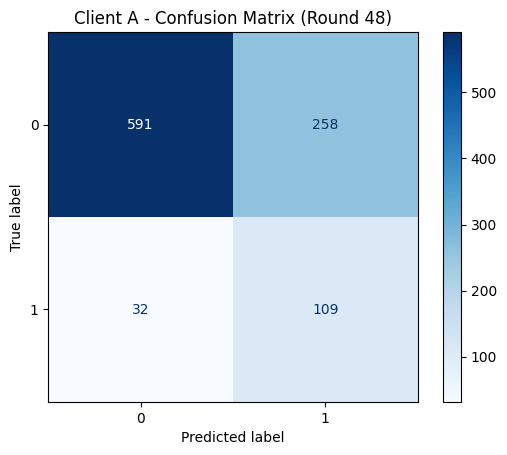


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9486    0.6961    0.8030       849
           1     0.2970    0.7730    0.4291       141

    accuracy                         0.7071       990
   macro avg     0.6228    0.7346    0.6161       990
weighted avg     0.8558    0.7071    0.7497       990


=== Round 49 ===
[Round 49] Global Accuracy: 0.6917 → 0.7196 | ΔW=0.3212

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

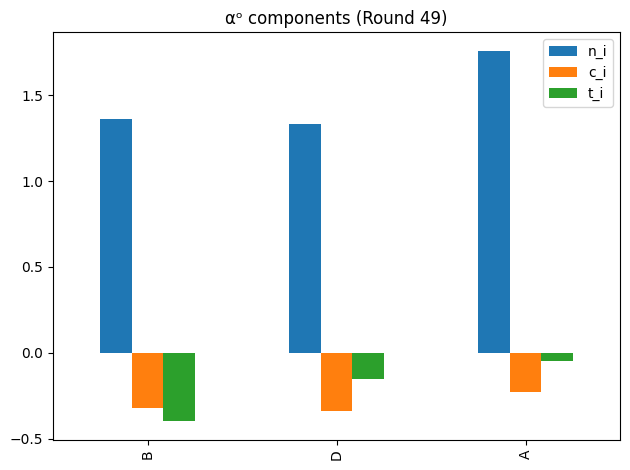

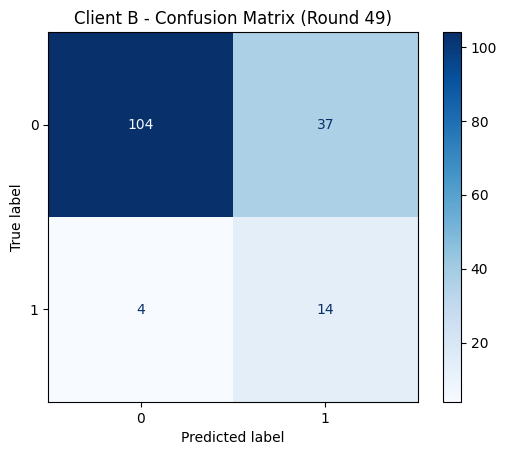


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9630    0.7376    0.8353       141
           1     0.2745    0.7778    0.4058        18

    accuracy                         0.7421       159
   macro avg     0.6187    0.7577    0.6206       159
weighted avg     0.8850    0.7421    0.7867       159



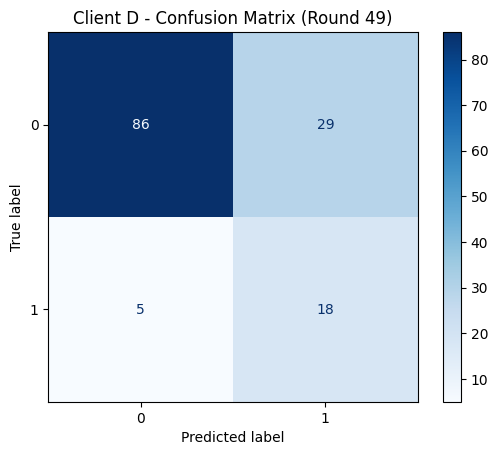


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9451    0.7478    0.8350       115
           1     0.3830    0.7826    0.5143        23

    accuracy                         0.7536       138
   macro avg     0.6640    0.7652    0.6746       138
weighted avg     0.8514    0.7536    0.7815       138



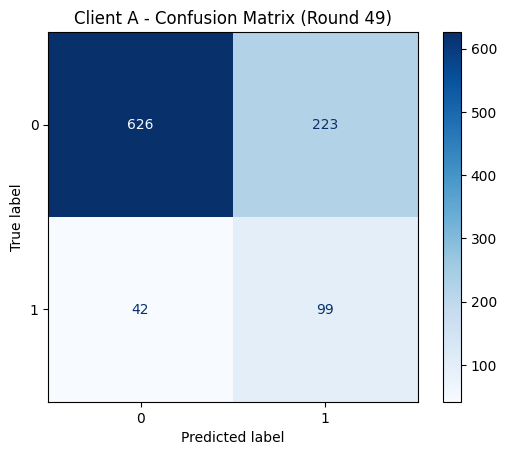


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9371    0.7373    0.8253       849
           1     0.3075    0.7021    0.4276       141

    accuracy                         0.7323       990
   macro avg     0.6223    0.7197    0.6265       990
weighted avg     0.8474    0.7323    0.7687       990


=== Round 50 ===
[Round 50] Global Accuracy: 0.7196 → 0.7006 | ΔW=0.3664

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
C  56.9649  0.4854  0.4
B  23.0217  0.4766  0.4
D  21.4476  0.4571  0.7
A  57.4456  0.5894  0.9


<Figure size 600x400 with 0 Axes>

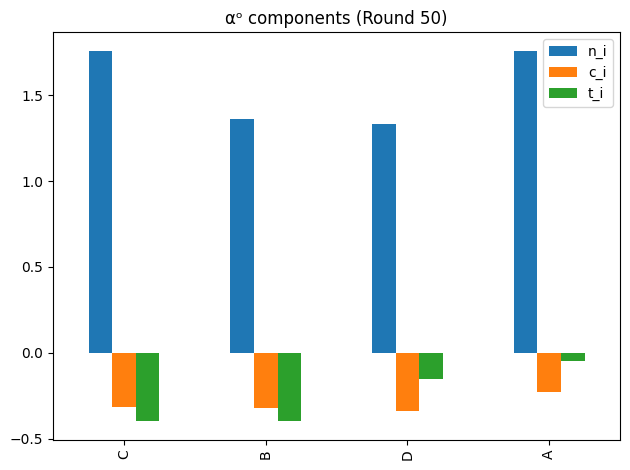

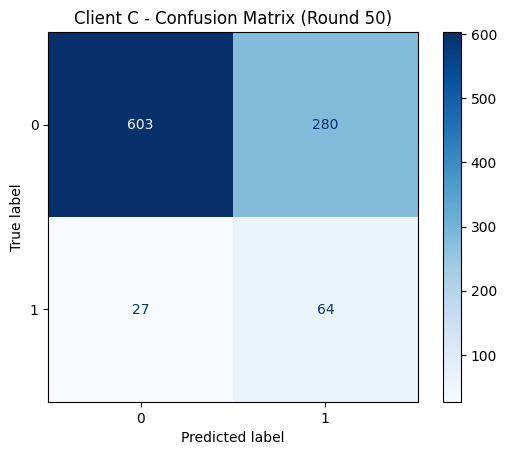


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9571    0.6829    0.7971       883
           1     0.1860    0.7033    0.2943        91

    accuracy                         0.6848       974
   macro avg     0.5716    0.6931    0.5457       974
weighted avg     0.8851    0.6848    0.7501       974



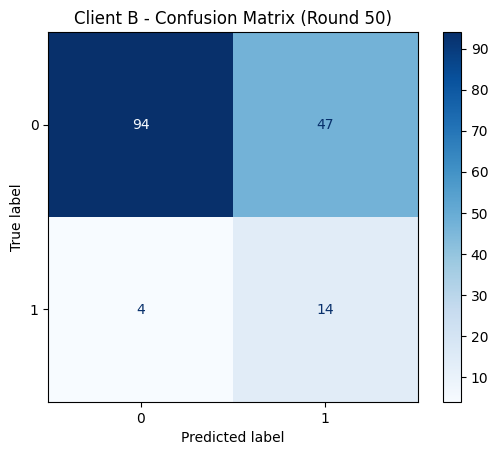


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9592    0.6667    0.7866       141
           1     0.2295    0.7778    0.3544        18

    accuracy                         0.6792       159
   macro avg     0.5943    0.7222    0.5705       159
weighted avg     0.8766    0.6792    0.7377       159



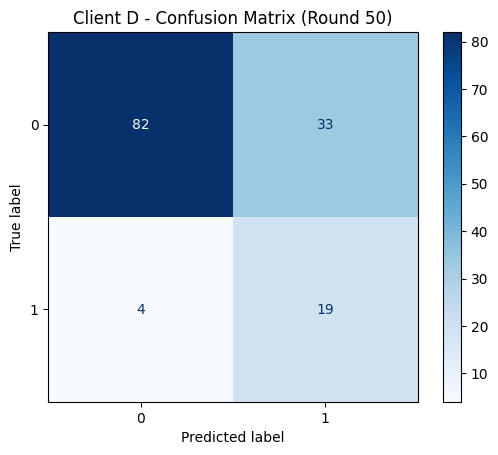


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9535    0.7130    0.8159       115
           1     0.3654    0.8261    0.5067        23

    accuracy                         0.7319       138
   macro avg     0.6594    0.7696    0.6613       138
weighted avg     0.8555    0.7319    0.7644       138



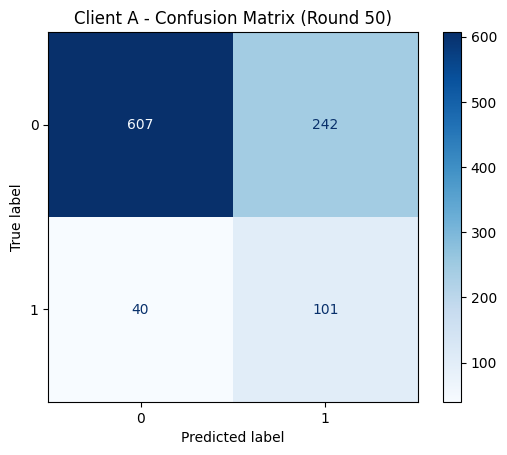


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9382    0.7150    0.8115       849
           1     0.2945    0.7163    0.4174       141

    accuracy                         0.7152       990
   macro avg     0.6163    0.7156    0.6144       990
weighted avg     0.8465    0.7152    0.7554       990



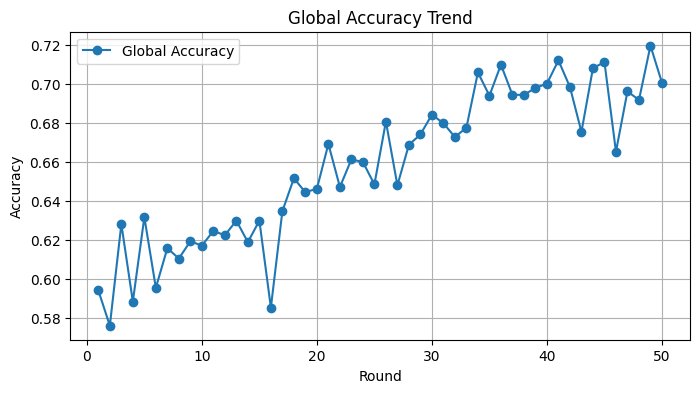

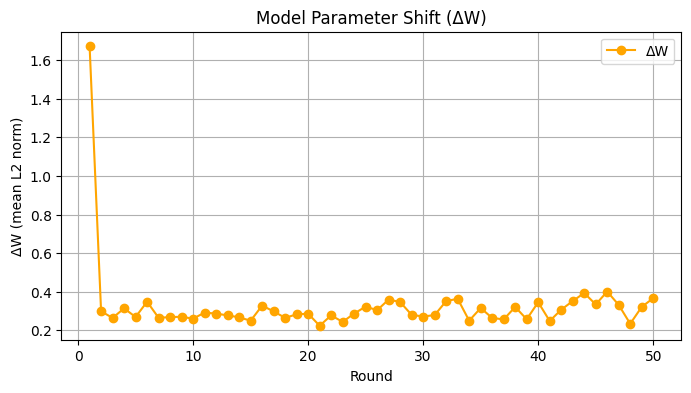


[최종 파라미터 통계 요약]
net.0.weight: mean=0.001688, std=0.158276
net.0.bias: mean=0.009316, std=0.145998
net.1.weight: mean=1.016923, std=0.078539
net.1.bias: mean=-0.203740, std=0.085375
net.1.running_mean: mean=0.008852, std=0.145859
net.1.running_var: mean=0.130970, std=0.070803
net.1.num_batches_tracked: dtype=torch.int64 (skip)
net.4.weight: mean=0.004966, std=0.084832
net.4.bias: mean=-0.002013, std=0.051745
net.5.weight: mean=1.024251, std=0.064076
net.5.bias: mean=-0.190981, std=0.071198
net.5.running_mean: mean=0.201890, std=0.754589
net.5.running_var: mean=0.861008, std=0.546388
net.5.num_batches_tracked: dtype=torch.int64 (skip)
net.8.weight: mean=0.009355, std=0.092860
net.8.bias: mean=0.009178, std=0.056623
net.9.weight: mean=1.057409, std=0.060974
net.9.bias: mean=-0.155783, std=0.046897
net.9.running_mean: mean=0.437149, std=1.171350
net.9.running_var: mean=2.072573, std=3.268144
net.9.num_batches_tracked: dtype=torch.int64 (skip)
net.12.weight: mean=0.010669, std=0.163929
net

In [ ]:
# -*- coding: utf-8 -*-
# 정확도 향상 및 안정성 개선 + 집계기 최적화 (2025.10 기준, train:test = 7:3)

import os, math, copy, random, argparse
import pandas as pd
import numpy as np
import torch
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset, random_split
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

DEFECT_LABELS = ['Short_Shot_1','Bubble_1','Exfoliation_1','Blow_Hole_1','Deformation_1']

def load_excel_binary(path: str):
    df = pd.read_excel(path).dropna(axis=1, how='all')
    for col in DEFECT_LABELS:
        if col not in df.columns:
            df[col] = 0
    y = df[DEFECT_LABELS].sum(axis=1).clip(upper=1).astype(int).values
    X = df.drop(columns=DEFECT_LABELS, errors='ignore')
    X = X.select_dtypes(include=[np.number]).replace([np.inf, -np.inf], np.nan).fillna(0.0)
    return X, y

def build_clients(path_map):
    raw, clients, metas = {}, {}, {}
    for cid, path in path_map.items():
        X, y = load_excel_binary(path)
        raw[cid] = {"X": X, "y": y}
    cols = set.intersection(*[set(v["X"].columns) for v in raw.values()])
    for cid, v in raw.items():
        feat = v["X"][list(cols)].copy()
        mu, sigma = feat.mean(), feat.std().replace(0, 1)
        feat = (feat - mu) / sigma
        X = torch.tensor(feat.values.astype(np.float32))
        y = torch.tensor(v["y"], dtype=torch.long)
        allset = TensorDataset(X, y)
        n = len(allset)
        n_train = int(0.7 * n)
        n_test = n - n_train
        tr, te = random_split(allset, [n_train, n_test], generator=torch.Generator().manual_seed(42))
        clients[cid] = {"train": tr, "test": te, "all": allset}
        metas[cid] = {"n_samples": len(y), "class_counts": pd.Series(v["y"]).value_counts().to_dict()}
    return clients, metas, list(cols)

class DeepMLP(nn.Module):
    def __init__(self, input_dim, num_classes=2):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 128), nn.BatchNorm1d(128), nn.ReLU(), nn.Dropout(0.2),
            nn.Linear(128, 128), nn.BatchNorm1d(128), nn.ReLU(), nn.Dropout(0.2),
            nn.Linear(128, 64), nn.BatchNorm1d(64), nn.ReLU(), nn.Dropout(0.2),
            nn.Linear(64, num_classes)
        )
    def forward(self, x):
        return self.net(x)

def compute_ti(round_now, last_round, T_window=20, theta_time=0.5):
    delta = T_window if last_round is None else min(max(0, round_now - last_round), T_window)
    return 1.0 + theta_time * (delta / max(1, T_window))

def compute_ci(class_counts, eps_frac=0.05, min_samples=1):
    K, total = len(class_counts), sum(class_counts.values())
    if K == 0 or total == 0:
        return 1e-8
    H = -sum((c / total) * math.log(c / total) for c in class_counts.values() if c > 0)
    logK = math.log(K + 1e-12)
    H_floor = eps_frac * logK
    H_tilde = max(H, H_floor)
    k_i = sum(1 for c in class_counts.values() if c >= min_samples)
    return max(1e-8, (k_i / K) * (H_tilde / logK))

def aggregate_with_softmax_weights(state_dicts, alpha_components, rho=1.0, beta=0.7, theta=0.5, temperature=2.0):
    if not state_dicts:
        return None
    logits = {}
    for cid, comp in alpha_components.items():
        log_weight = (
            math.log(comp["n_i"] ** rho + 1e-12)
            + math.log(comp["c_i"] ** beta + 1e-12)
            + math.log(comp["t_i"] ** theta + 1e-12)
        )
        logits[cid] = log_weight
    max_logit = max(logits.values())
    exp_logits = {cid: math.exp((logits[cid] - max_logit) / temperature) for cid in logits}
    total_exp = sum(exp_logits.values())
    alphas = {cid: exp_logits[cid] / total_exp for cid in logits}

    global_sd = None
    for cid, sd in state_dicts.items():
        w = alphas[cid]
        if global_sd is None:
            global_sd = {k: v.clone() * w for k, v in sd.items() if v.dtype in (torch.float32, torch.float64)}
        else:
            for k in global_sd:
                global_sd[k] += sd[k] * w
    return global_sd

def local_train(model, dataset, lr, epochs, device, class_counts):
    model = copy.deepcopy(model).to(device)
    model.train()
    total = sum(class_counts.values())
    w_0 = total / (2 * class_counts.get(0, 1))
    w_1 = total / (2 * class_counts.get(1, 1))
    crit = nn.CrossEntropyLoss(weight=torch.tensor([w_0, w_1], dtype=torch.float32).to(device))
    opt = optim.Adam(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.StepLR(opt, step_size=3, gamma=0.7)
    loader = DataLoader(dataset, batch_size=64, shuffle=True)
    for _ in range(epochs):
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            opt.zero_grad()
            loss = crit(model(x), y)
            loss.backward()
            opt.step()
        scheduler.step()
    return model.state_dict()

def evaluate(model, dataset, device, return_preds=False):
    model.eval()
    loader = DataLoader(dataset, batch_size=256)
    correct, total = 0, 0
    y_true, y_pred = [], []
    with torch.no_grad():
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            pred = model(x).argmax(1)
            correct += pred.eq(y).sum().item()
            total += len(y)
            if return_preds:
                y_true += y.cpu().tolist()
                y_pred += pred.cpu().tolist()
    acc = correct / total if total > 0 else 0.0
    return (acc, y_true, y_pred) if return_preds else acc

if __name__ == "__main__":
    parser = argparse.ArgumentParser()
    parser.add_argument("--rounds", type=int, default=50)
    args, _ = parser.parse_known_args()

    paths = {"A": "A.xlsx", "B": "B.xlsx", "C": "C.xlsx", "D": "D.xlsx"}
    clients, metas, cols = build_clients(paths)
    device = "cuda" if torch.cuda.is_available() else "cpu"
    input_dim = clients["A"]["all"].tensors[0].shape[1]
    global_model = DeepMLP(input_dim=input_dim).to(device)

    last_round = {cid: None for cid in clients}
    combined_test = torch.utils.data.ConcatDataset([v["test"] for v in clients.values()])
    prev_global = copy.deepcopy(global_model.state_dict())
    round_log = {"round": [], "acc": [], "dW": []}
    fixed_probs = {"A": 0.9, "B": 0.4, "C": 0.4, "D": 0.7}

    for rnd in range(1, args.rounds + 1):
        print(f"\n=== Round {rnd} ===")
        probs = fixed_probs.copy()
        total_p = sum(probs.values())
        probs = {k: v / total_p for k, v in probs.items()}
        sorted_probs = sorted(probs.items(), key=lambda x: x[1], reverse=True)
        top_k = [cid for cid, _ in sorted_probs[:2]]
        additional = random.sample(list(clients.keys()), k=min(2, len(clients)-len(top_k)))
        selected = list(set(top_k + additional))

        state_dicts, alpha_components = {}, {}
        before_acc = evaluate(global_model, combined_test, device)

        for cid in selected:
            ds = clients[cid]["train"]
            labels = [int(y) for _, y in ds]
            class_counts = pd.Series(labels).value_counts().to_dict()
            state_dict = local_train(global_model, ds, lr=0.001, epochs=10, device=device, class_counts=class_counts)
            state_dicts[cid] = state_dict
            n_i = max(1.0, math.sqrt(metas[cid]["n_samples"]))
            c_i = max(1e-3, compute_ci(class_counts))
            t_i = max(1e-3, fixed_probs[cid])
            alpha_components[cid] = {"n_i": n_i, "c_i": c_i, "t_i": t_i}
            last_round[cid] = rnd

        new_global = aggregate_with_softmax_weights(state_dicts, alpha_components)
        if new_global is None:
            continue
        global_model.load_state_dict(new_global)

        after_acc, y_true, y_pred = evaluate(global_model, combined_test, device, return_preds=True)
        dW = np.mean([
            torch.norm(global_model.state_dict()[k] - prev_global[k]).item()
            for k in global_model.state_dict()
            if global_model.state_dict()[k].dtype in (torch.float32, torch.float64)
        ])
        prev_global = copy.deepcopy(global_model.state_dict())

        print(f"[Round {rnd}] Global Accuracy: {before_acc:.4f} → {after_acc:.4f} | ΔW={dW:.4f}")
        round_log["round"].append(rnd)
        round_log["acc"].append(after_acc)
        round_log["dW"].append(dW)

        df = pd.DataFrame(alpha_components).T.round(4)
        print("\nαᵒ 구성요소 (log scale):")
        print(df)
        plt.figure(figsize=(6, 4))
        np.log10(df + 1e-8).plot(kind="bar")
        plt.title(f"αᵒ components (Round {rnd})")
        plt.tight_layout()
        plt.show()

        for cid in selected:
            _, yt, yp = evaluate(global_model, clients[cid]["test"], device, return_preds=True)
            cm = confusion_matrix(yt, yp)
            ConfusionMatrixDisplay(confusion_matrix=cm).plot(cmap="Blues")
            plt.title(f"Client {cid} - Confusion Matrix (Round {rnd})")
            plt.show()
            print(f"\n[Client {cid}] Classification Report:")
            print(classification_report(yt, yp, digits=4))

    plt.figure(figsize=(8, 4))
    plt.plot(round_log["round"], round_log["acc"], marker="o", label="Global Accuracy")
    plt.xlabel("Round")
    plt.ylabel("Accuracy")
    plt.title("Global Accuracy Trend")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 4))
    plt.plot(round_log["round"], round_log["dW"], marker="o", color="orange", label="ΔW")
    plt.xlabel("Round")
    plt.ylabel("ΔW (mean L2 norm)")
    plt.title("Model Parameter Shift (ΔW)")
    plt.legend()
    plt.grid(True)
    plt.show()

    print("\n[최종 파라미터 통계 요약]")
    for name, param in global_model.state_dict().items():
        if param.dtype in (torch.float32, torch.float64):
            print(f"{name}: mean={param.mean():.6f}, std={param.std():.6f}")
        else:
            print(f"{name}: dtype={param.dtype} (skip)")

#실험(3)
MLP모델 오버샘플링 사용


=== Round 1 ===
[Round 1] Global Accuracy: 0.8788 → 0.5113 | MLP Accuracy: 0.5113 | ∆W=1.7419

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

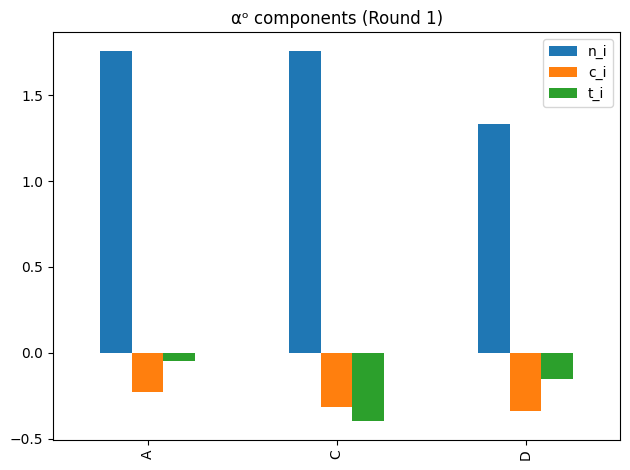

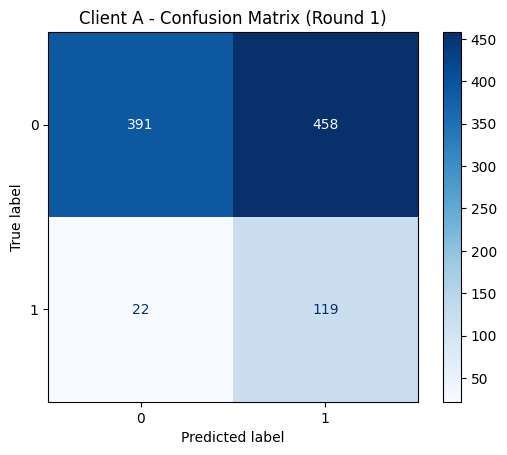


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9467    0.4605    0.6197       849
           1     0.2062    0.8440    0.3315       141

    accuracy                         0.5152       990
   macro avg     0.5765    0.6523    0.4756       990
weighted avg     0.8413    0.5152    0.5786       990



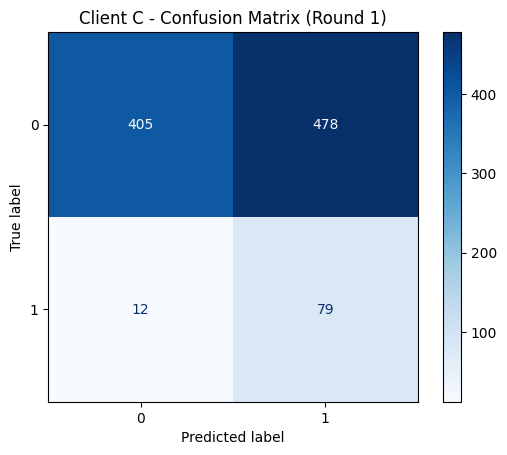


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9712    0.4587    0.6231       883
           1     0.1418    0.8681    0.2438        91

    accuracy                         0.4969       974
   macro avg     0.5565    0.6634    0.4335       974
weighted avg     0.8937    0.4969    0.5876       974



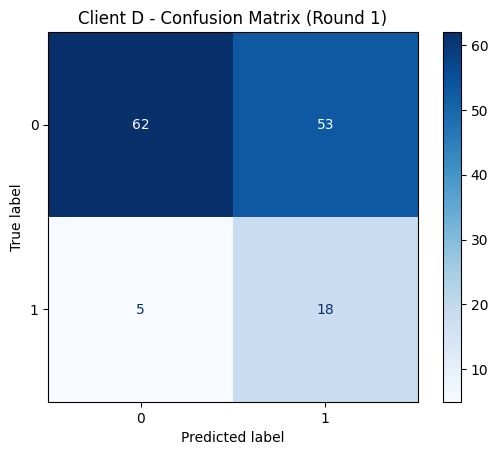


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9254    0.5391    0.6813       115
           1     0.2535    0.7826    0.3830        23

    accuracy                         0.5797       138
   macro avg     0.5894    0.6609    0.5321       138
weighted avg     0.8134    0.5797    0.6316       138


=== Round 2 ===
[Round 2] Global Accuracy: 0.5113 → 0.6081 | MLP Accuracy: 0.6081 | ∆W=0.3592

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

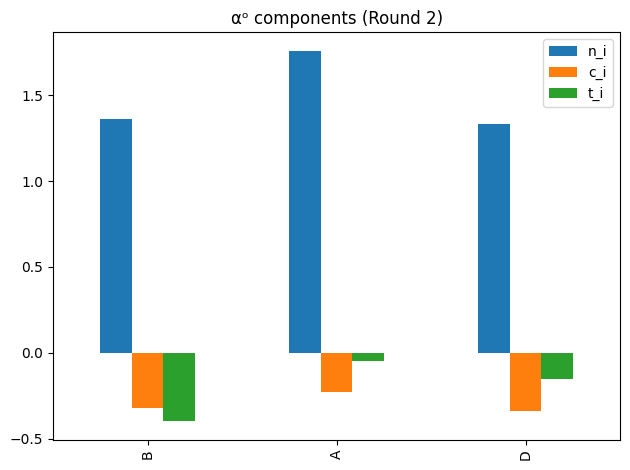

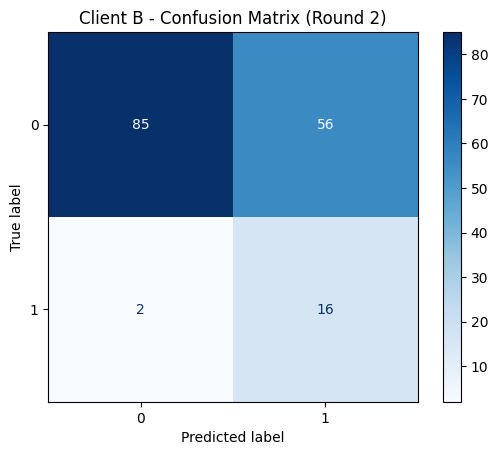


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9770    0.6028    0.7456       141
           1     0.2222    0.8889    0.3556        18

    accuracy                         0.6352       159
   macro avg     0.5996    0.7459    0.5506       159
weighted avg     0.8916    0.6352    0.7015       159



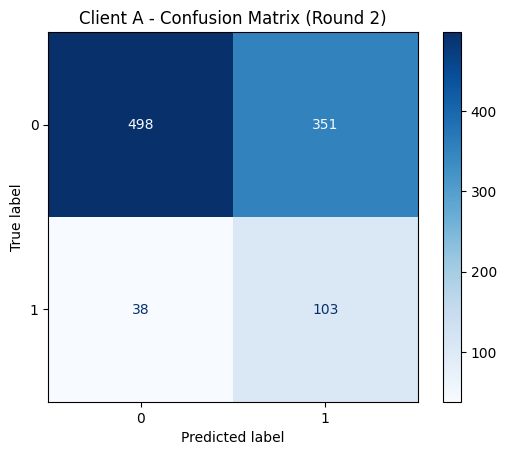


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9291    0.5866    0.7191       849
           1     0.2269    0.7305    0.3462       141

    accuracy                         0.6071       990
   macro avg     0.5780    0.6585    0.5327       990
weighted avg     0.8291    0.6071    0.6660       990



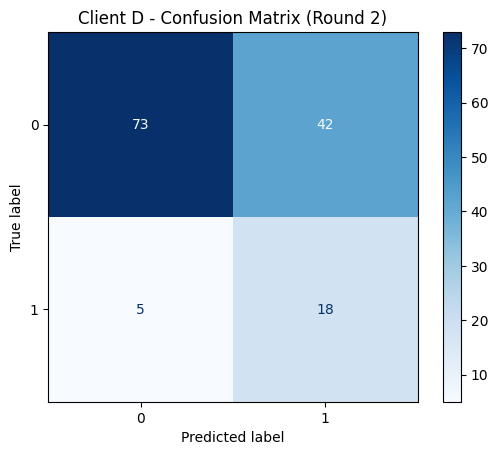


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9359    0.6348    0.7565       115
           1     0.3000    0.7826    0.4337        23

    accuracy                         0.6594       138
   macro avg     0.6179    0.7087    0.5951       138
weighted avg     0.8299    0.6594    0.7027       138


=== Round 3 ===
[Round 3] Global Accuracy: 0.6081 → 0.6581 | MLP Accuracy: 0.6581 | ∆W=0.2979

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

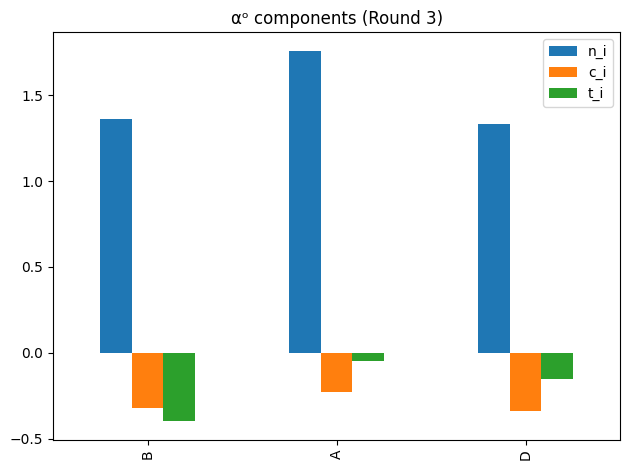

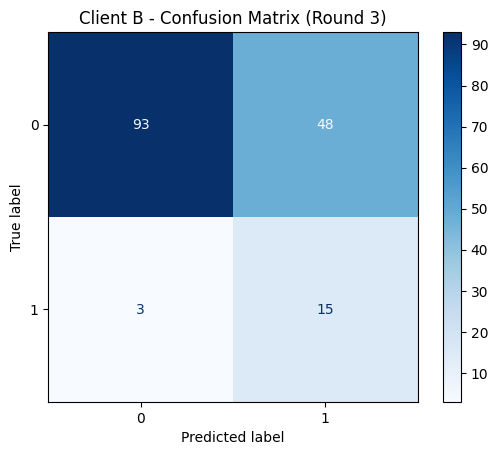


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9688    0.6596    0.7848       141
           1     0.2381    0.8333    0.3704        18

    accuracy                         0.6792       159
   macro avg     0.6034    0.7465    0.5776       159
weighted avg     0.8860    0.6792    0.7379       159



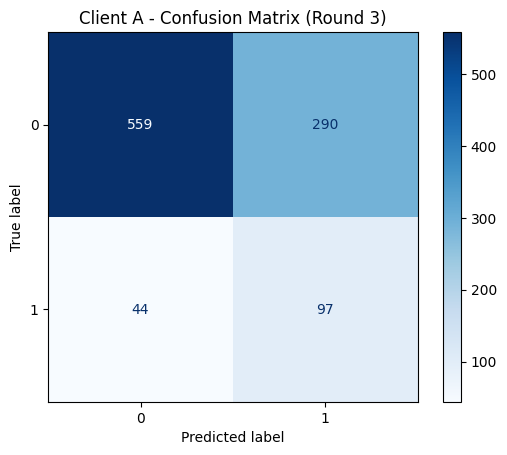


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9270    0.6584    0.7700       849
           1     0.2506    0.6879    0.3674       141

    accuracy                         0.6626       990
   macro avg     0.5888    0.6732    0.5687       990
weighted avg     0.8307    0.6626    0.7126       990



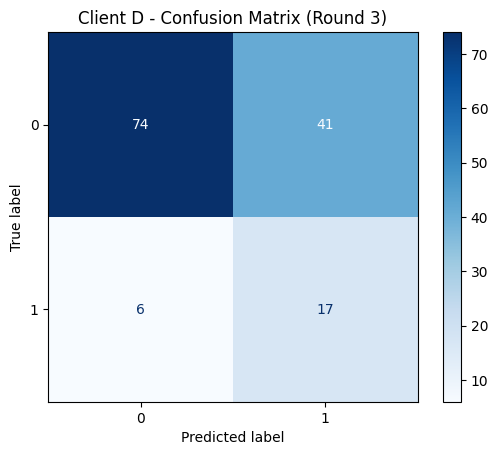


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9250    0.6435    0.7590       115
           1     0.2931    0.7391    0.4198        23

    accuracy                         0.6594       138
   macro avg     0.6091    0.6913    0.5894       138
weighted avg     0.8197    0.6594    0.7024       138


=== Round 4 ===
[Round 4] Global Accuracy: 0.6581 → 0.6440 | MLP Accuracy: 0.6440 | ∆W=0.3488

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

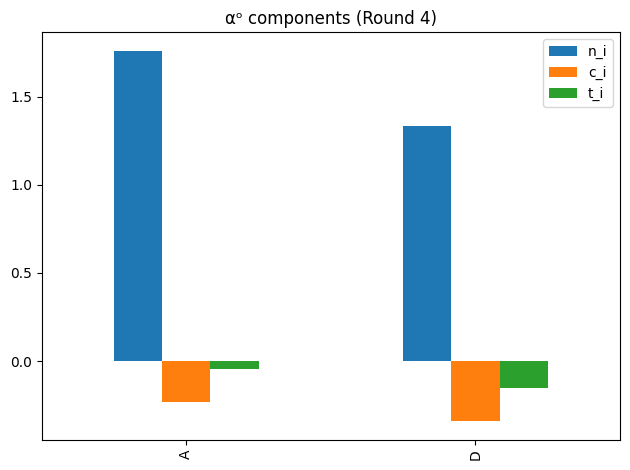

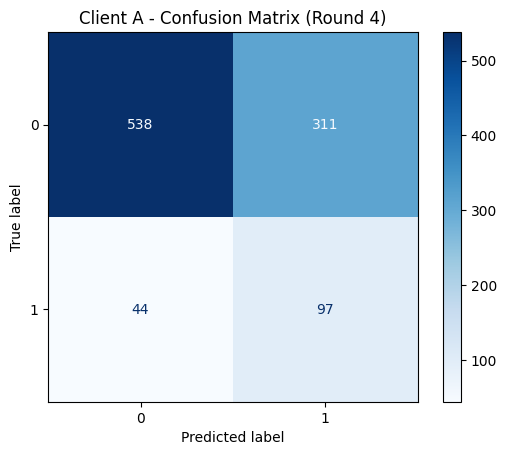


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9244    0.6337    0.7519       849
           1     0.2377    0.6879    0.3534       141

    accuracy                         0.6414       990
   macro avg     0.5811    0.6608    0.5526       990
weighted avg     0.8266    0.6414    0.6952       990



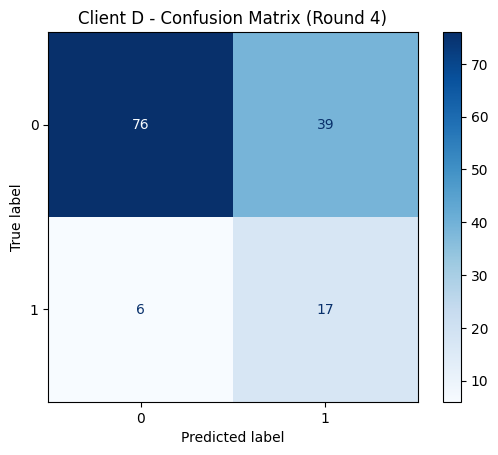


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9268    0.6609    0.7716       115
           1     0.3036    0.7391    0.4304        23

    accuracy                         0.6739       138
   macro avg     0.6152    0.7000    0.6010       138
weighted avg     0.8230    0.6739    0.7147       138


=== Round 5 ===
[Round 5] Global Accuracy: 0.6440 → 0.6692 | MLP Accuracy: 0.6692 | ∆W=0.3280

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

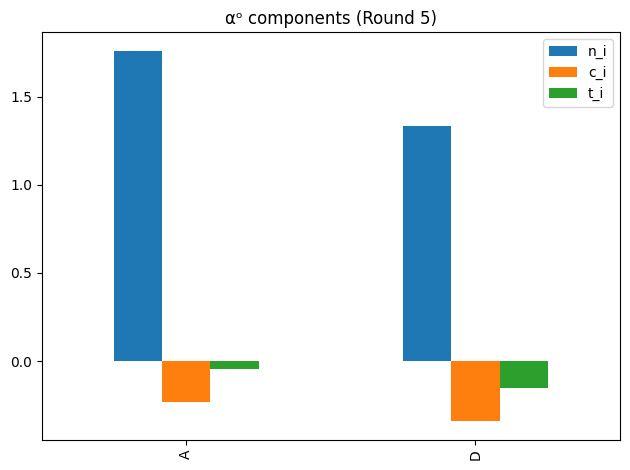

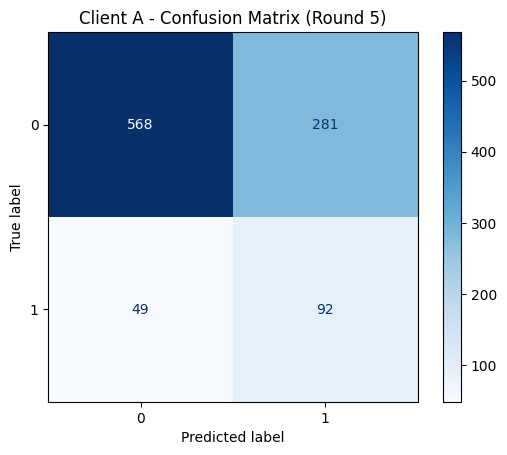


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9206    0.6690    0.7749       849
           1     0.2466    0.6525    0.3580       141

    accuracy                         0.6667       990
   macro avg     0.5836    0.6608    0.5664       990
weighted avg     0.8246    0.6667    0.7155       990



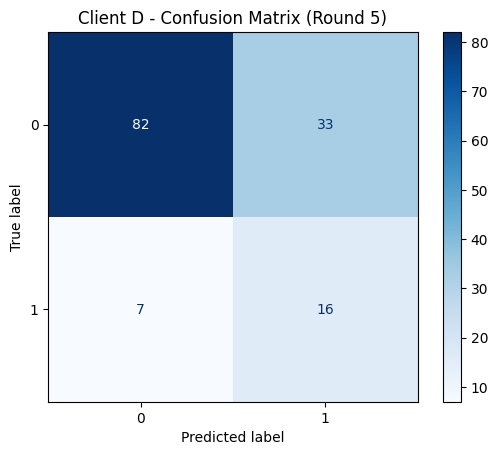


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9213    0.7130    0.8039       115
           1     0.3265    0.6957    0.4444        23

    accuracy                         0.7101       138
   macro avg     0.6239    0.7043    0.6242       138
weighted avg     0.8222    0.7101    0.7440       138


=== Round 6 ===
[Round 6] Global Accuracy: 0.6692 → 0.6838 | MLP Accuracy: 0.6838 | ∆W=0.3008

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

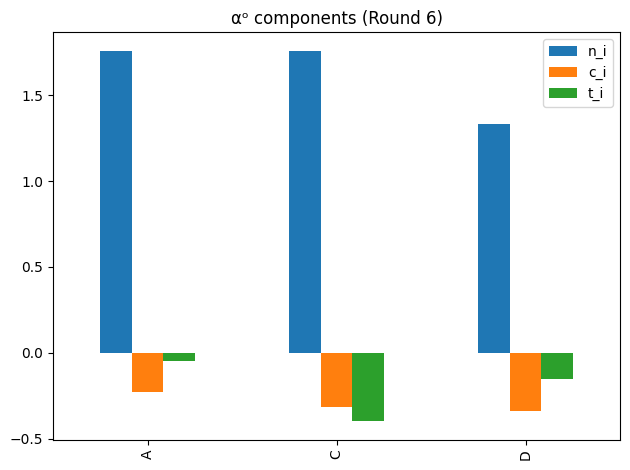

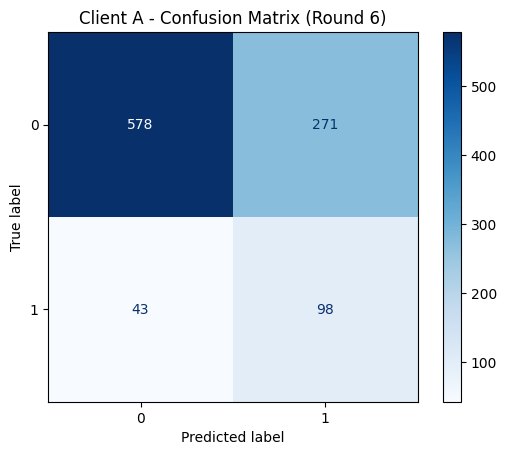


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9308    0.6808    0.7864       849
           1     0.2656    0.6950    0.3843       141

    accuracy                         0.6828       990
   macro avg     0.5982    0.6879    0.5854       990
weighted avg     0.8360    0.6828    0.7291       990



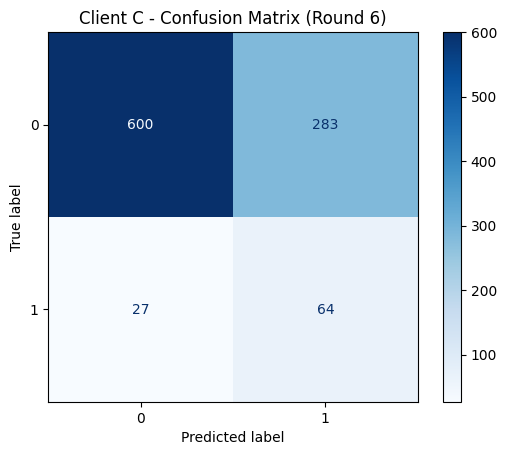


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9569    0.6795    0.7947       883
           1     0.1844    0.7033    0.2922        91

    accuracy                         0.6817       974
   macro avg     0.5707    0.6914    0.5435       974
weighted avg     0.8848    0.6817    0.7478       974



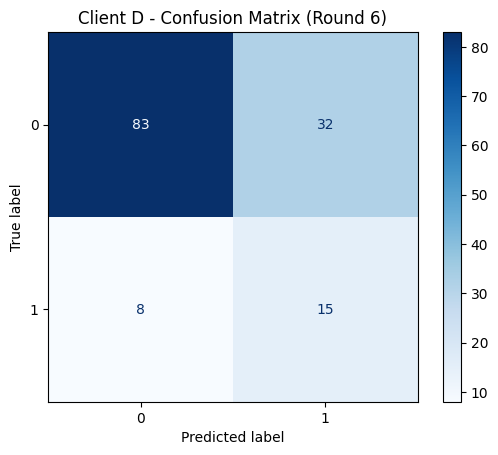


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9121    0.7217    0.8058       115
           1     0.3191    0.6522    0.4286        23

    accuracy                         0.7101       138
   macro avg     0.6156    0.6870    0.6172       138
weighted avg     0.8133    0.7101    0.7429       138


=== Round 7 ===
[Round 7] Global Accuracy: 0.6838 → 0.7165 | MLP Accuracy: 0.7165 | ∆W=0.2501

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

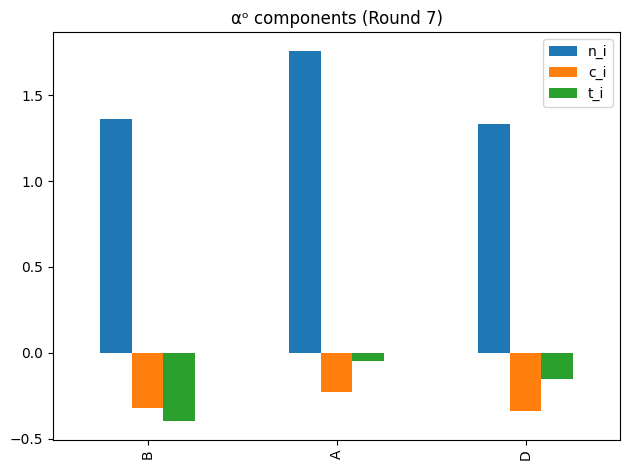

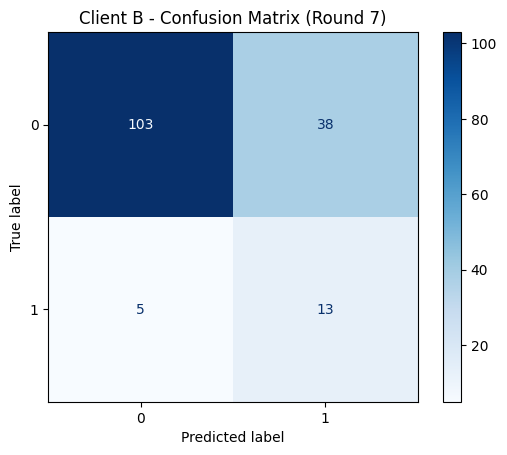


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9537    0.7305    0.8273       141
           1     0.2549    0.7222    0.3768        18

    accuracy                         0.7296       159
   macro avg     0.6043    0.7264    0.6021       159
weighted avg     0.8746    0.7296    0.7763       159



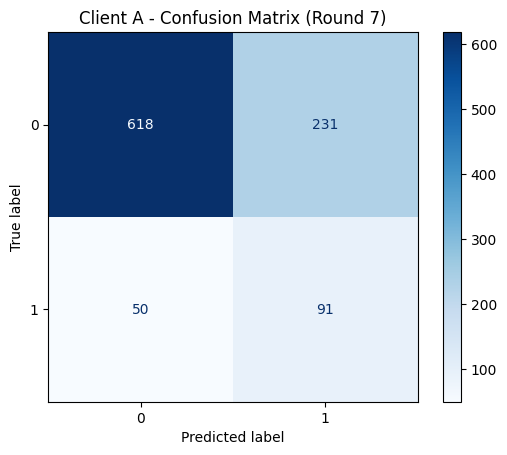


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9251    0.7279    0.8148       849
           1     0.2826    0.6454    0.3931       141

    accuracy                         0.7162       990
   macro avg     0.6039    0.6867    0.6039       990
weighted avg     0.8336    0.7162    0.7547       990



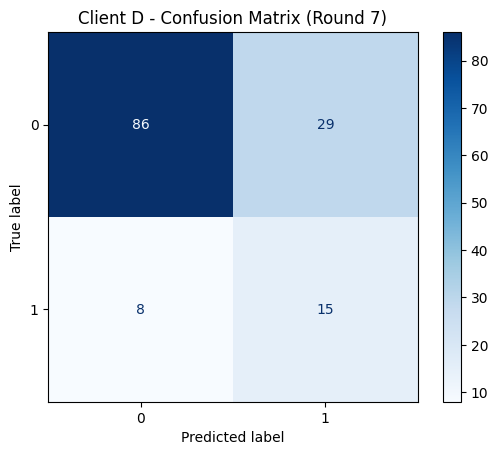


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9149    0.7478    0.8230       115
           1     0.3409    0.6522    0.4478        23

    accuracy                         0.7319       138
   macro avg     0.6279    0.7000    0.6354       138
weighted avg     0.8192    0.7319    0.7604       138


=== Round 8 ===
[Round 8] Global Accuracy: 0.7165 → 0.7421 | MLP Accuracy: 0.7421 | ∆W=0.2688

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

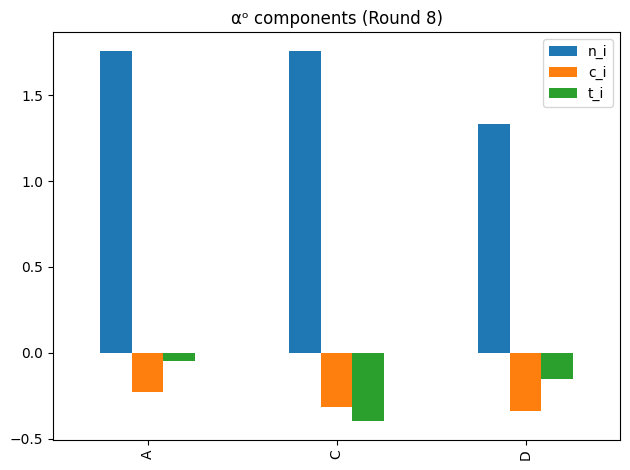

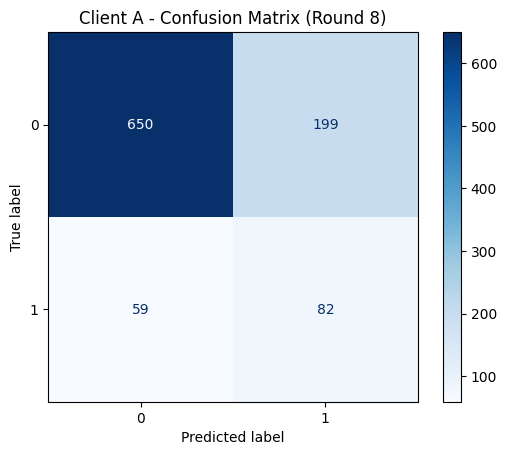


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9168    0.7656    0.8344       849
           1     0.2918    0.5816    0.3886       141

    accuracy                         0.7394       990
   macro avg     0.6043    0.6736    0.6115       990
weighted avg     0.8278    0.7394    0.7709       990



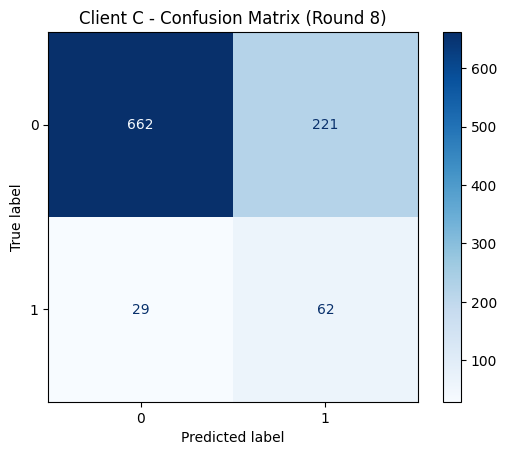


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9580    0.7497    0.8412       883
           1     0.2191    0.6813    0.3316        91

    accuracy                         0.7433       974
   macro avg     0.5886    0.7155    0.5864       974
weighted avg     0.8890    0.7433    0.7936       974



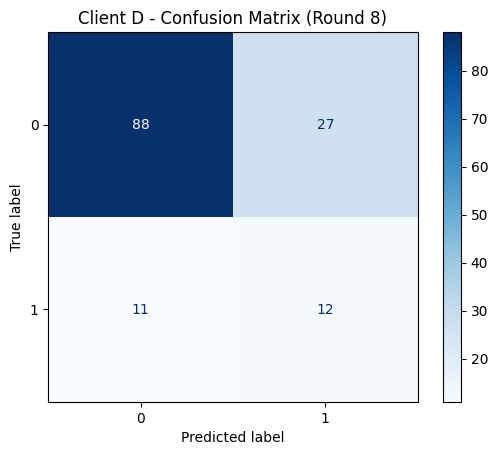


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.8889    0.7652    0.8224       115
           1     0.3077    0.5217    0.3871        23

    accuracy                         0.7246       138
   macro avg     0.5983    0.6435    0.6048       138
weighted avg     0.7920    0.7246    0.7499       138


=== Round 9 ===
[Round 9] Global Accuracy: 0.7421 → 0.7152 | MLP Accuracy: 0.7152 | ∆W=0.2582

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

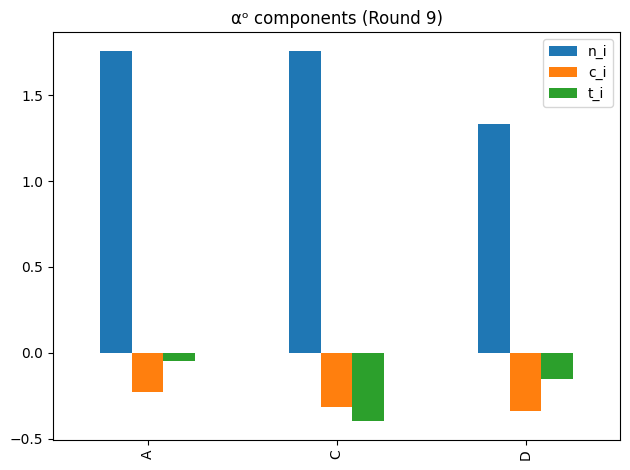

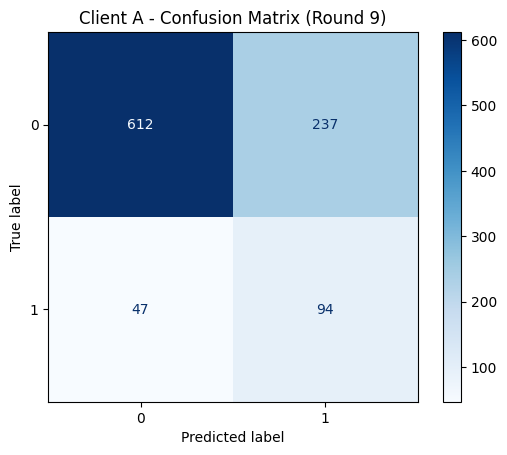


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9287    0.7208    0.8117       849
           1     0.2840    0.6667    0.3983       141

    accuracy                         0.7131       990
   macro avg     0.6063    0.6938    0.6050       990
weighted avg     0.8369    0.7131    0.7528       990



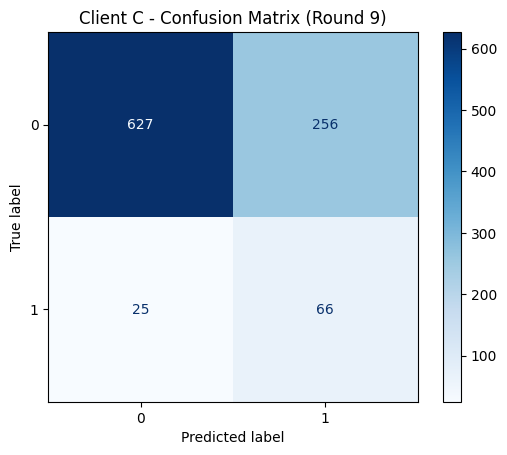


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9617    0.7101    0.8169       883
           1     0.2050    0.7253    0.3196        91

    accuracy                         0.7115       974
   macro avg     0.5833    0.7177    0.5683       974
weighted avg     0.8910    0.7115    0.7705       974



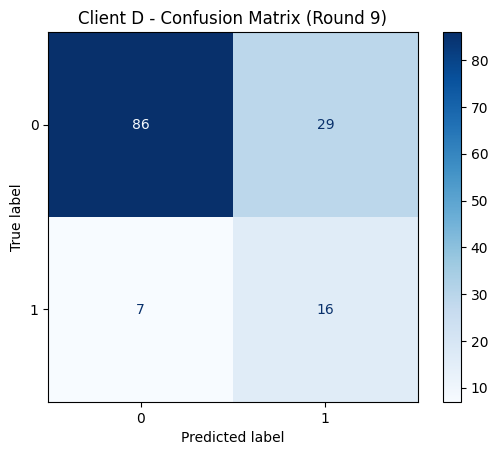


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9247    0.7478    0.8269       115
           1     0.3556    0.6957    0.4706        23

    accuracy                         0.7391       138
   macro avg     0.6401    0.7217    0.6488       138
weighted avg     0.8299    0.7391    0.7675       138


=== Round 10 ===
[Round 10] Global Accuracy: 0.7152 → 0.7355 | MLP Accuracy: 0.7355 | ∆W=0.2103

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

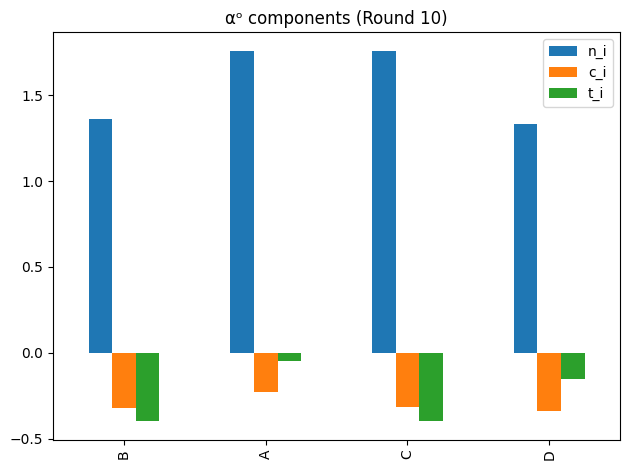

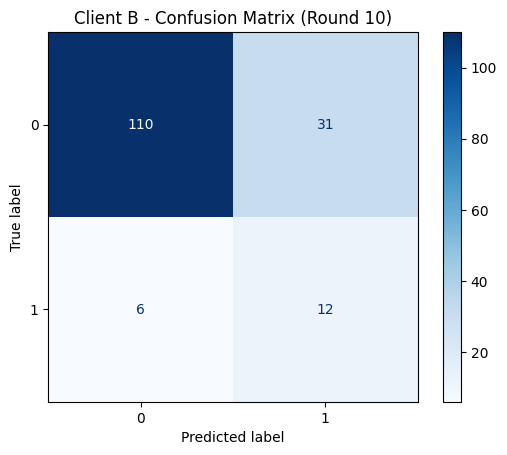


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9483    0.7801    0.8560       141
           1     0.2791    0.6667    0.3934        18

    accuracy                         0.7673       159
   macro avg     0.6137    0.7234    0.6247       159
weighted avg     0.8725    0.7673    0.8037       159



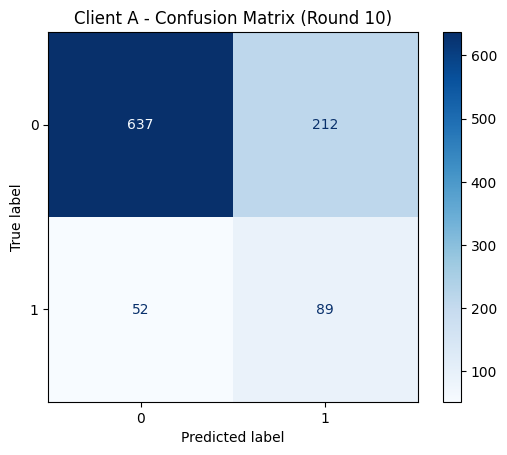


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9245    0.7503    0.8283       849
           1     0.2957    0.6312    0.4027       141

    accuracy                         0.7333       990
   macro avg     0.6101    0.6908    0.6155       990
weighted avg     0.8350    0.7333    0.7677       990



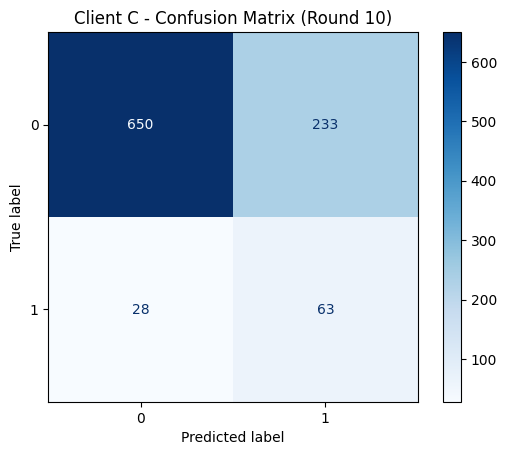


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9587    0.7361    0.8328       883
           1     0.2128    0.6923    0.3256        91

    accuracy                         0.7320       974
   macro avg     0.5858    0.7142    0.5792       974
weighted avg     0.8890    0.7320    0.7854       974



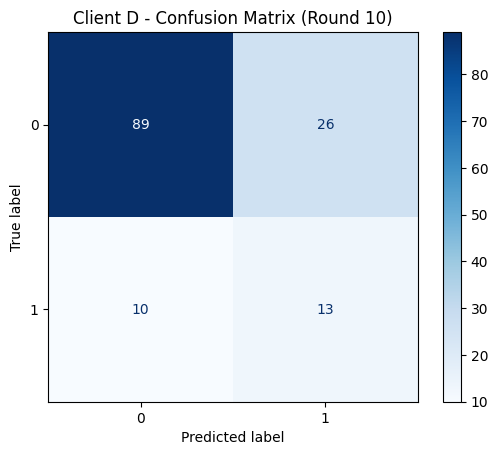


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.8990    0.7739    0.8318       115
           1     0.3333    0.5652    0.4194        23

    accuracy                         0.7391       138
   macro avg     0.6162    0.6696    0.6256       138
weighted avg     0.8047    0.7391    0.7630       138


=== Round 11 ===
[Round 11] Global Accuracy: 0.7355 → 0.7435 | MLP Accuracy: 0.7435 | ∆W=0.2315

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

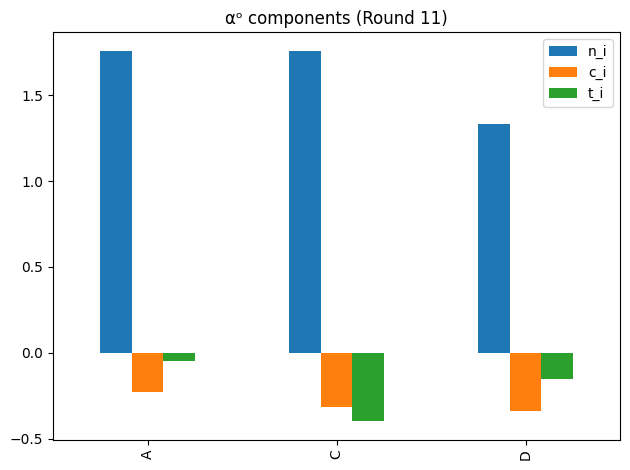

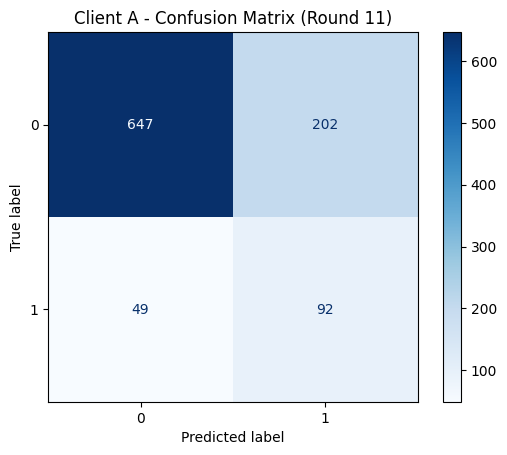


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9296    0.7621    0.8375       849
           1     0.3129    0.6525    0.4230       141

    accuracy                         0.7465       990
   macro avg     0.6213    0.7073    0.6303       990
weighted avg     0.8418    0.7465    0.7785       990



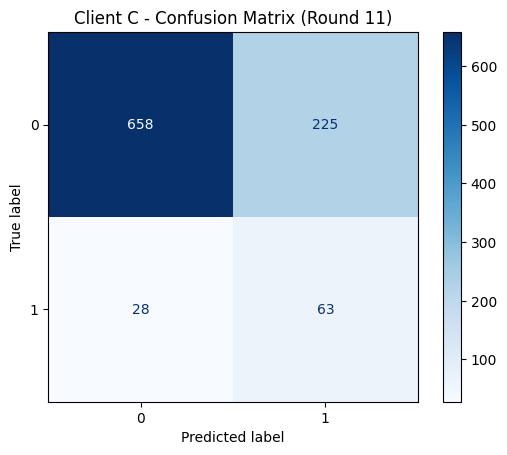


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9592    0.7452    0.8388       883
           1     0.2188    0.6923    0.3325        91

    accuracy                         0.7402       974
   macro avg     0.5890    0.7187    0.5856       974
weighted avg     0.8900    0.7402    0.7914       974



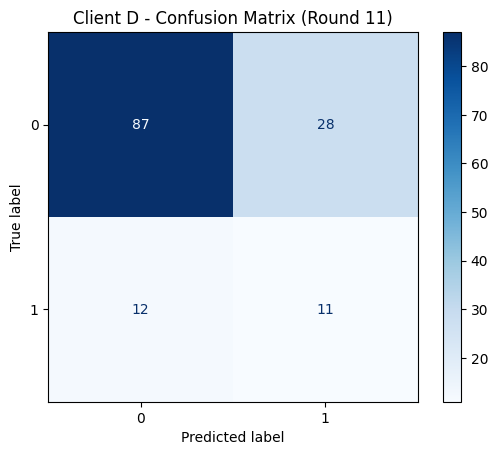


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.8788    0.7565    0.8131       115
           1     0.2821    0.4783    0.3548        23

    accuracy                         0.7101       138
   macro avg     0.5804    0.6174    0.5840       138
weighted avg     0.7793    0.7101    0.7367       138


=== Round 12 ===
[Round 12] Global Accuracy: 0.7435 → 0.7483 | MLP Accuracy: 0.7483 | ∆W=0.2227

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

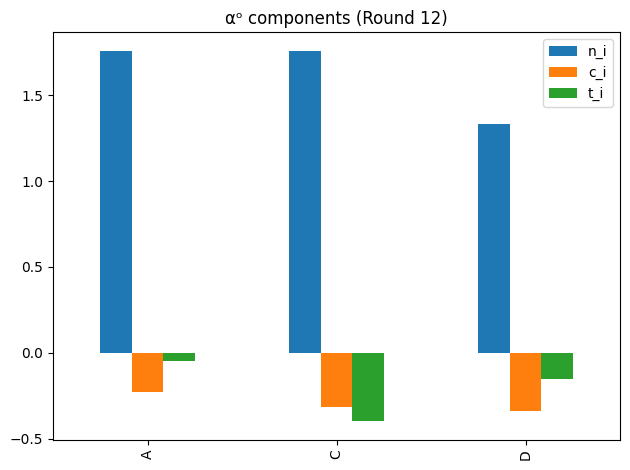

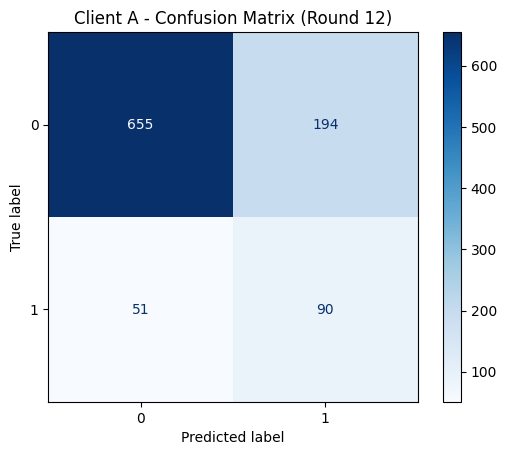


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9278    0.7715    0.8424       849
           1     0.3169    0.6383    0.4235       141

    accuracy                         0.7525       990
   macro avg     0.6223    0.7049    0.6330       990
weighted avg     0.8408    0.7525    0.7828       990



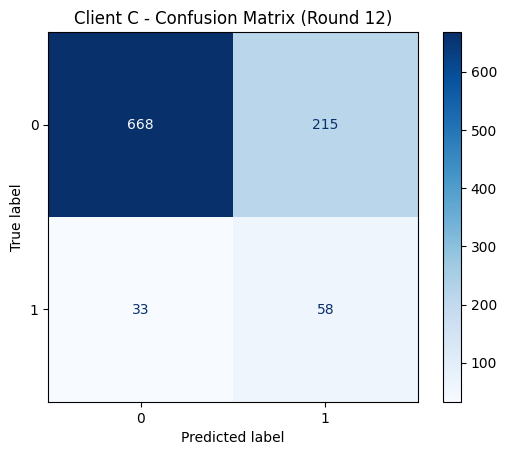


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9529    0.7565    0.8434       883
           1     0.2125    0.6374    0.3187        91

    accuracy                         0.7454       974
   macro avg     0.5827    0.6969    0.5811       974
weighted avg     0.8837    0.7454    0.7944       974



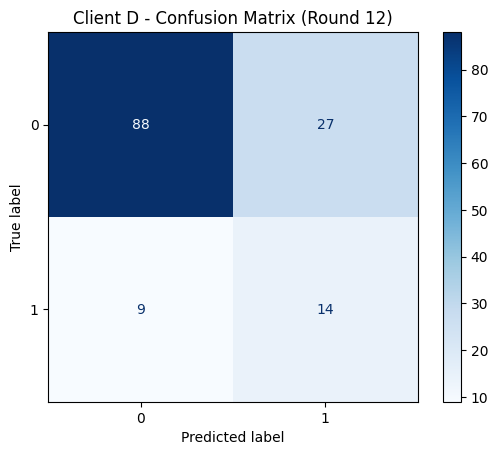


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9072    0.7652    0.8302       115
           1     0.3415    0.6087    0.4375        23

    accuracy                         0.7391       138
   macro avg     0.6243    0.6870    0.6338       138
weighted avg     0.8129    0.7391    0.7647       138


=== Round 13 ===
[Round 13] Global Accuracy: 0.7483 → 0.7501 | MLP Accuracy: 0.7501 | ∆W=0.2798

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

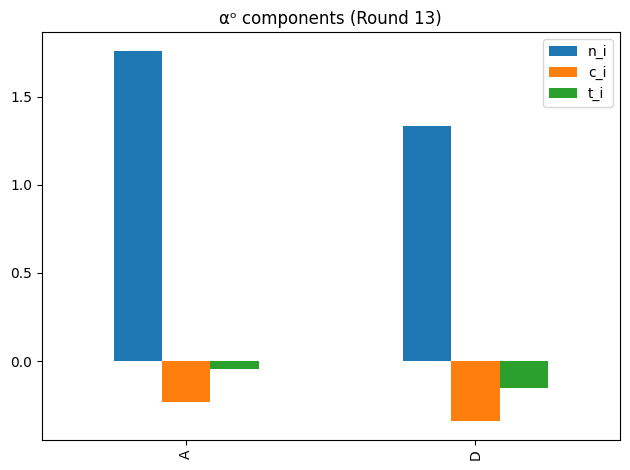

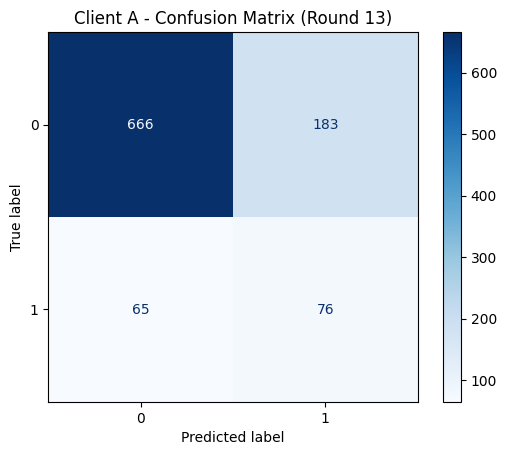


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9111    0.7845    0.8430       849
           1     0.2934    0.5390    0.3800       141

    accuracy                         0.7495       990
   macro avg     0.6023    0.6617    0.6115       990
weighted avg     0.8231    0.7495    0.7771       990



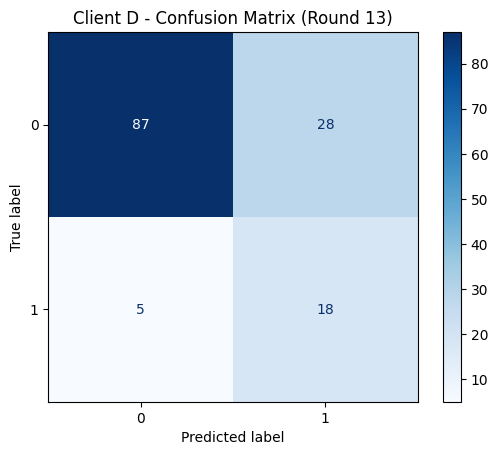


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9457    0.7565    0.8406       115
           1     0.3913    0.7826    0.5217        23

    accuracy                         0.7609       138
   macro avg     0.6685    0.7696    0.6812       138
weighted avg     0.8533    0.7609    0.7874       138


=== Round 14 ===
[Round 14] Global Accuracy: 0.7501 → 0.7563 | MLP Accuracy: 0.7563 | ∆W=0.2165

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

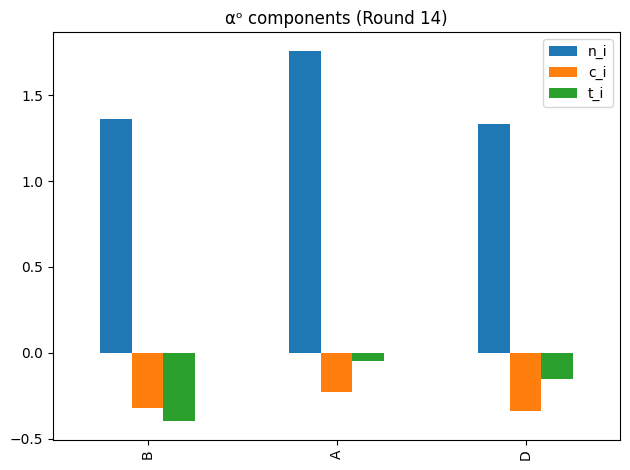

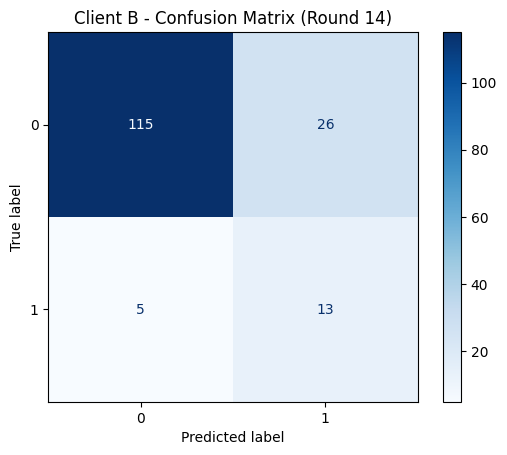


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9583    0.8156    0.8812       141
           1     0.3333    0.7222    0.4561        18

    accuracy                         0.8050       159
   macro avg     0.6458    0.7689    0.6687       159
weighted avg     0.8876    0.8050    0.8331       159



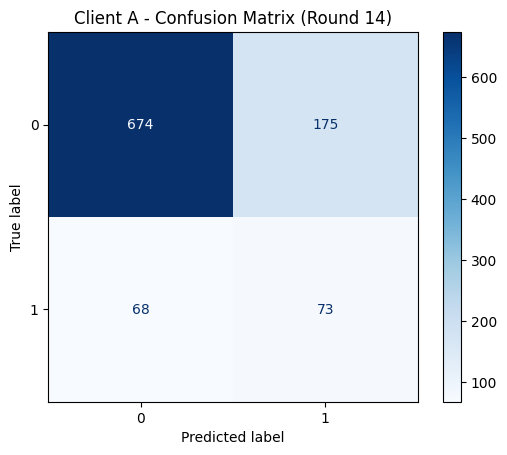


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9084    0.7939    0.8473       849
           1     0.2944    0.5177    0.3753       141

    accuracy                         0.7545       990
   macro avg     0.6014    0.6558    0.6113       990
weighted avg     0.8209    0.7545    0.7800       990



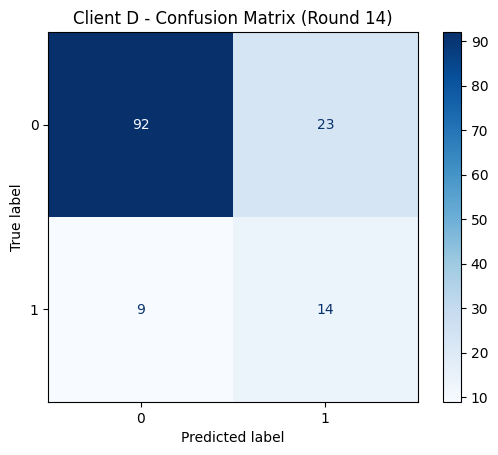


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9109    0.8000    0.8519       115
           1     0.3784    0.6087    0.4667        23

    accuracy                         0.7681       138
   macro avg     0.6446    0.7043    0.6593       138
weighted avg     0.8221    0.7681    0.7877       138


=== Round 15 ===
[Round 15] Global Accuracy: 0.7563 → 0.7430 | MLP Accuracy: 0.7430 | ∆W=0.2546

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

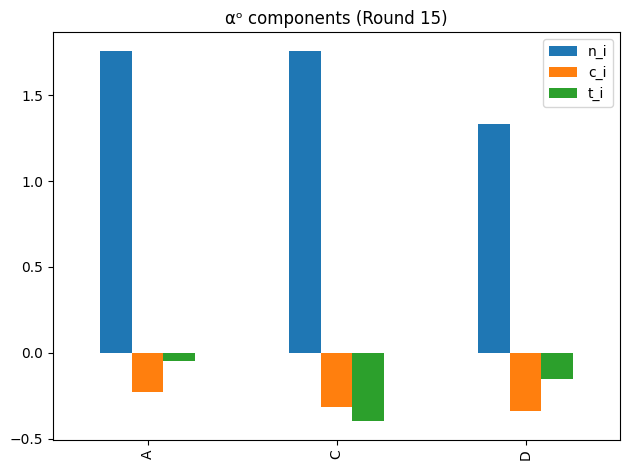

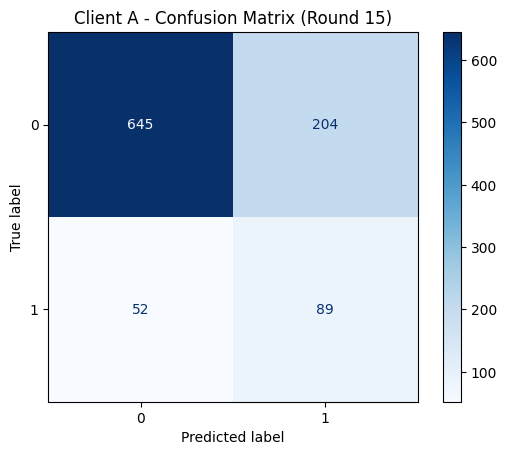


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9254    0.7597    0.8344       849
           1     0.3038    0.6312    0.4101       141

    accuracy                         0.7414       990
   macro avg     0.6146    0.6955    0.6223       990
weighted avg     0.8369    0.7414    0.7740       990



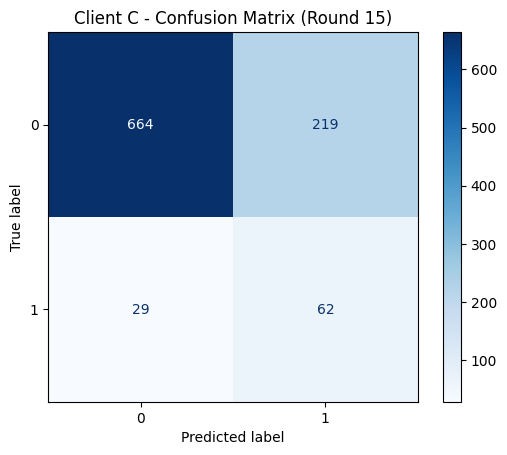


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9582    0.7520    0.8426       883
           1     0.2206    0.6813    0.3333        91

    accuracy                         0.7454       974
   macro avg     0.5894    0.7167    0.5880       974
weighted avg     0.8892    0.7454    0.7951       974



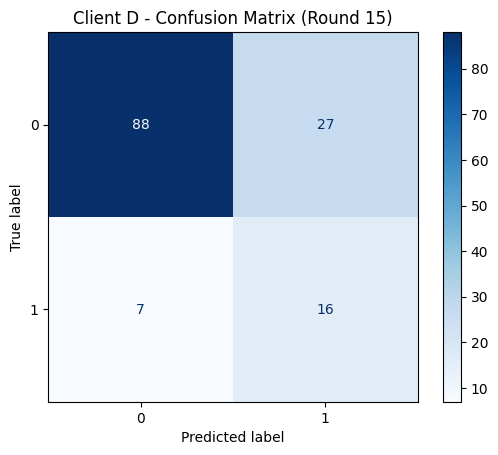


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9263    0.7652    0.8381       115
           1     0.3721    0.6957    0.4848        23

    accuracy                         0.7536       138
   macro avg     0.6492    0.7304    0.6615       138
weighted avg     0.8339    0.7536    0.7792       138


=== Round 16 ===
[Round 16] Global Accuracy: 0.7430 → 0.7567 | MLP Accuracy: 0.7567 | ∆W=0.2644

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

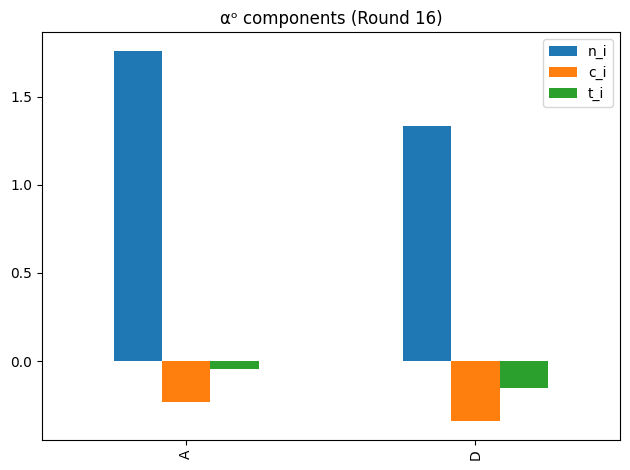

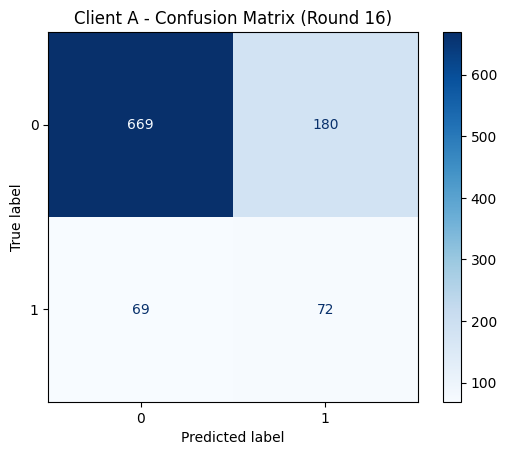


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9065    0.7880    0.8431       849
           1     0.2857    0.5106    0.3664       141

    accuracy                         0.7485       990
   macro avg     0.5961    0.6493    0.6048       990
weighted avg     0.8181    0.7485    0.7752       990



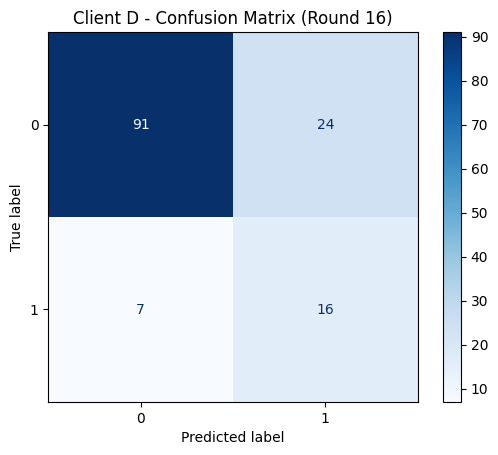


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9286    0.7913    0.8545       115
           1     0.4000    0.6957    0.5079        23

    accuracy                         0.7754       138
   macro avg     0.6643    0.7435    0.6812       138
weighted avg     0.8405    0.7754    0.7967       138


=== Round 17 ===
[Round 17] Global Accuracy: 0.7567 → 0.7329 | MLP Accuracy: 0.7329 | ∆W=0.2403

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

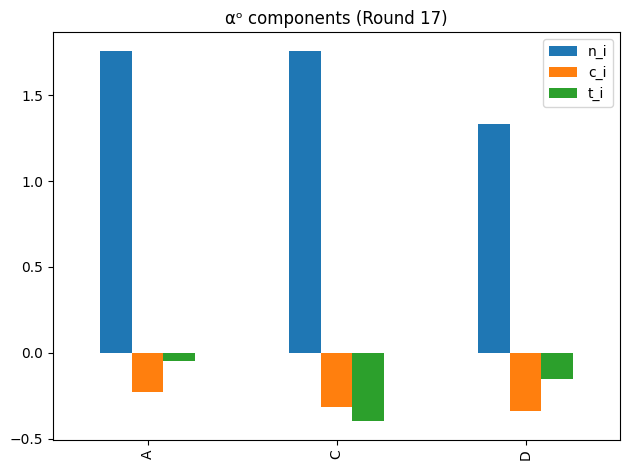

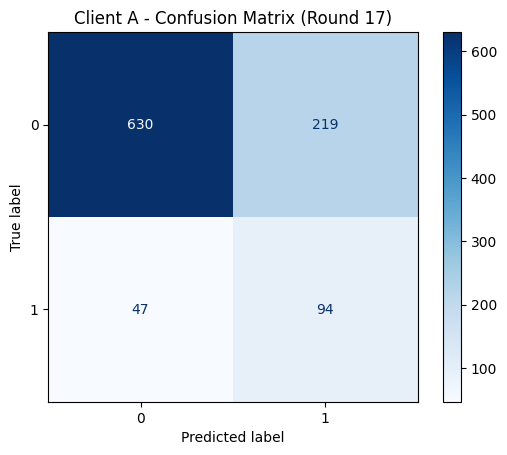


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9306    0.7420    0.8257       849
           1     0.3003    0.6667    0.4141       141

    accuracy                         0.7313       990
   macro avg     0.6154    0.7044    0.6199       990
weighted avg     0.8408    0.7313    0.7671       990



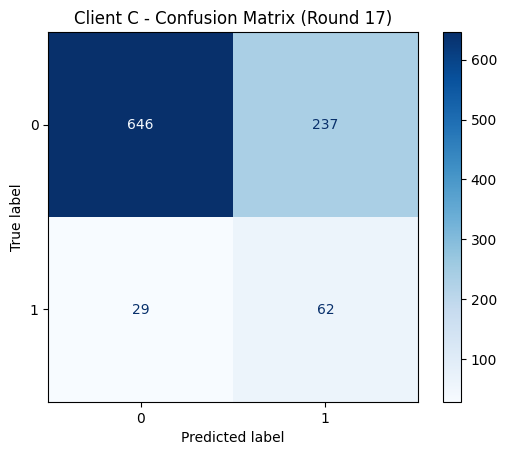


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9570    0.7316    0.8293       883
           1     0.2074    0.6813    0.3179        91

    accuracy                         0.7269       974
   macro avg     0.5822    0.7065    0.5736       974
weighted avg     0.8870    0.7269    0.7815       974



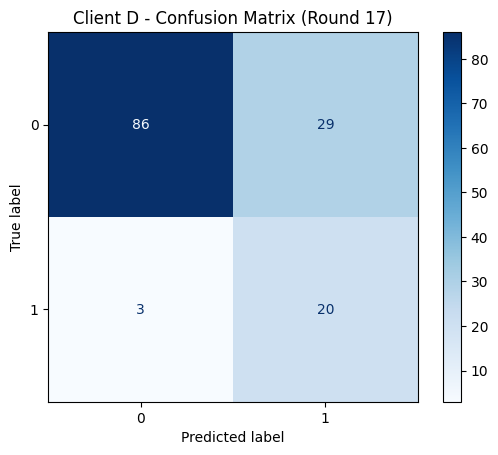


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9663    0.7478    0.8431       115
           1     0.4082    0.8696    0.5556        23

    accuracy                         0.7681       138
   macro avg     0.6872    0.8087    0.6993       138
weighted avg     0.8733    0.7681    0.7952       138


=== Round 18 ===
[Round 18] Global Accuracy: 0.7329 → 0.7638 | MLP Accuracy: 0.7638 | ∆W=0.2148

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

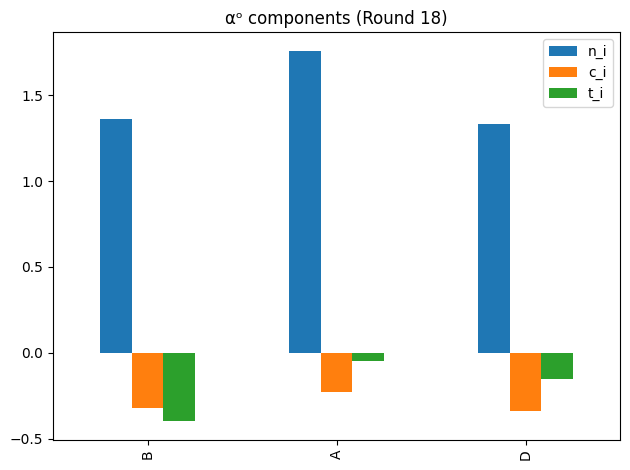

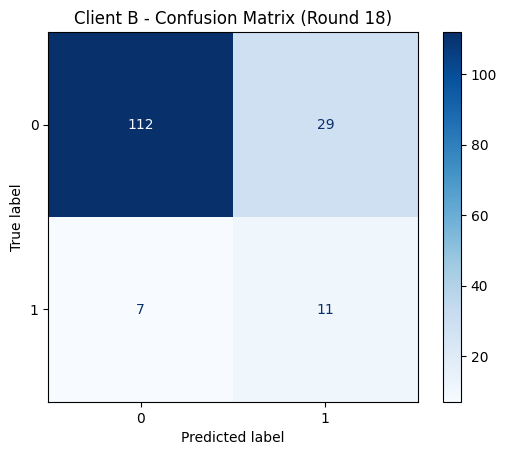


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9412    0.7943    0.8615       141
           1     0.2750    0.6111    0.3793        18

    accuracy                         0.7736       159
   macro avg     0.6081    0.7027    0.6204       159
weighted avg     0.8658    0.7736    0.8069       159



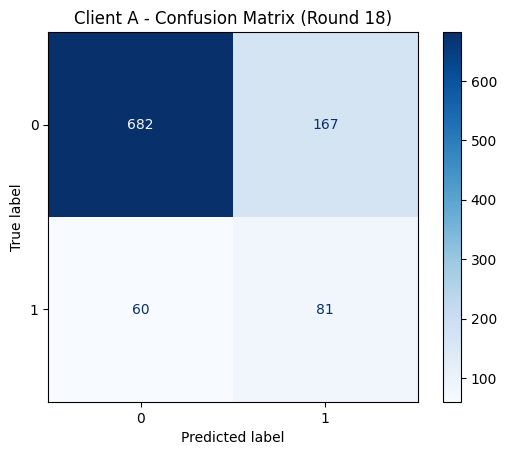


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9191    0.8033    0.8573       849
           1     0.3266    0.5745    0.4165       141

    accuracy                         0.7707       990
   macro avg     0.6229    0.6889    0.6369       990
weighted avg     0.8347    0.7707    0.7945       990



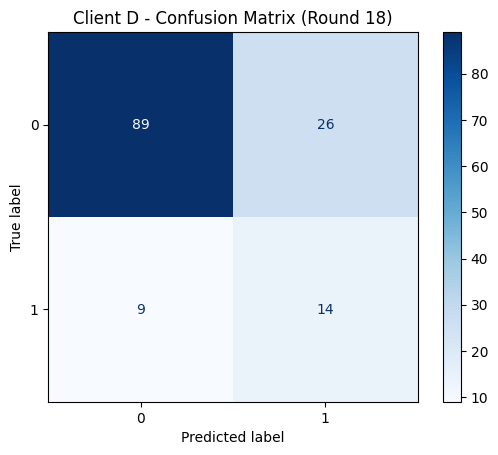


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9082    0.7739    0.8357       115
           1     0.3500    0.6087    0.4444        23

    accuracy                         0.7464       138
   macro avg     0.6291    0.6913    0.6401       138
weighted avg     0.8151    0.7464    0.7705       138


=== Round 19 ===
[Round 19] Global Accuracy: 0.7638 → 0.7528 | MLP Accuracy: 0.7528 | ∆W=0.2316

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

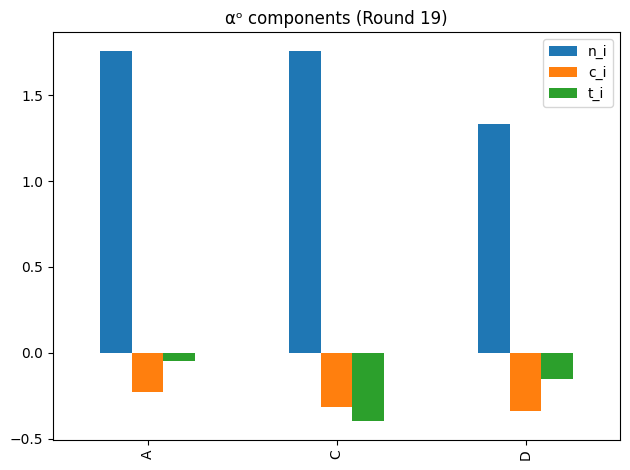

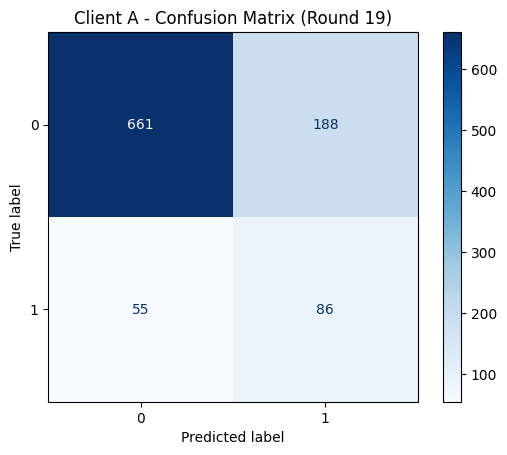


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9232    0.7786    0.8447       849
           1     0.3139    0.6099    0.4145       141

    accuracy                         0.7545       990
   macro avg     0.6185    0.6942    0.6296       990
weighted avg     0.8364    0.7545    0.7834       990



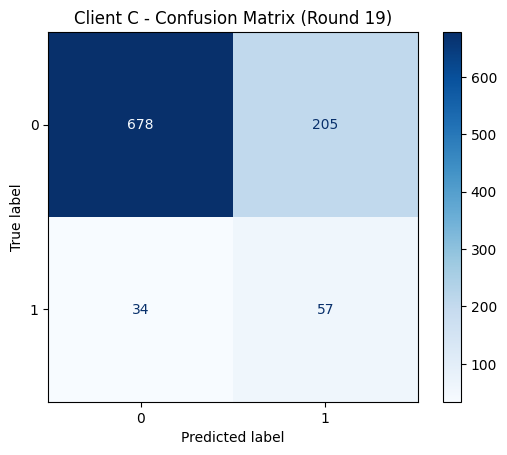


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9522    0.7678    0.8502       883
           1     0.2176    0.6264    0.3229        91

    accuracy                         0.7546       974
   macro avg     0.5849    0.6971    0.5866       974
weighted avg     0.8836    0.7546    0.8009       974



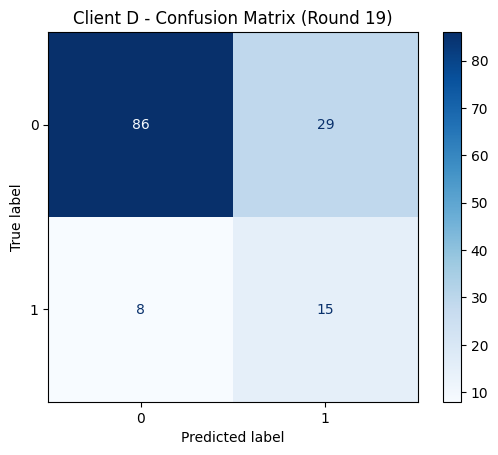


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9149    0.7478    0.8230       115
           1     0.3409    0.6522    0.4478        23

    accuracy                         0.7319       138
   macro avg     0.6279    0.7000    0.6354       138
weighted avg     0.8192    0.7319    0.7604       138


=== Round 20 ===
[Round 20] Global Accuracy: 0.7528 → 0.7514 | MLP Accuracy: 0.7514 | ∆W=0.2144

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

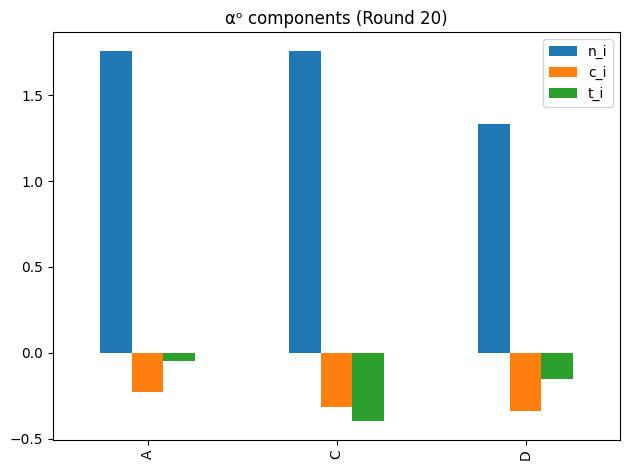

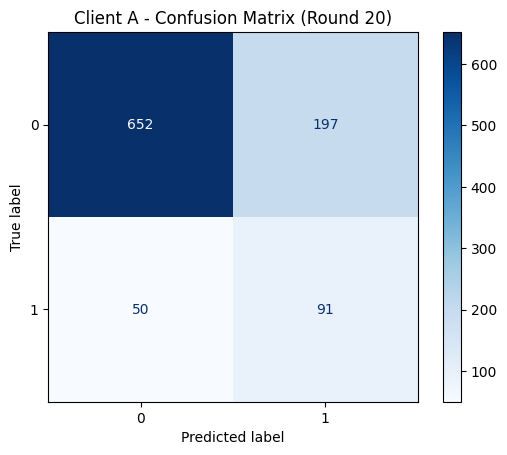


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9288    0.7680    0.8407       849
           1     0.3160    0.6454    0.4242       141

    accuracy                         0.7505       990
   macro avg     0.6224    0.7067    0.6325       990
weighted avg     0.8415    0.7505    0.7814       990



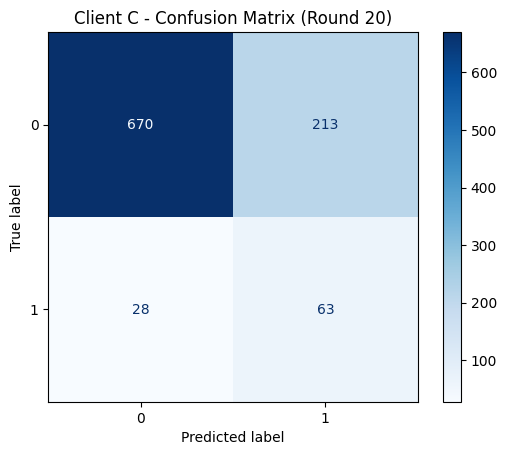


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9599    0.7588    0.8476       883
           1     0.2283    0.6923    0.3433        91

    accuracy                         0.7526       974
   macro avg     0.5941    0.7255    0.5954       974
weighted avg     0.8915    0.7526    0.8005       974



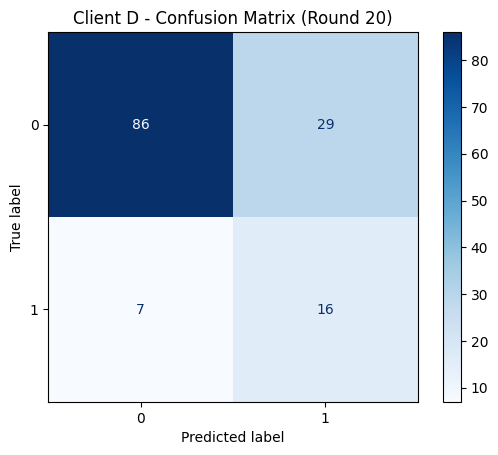


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9247    0.7478    0.8269       115
           1     0.3556    0.6957    0.4706        23

    accuracy                         0.7391       138
   macro avg     0.6401    0.7217    0.6488       138
weighted avg     0.8299    0.7391    0.7675       138


=== Round 21 ===
[Round 21] Global Accuracy: 0.7514 → 0.7585 | MLP Accuracy: 0.7585 | ∆W=0.2180

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

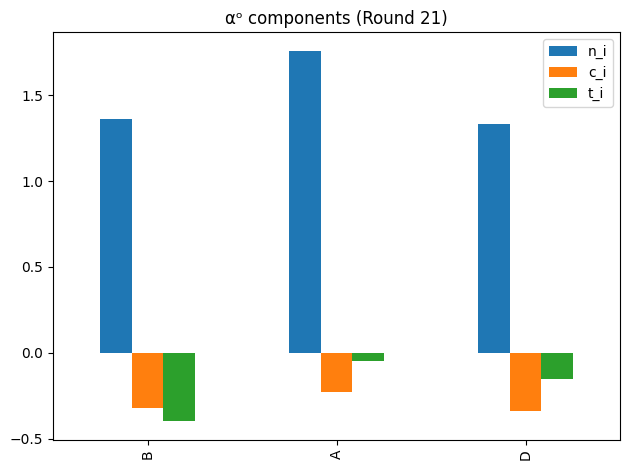

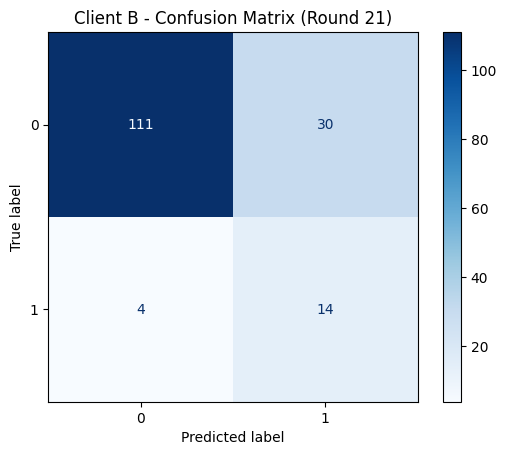


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9652    0.7872    0.8672       141
           1     0.3182    0.7778    0.4516        18

    accuracy                         0.7862       159
   macro avg     0.6417    0.7825    0.6594       159
weighted avg     0.8920    0.7862    0.8201       159



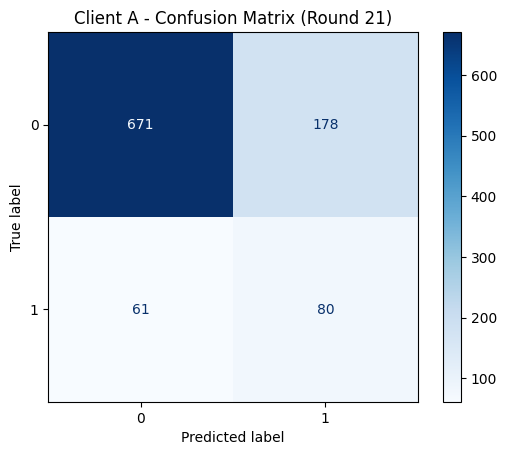


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9167    0.7903    0.8488       849
           1     0.3101    0.5674    0.4010       141

    accuracy                         0.7586       990
   macro avg     0.6134    0.6789    0.6249       990
weighted avg     0.8303    0.7586    0.7850       990



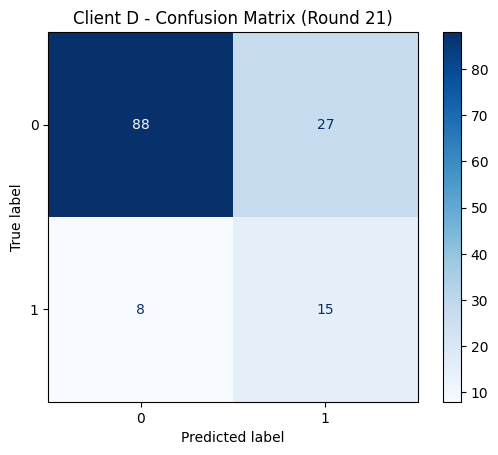


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9167    0.7652    0.8341       115
           1     0.3571    0.6522    0.4615        23

    accuracy                         0.7464       138
   macro avg     0.6369    0.7087    0.6478       138
weighted avg     0.8234    0.7464    0.7720       138


=== Round 22 ===
[Round 22] Global Accuracy: 0.7585 → 0.7753 | MLP Accuracy: 0.7753 | ∆W=0.1816

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

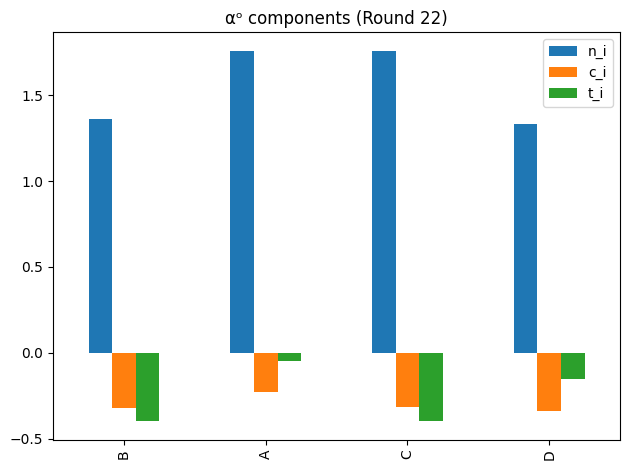

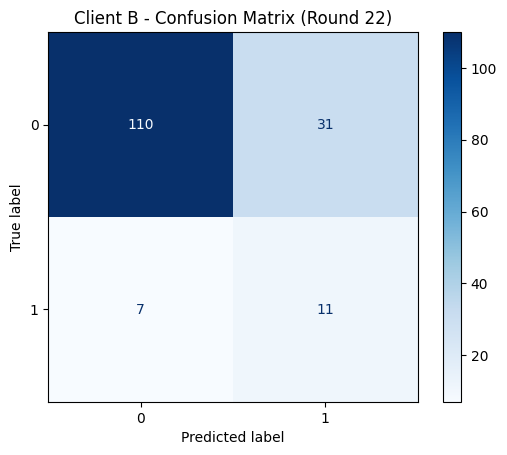


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9402    0.7801    0.8527       141
           1     0.2619    0.6111    0.3667        18

    accuracy                         0.7610       159
   macro avg     0.6010    0.6956    0.6097       159
weighted avg     0.8634    0.7610    0.7977       159



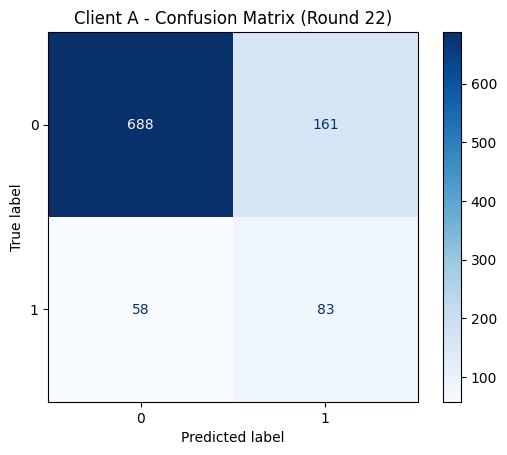


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9223    0.8104    0.8627       849
           1     0.3402    0.5887    0.4312       141

    accuracy                         0.7788       990
   macro avg     0.6312    0.6995    0.6469       990
weighted avg     0.8393    0.7788    0.8012       990



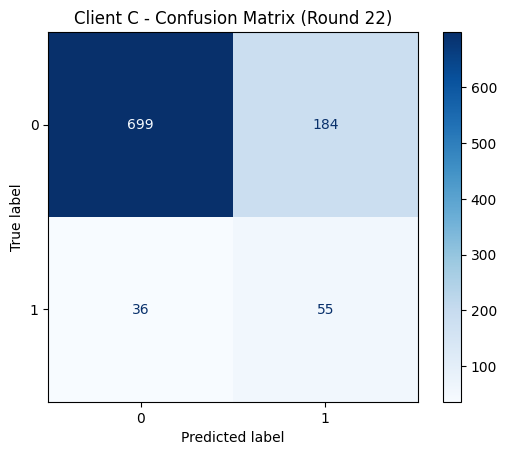


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9510    0.7916    0.8640       883
           1     0.2301    0.6044    0.3333        91

    accuracy                         0.7741       974
   macro avg     0.5906    0.6980    0.5987       974
weighted avg     0.8837    0.7741    0.8144       974



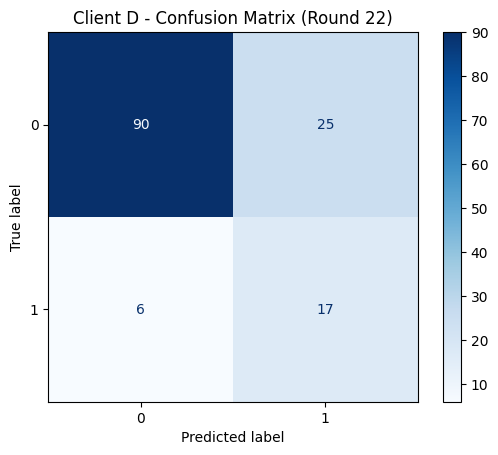


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9375    0.7826    0.8531       115
           1     0.4048    0.7391    0.5231        23

    accuracy                         0.7754       138
   macro avg     0.6711    0.7609    0.6881       138
weighted avg     0.8487    0.7754    0.7981       138


=== Round 23 ===
[Round 23] Global Accuracy: 0.7753 → 0.7660 | MLP Accuracy: 0.7660 | ∆W=0.2072

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

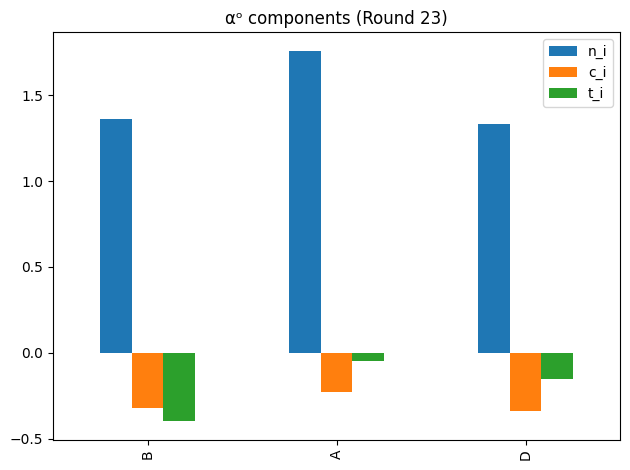

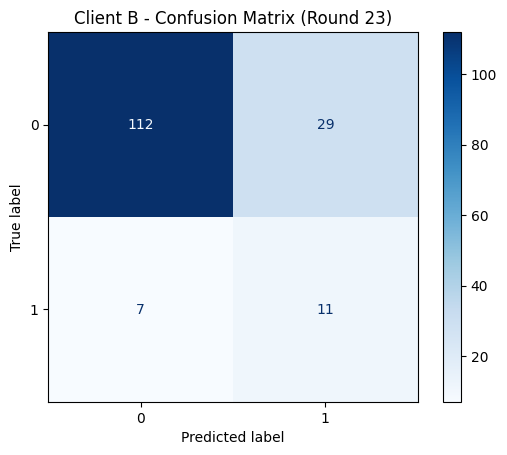


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9412    0.7943    0.8615       141
           1     0.2750    0.6111    0.3793        18

    accuracy                         0.7736       159
   macro avg     0.6081    0.7027    0.6204       159
weighted avg     0.8658    0.7736    0.8069       159



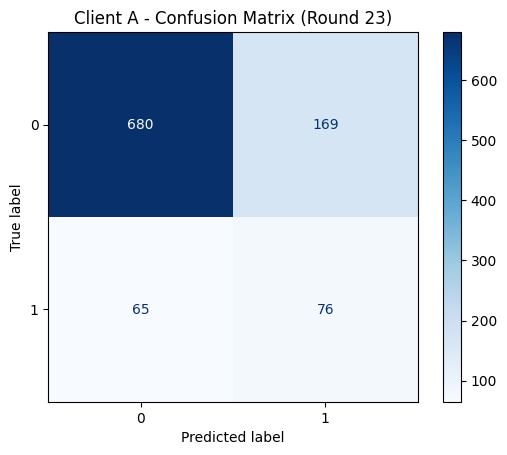


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9128    0.8009    0.8532       849
           1     0.3102    0.5390    0.3938       141

    accuracy                         0.7636       990
   macro avg     0.6115    0.6700    0.6235       990
weighted avg     0.8269    0.7636    0.7878       990



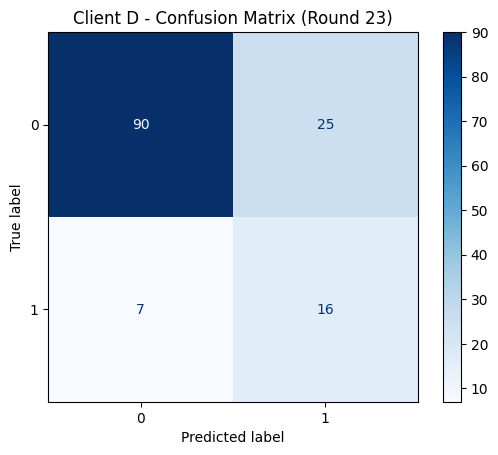


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9278    0.7826    0.8491       115
           1     0.3902    0.6957    0.5000        23

    accuracy                         0.7681       138
   macro avg     0.6590    0.7391    0.6745       138
weighted avg     0.8382    0.7681    0.7909       138


=== Round 24 ===
[Round 24] Global Accuracy: 0.7660 → 0.7506 | MLP Accuracy: 0.7506 | ∆W=0.2497

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

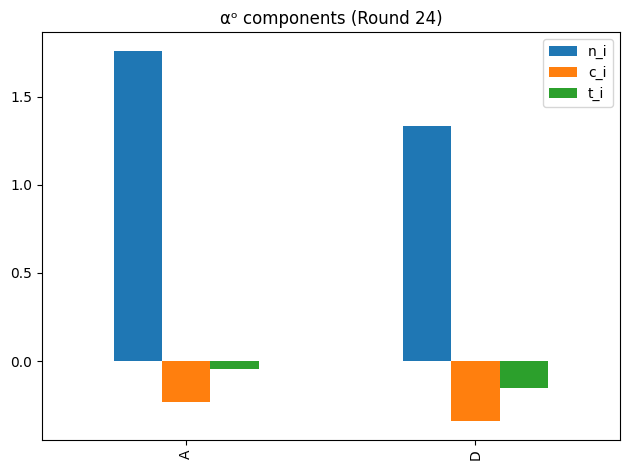

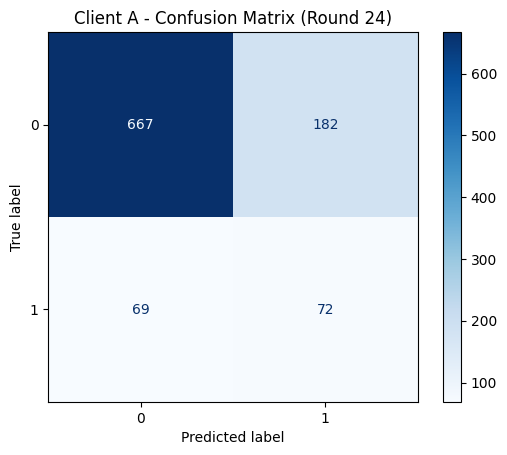


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9062    0.7856    0.8416       849
           1     0.2835    0.5106    0.3646       141

    accuracy                         0.7465       990
   macro avg     0.5949    0.6481    0.6031       990
weighted avg     0.8176    0.7465    0.7737       990



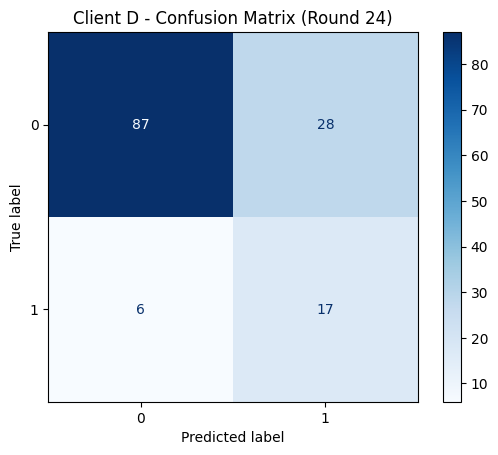


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9355    0.7565    0.8365       115
           1     0.3778    0.7391    0.5000        23

    accuracy                         0.7536       138
   macro avg     0.6566    0.7478    0.6683       138
weighted avg     0.8425    0.7536    0.7804       138


=== Round 25 ===
[Round 25] Global Accuracy: 0.7506 → 0.7536 | MLP Accuracy: 0.7536 | ∆W=0.2326

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

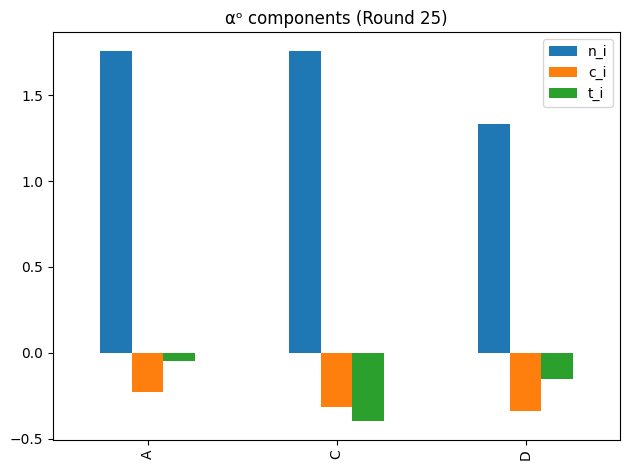

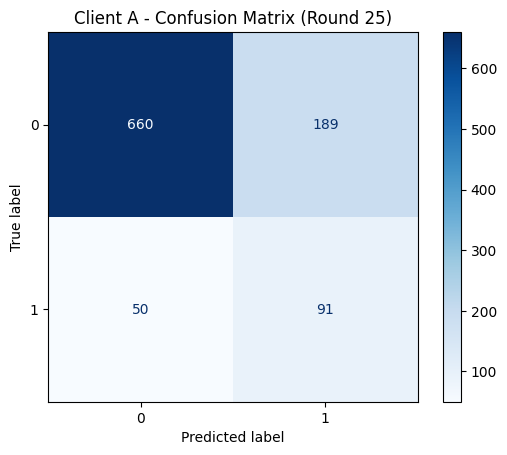


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9296    0.7774    0.8467       849
           1     0.3250    0.6454    0.4323       141

    accuracy                         0.7586       990
   macro avg     0.6273    0.7114    0.6395       990
weighted avg     0.8435    0.7586    0.7877       990



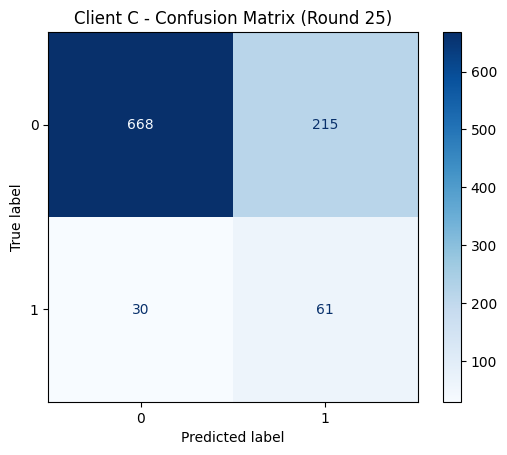


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9570    0.7565    0.8450       883
           1     0.2210    0.6703    0.3324        91

    accuracy                         0.7485       974
   macro avg     0.5890    0.7134    0.5887       974
weighted avg     0.8883    0.7485    0.7971       974



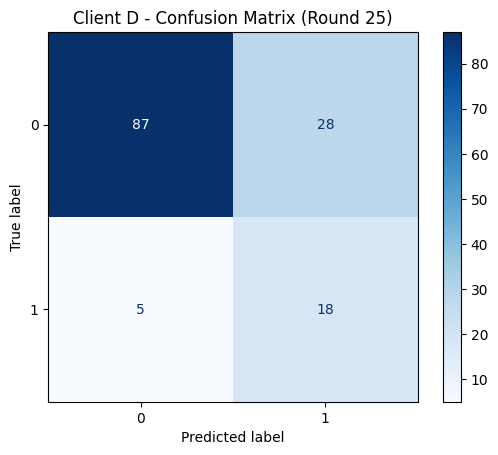


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9457    0.7565    0.8406       115
           1     0.3913    0.7826    0.5217        23

    accuracy                         0.7609       138
   macro avg     0.6685    0.7696    0.6812       138
weighted avg     0.8533    0.7609    0.7874       138


=== Round 26 ===
[Round 26] Global Accuracy: 0.7536 → 0.7691 | MLP Accuracy: 0.7691 | ∆W=0.2095

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

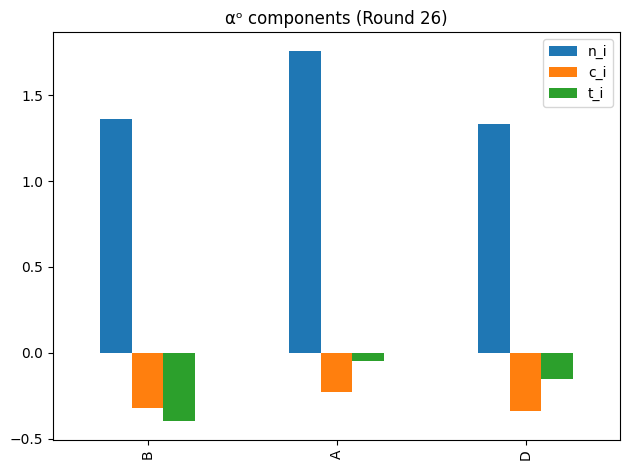

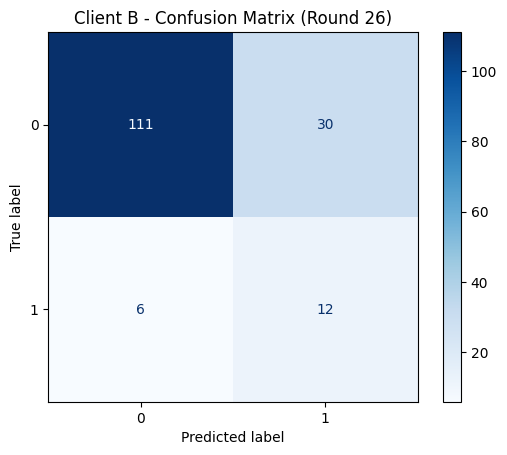


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9487    0.7872    0.8605       141
           1     0.2857    0.6667    0.4000        18

    accuracy                         0.7736       159
   macro avg     0.6172    0.7270    0.6302       159
weighted avg     0.8737    0.7736    0.8083       159



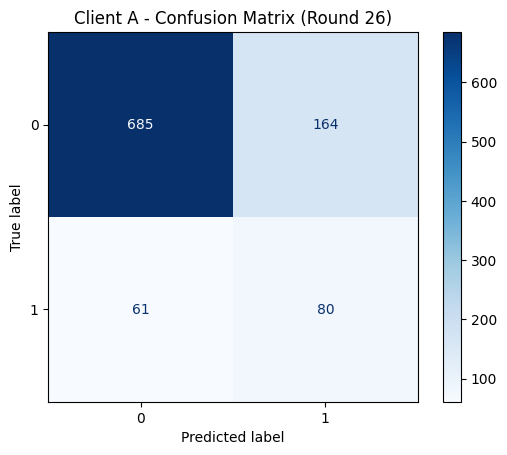


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9182    0.8068    0.8589       849
           1     0.3279    0.5674    0.4156       141

    accuracy                         0.7727       990
   macro avg     0.6230    0.6871    0.6373       990
weighted avg     0.8341    0.7727    0.7958       990



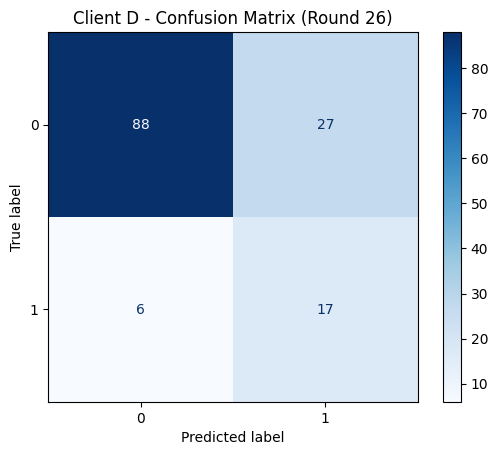


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9362    0.7652    0.8421       115
           1     0.3864    0.7391    0.5075        23

    accuracy                         0.7609       138
   macro avg     0.6613    0.7522    0.6748       138
weighted avg     0.8445    0.7609    0.7863       138


=== Round 27 ===
[Round 27] Global Accuracy: 0.7691 → 0.7753 | MLP Accuracy: 0.7753 | ∆W=0.1934

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

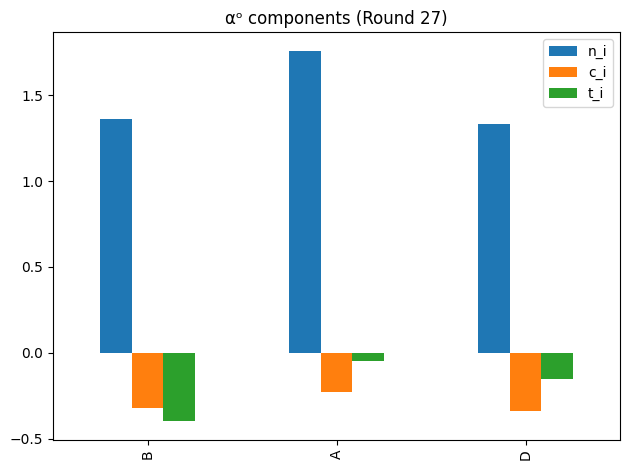

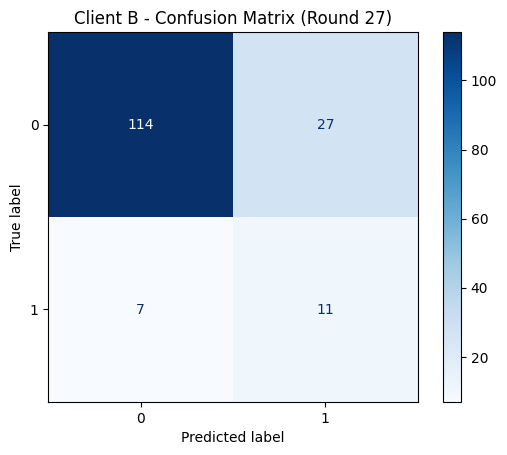


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9421    0.8085    0.8702       141
           1     0.2895    0.6111    0.3929        18

    accuracy                         0.7862       159
   macro avg     0.6158    0.7098    0.6315       159
weighted avg     0.8683    0.7862    0.8162       159



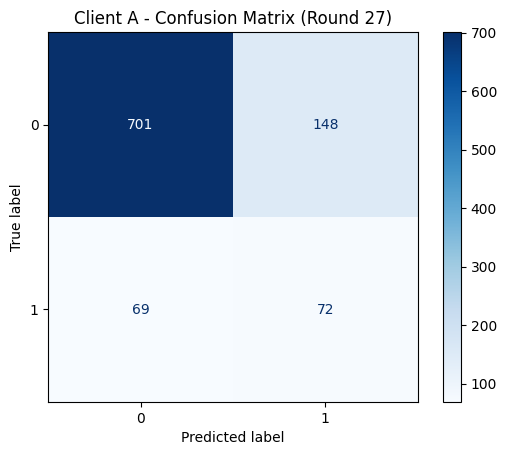


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9104    0.8257    0.8660       849
           1     0.3273    0.5106    0.3989       141

    accuracy                         0.7808       990
   macro avg     0.6188    0.6682    0.6324       990
weighted avg     0.8273    0.7808    0.7994       990



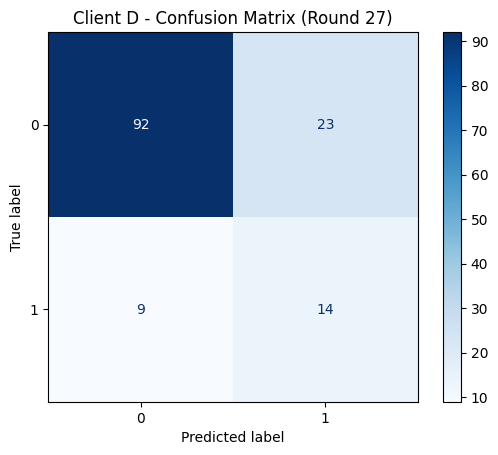


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9109    0.8000    0.8519       115
           1     0.3784    0.6087    0.4667        23

    accuracy                         0.7681       138
   macro avg     0.6446    0.7043    0.6593       138
weighted avg     0.8221    0.7681    0.7877       138


=== Round 28 ===
[Round 28] Global Accuracy: 0.7753 → 0.7647 | MLP Accuracy: 0.7647 | ∆W=0.2513

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

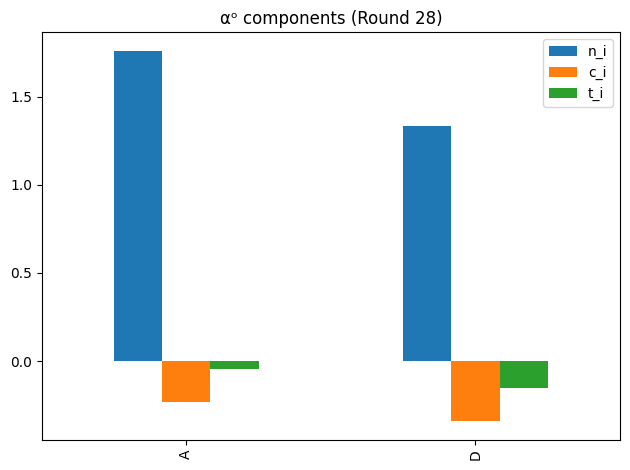

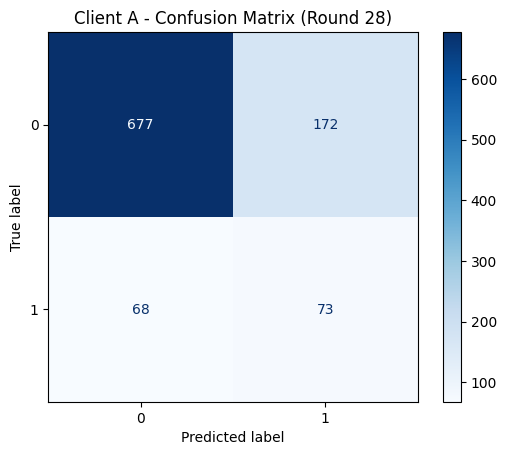


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9087    0.7974    0.8494       849
           1     0.2980    0.5177    0.3782       141

    accuracy                         0.7576       990
   macro avg     0.6033    0.6576    0.6138       990
weighted avg     0.8217    0.7576    0.7823       990



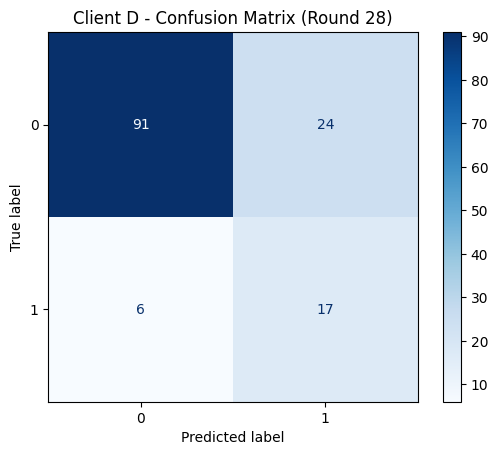


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9381    0.7913    0.8585       115
           1     0.4146    0.7391    0.5312        23

    accuracy                         0.7826       138
   macro avg     0.6764    0.7652    0.6949       138
weighted avg     0.8509    0.7826    0.8040       138


=== Round 29 ===
[Round 29] Global Accuracy: 0.7647 → 0.7775 | MLP Accuracy: 0.7775 | ∆W=0.2079

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

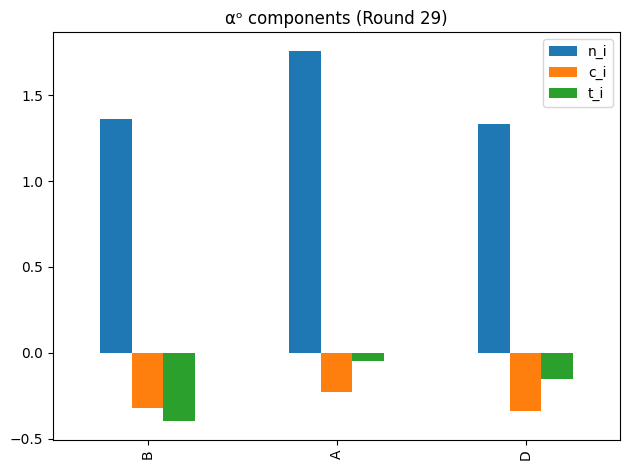

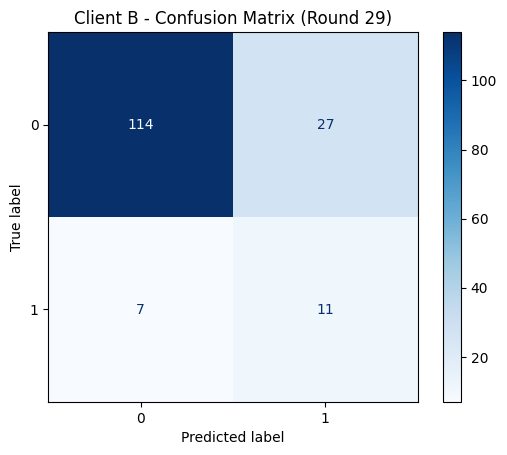


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9421    0.8085    0.8702       141
           1     0.2895    0.6111    0.3929        18

    accuracy                         0.7862       159
   macro avg     0.6158    0.7098    0.6315       159
weighted avg     0.8683    0.7862    0.8162       159



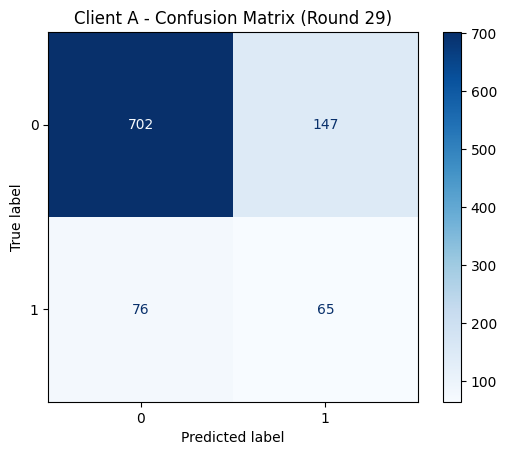


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9023    0.8269    0.8629       849
           1     0.3066    0.4610    0.3683       141

    accuracy                         0.7747       990
   macro avg     0.6045    0.6439    0.6156       990
weighted avg     0.8175    0.7747    0.7925       990



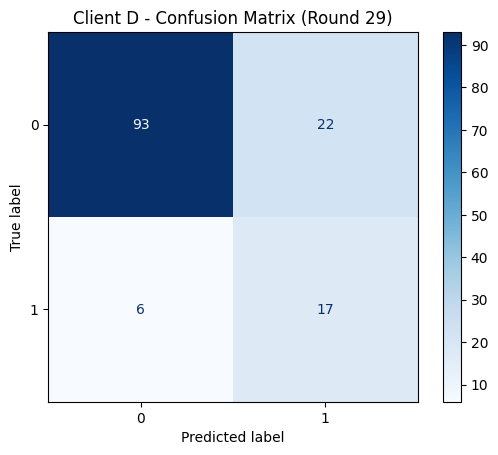


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9394    0.8087    0.8692       115
           1     0.4359    0.7391    0.5484        23

    accuracy                         0.7971       138
   macro avg     0.6876    0.7739    0.7088       138
weighted avg     0.8555    0.7971    0.8157       138


=== Round 30 ===
[Round 30] Global Accuracy: 0.7775 → 0.7682 | MLP Accuracy: 0.7682 | ∆W=0.2470

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

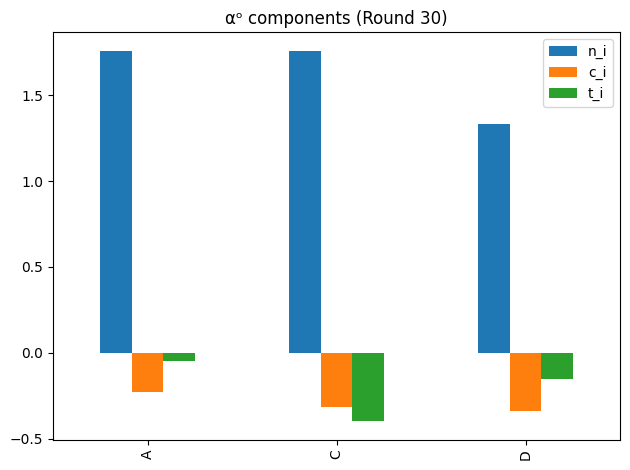

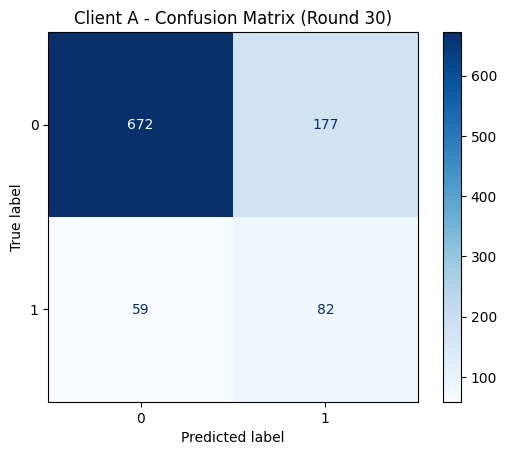


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9193    0.7915    0.8506       849
           1     0.3166    0.5816    0.4100       141

    accuracy                         0.7616       990
   macro avg     0.6179    0.6865    0.6303       990
weighted avg     0.8335    0.7616    0.7879       990



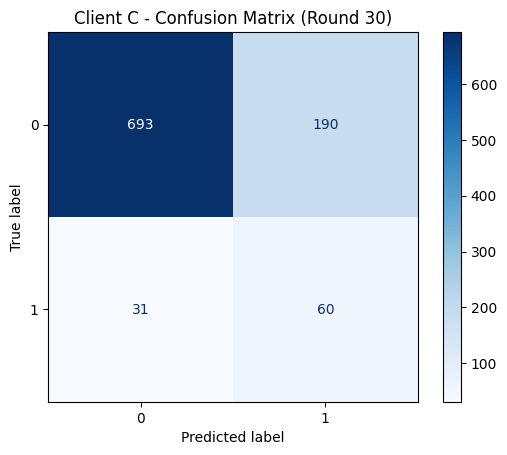


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9572    0.7848    0.8625       883
           1     0.2400    0.6593    0.3519        91

    accuracy                         0.7731       974
   macro avg     0.5986    0.7221    0.6072       974
weighted avg     0.8902    0.7731    0.8148       974



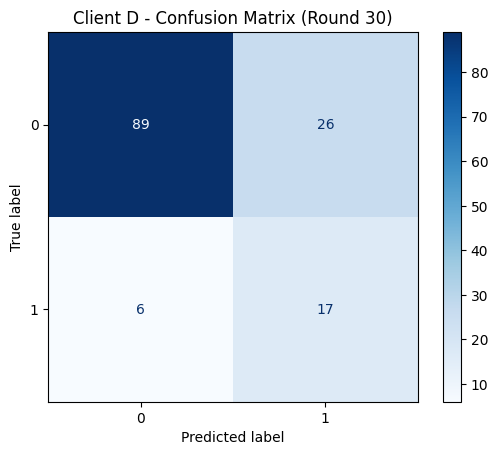


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9368    0.7739    0.8476       115
           1     0.3953    0.7391    0.5152        23

    accuracy                         0.7681       138
   macro avg     0.6661    0.7565    0.6814       138
weighted avg     0.8466    0.7681    0.7922       138


=== Round 31 ===
[Round 31] Global Accuracy: 0.7682 → 0.7647 | MLP Accuracy: 0.7647 | ∆W=0.2033

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

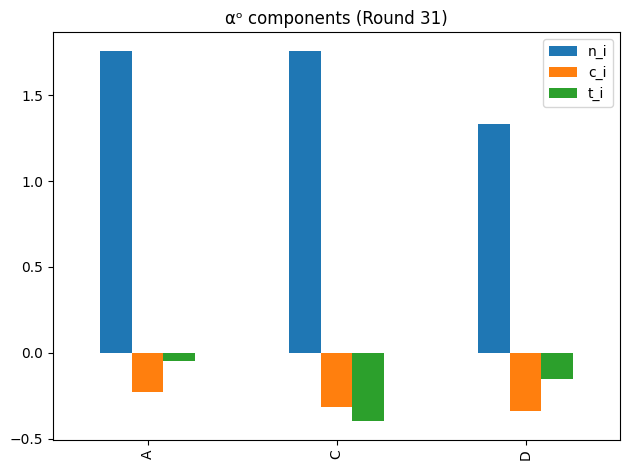

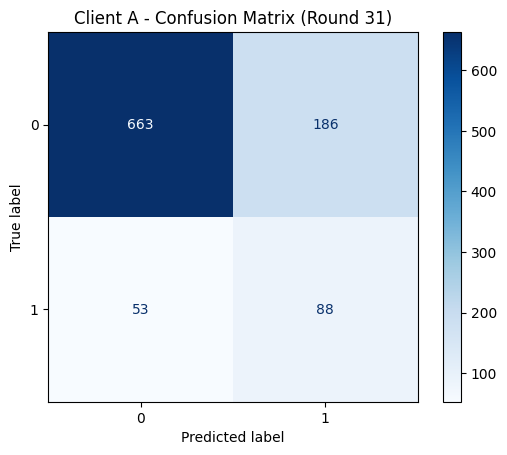


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9260    0.7809    0.8473       849
           1     0.3212    0.6241    0.4241       141

    accuracy                         0.7586       990
   macro avg     0.6236    0.7025    0.6357       990
weighted avg     0.8398    0.7586    0.7870       990



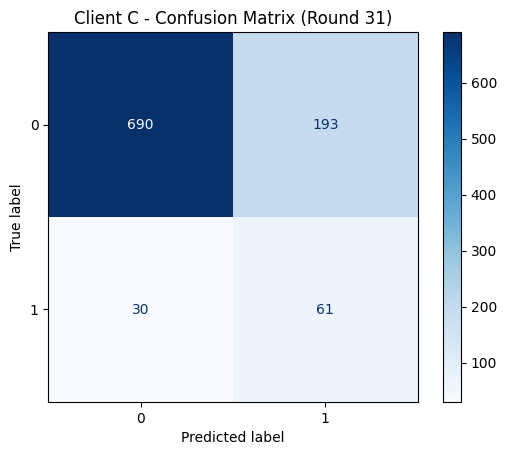


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9583    0.7814    0.8609       883
           1     0.2402    0.6703    0.3536        91

    accuracy                         0.7710       974
   macro avg     0.5992    0.7259    0.6073       974
weighted avg     0.8912    0.7710    0.8135       974



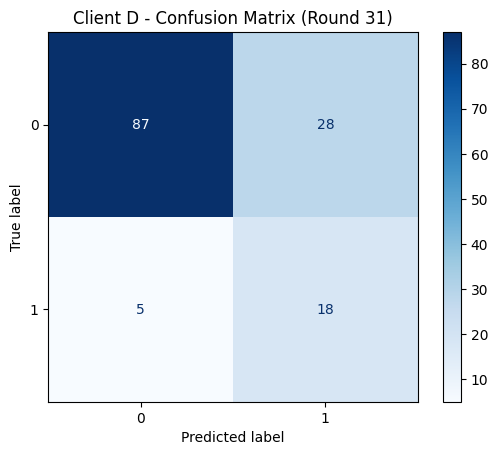


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9457    0.7565    0.8406       115
           1     0.3913    0.7826    0.5217        23

    accuracy                         0.7609       138
   macro avg     0.6685    0.7696    0.6812       138
weighted avg     0.8533    0.7609    0.7874       138


=== Round 32 ===
[Round 32] Global Accuracy: 0.7647 → 0.7678 | MLP Accuracy: 0.7678 | ∆W=0.2023

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

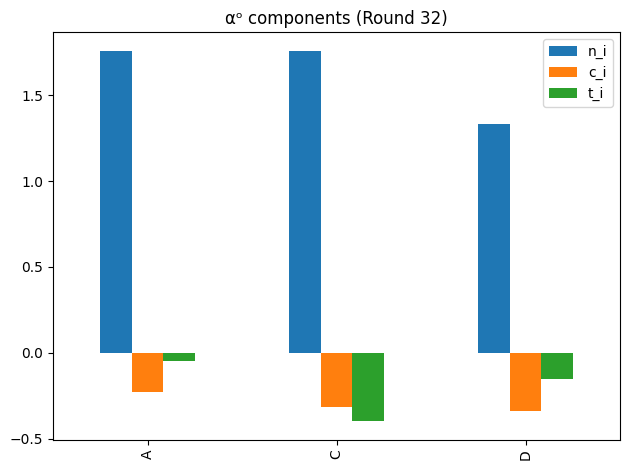

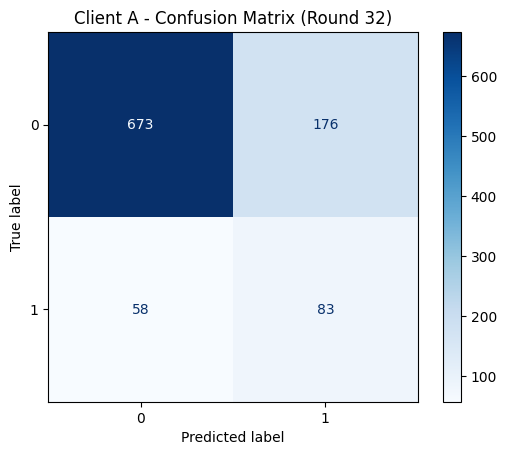


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9207    0.7927    0.8519       849
           1     0.3205    0.5887    0.4150       141

    accuracy                         0.7636       990
   macro avg     0.6206    0.6907    0.6334       990
weighted avg     0.8352    0.7636    0.7897       990



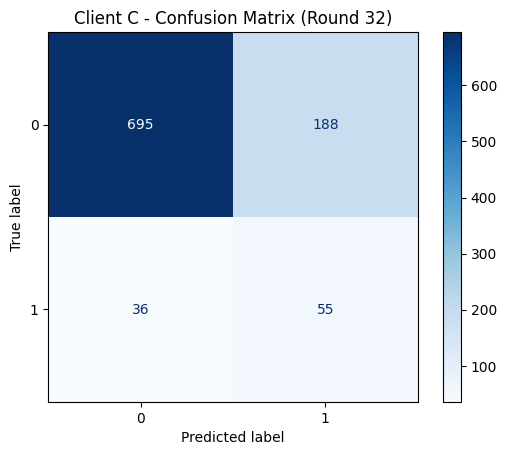


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9508    0.7871    0.8612       883
           1     0.2263    0.6044    0.3293        91

    accuracy                         0.7700       974
   macro avg     0.5885    0.6957    0.5953       974
weighted avg     0.8831    0.7700    0.8115       974



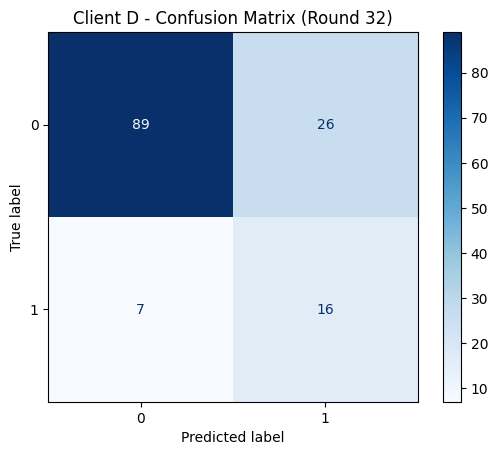


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9271    0.7739    0.8436       115
           1     0.3810    0.6957    0.4923        23

    accuracy                         0.7609       138
   macro avg     0.6540    0.7348    0.6680       138
weighted avg     0.8361    0.7609    0.7851       138


=== Round 33 ===
[Round 33] Global Accuracy: 0.7678 → 0.7780 | MLP Accuracy: 0.7780 | ∆W=0.2168

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

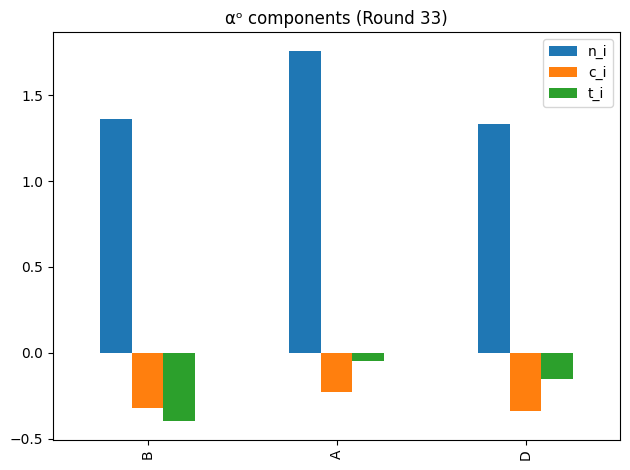

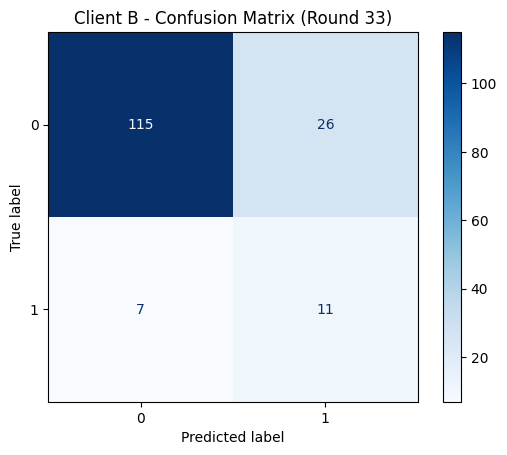


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9426    0.8156    0.8745       141
           1     0.2973    0.6111    0.4000        18

    accuracy                         0.7925       159
   macro avg     0.6200    0.7134    0.6373       159
weighted avg     0.8696    0.7925    0.8208       159



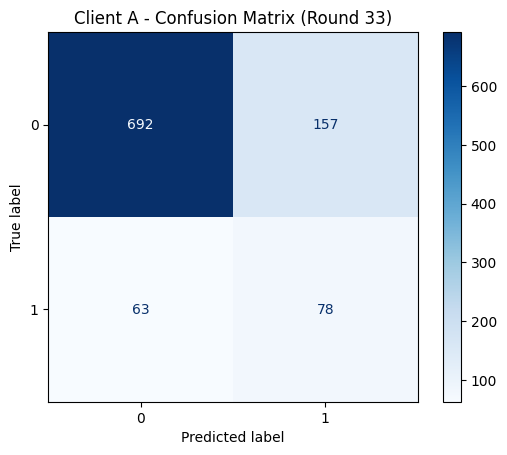


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9166    0.8151    0.8628       849
           1     0.3319    0.5532    0.4149       141

    accuracy                         0.7778       990
   macro avg     0.6242    0.6841    0.6389       990
weighted avg     0.8333    0.7778    0.7990       990



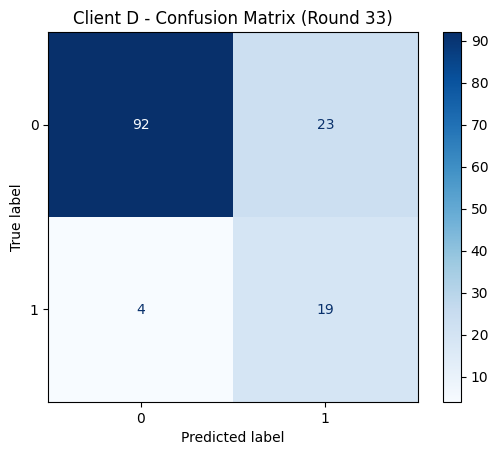


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9583    0.8000    0.8720       115
           1     0.4524    0.8261    0.5846        23

    accuracy                         0.8043       138
   macro avg     0.7054    0.8130    0.7283       138
weighted avg     0.8740    0.8043    0.8241       138


=== Round 34 ===
[Round 34] Global Accuracy: 0.7780 → 0.7678 | MLP Accuracy: 0.7678 | ∆W=0.2476

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

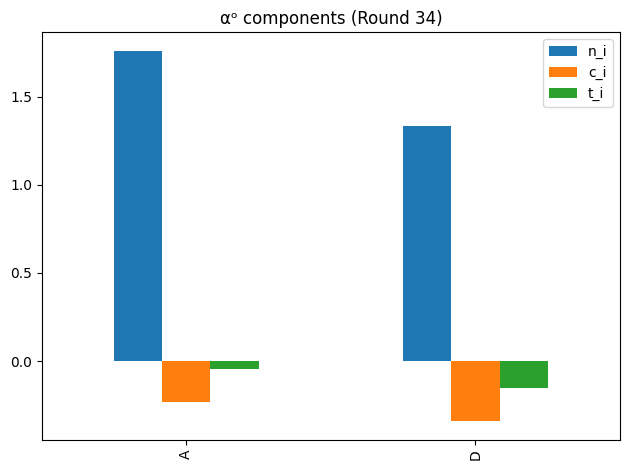

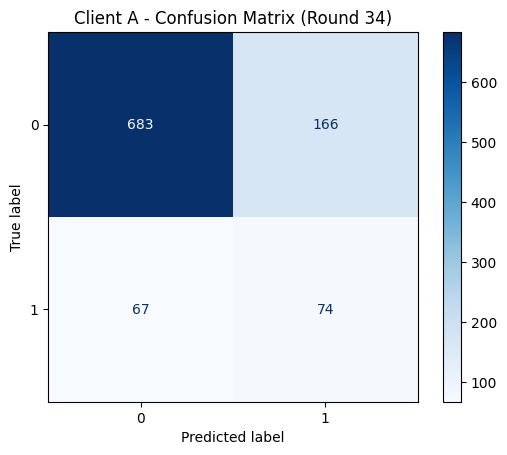


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9107    0.8045    0.8543       849
           1     0.3083    0.5248    0.3885       141

    accuracy                         0.7646       990
   macro avg     0.6095    0.6646    0.6214       990
weighted avg     0.8249    0.7646    0.7879       990



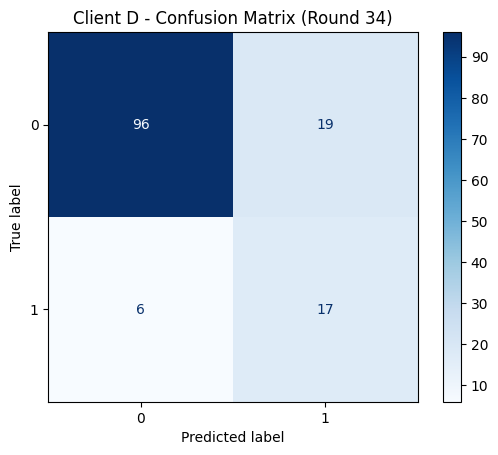


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9412    0.8348    0.8848       115
           1     0.4722    0.7391    0.5763        23

    accuracy                         0.8188       138
   macro avg     0.7067    0.7870    0.7305       138
weighted avg     0.8630    0.8188    0.8334       138


=== Round 35 ===
[Round 35] Global Accuracy: 0.7678 → 0.7713 | MLP Accuracy: 0.7713 | ∆W=0.2060

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

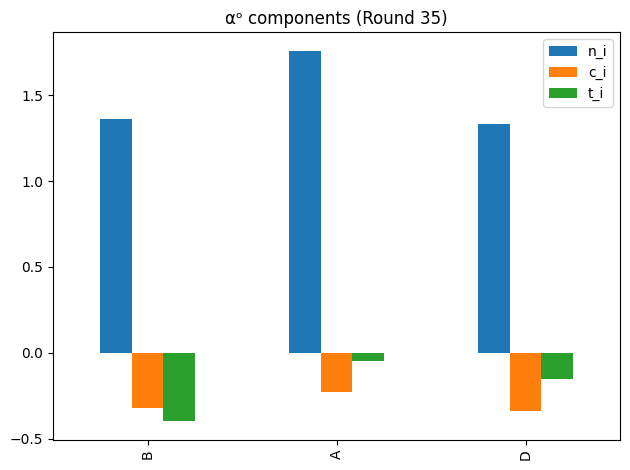

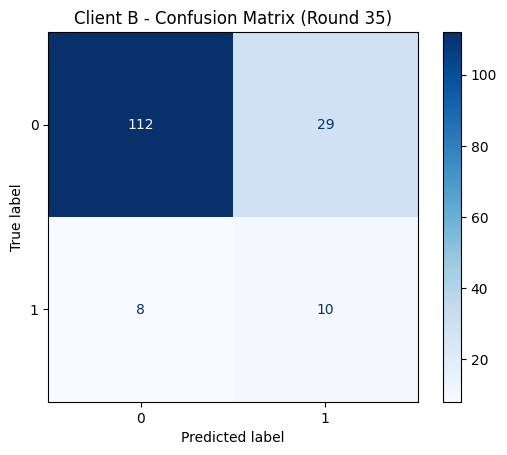


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9333    0.7943    0.8582       141
           1     0.2564    0.5556    0.3509        18

    accuracy                         0.7673       159
   macro avg     0.5949    0.6749    0.6046       159
weighted avg     0.8567    0.7673    0.8008       159



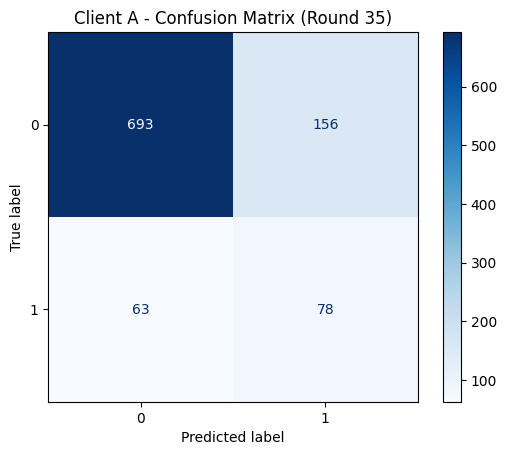


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9167    0.8163    0.8636       849
           1     0.3333    0.5532    0.4160       141

    accuracy                         0.7788       990
   macro avg     0.6250    0.6847    0.6398       990
weighted avg     0.8336    0.7788    0.7998       990



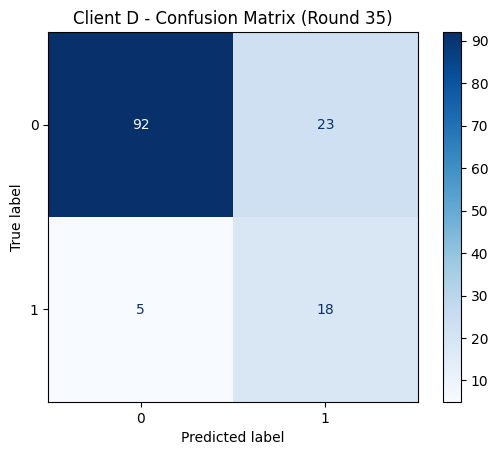


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9485    0.8000    0.8679       115
           1     0.4390    0.7826    0.5625        23

    accuracy                         0.7971       138
   macro avg     0.6937    0.7913    0.7152       138
weighted avg     0.8635    0.7971    0.8170       138


=== Round 36 ===
[Round 36] Global Accuracy: 0.7713 → 0.7802 | MLP Accuracy: 0.7802 | ∆W=0.1994

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

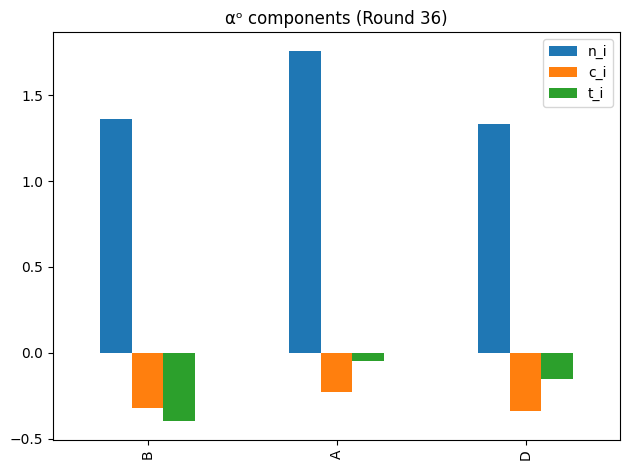

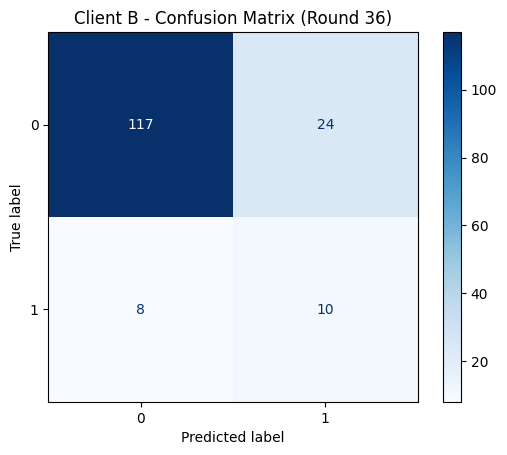


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9360    0.8298    0.8797       141
           1     0.2941    0.5556    0.3846        18

    accuracy                         0.7987       159
   macro avg     0.6151    0.6927    0.6322       159
weighted avg     0.8633    0.7987    0.8237       159



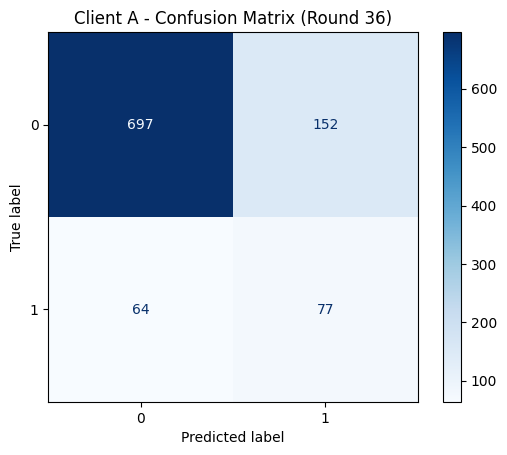


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9159    0.8210    0.8658       849
           1     0.3362    0.5461    0.4162       141

    accuracy                         0.7818       990
   macro avg     0.6261    0.6835    0.6410       990
weighted avg     0.8333    0.7818    0.8018       990



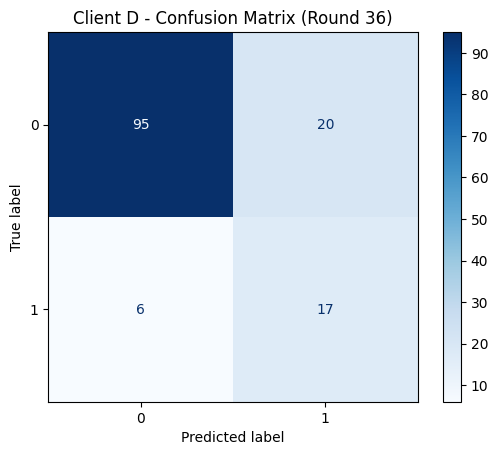


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9406    0.8261    0.8796       115
           1     0.4595    0.7391    0.5667        23

    accuracy                         0.8116       138
   macro avg     0.7000    0.7826    0.7231       138
weighted avg     0.8604    0.8116    0.8275       138


=== Round 37 ===
[Round 37] Global Accuracy: 0.7802 → 0.7802 | MLP Accuracy: 0.7802 | ∆W=0.2094

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

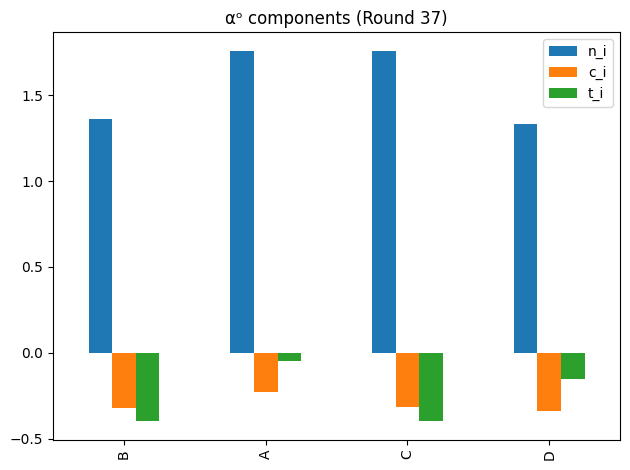

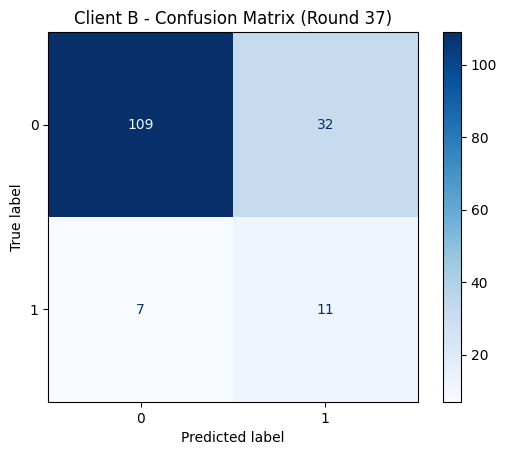


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9397    0.7730    0.8482       141
           1     0.2558    0.6111    0.3607        18

    accuracy                         0.7547       159
   macro avg     0.5977    0.6921    0.6045       159
weighted avg     0.8622    0.7547    0.7930       159



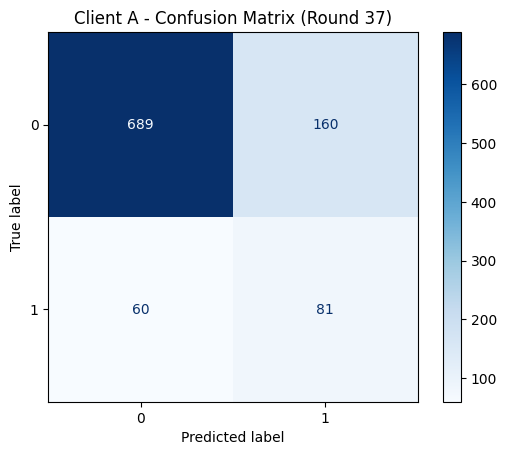


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9199    0.8115    0.8623       849
           1     0.3361    0.5745    0.4241       141

    accuracy                         0.7778       990
   macro avg     0.6280    0.6930    0.6432       990
weighted avg     0.8367    0.7778    0.7999       990



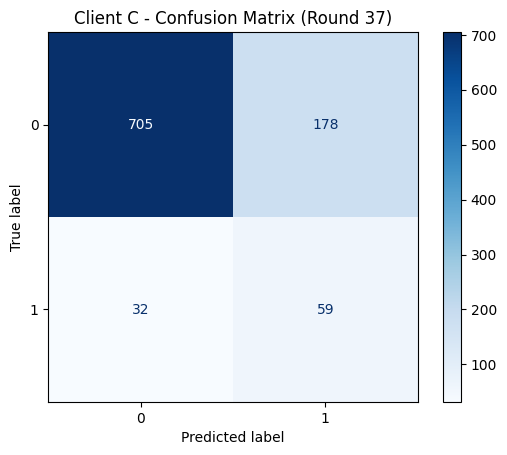


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9566    0.7984    0.8704       883
           1     0.2489    0.6484    0.3598        91

    accuracy                         0.7844       974
   macro avg     0.6028    0.7234    0.6151       974
weighted avg     0.8905    0.7844    0.8227       974



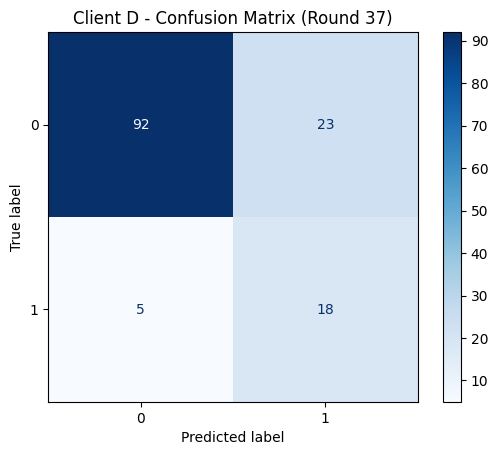


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9485    0.8000    0.8679       115
           1     0.4390    0.7826    0.5625        23

    accuracy                         0.7971       138
   macro avg     0.6937    0.7913    0.7152       138
weighted avg     0.8635    0.7971    0.8170       138


=== Round 38 ===
[Round 38] Global Accuracy: 0.7802 → 0.7890 | MLP Accuracy: 0.7890 | ∆W=0.1941

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

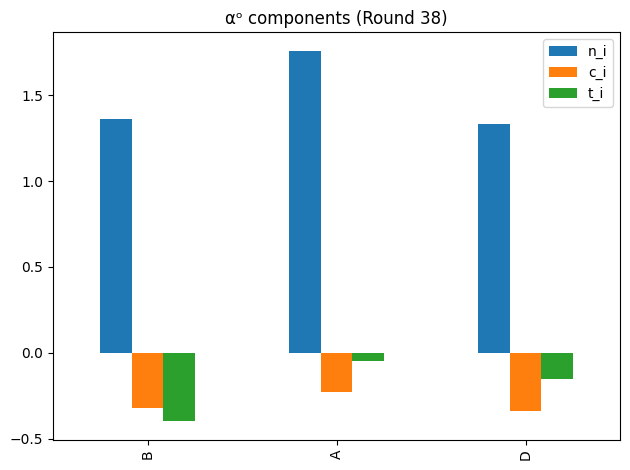

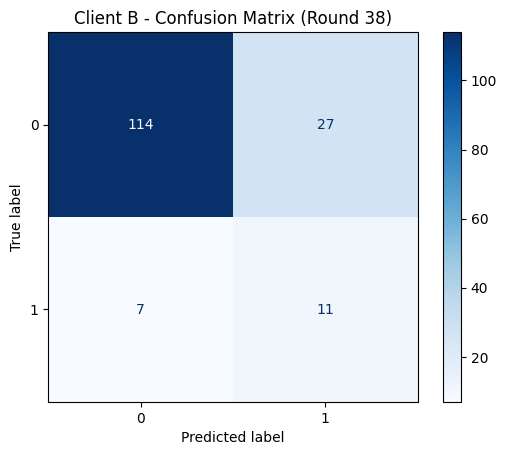


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9421    0.8085    0.8702       141
           1     0.2895    0.6111    0.3929        18

    accuracy                         0.7862       159
   macro avg     0.6158    0.7098    0.6315       159
weighted avg     0.8683    0.7862    0.8162       159



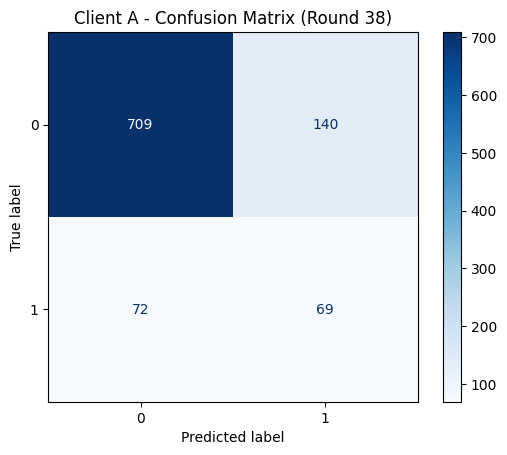


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9078    0.8351    0.8699       849
           1     0.3301    0.4894    0.3943       141

    accuracy                         0.7859       990
   macro avg     0.6190    0.6622    0.6321       990
weighted avg     0.8255    0.7859    0.8022       990



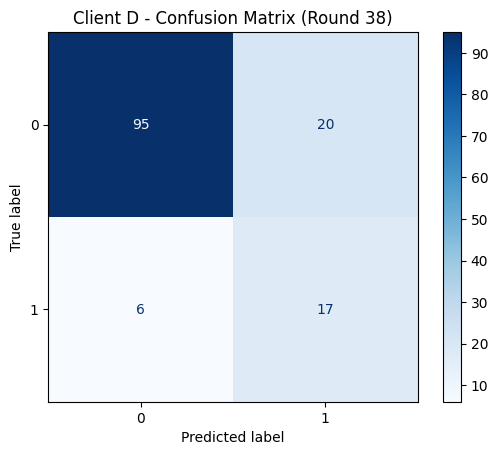


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9406    0.8261    0.8796       115
           1     0.4595    0.7391    0.5667        23

    accuracy                         0.8116       138
   macro avg     0.7000    0.7826    0.7231       138
weighted avg     0.8604    0.8116    0.8275       138


=== Round 39 ===
[Round 39] Global Accuracy: 0.7890 → 0.7682 | MLP Accuracy: 0.7682 | ∆W=0.2264

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

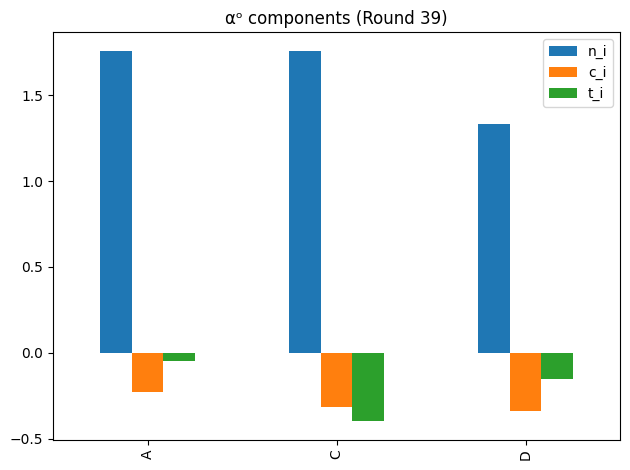

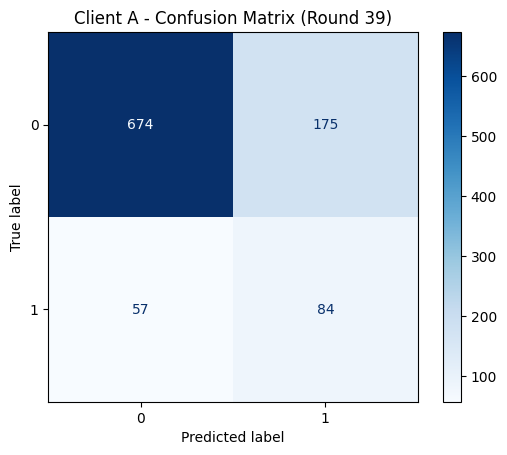


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9220    0.7939    0.8532       849
           1     0.3243    0.5957    0.4200       141

    accuracy                         0.7657       990
   macro avg     0.6232    0.6948    0.6366       990
weighted avg     0.8369    0.7657    0.7915       990



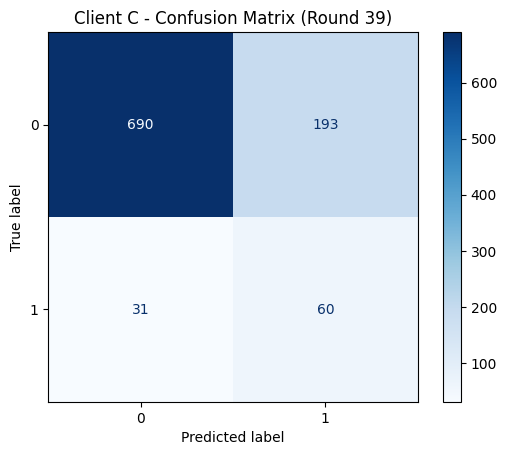


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9570    0.7814    0.8603       883
           1     0.2372    0.6593    0.3488        91

    accuracy                         0.7700       974
   macro avg     0.5971    0.7204    0.6046       974
weighted avg     0.8897    0.7700    0.8126       974



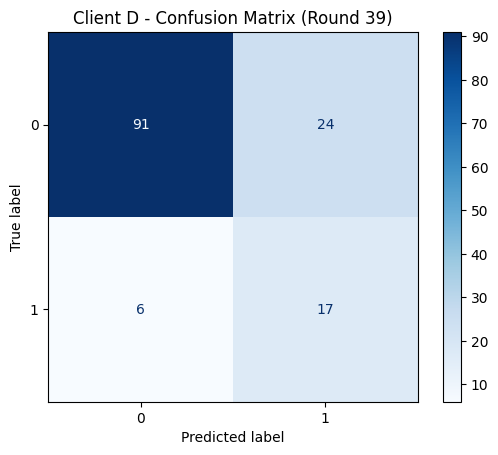


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9381    0.7913    0.8585       115
           1     0.4146    0.7391    0.5312        23

    accuracy                         0.7826       138
   macro avg     0.6764    0.7652    0.6949       138
weighted avg     0.8509    0.7826    0.8040       138


=== Round 40 ===
[Round 40] Global Accuracy: 0.7682 → 0.7842 | MLP Accuracy: 0.7842 | ∆W=0.2059

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

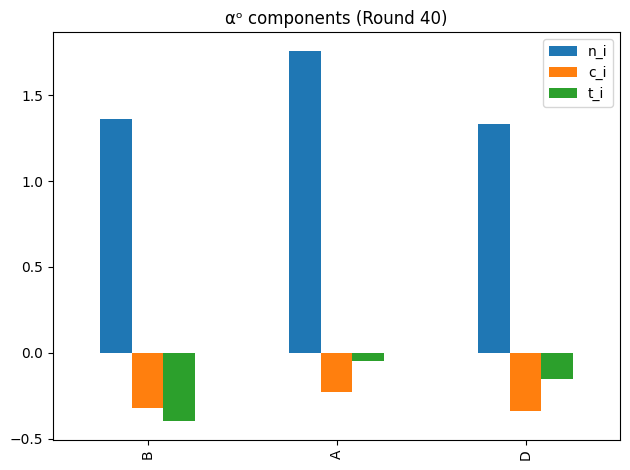

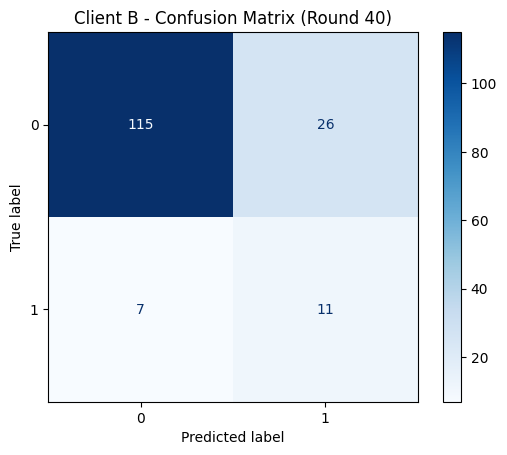


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9426    0.8156    0.8745       141
           1     0.2973    0.6111    0.4000        18

    accuracy                         0.7925       159
   macro avg     0.6200    0.7134    0.6373       159
weighted avg     0.8696    0.7925    0.8208       159



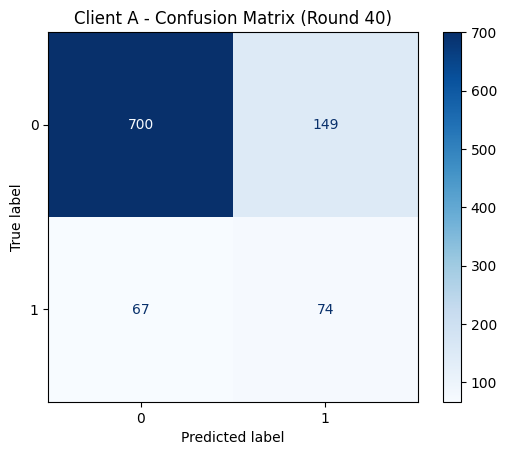


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9126    0.8245    0.8663       849
           1     0.3318    0.5248    0.4066       141

    accuracy                         0.7818       990
   macro avg     0.6222    0.6747    0.6365       990
weighted avg     0.8299    0.7818    0.8009       990



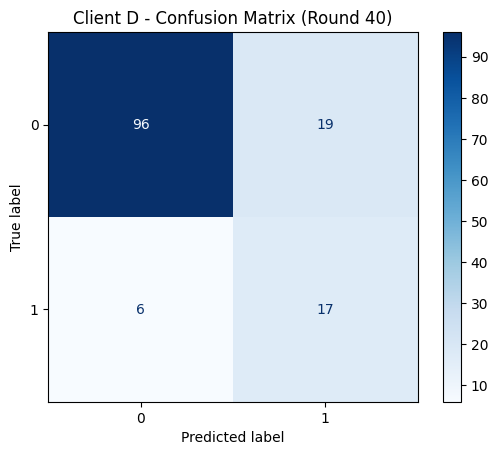


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9412    0.8348    0.8848       115
           1     0.4722    0.7391    0.5763        23

    accuracy                         0.8188       138
   macro avg     0.7067    0.7870    0.7305       138
weighted avg     0.8630    0.8188    0.8334       138


=== Round 41 ===
[Round 41] Global Accuracy: 0.7842 → 0.7793 | MLP Accuracy: 0.7793 | ∆W=0.2167

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

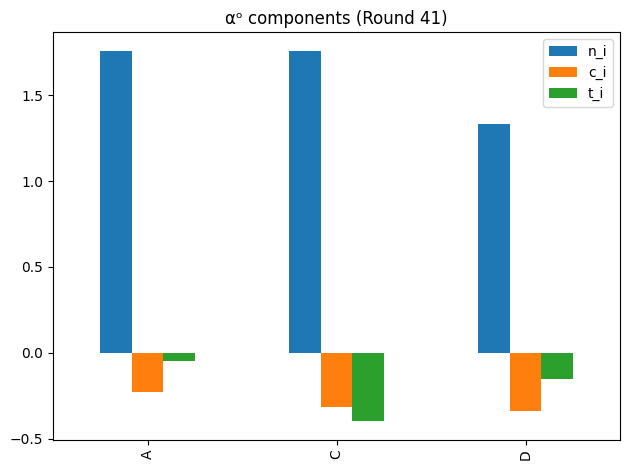

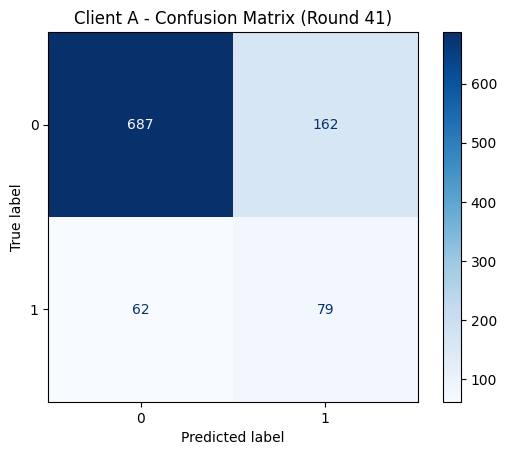


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9172    0.8092    0.8598       849
           1     0.3278    0.5603    0.4136       141

    accuracy                         0.7737       990
   macro avg     0.6225    0.6847    0.6367       990
weighted avg     0.8333    0.7737    0.7963       990



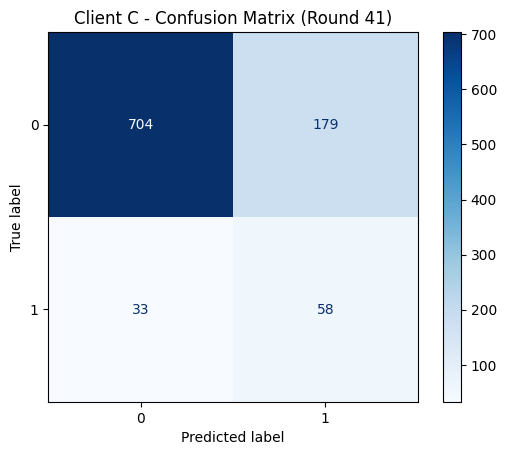


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9552    0.7973    0.8691       883
           1     0.2447    0.6374    0.3537        91

    accuracy                         0.7823       974
   macro avg     0.6000    0.7173    0.6114       974
weighted avg     0.8888    0.7823    0.8210       974



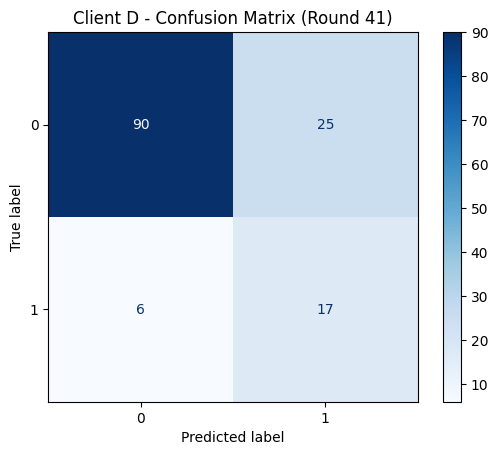


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9375    0.7826    0.8531       115
           1     0.4048    0.7391    0.5231        23

    accuracy                         0.7754       138
   macro avg     0.6711    0.7609    0.6881       138
weighted avg     0.8487    0.7754    0.7981       138


=== Round 42 ===
[Round 42] Global Accuracy: 0.7793 → 0.7775 | MLP Accuracy: 0.7775 | ∆W=0.2049

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

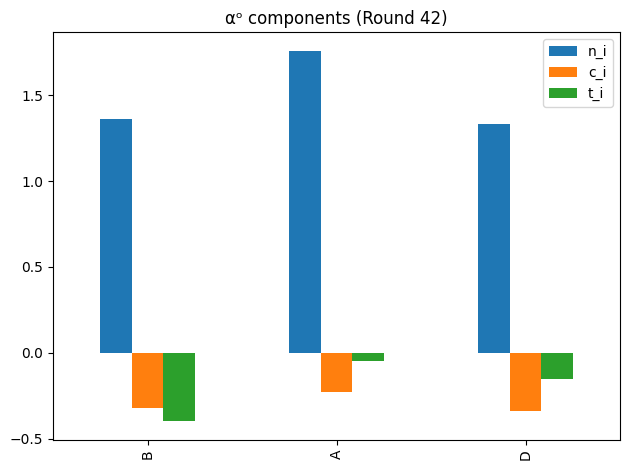

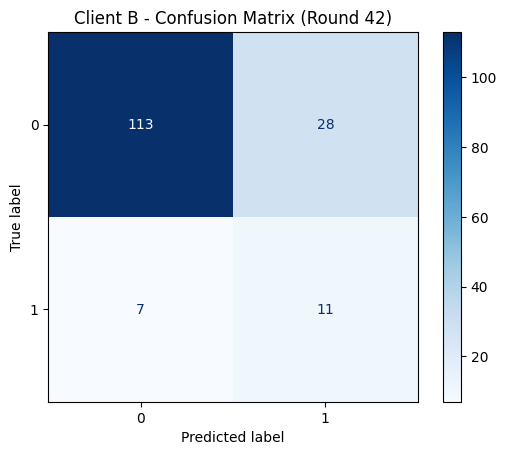


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9417    0.8014    0.8659       141
           1     0.2821    0.6111    0.3860        18

    accuracy                         0.7799       159
   macro avg     0.6119    0.7063    0.6259       159
weighted avg     0.8670    0.7799    0.8116       159



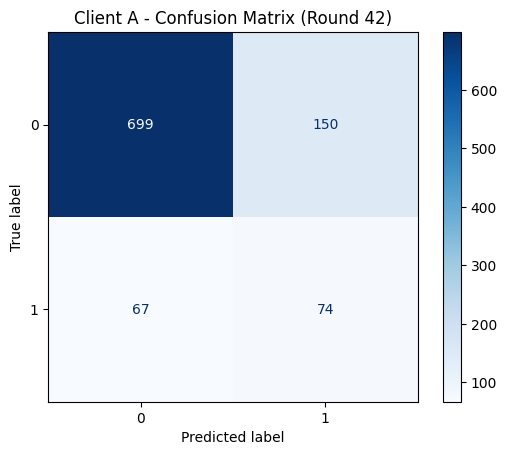


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9125    0.8233    0.8656       849
           1     0.3304    0.5248    0.4055       141

    accuracy                         0.7808       990
   macro avg     0.6214    0.6741    0.6356       990
weighted avg     0.8296    0.7808    0.8001       990



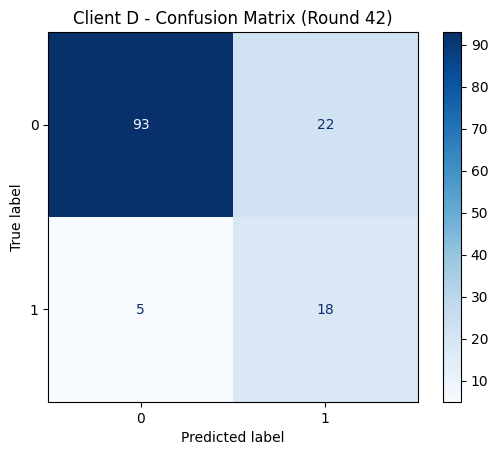


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9490    0.8087    0.8732       115
           1     0.4500    0.7826    0.5714        23

    accuracy                         0.8043       138
   macro avg     0.6995    0.7957    0.7223       138
weighted avg     0.8658    0.8043    0.8229       138


=== Round 43 ===
[Round 43] Global Accuracy: 0.7775 → 0.7802 | MLP Accuracy: 0.7802 | ∆W=0.2213

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

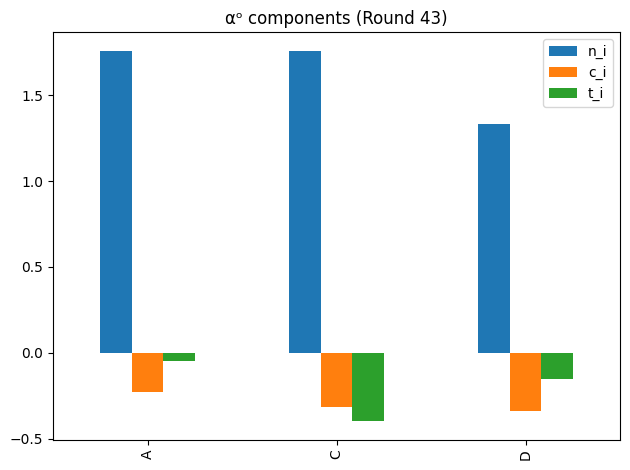

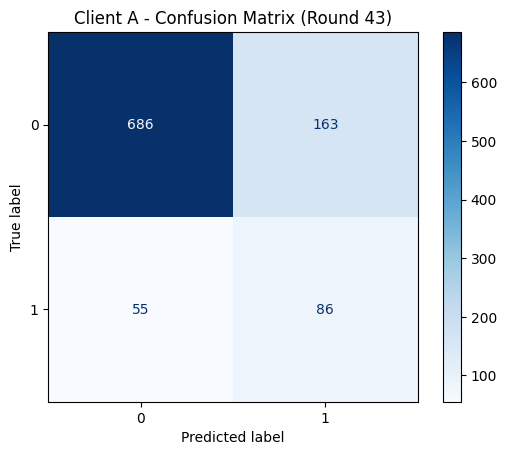


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9258    0.8080    0.8629       849
           1     0.3454    0.6099    0.4410       141

    accuracy                         0.7798       990
   macro avg     0.6356    0.7090    0.6520       990
weighted avg     0.8431    0.7798    0.8028       990



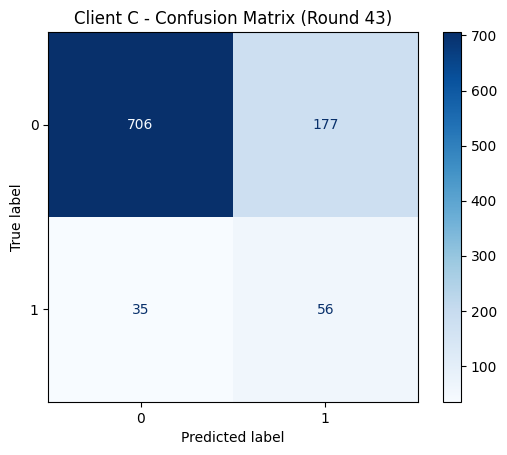


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9528    0.7995    0.8695       883
           1     0.2403    0.6154    0.3457        91

    accuracy                         0.7823       974
   macro avg     0.5966    0.7075    0.6076       974
weighted avg     0.8862    0.7823    0.8205       974



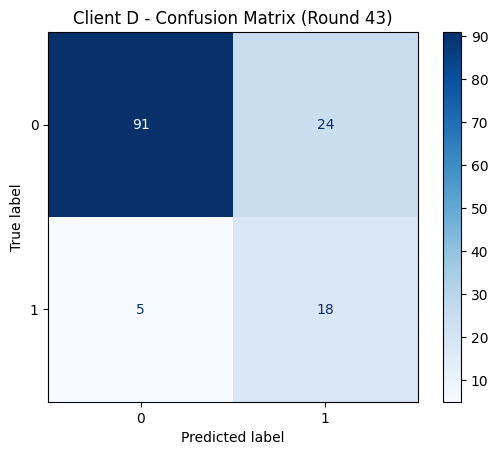


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9479    0.7913    0.8626       115
           1     0.4286    0.7826    0.5538        23

    accuracy                         0.7899       138
   macro avg     0.6882    0.7870    0.7082       138
weighted avg     0.8614    0.7899    0.8111       138


=== Round 44 ===
[Round 44] Global Accuracy: 0.7802 → 0.7859 | MLP Accuracy: 0.7859 | ∆W=0.2058

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
C  56.9649  0.4854  0.4
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

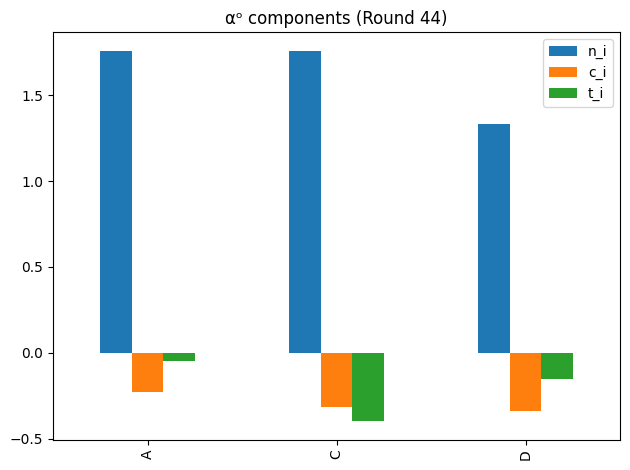

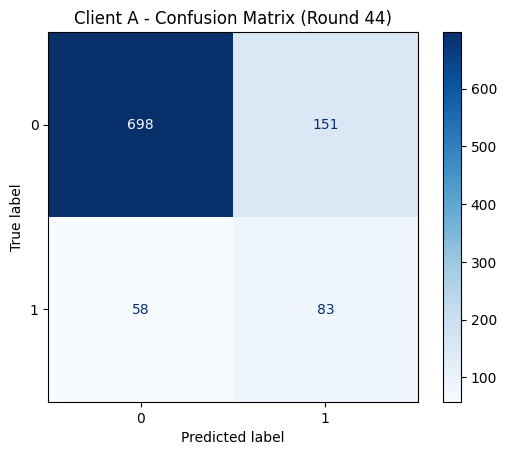


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9233    0.8221    0.8698       849
           1     0.3547    0.5887    0.4427       141

    accuracy                         0.7889       990
   macro avg     0.6390    0.7054    0.6562       990
weighted avg     0.8423    0.7889    0.8090       990



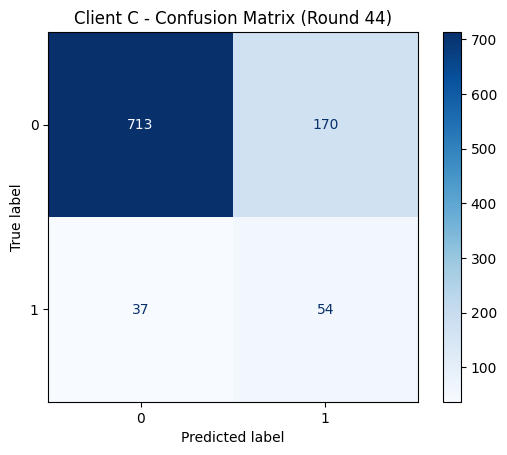


[Client C] Classification Report:
              precision    recall  f1-score   support

           0     0.9507    0.8075    0.8732       883
           1     0.2411    0.5934    0.3429        91

    accuracy                         0.7875       974
   macro avg     0.5959    0.7004    0.6080       974
weighted avg     0.8844    0.7875    0.8237       974



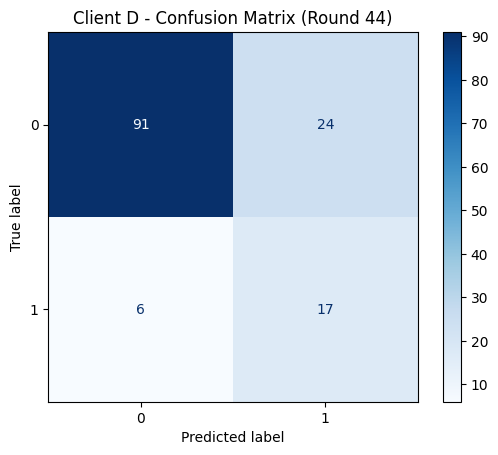


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9381    0.7913    0.8585       115
           1     0.4146    0.7391    0.5312        23

    accuracy                         0.7826       138
   macro avg     0.6764    0.7652    0.6949       138
weighted avg     0.8509    0.7826    0.8040       138


=== Round 45 ===
[Round 45] Global Accuracy: 0.7859 → 0.7873 | MLP Accuracy: 0.7873 | ∆W=0.2145

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

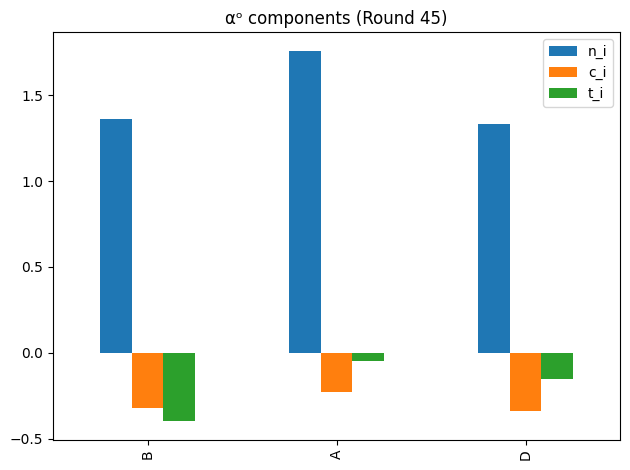

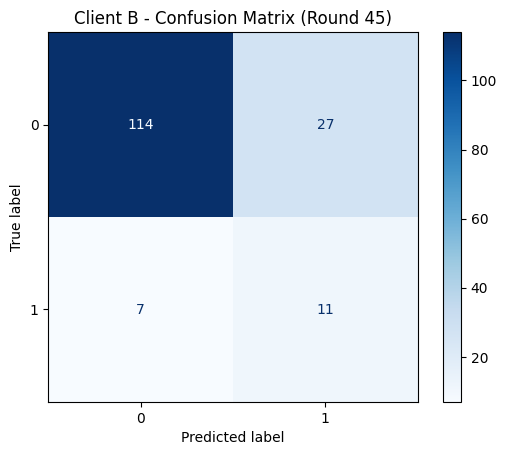


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9421    0.8085    0.8702       141
           1     0.2895    0.6111    0.3929        18

    accuracy                         0.7862       159
   macro avg     0.6158    0.7098    0.6315       159
weighted avg     0.8683    0.7862    0.8162       159



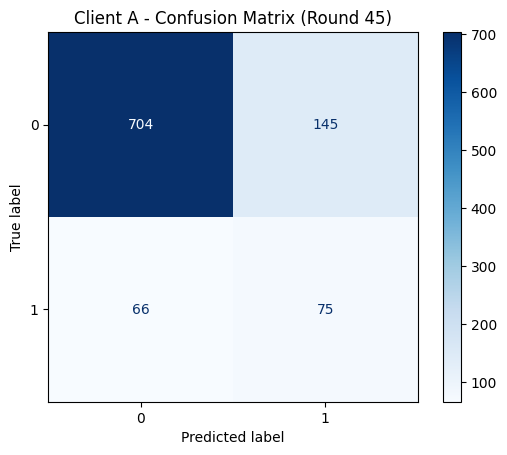


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9143    0.8292    0.8697       849
           1     0.3409    0.5319    0.4155       141

    accuracy                         0.7869       990
   macro avg     0.6276    0.6806    0.6426       990
weighted avg     0.8326    0.7869    0.8050       990



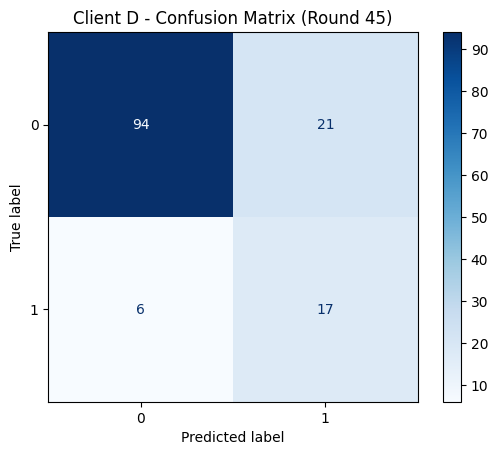


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9400    0.8174    0.8744       115
           1     0.4474    0.7391    0.5574        23

    accuracy                         0.8043       138
   macro avg     0.6937    0.7783    0.7159       138
weighted avg     0.8579    0.8043    0.8216       138


=== Round 46 ===
[Round 46] Global Accuracy: 0.7873 → 0.7775 | MLP Accuracy: 0.7775 | ∆W=0.1906

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

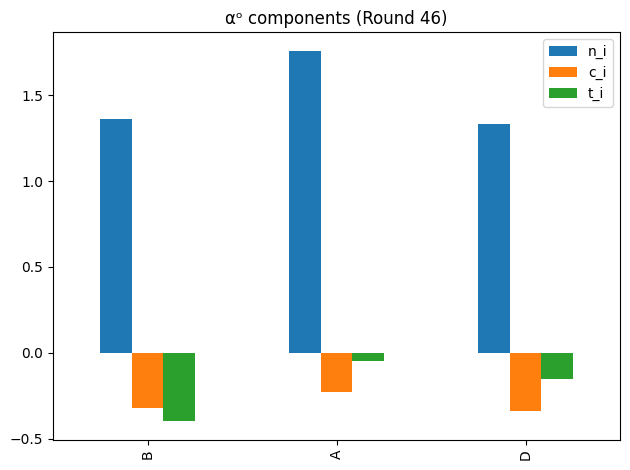

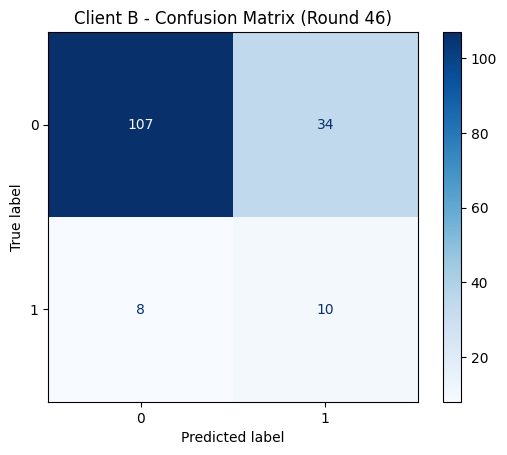


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9304    0.7589    0.8359       141
           1     0.2273    0.5556    0.3226        18

    accuracy                         0.7358       159
   macro avg     0.5789    0.6572    0.5793       159
weighted avg     0.8508    0.7358    0.7778       159



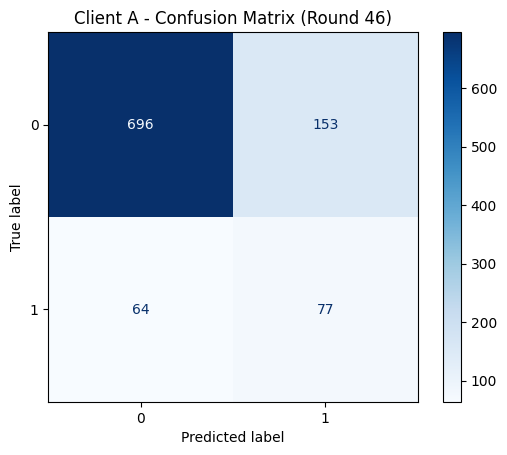


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9158    0.8198    0.8651       849
           1     0.3348    0.5461    0.4151       141

    accuracy                         0.7808       990
   macro avg     0.6253    0.6829    0.6401       990
weighted avg     0.8330    0.7808    0.8010       990



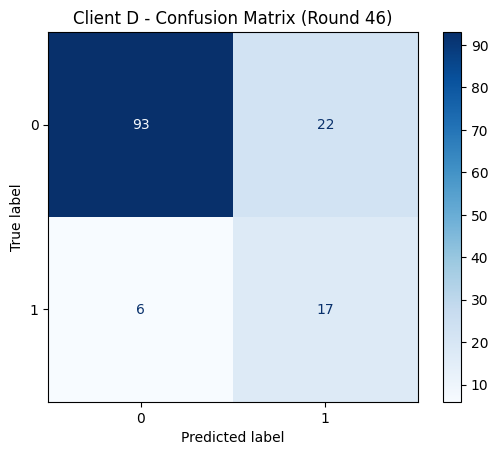


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9394    0.8087    0.8692       115
           1     0.4359    0.7391    0.5484        23

    accuracy                         0.7971       138
   macro avg     0.6876    0.7739    0.7088       138
weighted avg     0.8555    0.7971    0.8157       138


=== Round 47 ===
[Round 47] Global Accuracy: 0.7775 → 0.7842 | MLP Accuracy: 0.7842 | ∆W=0.1937

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

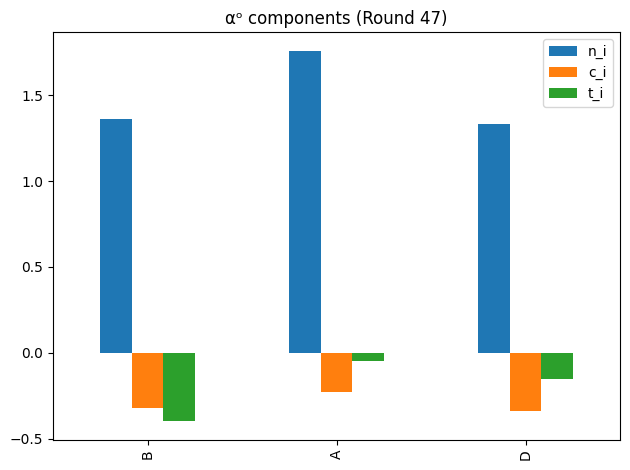

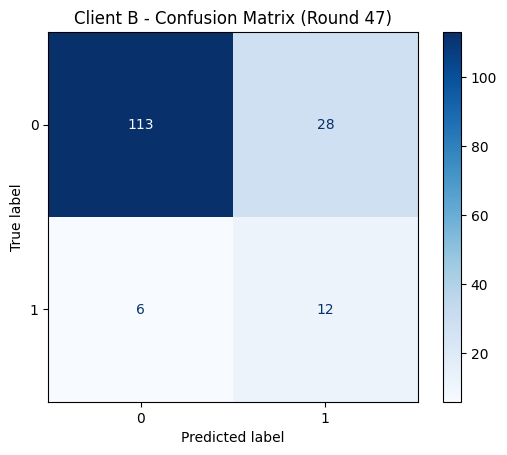


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9496    0.8014    0.8692       141
           1     0.3000    0.6667    0.4138        18

    accuracy                         0.7862       159
   macro avg     0.6248    0.7340    0.6415       159
weighted avg     0.8760    0.7862    0.8177       159



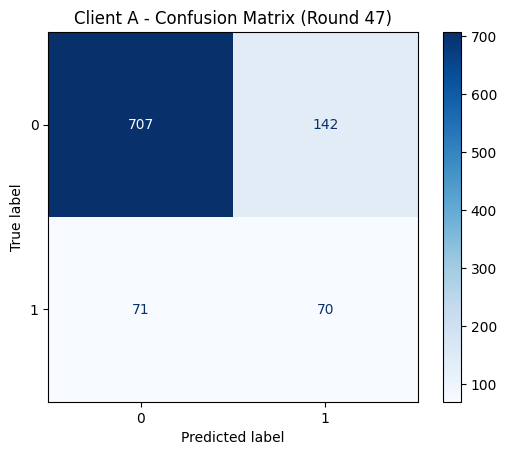


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9087    0.8327    0.8691       849
           1     0.3302    0.4965    0.3966       141

    accuracy                         0.7848       990
   macro avg     0.6195    0.6646    0.6328       990
weighted avg     0.8263    0.7848    0.8018       990



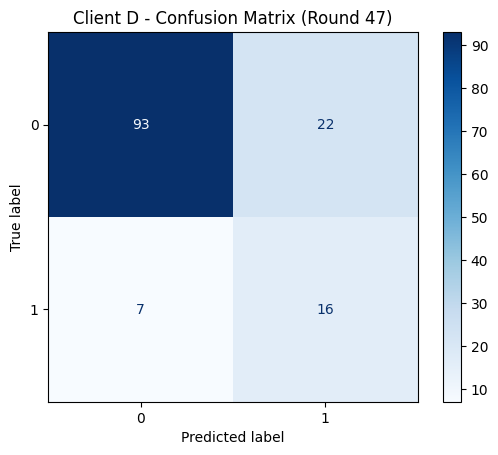


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9300    0.8087    0.8651       115
           1     0.4211    0.6957    0.5246        23

    accuracy                         0.7899       138
   macro avg     0.6755    0.7522    0.6949       138
weighted avg     0.8452    0.7899    0.8084       138


=== Round 48 ===
[Round 48] Global Accuracy: 0.7842 → 0.7837 | MLP Accuracy: 0.7837 | ∆W=0.2030

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

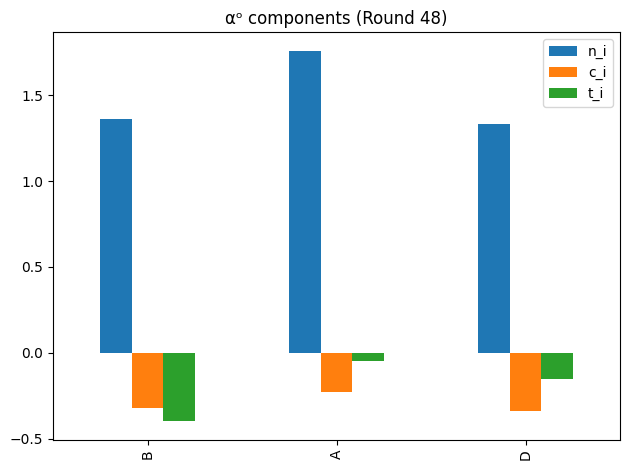

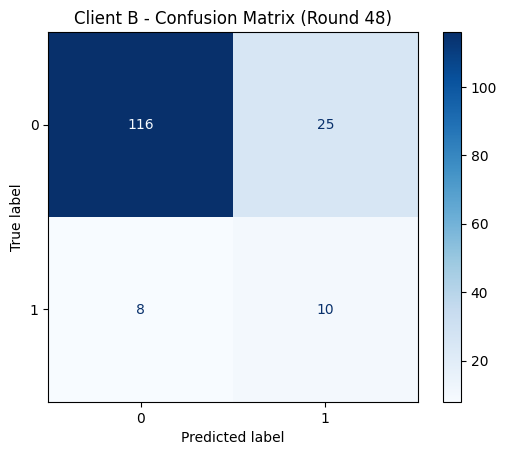


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9355    0.8227    0.8755       141
           1     0.2857    0.5556    0.3774        18

    accuracy                         0.7925       159
   macro avg     0.6106    0.6891    0.6264       159
weighted avg     0.8619    0.7925    0.8191       159



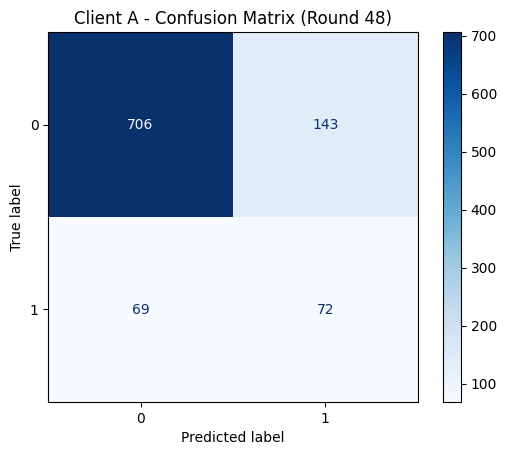


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9110    0.8316    0.8695       849
           1     0.3349    0.5106    0.4045       141

    accuracy                         0.7859       990
   macro avg     0.6229    0.6711    0.6370       990
weighted avg     0.8289    0.7859    0.8032       990



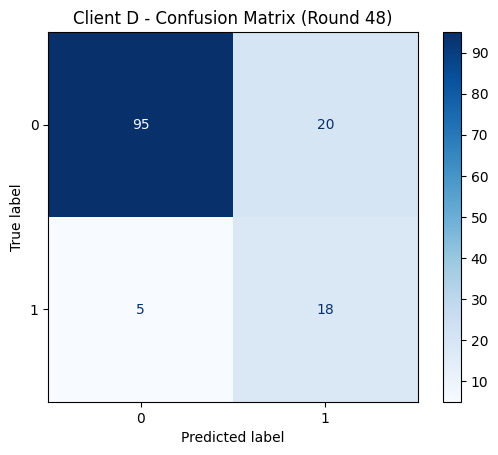


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9500    0.8261    0.8837       115
           1     0.4737    0.7826    0.5902        23

    accuracy                         0.8188       138
   macro avg     0.7118    0.8043    0.7369       138
weighted avg     0.8706    0.8188    0.8348       138


=== Round 49 ===
[Round 49] Global Accuracy: 0.7837 → 0.7873 | MLP Accuracy: 0.7873 | ∆W=0.2407

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

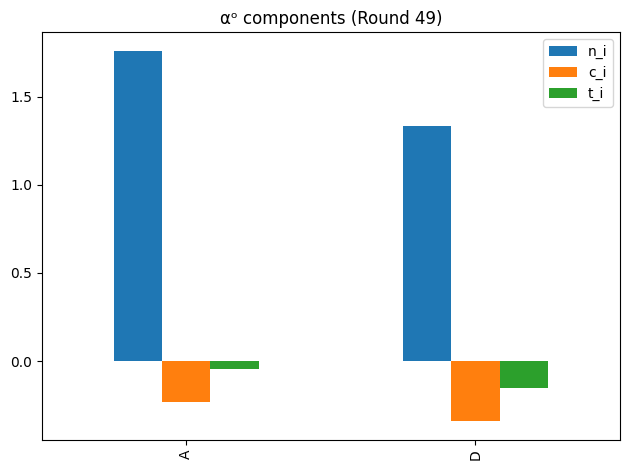

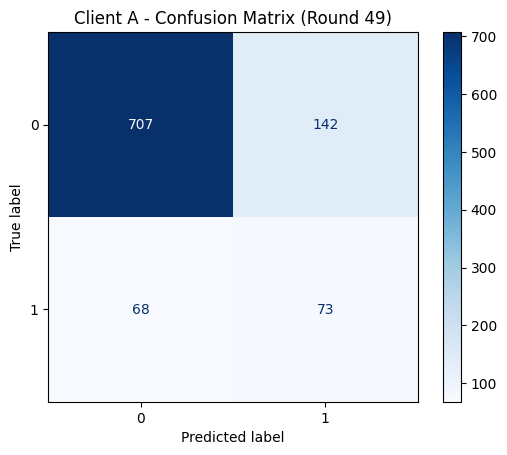


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9123    0.8327    0.8707       849
           1     0.3395    0.5177    0.4101       141

    accuracy                         0.7879       990
   macro avg     0.6259    0.6752    0.6404       990
weighted avg     0.8307    0.7879    0.8051       990



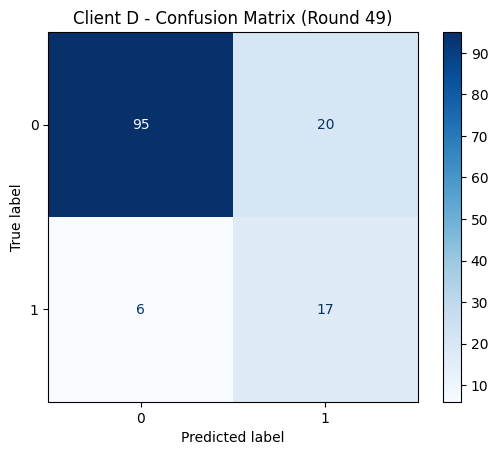


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9406    0.8261    0.8796       115
           1     0.4595    0.7391    0.5667        23

    accuracy                         0.8116       138
   macro avg     0.7000    0.7826    0.7231       138
weighted avg     0.8604    0.8116    0.8275       138


=== Round 50 ===
[Round 50] Global Accuracy: 0.7873 → 0.7797 | MLP Accuracy: 0.7797 | ∆W=0.2044

αᵒ 구성요소 (log scale):
       n_i     c_i  t_i
B  23.0217  0.4766  0.4
A  57.4456  0.5894  0.9
D  21.4476  0.4571  0.7


<Figure size 600x400 with 0 Axes>

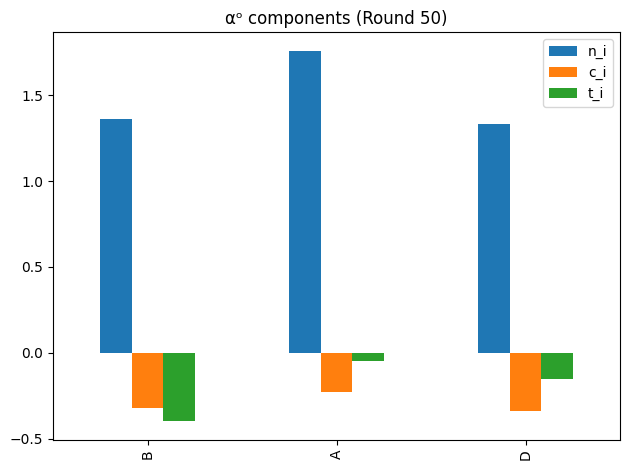

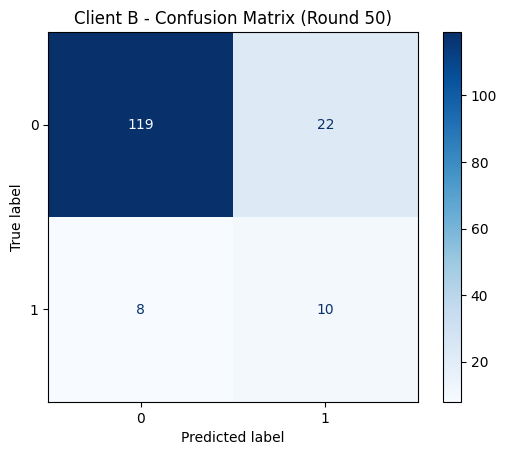


[Client B] Classification Report:
              precision    recall  f1-score   support

           0     0.9370    0.8440    0.8881       141
           1     0.3125    0.5556    0.4000        18

    accuracy                         0.8113       159
   macro avg     0.6248    0.6998    0.6440       159
weighted avg     0.8663    0.8113    0.8328       159



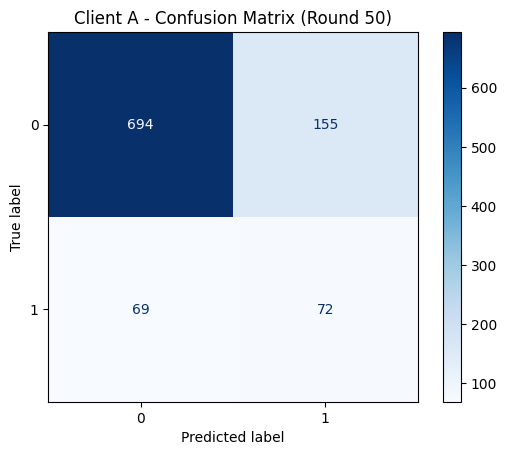


[Client A] Classification Report:
              precision    recall  f1-score   support

           0     0.9096    0.8174    0.8610       849
           1     0.3172    0.5106    0.3913       141

    accuracy                         0.7737       990
   macro avg     0.6134    0.6640    0.6262       990
weighted avg     0.8252    0.7737    0.7941       990



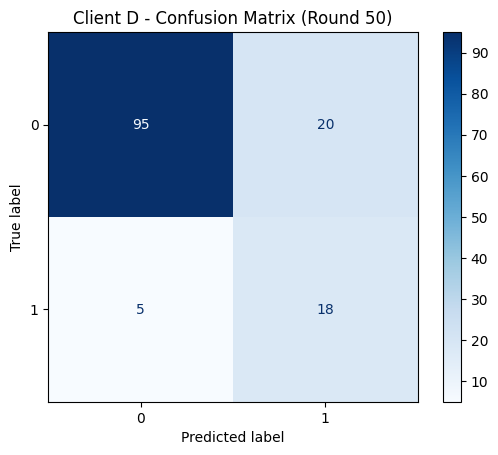


[Client D] Classification Report:
              precision    recall  f1-score   support

           0     0.9500    0.8261    0.8837       115
           1     0.4737    0.7826    0.5902        23

    accuracy                         0.8188       138
   macro avg     0.7118    0.8043    0.7369       138
weighted avg     0.8706    0.8188    0.8348       138



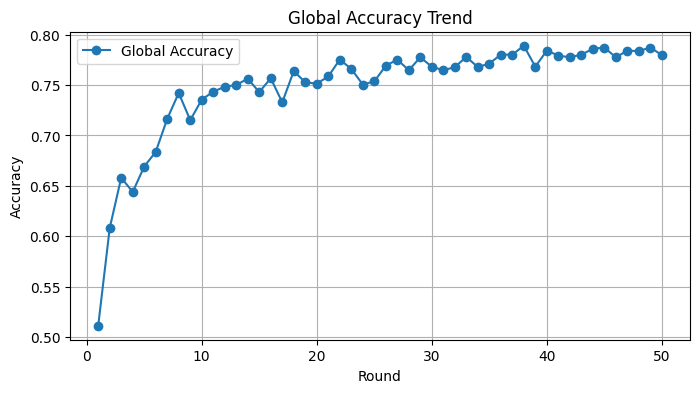

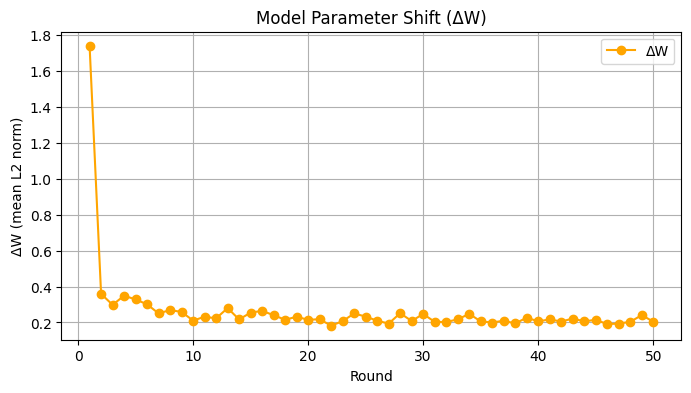


[최종 파라미터 통계 요약]
net.0.weight: mean=-0.005178, std=0.168911
net.0.bias: mean=0.008649, std=0.140650
net.1.weight: mean=0.930667, std=0.070649
net.1.bias: mean=-0.345134, std=0.111463
net.1.running_mean: mean=0.005851, std=0.141100
net.1.running_var: mean=0.124099, std=0.073270
net.1.num_batches_tracked: dtype=torch.int64 (skip)
net.4.weight: mean=-0.012921, std=0.101608
net.4.bias: mean=0.001622, std=0.052657
net.5.weight: mean=0.902156, std=0.045949
net.5.bias: mean=-0.441847, std=0.072335
net.5.running_mean: mean=-0.337530, std=0.394126
net.5.running_var: mean=0.625942, std=0.184956
net.5.num_batches_tracked: dtype=torch.int64 (skip)
net.8.weight: mean=-0.013376, std=0.102507
net.8.bias: mean=0.000958, std=0.051360
net.9.weight: mean=1.072396, std=0.073404
net.9.bias: mean=-0.340089, std=0.079273
net.9.running_mean: mean=-0.221189, std=0.242013
net.9.running_var: mean=0.348255, std=0.103261
net.9.num_batches_tracked: dtype=torch.int64 (skip)
net.12.weight: mean=0.008057, std=0.253913

In [ ]:
# -*- coding: utf-8 -*-
# 정확도 향상 및 안정성 개선 + 집계기 최적화 (2025.10 기준, train:test = 7:3)
# 변경: 클라이언트별 학습 데이터 오버샘플링(랜덤 복제)로 클래스 불균형 완화
# 추가: 각 라운드마다 MLP 정확도도 함께 출력

import os, math, copy, random, argparse
import pandas as pd
import numpy as np
import torch
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset, random_split, Subset
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

DEFECT_LABELS = ['Short_Shot_1','Bubble_1','Exfoliation_1','Blow_Hole_1','Deformation_1']

def load_excel_binary(path: str):
    df = pd.read_excel(path).dropna(axis=1, how='all')
    for col in DEFECT_LABELS:
        if col not in df.columns:
            df[col] = 0
    y = df[DEFECT_LABELS].sum(axis=1).clip(upper=1).astype(int).values
    X = df.drop(columns=DEFECT_LABELS, errors='ignore')
    X = X.select_dtypes(include=[np.number]).replace([np.inf, -np.inf], np.nan).fillna(0.0)
    return X, y

def build_clients(path_map):
    raw, clients, metas = {}, {}, {}
    for cid, path in path_map.items():
        X, y = load_excel_binary(path)
        raw[cid] = {"X": X, "y": y}
    cols = set.intersection(*[set(v["X"].columns) for v in raw.values()])
    for cid, v in raw.items():
        feat = v["X"][list(cols)].copy()
        mu, sigma = feat.mean(), feat.std().replace(0, 1)
        feat = (feat - mu) / sigma
        X = torch.tensor(feat.values.astype(np.float32))
        y = torch.tensor(v["y"], dtype=torch.long)
        allset = TensorDataset(X, y)
        n = len(allset)
        n_train = int(0.7 * n)
        n_test = n - n_train
        tr, te = random_split(allset, [n_train, n_test], generator=torch.Generator().manual_seed(42))
        clients[cid] = {"train": tr, "test": te, "all": allset}
        metas[cid] = {"n_samples": len(y), "class_counts": pd.Series(v["y"]).value_counts().to_dict()}
    return clients, metas, list(cols)

class DeepMLP(nn.Module):
    def __init__(self, input_dim, num_classes=2):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 128), nn.BatchNorm1d(128), nn.ReLU(), nn.Dropout(0.2),
            nn.Linear(128, 128), nn.BatchNorm1d(128), nn.ReLU(), nn.Dropout(0.2),
            nn.Linear(128, 64), nn.BatchNorm1d(64), nn.ReLU(), nn.Dropout(0.2),
            nn.Linear(64, num_classes)
        )
    def forward(self, x):
        return self.net(x)

def compute_ci(class_counts, eps_frac=0.05, min_samples=1):
    K, total = len(class_counts), sum(class_counts.values())
    if K == 0 or total == 0:
        return 1e-8
    H = -sum((c / total) * math.log(c / total) for c in class_counts.values() if c > 0)
    logK = math.log(K + 1e-12)
    H_floor = eps_frac * logK
    H_tilde = max(H, H_floor)
    k_i = sum(1 for c in class_counts.values() if c >= min_samples)
    return max(1e-8, (k_i / K) * (H_tilde / logK))

def aggregate_with_softmax_weights(state_dicts, alpha_components, rho=1.0, beta=0.7, theta=0.5, temperature=2.0):
    if not state_dicts:
        return None
    logits = {}
    for cid, comp in alpha_components.items():
        log_weight = (
            math.log(comp["n_i"] ** rho + 1e-12)
            + math.log(comp["c_i"] ** beta + 1e-12)
            + math.log(comp["t_i"] ** theta + 1e-12)
        )
        logits[cid] = log_weight
    max_logit = max(logits.values())
    exp_logits = {cid: math.exp((logits[cid] - max_logit) / temperature) for cid in logits}
    total_exp = sum(exp_logits.values())
    alphas = {cid: exp_logits[cid] / total_exp for cid in logits}

    global_sd = None
    for cid, sd in state_dicts.items():
        w = alphas[cid]
        if global_sd is None:
            global_sd = {k: v.clone() * w for k, v in sd.items() if v.dtype in (torch.float32, torch.float64)}
        else:
            for k in global_sd:
                global_sd[k] += sd[k] * w
    return global_sd

def _extract_xy_from_dataset(ds):
    if isinstance(ds, TensorDataset):
        return ds.tensors[0].clone(), ds.tensors[1].clone()
    elif isinstance(ds, Subset):
        base = ds.dataset
        X_all, y_all = base.tensors
        idx = torch.tensor(ds.indices, dtype=torch.long)
        return X_all[idx].clone(), y_all[idx].clone()
    else:
        xs, ys = [], []
        for x, t in DataLoader(ds, batch_size=1024, shuffle=False):
            xs.append(x)
            ys.append(t)
        return torch.cat(xs, dim=0), torch.cat(ys, dim=0)

def make_oversampled_tensor_dataset(ds, seed=42):
    g = np.random.RandomState(seed)
    X, y = _extract_xy_from_dataset(ds)
    y_np = y.cpu().numpy()
    idx0 = np.where(y_np == 0)[0]
    idx1 = np.where(y_np == 1)[0]
    if len(idx0) == 0 or len(idx1) == 0:
        return None
    target = max(len(idx0), len(idx1))
    idx0_os = np.concatenate([idx0, g.choice(idx0, size=target - len(idx0), replace=True)]) if len(idx0) < target else idx0
    idx1_os = np.concatenate([idx1, g.choice(idx1, size=target - len(idx1), replace=True)]) if len(idx1) < target else idx1
    new_idx = np.concatenate([idx0_os, idx1_os])
    g.shuffle(new_idx)
    return TensorDataset(X[new_idx], y[new_idx])

def local_train(model, dataset, lr, epochs, device, class_counts, oversample=True, seed=42):
    model = copy.deepcopy(model).to(device)
    model.train()
    ds_train = make_oversampled_tensor_dataset(dataset, seed=seed) if oversample else dataset
    use_balanced_loss = ds_train is not None if oversample else False
    if ds_train is None:
        ds_train = dataset
    if use_balanced_loss:
        weight = torch.tensor([1.0, 1.0], dtype=torch.float32).to(device)
    else:
        total = sum(class_counts.values())
        w_0 = total / (2 * class_counts.get(0, 1))
        w_1 = total / (2 * class_counts.get(1, 1))
        weight = torch.tensor([w_0, w_1], dtype=torch.float32).to(device)
    crit = nn.CrossEntropyLoss(weight=weight)
    opt = optim.Adam(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.StepLR(opt, step_size=3, gamma=0.7)
    loader = DataLoader(ds_train, batch_size=64, shuffle=True)
    for _ in range(epochs):
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            opt.zero_grad()
            loss = crit(model(x), y)
            loss.backward()
            opt.step()
        scheduler.step()
    return model.state_dict(), use_balanced_loss, (len(ds_train) if isinstance(ds_train, TensorDataset) else None)

def evaluate(model, dataset, device, return_preds=False):
    model.eval()
    loader = DataLoader(dataset, batch_size=256)
    correct, total = 0, 0
    y_true, y_pred = [], []
    with torch.no_grad():
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            pred = model(x).argmax(1)
            correct += pred.eq(y).sum().item()
            total += len(y)
            if return_preds:
                y_true += y.cpu().tolist()
                y_pred += pred.cpu().tolist()
    acc = correct / total if total > 0 else 0.0
    return (acc, y_true, y_pred) if return_preds else acc

if __name__ == "__main__":
    parser = argparse.ArgumentParser()
    parser.add_argument("--rounds", type=int, default=50)
    parser.add_argument("--oversample", type=str, default="true")
    args, _ = parser.parse_known_args()
    use_oversample = args.oversample.lower() in ["1", "true", "yes"]

    paths = {"A": "A.xlsx", "B": "B.xlsx", "C": "C.xlsx", "D": "D.xlsx"}
    clients, metas, cols = build_clients(paths)
    device = "cuda" if torch.cuda.is_available() else "cpu"
    input_dim = clients["A"]["all"].tensors[0].shape[1]
    global_model = DeepMLP(input_dim=input_dim).to(device)
    last_round = {cid: None for cid in clients}
    combined_test = torch.utils.data.ConcatDataset([v["test"] for v in clients.values()])
    prev_global = copy.deepcopy(global_model.state_dict())
    round_log = {"round": [], "acc": [], "dW": []}
    fixed_probs = {"A": 0.9, "B": 0.4, "C": 0.4, "D": 0.7}

    for rnd in range(1, args.rounds + 1):
        print(f"\n=== Round {rnd} ===")
        probs = fixed_probs.copy()
        total_p = sum(probs.values())
        probs = {k: v / total_p for k, v in probs.items()}
        sorted_probs = sorted(probs.items(), key=lambda x: x[1], reverse=True)
        top_k = [cid for cid, _ in sorted_probs[:2]]
        additional = random.sample(list(clients.keys()), k=min(2, len(clients) - len(top_k)))
        selected = list(set(top_k + additional))

        state_dicts, alpha_components = {}, {}
        before_acc = evaluate(global_model, combined_test, device)

        for cid in selected:
            ds = clients[cid]["train"]
            labels = [int(y) for _, y in ds]
            class_counts = pd.Series(labels).value_counts().to_dict()
            state_dict, used_balanced_loss, os_size = local_train(global_model, ds, lr=0.001, epochs=10, device=device, class_counts=class_counts, oversample=use_oversample)
            state_dicts[cid] = state_dict
            n_i = max(1.0, math.sqrt(metas[cid]["n_samples"]))
            c_i = max(1e-3, compute_ci(class_counts))
            t_i = max(1e-3, fixed_probs[cid])
            alpha_components[cid] = {"n_i": n_i, "c_i": c_i, "t_i": t_i}
            last_round[cid] = rnd

        new_global = aggregate_with_softmax_weights(state_dicts, alpha_components)
        if new_global is None:
            continue
        global_model.load_state_dict(new_global)

        after_acc, y_true, y_pred = evaluate(global_model, combined_test, device, return_preds=True)
        mlp_acc = evaluate(global_model, combined_test, device)  # ✅ 추가된 부분

        dW = np.mean([
            torch.norm(global_model.state_dict()[k] - prev_global[k]).item()
            for k in global_model.state_dict()
            if global_model.state_dict()[k].dtype in (torch.float32, torch.float64)
        ])
        prev_global = copy.deepcopy(global_model.state_dict())

        print(f"[Round {rnd}] Global Accuracy: {before_acc:.4f} → {after_acc:.4f} | MLP Accuracy: {mlp_acc:.4f} | ∆W={dW:.4f}")
        round_log["round"].append(rnd)
        round_log["acc"].append(after_acc)
        round_log["dW"].append(dW)

        df = pd.DataFrame(alpha_components).T.round(4)
        print("\nαᵒ 구성요소 (log scale):")
        print(df)
        plt.figure(figsize=(6, 4))
        np.log10(df + 1e-8).plot(kind="bar")
        plt.title(f"αᵒ components (Round {rnd})")
        plt.tight_layout()
        plt.show()

        for cid in selected:
            _, yt, yp = evaluate(global_model, clients[cid]["test"], device, return_preds=True)
            cm = confusion_matrix(yt, yp)
            ConfusionMatrixDisplay(confusion_matrix=cm).plot(cmap="Blues")
            plt.title(f"Client {cid} - Confusion Matrix (Round {rnd})")
            plt.show()
            print(f"\n[Client {cid}] Classification Report:")
            print(classification_report(yt, yp, digits=4))

    plt.figure(figsize=(8, 4))
    plt.plot(round_log["round"], round_log["acc"], marker="o", label="Global Accuracy")
    plt.xlabel("Round")
    plt.ylabel("Accuracy")
    plt.title("Global Accuracy Trend")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 4))
    plt.plot(round_log["round"], round_log["dW"], marker="o", color="orange", label="ΔW")
    plt.xlabel("Round")
    plt.ylabel("ΔW (mean L2 norm)")
    plt.title("Model Parameter Shift (ΔW)")
    plt.legend()
    plt.grid(True)
    plt.show()

    print("\n[최종 파라미터 통계 요약]")
    for name, param in global_model.state_dict().items():
        if param.dtype in (torch.float32, torch.float64):
            print(f"{name}: mean={param.mean():.6f}, std={param.std():.6f}")
        else:
            print(f"{name}: dtype={param.dtype} (skip)")

    torch.save(global_model.state_dict(), "global_model.pt")


#실험3에 대한 로컬 학습 시도


🔁 [Client A] 로컬 파인튜닝 시작
✅ [Client A] Local Accuracy = 0.7000
              precision    recall  f1-score   support

           0     0.9367    0.6973    0.7995       849
           1     0.2821    0.7163    0.4048       141

    accuracy                         0.7000       990
   macro avg     0.6094    0.7068    0.6021       990
weighted avg     0.8435    0.7000    0.7433       990



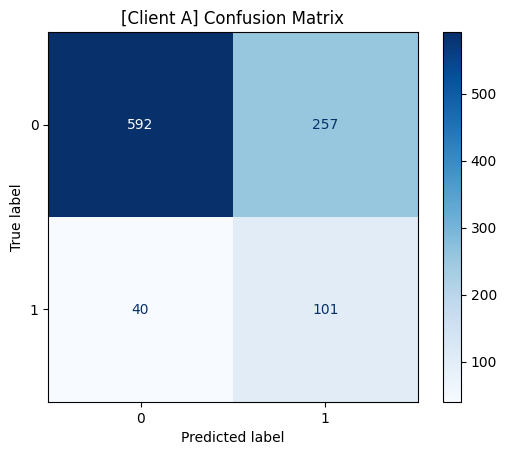


🔁 [Client B] 로컬 파인튜닝 시작
✅ [Client B] Local Accuracy = 0.6478
              precision    recall  f1-score   support

           0     0.9570    0.6312    0.7607       141
           1     0.2121    0.7778    0.3333        18

    accuracy                         0.6478       159
   macro avg     0.5846    0.7045    0.5470       159
weighted avg     0.8727    0.6478    0.7123       159



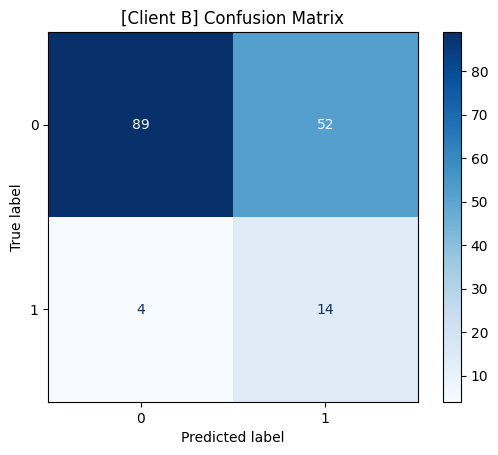


🔁 [Client C] 로컬 파인튜닝 시작
✅ [Client C] Local Accuracy = 0.4959
              precision    recall  f1-score   support

           0     0.9851    0.4507    0.6185       883
           1     0.1491    0.9341    0.2572        91

    accuracy                         0.4959       974
   macro avg     0.5671    0.6924    0.4378       974
weighted avg     0.9070    0.4959    0.5847       974



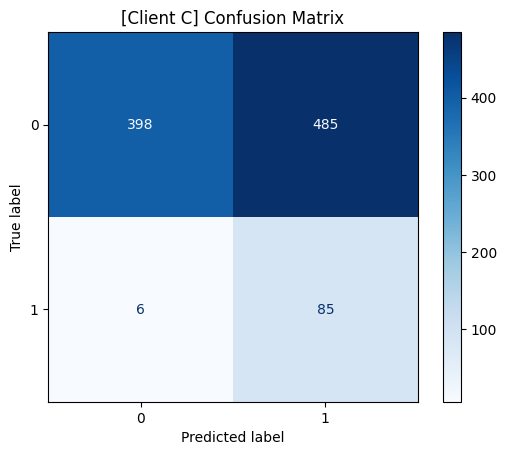


🔁 [Client D] 로컬 파인튜닝 시작
✅ [Client D] Local Accuracy = 0.7464
              precision    recall  f1-score   support

           0     0.9167    0.7652    0.8341       115
           1     0.3571    0.6522    0.4615        23

    accuracy                         0.7464       138
   macro avg     0.6369    0.7087    0.6478       138
weighted avg     0.8234    0.7464    0.7720       138



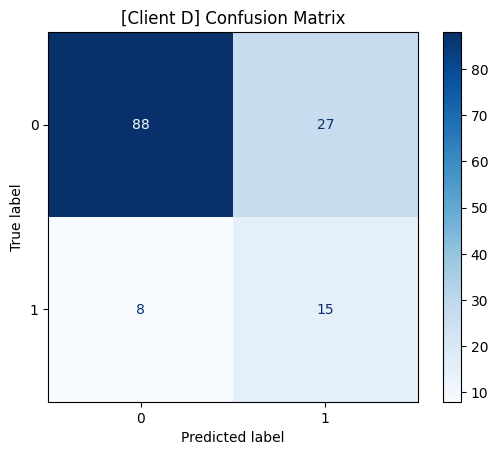

In [ ]:
# -*- coding: utf-8 -*-
# 저장된 글로벌 모델을 각 클라이언트에서 로컬 파인튜닝 후 성능 평가

import os, copy
import numpy as np
import pandas as pd
import torch
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

from federated_model import DeepMLP, build_clients, local_train, evaluate, make_oversampled_tensor_dataset

# ----------------------------------------
# 설정: 데이터 경로 및 장치
# ----------------------------------------
paths = {"A": "A.xlsx", "B": "B.xlsx", "C": "C.xlsx", "D": "D.xlsx"}
clients, metas, cols = build_clients(paths)
device = "cuda" if torch.cuda.is_available() else "cpu"
input_dim = clients["A"]["all"].tensors[0].shape[1]

# ----------------------------------------
# 글로벌 모델 로드 (이전에 저장된 모델 불러오기)
# ----------------------------------------
global_model_path = "global_model.pt"
global_model = DeepMLP(input_dim=input_dim).to(device)
global_model.load_state_dict(torch.load(global_model_path, map_location=device))

# ----------------------------------------
# 각 클라이언트별 로컬 파인튜닝
# ----------------------------------------
for cid in clients:
    print(f"\n🔁 [Client {cid}] 로컬 파인튜닝 시작")
    base_model = copy.deepcopy(global_model)
    train_data = clients[cid]["train"]
    test_data = clients[cid]["test"]

    # 클래스 비율 계산
    labels = [int(y) for _, y in train_data]
    class_counts = pd.Series(labels).value_counts().to_dict()

    # 오버샘플링 적용
    train_data_os = make_oversampled_tensor_dataset(train_data)
    if train_data_os is None:
        print(f"⚠️  Client {cid}: 오버샘플링 불가 (한 클래스 없음). 원본으로 학습 진행.")
        train_data_use = train_data
        oversample_flag = False
    else:
        train_data_use = train_data_os
        oversample_flag = True

    # 파인튜닝 (epoch 수는 필요에 따라 조정)
    state_dict, _, _ = local_train(
        base_model,
        dataset=train_data_use,
        lr=0.0005,
        epochs=5,
        device=device,
        class_counts=class_counts,
        oversample=False  # 이미 oversampled 된 데이터 사용하므로 False
    )

    base_model.load_state_dict(state_dict)

    # 평가
    acc, y_true, y_pred = evaluate(base_model, test_data, device, return_preds=True)
    cm = confusion_matrix(y_true, y_pred)
    print(f"✅ [Client {cid}] Local Accuracy = {acc:.4f}")
    print(classification_report(y_true, y_pred, digits=4))

    ConfusionMatrixDisplay(confusion_matrix=cm).plot(cmap="Blues")
    plt.title(f"[Client {cid}] Confusion Matrix")
    plt.show()